In [1]:
import os

# Set the environment variable
os.environ['DATA_DIRECTORY'] = '/Users/liamk/research-project-erc20-governance/data'

# Now you can access it
path = os.environ['DATA_DIRECTORY']
print(f"The data directory is set to: {path}")

The data directory is set to: /Users/liamk/research-project-erc20-governance/data


In [2]:
import pandas as pd
import os
from dotenv import load_dotenv

# Load environment variables from .env file
load_dotenv()  

# Set the base data directory path from environment variable
data_directory = os.environ.get('DATA_DIRECTORY')

# Verify if the DATA_DIRECTORY environment variable is set
if not data_directory:
    raise EnvironmentError("DATA_DIRECTORY environment variable is not set.")

# Define file paths
snapshot_file_path = os.path.join(data_directory, 'snapshot_selection.csv')
token_file_path = os.path.join(data_directory, 'final_token_selection.csv')

# Check if the files exist
if not os.path.exists(snapshot_file_path):
    print(f"File does not exist: {snapshot_file_path}")
else:
    print(f"File exists: {snapshot_file_path}")

if not os.path.exists(token_file_path):
    print(f"File does not exist: {token_file_path}")
else:
    print(f"File exists: {token_file_path}")

# Read the snapshot selection CSV file
try:
    df_snapshots = pd.read_csv(snapshot_file_path)
    df_snapshots['Date'] = pd.to_datetime(df_snapshots['Date'])  # Ensure dates are in datetime format
    print("Snapshot selection file loaded successfully. Here are the first few rows:")
    print(df_snapshots.head())
except Exception as e:
    print(f"Error reading snapshot selection file: {e}")

# Read the final token selection CSV file
try:
    df_tokens = pd.read_csv(token_file_path)
    print("Final token selection file loaded successfully. Here are the first few rows:")
    print(df_tokens.head())
except Exception as e:
    print(f"Error reading final token selection file: {e}")

# Convert DataFrame to a dictionary where keys are addresses and values are symbols
try:
    address_to_symbol = pd.Series(df_tokens['symbol'].values, index=df_tokens['address']).to_dict()
    print("Address to symbol dictionary created successfully.")
    print(list(address_to_symbol.items())[:5])  # Print the first 5 items
except Exception as e:
    print(f"Error creating address to symbol dictionary: {e}")

# Known burner addresses
known_burner_addresses = [
    '0x0000000000000000000000000000000000000000',
    '0x0000000000000000000000000000000000000001',
    '0x0000000000000000000000000000000000000002',
    '0x0000000000000000000000000000000000000003',
    '0x0000000000000000000000000000000000000004',
    '0x0000000000000000000000000000000000000005',
    '0x0000000000000000000000000000000000000006',
    '0x0000000000000000000000000000000000000007',
    '0x000000000000000000000000000000000000dead'
]

print("Known burner addresses list:")
print(known_burner_addresses)

/Users/liamk/anaconda3/lib/python3.11/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


File exists: /Users/liamk/research-project-erc20-governance/data/snapshot_selection.csv
File exists: /Users/liamk/research-project-erc20-governance/data/final_token_selection.csv
Snapshot selection file loaded successfully. Here are the first few rows:
   Nr.  Block Height       Date
0    1       7962629 2019-06-15
1    2       8155117 2019-07-15
2    3       8354625 2019-08-15
3    4       8553607 2019-09-15
4    5       8745378 2019-10-15
Final token selection file loaded successfully. Here are the first few rows:
      coingecko_id     name    VL    MC  \
0          uniswap  Uniswap  True  True   
1             aave     Aave  True  True   
2         lido-dao     Lido  True  True   
3            maker    Maker  True  True   
4  curve-dao-token    Curve  True  True   

                                      address symbol  
0  0x1f9840a85d5af5bf1d1762f925bdaddc4201f984    UNI  
1  0x7fc66500c84a76ad7e9c93437bfc5ac33e2ddae9   AAVE  
2  0x5a98fcbea516cf06857215779fd812ca3bef1b32    LDO  

In [3]:
import sys

current_dir = os.getcwd()
sys.path.append(os.path.abspath(os.path.join(current_dir, '..')))

from src.analysis.clique_analysis import * 
from src.visualisations.wallet_network_projections_visualisations import * 

In [4]:
import networkx as nx
from dotenv import load_dotenv

# Load environment variables from .env file (if needed for other variables)
load_dotenv()

# Set the input directory directly to the local folder where the graphs are stored
input_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'

# Check if the input directory exists
if not os.path.exists(input_directory):
    raise FileNotFoundError(f"Input directory does not exist: {input_directory}")

print(f"Input directory is set to: {input_directory}")

# Function to load graphs from snapshots
def load_wallet_graphs_from_snapshots(df_snapshots, input_directory):
    graphs = {}
    dates = {}
    
    for index, row in df_snapshots.iterrows():
        snapshot = row['Block Height']
        date = row['Date'].strftime('%Y-%m-%d')  # Format date as string
        dates[snapshot] = date
        file_path = os.path.join(input_directory, f"validated_wallet_projection_graph_{snapshot}.graphml")
        
        print(f"Checking file: {file_path}")  # Debug print

        if os.path.exists(file_path):
            graph = nx.read_graphml(file_path)
            graphs[snapshot] = graph
            print(f"Loaded graph for snapshot {snapshot}")
        else:
            print(f"Graph file for snapshot {snapshot} does not exist at {file_path}")
    
    return graphs, dates

# Assuming df_snapshots is already loaded
data_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data'
df_snapshots = pd.read_csv(os.path.join(data_directory, 'snapshot_selection.csv'))
df_snapshots['Date'] = pd.to_datetime(df_snapshots['Date'])  # Ensure dates are in datetime format

# Load the graphs
graphs, dates = load_wallet_graphs_from_snapshots(df_snapshots, input_directory)

# Print the loaded graphs for verification
print(f"Loaded {len(graphs)} graphs.")
for snapshot, graph in graphs.items():
    print(f"Snapshot: {snapshot}, Number of nodes: {len(graph.nodes)}, Number of edges: {len(graph.edges)}")

Input directory is set to: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_7962629.graphml
Graph file for snapshot 7962629 does not exist at /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_7962629.graphml
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_8155117.graphml
Graph file for snapshot 8155117 does not exist at /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_8155117.graphml
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_8354625.graphml
Graph file for snapshot 8354625 does not exist at /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_gra

Loaded graph for snapshot 14391029
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_14589816.graphml
Loaded graph for snapshot 14589816
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_14779829.graphml
Loaded graph for snapshot 14779829
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_14967365.graphml
Loaded graph for snapshot 14967365
Loaded 18 graphs.
Snapshot: 11659570, Number of nodes: 118, Number of edges: 883
Snapshot: 11861210, Number of nodes: 114, Number of edges: 817
Snapshot: 12043054, Number of nodes: 116, Number of edges: 864
Snapshot: 12244515, Number of nodes: 114, Number of edges: 831
Snapshot: 12438842, Number of nodes: 119, Number of edges: 852
Snapshot: 12638919, Number of nodes: 130, Number of edges: 890
Snapshot: 12831436, Number of nodes: 1

In [24]:
import os
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.patches as patches 
import pandas as pd
import numpy as np 
from src.utilities.metrics_and_tests import jaccard_similarity


def load_token_graphs_from_snapshots(df_snapshots, input_directory):
    """
    Load graphs from the given snapshots and store them in a dictionary.

    Parameters:
    df_snapshots (pd.DataFrame): DataFrame containing snapshot information with 'Block Height' and 'Date' columns.
    path (str): Base directory path where the graph files are located.

    Returns:
    dict: A dictionary containing loaded graphs with snapshot as the key.
    dict: A dictionary containing dates with snapshot as the key.
    """
    
    graphs = {}
    dates = {}
    
    for index, row in df_snapshots.iterrows():
        snapshot = row['Block Height']
        date = row['Date'].strftime('%Y-%m-%d')  # Format date as string
        dates[snapshot] = date
        file_path = os.path.join(input_directory, f"validated_token_projection_graph_{snapshot}.graphml")
        
        if os.path.exists(file_path):
            graph = nx.read_graphml(file_path)
            graphs[snapshot] = graph
        else:
            print(f"Graph file for snapshot {snapshot} does not exist.")
    
    return graphs, dates

def load_wallet_graphs_from_snapshots(df_snapshots, input_directory):
    """
    Load graphs from the given snapshots and store them in a dictionary.

    Parameters:
    df_snapshots (pd.DataFrame): DataFrame containing snapshot information with 'Block Height' and 'Date' columns.
    path (str): Base directory path where the graph files are located.

    Returns:
    dict: A dictionary containing loaded graphs with snapshot as the key.
    dict: A dictionary containing dates with snapshot as the key.
    """
    
    graphs = {}
    dates = {}
    
    for index, row in df_snapshots.iterrows():
        snapshot = row['Block Height']
        date = row['Date'].strftime('%Y-%m-%d')  # Format date as string
        dates[snapshot] = date
        file_path = os.path.join(input_directory, f"validated_wallet_projection_graph_{snapshot}.graphml")
        
        if os.path.exists(file_path):
            graph = nx.read_graphml(file_path)
            graphs[snapshot] = graph
        else:
            print(f"Graph file for snapshot {snapshot} does not exist.")
    
    return graphs, dates


def calculate_similarity_matrix(graphs):
    """
    Calculate the Jaccard Similarity matrix for a dictionary of graphs.

    Parameters:
    graphs (dict): A dictionary of graphs with snapshots as keys.

    Returns:
    np.ndarray: A 2D numpy array representing the similarity matrix.
    list: A sorted list of snapshot keys.
    """
    snapshot_list = sorted(graphs.keys())
    similarity_matrix = np.zeros((len(snapshot_list), len(snapshot_list)))

    for i, snapshot1 in enumerate(snapshot_list):
        for j, snapshot2 in enumerate(snapshot_list):
            if i <= j:
                similarity = jaccard_similarity(graphs[snapshot1], graphs[snapshot2])
                similarity_matrix[i, j] = similarity
                similarity_matrix[j, i] = similarity  # Symmetric matrix

    return similarity_matrix, snapshot_list


def visualize_wallet_network_grid(graphs, dates, address_to_symbol, output_directory, layout=nx.kamada_kawai_layout):
    # Define the grid size
    rows, cols = 3, 6  # Adjust based on the number of graphs
    fig, axes = plt.subplots(rows, cols, figsize=(20, 10))
    axes = axes.flatten()  # Flatten to iterate easily
    
    for ax, (snapshot, graph) in zip(axes, graphs.items()):
        # Relabel nodes with symbols using the mapping
        relabeled_graph = nx.relabel_nodes(graph, address_to_symbol)
        
        # Compute layout
        pos = layout(relabeled_graph)  
        
        # Draw the graph with relabeled nodes
        nx.draw(relabeled_graph, pos, ax=ax, with_labels=False, node_size=50, node_color='skyblue', edge_color='gray', font_size=8)
        ax.set_title(dates[snapshot], fontsize=10)
        ax.set_axis_off()  # Hide axis for clarity
        
        # Draw a rectangle around the plot area
        rect = patches.Rectangle((0, 0), 1, 1, linewidth=1, edgecolor='black', facecolor='none', transform=ax.transAxes, clip_on=False)
        ax.add_patch(rect)

    # Turn off any unused subplots
    for i in range(len(graphs), len(axes)):
        axes[i].set_axis_off()
    
    # Adjust layout to prevent overlap
    plt.tight_layout()
    plt.subplots_adjust(top=0.9)  # Adjust the top spacing to accommodate title if necessary
    
    # Save the figure
    fig.suptitle('Validated Wallet Projections Over Time', fontsize=16)
    plt.savefig(os.path.join(output_directory, "wallet_projection_grid.png"), format='png', dpi=300)
    plt.show()
    

def plot_similarity_heatmap(similarity_matrix, snapshot_list, dates, output_directory):
    """
    Plot a heatmap of the Jaccard Similarity matrix.

    Parameters:
    similarity_matrix (np.ndarray): A 2D numpy array representing the similarity matrix.
    snapshot_list (list): A sorted list of snapshot keys.
    dates (dict): A dictionary of dates with snapshots as keys.
    """
    fig, ax = plt.subplots(figsize=(12, 10))  # Adjusted size to better fit more labels
    cax = ax.matshow(similarity_matrix, interpolation='nearest', cmap='coolwarm')
    fig.colorbar(cax)

    # Set the ticks and labels with dates
    date_labels = [dates[snapshot] for snapshot in snapshot_list]
    ax.set_xticks(range(len(snapshot_list)))
    ax.set_xticklabels(date_labels, rotation=90)  # Rotate for better readability
    ax.set_yticks(range(len(snapshot_list)))
    ax.set_yticklabels(date_labels)

    ax.xaxis.set_ticks_position('bottom')  # X-axis labels on the bottom

    # Set title with padding
    ax.set_title('Jaccard Similarity Heatmap of Graph Snapshots', size=16, pad=20)

    ax.set_xlabel('Snapshot Date')
    ax.set_ylabel('Snapshot Date')
    
    plt.savefig(os.path.join(output_directory, "jaccard_similarity.png"), format='png', dpi=300)

    plt.show()

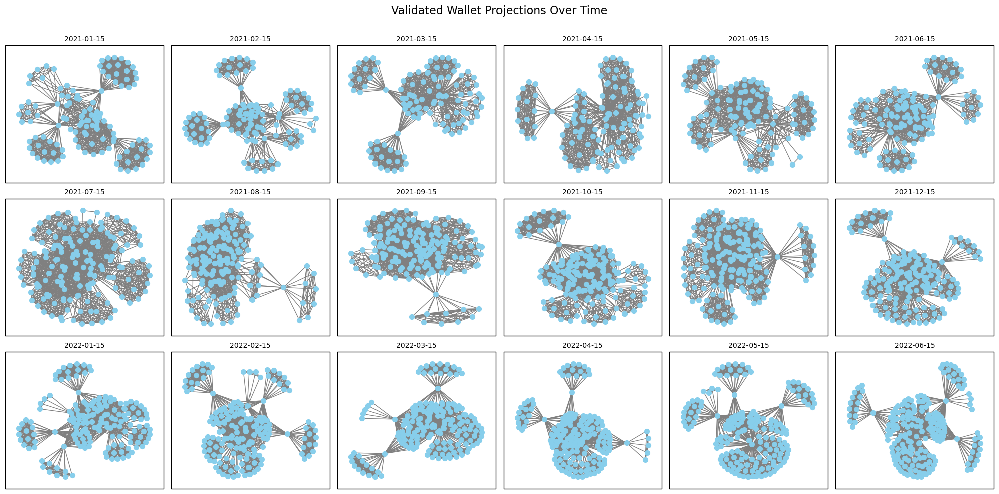

In [25]:
visualize_wallet_network_grid(graphs, dates, address_to_symbol, output_directory='../output/wallet_network_projections/', layout=nx.kamada_kawai_layout)


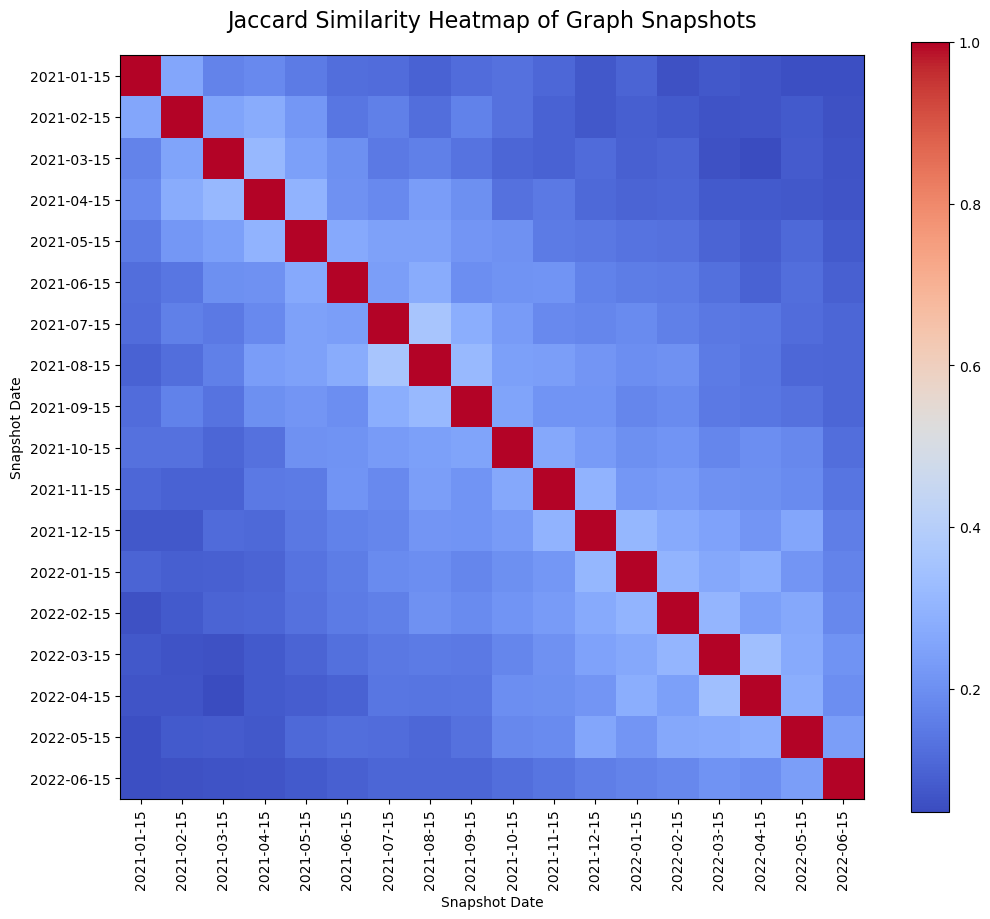

In [26]:
similarity_matrix, snapshot_list = calculate_similarity_matrix(graphs)

plot_similarity_heatmap(similarity_matrix, snapshot_list, dates, output_directory='../output/wallet_network_projections/')

          11659570  11861210  12043054  12244515  12438842  12638919  \
11659570  1.000000  0.261128  0.170127  0.188627  0.153590  0.125000   
11861210  0.261128  1.000000  0.254478  0.275542  0.219138  0.143336   
12043054  0.170127  0.254478  1.000000  0.312936  0.241679  0.200548   
12244515  0.188627  0.275542  0.312936  1.000000  0.297610  0.206872   
12438842  0.153590  0.219138  0.241679  0.297610  1.000000  0.269679   
12638919  0.125000  0.143336  0.200548  0.206872  0.269679  1.000000   
12831436  0.118465  0.164671  0.150780  0.186554  0.245283  0.240320   
13029639  0.096060  0.122857  0.165701  0.234560  0.246883  0.275344   
13230157  0.119395  0.169679  0.133002  0.201666  0.217780  0.197581   
13422506  0.129735  0.129481  0.103836  0.130921  0.204941  0.208633   
13620205  0.109780  0.098219  0.098655  0.147992  0.154818  0.213159   
13809597  0.076923  0.076762  0.114693  0.111944  0.147155  0.168582   
14009885  0.101285  0.089192  0.093766  0.100000  0.135557  0.15

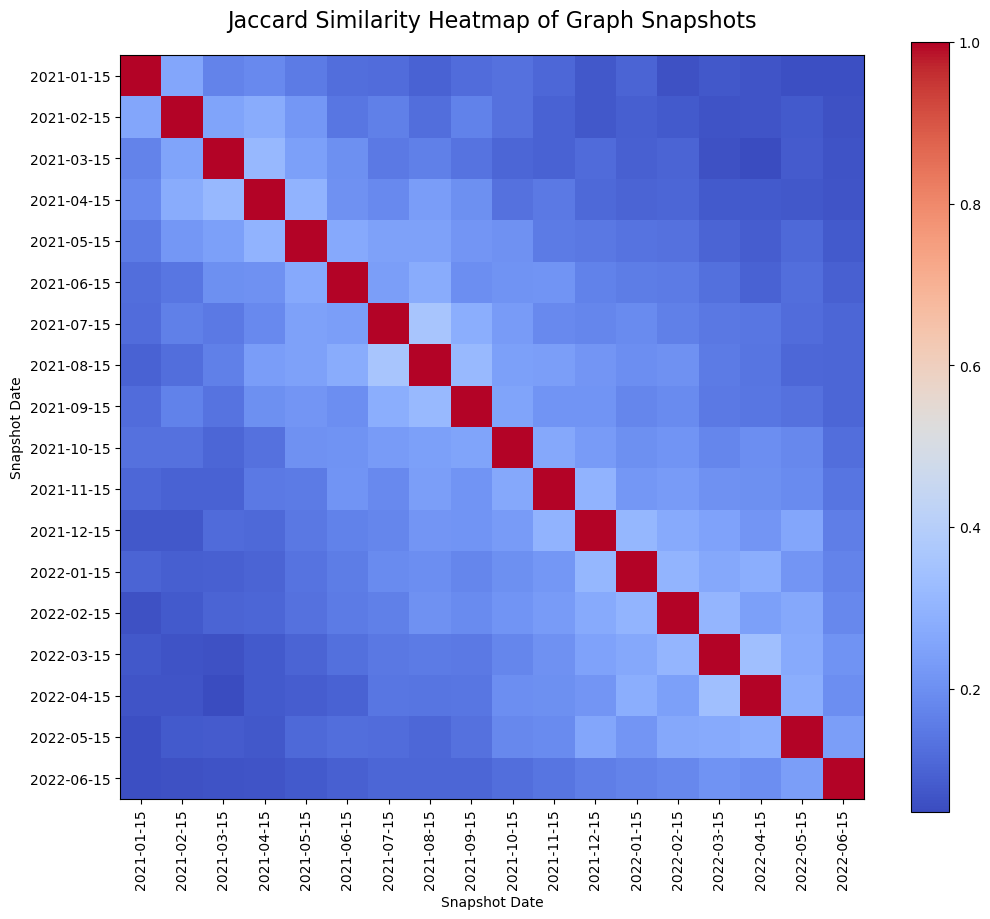

In [27]:
import numpy as np
import pandas as pd

def calculate_similarity_matrix(graphs):
    """
    Calculate the Jaccard Similarity matrix for a dictionary of graphs.

    Parameters:
    graphs (dict): A dictionary of graphs with snapshots as keys.

    Returns:
    np.ndarray: A 2D numpy array representing the similarity matrix.
    list: A sorted list of snapshot keys.
    """
    snapshot_list = sorted(graphs.keys())
    similarity_matrix = np.zeros((len(snapshot_list), len(snapshot_list)))

    for i, snapshot1 in enumerate(snapshot_list):
        for j, snapshot2 in enumerate(snapshot_list):
            if i <= j:
                similarity = jaccard_similarity(graphs[snapshot1], graphs[snapshot2])
                similarity_matrix[i, j] = similarity
                similarity_matrix[j, i] = similarity  # Symmetric matrix

    return similarity_matrix, snapshot_list

# Example usage
# Assuming 'graphs' is a dictionary of graphs, and 'dates' is a list of corresponding dates
similarity_matrix, snapshot_list = calculate_similarity_matrix(graphs)

# Convert the similarity matrix to a pandas DataFrame for easier reading and analysis
similarity_df = pd.DataFrame(similarity_matrix, index=snapshot_list, columns=snapshot_list)

# Output the DataFrame to see the numerical values
print(similarity_df)

# Optional: Save the DataFrame as a CSV file
#similarity_df.to_csv('similarity_matrix.csv')

# Plot the similarity heatmap
plot_similarity_heatmap(similarity_matrix, snapshot_list, dates, output_directory='../output/wallet_network_projections/')

In [28]:
def calculate_similarity_matrix(graphs):
    snapshot_list = sorted(graphs.keys())
    similarity_matrix = np.zeros((len(snapshot_list), len(snapshot_list)))

    for i, snapshot1 in enumerate(snapshot_list):
        for j, snapshot2 in enumerate(snapshot_list):
            if i <= j:
                similarity = jaccard_similarity(graphs[snapshot1], graphs[snapshot2])
                similarity_matrix[i, j] = similarity
                similarity_matrix[j, i] = similarity  # Symmetric matrix

    return similarity_matrix, snapshot_list


In [29]:
similarity_df = pd.DataFrame(similarity_matrix, index=snapshot_list, columns=snapshot_list)
print(similarity_df)


          11659570  11861210  12043054  12244515  12438842  12638919  \
11659570  1.000000  0.261128  0.170127  0.188627  0.153590  0.125000   
11861210  0.261128  1.000000  0.254478  0.275542  0.219138  0.143336   
12043054  0.170127  0.254478  1.000000  0.312936  0.241679  0.200548   
12244515  0.188627  0.275542  0.312936  1.000000  0.297610  0.206872   
12438842  0.153590  0.219138  0.241679  0.297610  1.000000  0.269679   
12638919  0.125000  0.143336  0.200548  0.206872  0.269679  1.000000   
12831436  0.118465  0.164671  0.150780  0.186554  0.245283  0.240320   
13029639  0.096060  0.122857  0.165701  0.234560  0.246883  0.275344   
13230157  0.119395  0.169679  0.133002  0.201666  0.217780  0.197581   
13422506  0.129735  0.129481  0.103836  0.130921  0.204941  0.208633   
13620205  0.109780  0.098219  0.098655  0.147992  0.154818  0.213159   
13809597  0.076923  0.076762  0.114693  0.111944  0.147155  0.168582   
14009885  0.101285  0.089192  0.093766  0.100000  0.135557  0.15

# General network analysis

In [30]:
import networkx as nx
import pandas as pd

def calculate_graph_statistics(graphs_dict):
    data = {
        'Snapshot': [],
        'Nodes': [],
        'Edges': [],
        'Density': [],
        'AvgDegree': [],
        'NumComponents': [],
        'SizeLargestComponent': [],
        'AvgClusteringCoeff': [],

    }

    for snapshot, G in graphs_dict.items():
        num_nodes = len(G.nodes())
        num_edges = len(G.edges())
        density = nx.density(G)
        avg_degree = sum(dict(G.degree()).values()) / num_nodes if num_nodes > 0 else 0
        num_components = nx.number_connected_components(G)
        largest_component = max(nx.connected_components(G), key=len)
        size_largest_component = len(largest_component)
        avg_clustering = nx.average_clustering(G)
        
        
        data['Snapshot'].append(snapshot)
        data['Nodes'].append(num_nodes)
        data['Edges'].append(num_edges)
        data['Density'].append(density)
        data['AvgDegree'].append(avg_degree)
        data['NumComponents'].append(num_components)
        data['SizeLargestComponent'].append(size_largest_component)
        data['AvgClusteringCoeff'].append(avg_clustering)

    
    return pd.DataFrame(data)

# Example usage
# Assuming `graphs` is a dictionary of NetworkX graphs
graph_stats = calculate_graph_statistics(graphs)

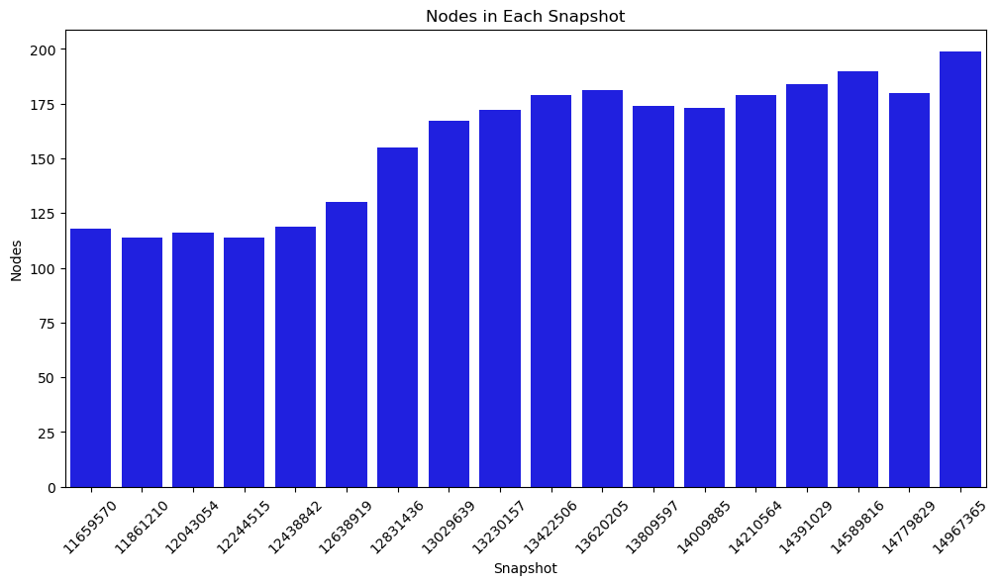

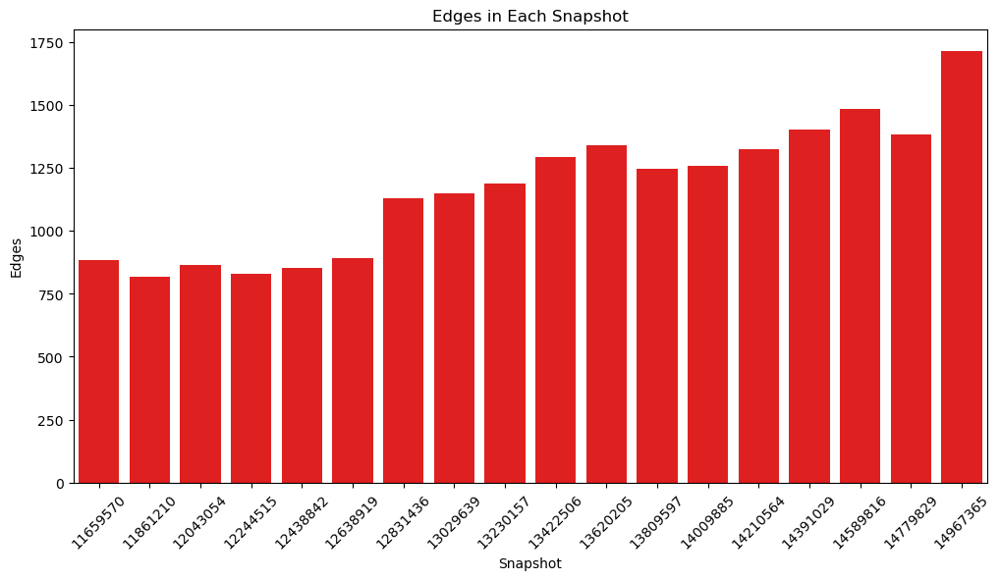

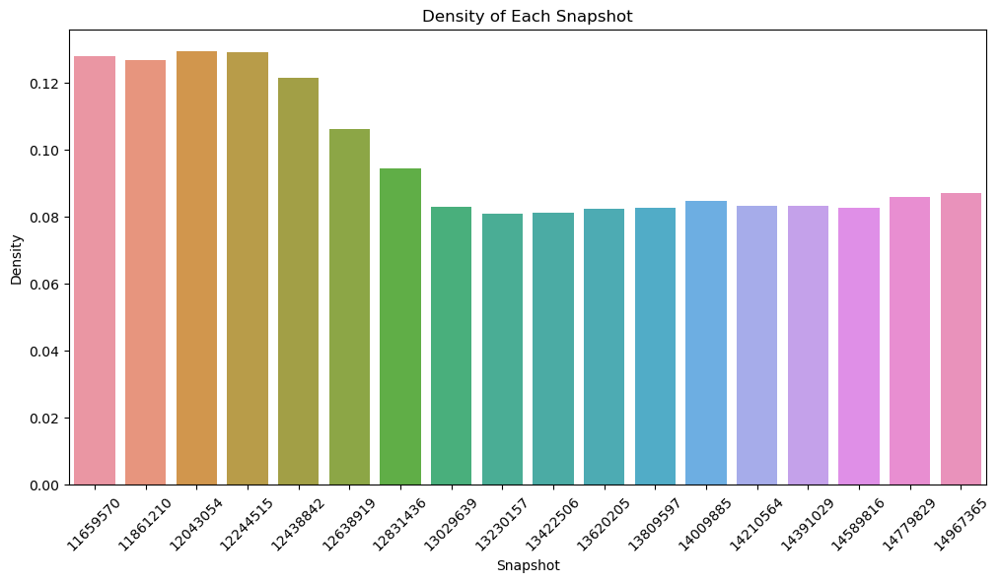

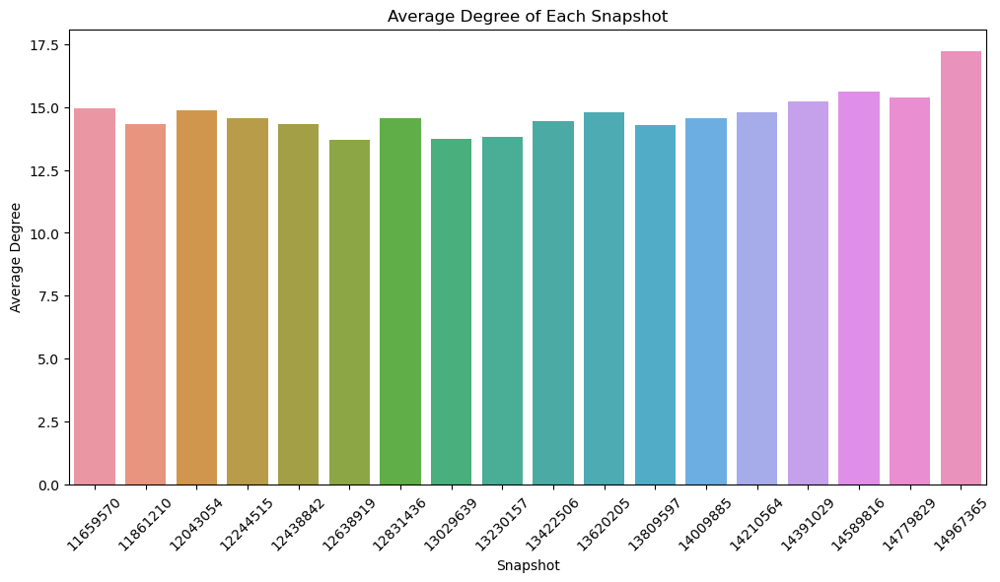

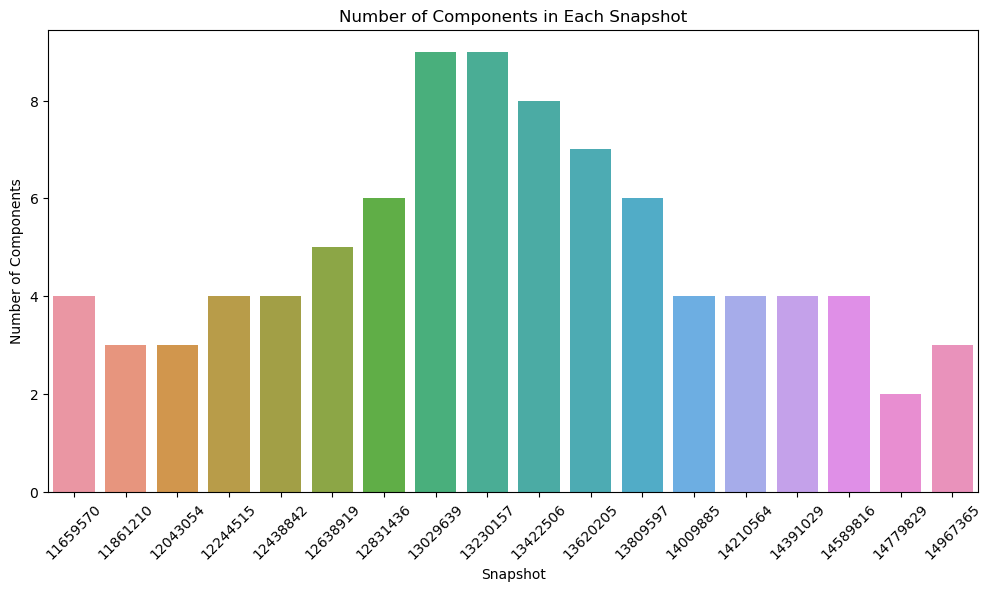

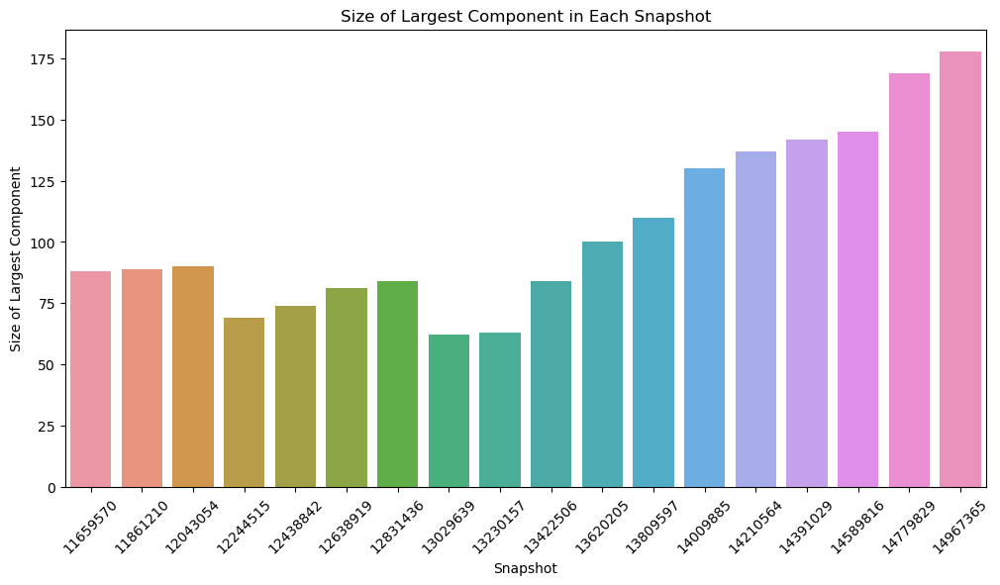

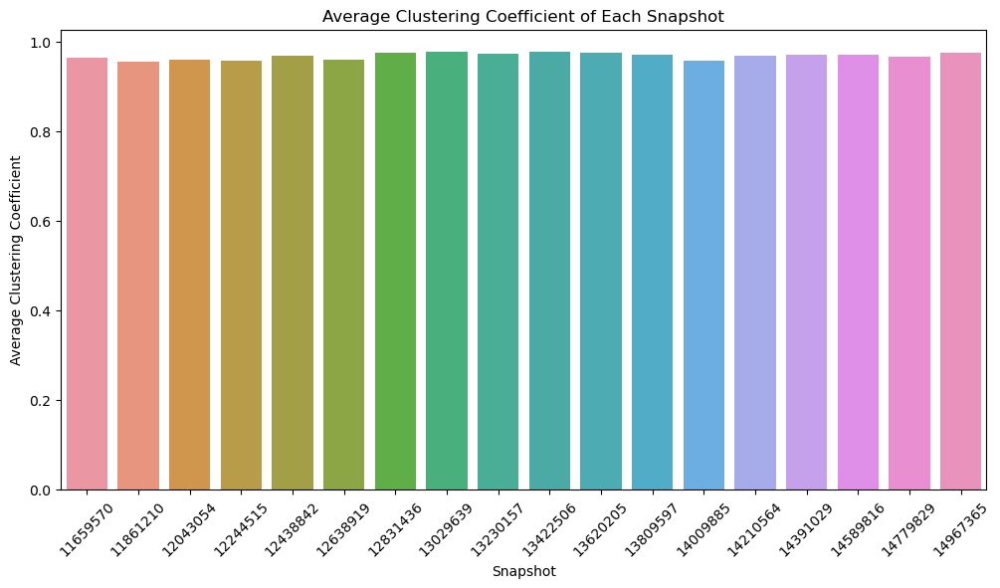

In [31]:
import matplotlib.pyplot as plt
import seaborn as sns


# Plotting Nodes
plt.figure(figsize=(12, 6))
sns.barplot(x='Snapshot', y='Nodes', data=graph_stats, color='b')
plt.title('Nodes in Each Snapshot')
plt.xlabel('Snapshot')
plt.ylabel('Nodes')
plt.xticks(rotation=45)
plt.show()

# Plotting Edges
plt.figure(figsize=(12, 6))
sns.barplot(x='Snapshot', y='Edges', data=graph_stats, color='r')
plt.title('Edges in Each Snapshot')
plt.xlabel('Snapshot')
plt.ylabel('Edges')
plt.xticks(rotation=45)
plt.show()

# Plotting Density
plt.figure(figsize=(12, 6))
sns.barplot(x='Snapshot', y='Density', data=graph_stats)
plt.title('Density of Each Snapshot')
plt.xlabel('Snapshot')
plt.ylabel('Density')
plt.xticks(rotation=45)
plt.show()

# Plotting Average Degree
plt.figure(figsize=(12, 6))
sns.barplot(x='Snapshot', y='AvgDegree', data=graph_stats)
plt.title('Average Degree of Each Snapshot')
plt.xlabel('Snapshot')
plt.ylabel('Average Degree')
plt.xticks(rotation=45)
plt.show()

# Plotting Number of Components
plt.figure(figsize=(12, 6))
sns.barplot(x='Snapshot', y='NumComponents', data=graph_stats)
plt.title('Number of Components in Each Snapshot')
plt.xlabel('Snapshot')
plt.ylabel('Number of Components')
plt.xticks(rotation=45)
plt.show()

# Plotting Size of Largest Component
plt.figure(figsize=(12, 6))
sns.barplot(x='Snapshot', y='SizeLargestComponent', data=graph_stats)
plt.title('Size of Largest Component in Each Snapshot')
plt.xlabel('Snapshot')
plt.ylabel('Size of Largest Component')
plt.xticks(rotation=45)
plt.show()

# Plotting Average Clustering Coefficient
plt.figure(figsize=(12, 6))
sns.barplot(x='Snapshot', y='AvgClusteringCoeff', data=graph_stats)
plt.title('Average Clustering Coefficient of Each Snapshot')
plt.xlabel('Snapshot')
plt.ylabel('Average Clustering Coefficient')
plt.xticks(rotation=45)
plt.show()

In [32]:
# Assuming `graphs` is a dictionary of NetworkX graphs
graph_stats = calculate_graph_statistics(graphs)

# Print the DataFrame to see the numerical data
print(graph_stats)


    Snapshot  Nodes  Edges   Density  AvgDegree  NumComponents  \
0   11659570    118    883  0.127915  14.966102              4   
1   11861210    114    817  0.126844  14.333333              3   
2   12043054    116    864  0.129535  14.896552              3   
3   12244515    114    831  0.129017  14.578947              4   
4   12438842    119    852  0.121350  14.319328              4   
5   12638919    130    890  0.106142  13.692308              5   
6   12831436    155   1128  0.094512  14.554839              6   
7   13029639    167   1148  0.082822  13.748503              9   
8   13230157    172   1189  0.080851  13.825581              9   
9   13422506    179   1294  0.081225  14.458101              8   
10  13620205    181   1341  0.082320  14.817680              7   
11  13809597    174   1245  0.082719  14.310345              6   
12  14009885    173   1259  0.084622  14.554913              4   
13  14210564    179   1326  0.083234  14.815642              4   
14  143910

# Generating normal graph

import os
from os.path import join
from dotenv import load_dotenv
import dask.dataframe as dd
from tqdm import tqdm
import pandas as pd
import time
import numpy as np
import networkx as nx

from src.wallet_projection.wallet_projection_analysis import validate_wallet_links  # Adjust the import if necessary

load_dotenv()

path = os.environ['DATA_DIRECTORY']

# Constants
SNAPSHOT_CSV_PATH = '/Users/liamk/Desktop/DATA_DIRECTORY/data/snapshot_selection.csv'
ADDRESS_CSV_PATH = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'
OUTPUT_PATH = join(path, '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs')
SUPPLY_THRESHOLD = 0.01 # 0.01  equal 1% of token supply

KNOWN_BURNER_ADDRESSES = set([
    '0x0000000000000000000000000000000000000000', '0x000000000000000000000000000000000000dead',
    '0x0000000000000000000000000000000000000001', '0x0000000000000000000000000000000000000002',
    '0x0000000000000000000000000000000000000003', '0x0000000000000000000000000000000000000004',
    '0x0000000000000000000000000000000000000005', '0x0000000000000000000000000000000000000006',
    '0x0000000000000000000000000000000000000007'
])

# Helper function to process each snapshot
def process_snapshot(snapshot, df_addresses):
    start_time = time.time()
    
    dtypes = {
        'label': 'object',  # Specify dtype for the label column
        # Add other columns with their expected dtypes if necessary
    }
    
    ddf = dd.read_csv(
        join(path, f'/Users/liamk/Desktop/DATA_DIRECTORY/data/snapshot_token_balance_tables/token_holder_snapshot_balance_labelled_{snapshot}.csv'),
        dtype=dtypes
    )   
    
    # Efficient filtering using Dask
    ddf = ddf[(ddf['value'] > 0) & 
              (ddf.pct_supply > SUPPLY_THRESHOLD) &
              (~ddf['address'].isin(KNOWN_BURNER_ADDRESSES)) & 
              (ddf['token_address'].isin(df_addresses['address']))]

    present_addresses = ddf['address'].unique().compute()
    pop_size = len(ddf['token_address'].unique().compute())

    # Validate wallet links in parallel
    validated_links = validate_wallet_links(present_addresses, ddf.compute(), pop_size)

    G = nx.Graph()
    G.add_edges_from(validated_links['combination'])

    # Store the graph with a name based on snapshot height
    nx.write_graphml(G, join(OUTPUT_PATH, f'validated_wallet_projection_graph_{snapshot}.graphml'))

    end_time = time.time()
    time_taken = end_time - start_time
    return snapshot, time_taken

# Main function to load, process data, and generate network graphs
def generate_network_graphs():
    df_snapshot = pd.read_csv(SNAPSHOT_CSV_PATH)
    df_addresses = pd.read_csv(ADDRESS_CSV_PATH)

    snapshots = df_snapshot[df_snapshot['Block Height'] >= 11659570]['Block Height']

    total_snapshots = len(snapshots)
    total_time = 0

    with tqdm(total=total_snapshots) as pbar:
        for snapshot in snapshots:
            snapshot, time_taken = process_snapshot(snapshot, df_addresses)
            total_time += time_taken
            avg_time_per_snapshot = total_time / (pbar.n + 1)
            estimated_total_time = avg_time_per_snapshot * total_snapshots
            remaining_time = estimated_total_time - total_time
            pbar.set_postfix({
                'Snapshot': snapshot,
                'Time per snapshot': f'{avg_time_per_snapshot:.2f}s',
                'Remaining time': f'{remaining_time:.2f}s'
            })
            pbar.update(1)

if __name__ == "__main__":
    generate_network_graphs()

# Generating enriched graph

import os
import pandas as pd
import dask.dataframe as dd
import networkx as nx
from tqdm import tqdm
import time
from os.path import join
from dotenv import load_dotenv

from src.wallet_projection.wallet_projection_analysis import validate_wallet_links  # Adjust the import if necessary

def process_snapshot(snapshot, df_addresses):
    start_time = time.time()
    
    # Define data types for efficient loading
    dtypes = {
        'label': 'object',  # Specify dtype for the label column if used
        'value': 'float64',
        'pct_supply': 'float64',
        'address': 'object',
        'token_address': 'object'
    }
    
    # Load snapshot data
    ddf = dd.read_csv(
        join(path, f'/Users/liamk/Desktop/DATA_DIRECTORY/data/snapshot_token_balance_tables_enriched/token_holder_snapshot_balance_labelled_{snapshot}.csv'),
        dtype=dtypes
    )
    
    # Filter out unwanted addresses and low balances
    ddf_filtered = ddf[(ddf['value'] > 0) & 
                       (ddf.pct_supply > SUPPLY_THRESHOLD) &
                       (~ddf['address'].isin(known_burner_addresses)) & 
                       (ddf['token_address'].isin(df_addresses['address']))]

    # Compute unique addresses and their corresponding tokens
    present_addresses = ddf_filtered['address'].compute()
    address_to_token = ddf_filtered[['address', 'token_address']].drop_duplicates().compute().set_index('address')['token_address'].to_dict()

    # Validate wallet links in parallel
    validated_links = validate_wallet_links(present_addresses, ddf_filtered.compute(), len(present_addresses))

    G = nx.Graph()
    
    # Add nodes with token information
    for address in present_addresses:
        G.add_node(address, token_address=address_to_token.get(address, 'Unknown'))
    
    # Add validated links as edges
    G.add_edges_from(validated_links['combination'])

    # Store the graph with additional token information
    nx.write_graphml(G, join(OUTPUT_PATH, f'validated_wallet_projection_graph_{snapshot}.graphml'))

    end_time = time.time()
    time_taken = end_time - start_time
    return snapshot, time_taken

if __name__ == "__main__":
    load_dotenv()
    
   
# Constants
SNAPSHOT_CSV_PATH = '/Users/liamk/Desktop/DATA_DIRECTORY/data/snapshot_selection.csv'
ADDRESS_CSV_PATH = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'
OUTPUT_PATH = join(path, '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched')
SUPPLY_THRESHOLD = 0.01 # 0.01  equal 1% of token supply


os.makedirs(OUTPUT_PATH, exist_ok=True)  # Ensure the output directory exists
    
df_snapshot = pd.read_csv(SNAPSHOT_CSV_PATH)
df_addresses = pd.read_csv(ADDRESS_CSV_PATH)
snapshots = df_snapshot[df_snapshot['Block Height'] >= 11659570]['Block Height']
total_snapshots = len(snapshots)
total_time = 0

with tqdm(total=total_snapshots) as pbar:
    for snapshot in snapshots:
            snapshot, time_taken = process_snapshot(snapshot, df_addresses)
            total_time += time_taken
            avg_time_per_snapshot = total_time / (pbar.n + 1)
            estimated_total_time = avg_time_per_snapshot * total_snapshots
            remaining_time = estimated_total_time - total_time
            pbar.set_postfix({
                'Snapshot': snapshot,
                'Time per snapshot': f'{avg_time_per_snapshot:.2f}s',
                'Remaining time': f'{remaining_time:.2f}s'
            })
            pbar.update(1)


In [33]:
import networkx as nx

# Path to the .graphml file
graphml_file_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_11659570.graphml'

# Load the graph from the .graphml file
G = nx.read_graphml(graphml_file_path)

# Function to inspect and print graph information
def inspect_graph(G):
    # Print basic graph information
    print(f"Number of nodes: {G.number_of_nodes()}")
    print(f"Number of edges: {G.number_of_edges()}")
    print(f"Graph is directed: {G.is_directed()}\n")

    # Print node attributes (sample of 5 nodes)
    print("Sample of node attributes (first 5 nodes):")
    for node, attrs in list(G.nodes(data=True))[:5]:
        print(f"Node: {node}")
        for attr_name, attr_value in attrs.items():
            print(f"  - {attr_name}: {attr_value}")
        print()

    # Print edge attributes (sample of 5 edges)
    print("Sample of edge attributes (first 5 edges):")
    for edge in list(G.edges(data=True))[:5]:
        print(f"Edge: {edge}")
        for attr_name, attr_value in edge[2].items():
            print(f"  - {attr_name}: {attr_value}")
        print()

    # Print all node and edge attributes
    node_attr_keys = set().union(*(d.keys() for n, d in G.nodes(data=True)))
    edge_attr_keys = set().union(*(d.keys() for u, v, d in G.edges(data=True)))

    print(f"Node attributes: {node_attr_keys}")
    print(f"Edge attributes: {edge_attr_keys}")

# Call the function to inspect the graph
inspect_graph(G)



Number of nodes: 118
Number of edges: 883
Graph is directed: False

Sample of node attributes (first 5 nodes):
Node: 0x41527cc7cc6e63d9d0753d6fdbd4ac16096a029d

Node: 0xd6868b23905009d859cc232f7c008c13bc527702

Node: 0x2775b1c75658be0f640272ccb8c72ac986009e38

Node: 0xc22fbdc5dc1fd8a43b0e1e655202014c00342eb7

Node: 0xd0ed69e40a5b044d59411cf6ddc653c8c3924d10

Sample of edge attributes (first 5 edges):
Edge: ('0x41527cc7cc6e63d9d0753d6fdbd4ac16096a029d', '0xd6868b23905009d859cc232f7c008c13bc527702', {})

Edge: ('0x41527cc7cc6e63d9d0753d6fdbd4ac16096a029d', '0xd0ed69e40a5b044d59411cf6ddc653c8c3924d10', {})

Edge: ('0x41527cc7cc6e63d9d0753d6fdbd4ac16096a029d', '0xca8d6f69d8f32516a109df68b623452cc9f5e64d', {})

Edge: ('0x41527cc7cc6e63d9d0753d6fdbd4ac16096a029d', '0xc2adda861f89bbb333c90c492cb837741916a225', {})

Edge: ('0x41527cc7cc6e63d9d0753d6fdbd4ac16096a029d', '0x9ef05f7f6deb616fd37ac3c959a2ddd25a54e4f5', {})

Node attributes: set()
Edge attributes: set()


In [34]:
import networkx as nx

# Path to the enriched .graphml file
graphml_file_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched/validated_wallet_projection_graph_11659570.graphml'

# Load the graph from the .graphml file
G = nx.read_graphml(graphml_file_path)

# Function to inspect and print graph information
def inspect_graph(G):
    # Print basic graph information
    print(f"Number of nodes: {G.number_of_nodes()}")
    print(f"Number of edges: {G.number_of_edges()}")
    print(f"Graph is directed: {G.is_directed()}\n")

    # Print node attributes (sample of 5 nodes)
    print("Sample of node attributes (first 5 nodes):")
    for node, attrs in list(G.nodes(data=True))[:5]:
        print(f"Node: {node}")
        for attr_name, attr_value in attrs.items():
            print(f"  - {attr_name}: {attr_value}")
        print()

    # Print edge attributes (sample of 5 edges)
    print("Sample of edge attributes (first 5 edges):")
    for edge in list(G.edges(data=True))[:5]:
        print(f"Edge: {edge}")
        for attr_name, attr_value in edge[2].items():
            print(f"  - {attr_name}: {attr_value}")
        print()

    # Print all node and edge attributes
    node_attr_keys = set().union(*(d.keys() for n, d in G.nodes(data=True)))
    edge_attr_keys = set().union(*(d.keys() for u, v, d in G.edges(data=True)))

    print(f"Node attributes: {node_attr_keys}")
    print(f"Edge attributes: {edge_attr_keys}")

# Call the function to inspect the graph
inspect_graph(G)


Number of nodes: 118
Number of edges: 888
Graph is directed: False

Sample of node attributes (first 5 nodes):
Node: 0x000be27f560fef0253cac4da8411611184356549
  - token_address: 0x9f8f72aa9304c8b593d555f12ef6589cc3a579a2

Node: 0x0248374df0bf742386a278430cdf2cf8a95d6dd9
  - token_address: 0x9f8f72aa9304c8b593d555f12ef6589cc3a579a2

Node: 0x05e793ce0c6027323ac150f6d45c2344d28b6019
  - token_address: 0x9f8f72aa9304c8b593d555f12ef6589cc3a579a2

Node: 0x088ee5007c98a9677165d78dd2109ae4a3d04d0c
  - token_address: 0x0bc529c00c6401aef6d220be8c6ea1667f6ad93e

Node: 0x090d4613473dee047c3f2706764f49e0821d256e
  - token_address: 0x1f9840a85d5af5bf1d1762f925bdaddc4201f984

Sample of edge attributes (first 5 edges):
Edge: ('0x000be27f560fef0253cac4da8411611184356549', '0x0a3f6849f78076aefadf113f5bed87720274ddc0', {})

Edge: ('0x000be27f560fef0253cac4da8411611184356549', '0x0248374df0bf742386a278430cdf2cf8a95d6dd9', {})

Edge: ('0x000be27f560fef0253cac4da8411611184356549', '0x05e793ce0c6027323ac150

In [35]:
import networkx as nx
from dotenv import load_dotenv

# Load environment variables from .env file (if needed for other variables)
load_dotenv()

# Set the input directory directly to the local folder where the graphs are stored
input_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'

# Check if the input directory exists
if not os.path.exists(input_directory):
    raise FileNotFoundError(f"Input directory does not exist: {input_directory}")

print(f"Input directory is set to: {input_directory}")

# Function to load graphs from snapshots
def load_wallet_graphs_from_snapshots(df_snapshots, input_directory):
    graphs = {}
    dates = {}
    
    for index, row in df_snapshots.iterrows():
        snapshot = row['Block Height']
        date = row['Date'].strftime('%Y-%m-%d')  # Format date as string
        dates[snapshot] = date
        file_path = os.path.join(input_directory, f"validated_wallet_projection_graph_{snapshot}.graphml")
        
        print(f"Checking file: {file_path}")  # Debug print

        if os.path.exists(file_path):
            graph = nx.read_graphml(file_path)
            graphs[snapshot] = graph
            print(f"Loaded graph for snapshot {snapshot}")
        else:
            print(f"Graph file for snapshot {snapshot} does not exist at {file_path}")
    
    return graphs, dates

# Assuming df_snapshots is already loaded
data_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data'
df_snapshots = pd.read_csv(os.path.join(data_directory, 'snapshot_selection.csv'))
df_snapshots['Date'] = pd.to_datetime(df_snapshots['Date'])  # Ensure dates are in datetime format

# Load the graphs
graphs, dates = load_wallet_graphs_from_snapshots(df_snapshots, input_directory)

# Print the loaded graphs for verification
print(f"Loaded {len(graphs)} graphs.")
for snapshot, graph in graphs.items():
    print(f"Snapshot: {snapshot}, Number of nodes: {len(graph.nodes)}, Number of edges: {len(graph.edges)}")

Input directory is set to: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_7962629.graphml
Graph file for snapshot 7962629 does not exist at /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_7962629.graphml
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_8155117.graphml
Graph file for snapshot 8155117 does not exist at /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_8155117.graphml
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_8354625.graphml
Graph file for snapshot 8354625 does not exist at /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_gra

Loaded graph for snapshot 14589816
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_14779829.graphml
Loaded graph for snapshot 14779829
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_14967365.graphml
Loaded graph for snapshot 14967365
Loaded 18 graphs.
Snapshot: 11659570, Number of nodes: 118, Number of edges: 883
Snapshot: 11861210, Number of nodes: 114, Number of edges: 817
Snapshot: 12043054, Number of nodes: 116, Number of edges: 864
Snapshot: 12244515, Number of nodes: 114, Number of edges: 831
Snapshot: 12438842, Number of nodes: 119, Number of edges: 852
Snapshot: 12638919, Number of nodes: 130, Number of edges: 890
Snapshot: 12831436, Number of nodes: 155, Number of edges: 1128
Snapshot: 13029639, Number of nodes: 167, Number of edges: 1148
Snapshot: 13230157, Number of nodes: 172, Number of edges: 1189
Snapshot: 13422506, Num

# Aligning the token labeling


In [36]:
import os
import networkx as nx
from os.path import join

# Paths
normal_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'

# Load a specific snapshot for comparison
snapshot = '11659570'  # Example snapshot number
normal_graph_file = join(normal_graph_path, f'validated_wallet_projection_graph_{snapshot}.graphml')
enriched_graph_file = join(enriched_graph_path, f'validated_wallet_projection_graph_{snapshot}.graphml')

# Load graphs
normal_graph = nx.read_graphml(normal_graph_file)
enriched_graph = nx.read_graphml(enriched_graph_file)

# Get nodes from both graphs
normal_nodes = set(normal_graph.nodes())
enriched_nodes = set(enriched_graph.nodes())

# Compare nodes
matched_nodes = normal_nodes & enriched_nodes
unmatched_nodes = normal_nodes - enriched_nodes

print(f"Total nodes in normal graph: {len(normal_nodes)}")
print(f"Total nodes in enriched graph: {len(enriched_nodes)}")
print(f"Matched nodes: {len(matched_nodes)}")
print(f"Unmatched nodes: {len(unmatched_nodes)}")

# Output some examples of unmatched nodes if any
if unmatched_nodes:
    print("Examples of unmatched nodes:", list(unmatched_nodes)[:10])

Total nodes in normal graph: 118
Total nodes in enriched graph: 118
Matched nodes: 118
Unmatched nodes: 0


In [37]:
import os
import networkx as nx
import pandas as pd
from os.path import join

# Paths
normal_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'

# Load token information
token_info = pd.read_csv(token_info_path)
token_info['address'] = token_info['address'].str.lower()
token_map = token_info.set_index('address')['name'].to_dict()

# Load a specific snapshot for comparison
snapshot = '11659570'  # Example snapshot number
normal_graph_file = join(normal_graph_path, f'validated_wallet_projection_graph_{snapshot}.graphml')
enriched_graph_file = join(enriched_graph_path, f'validated_wallet_projection_graph_{snapshot}.graphml')

# Load graphs
normal_graph = nx.read_graphml(normal_graph_file)
enriched_graph = nx.read_graphml(enriched_graph_file)

# Extract token addresses from the enriched graph and map to token names
for node in normal_graph.nodes():
    if 'token_address' in enriched_graph.nodes[node]:
        token_address = enriched_graph.nodes[node]['token_address'].lower()
        token_name = token_map.get(token_address, 'Unknown Token')
        normal_graph.nodes[node]['token_name'] = token_name
    else:
        normal_graph.nodes[node]['token_name'] = 'Unknown Token'

# Verify the token names in the normal graph
token_names = nx.get_node_attributes(normal_graph, 'token_name')
print("Token names associated with nodes:")
for node, token_name in token_names.items():
    print(f"Node: {node}, Token: {token_name}")

# Optionally, save the graph with token names for further analysis
#output_graph_file = join(normal_graph_path, f'validated_wallet_projection_graph_with_tokens_{snapshot}.graphml')
#nx.write_graphml(normal_graph, output_graph_file)

Token names associated with nodes:
Node: 0x41527cc7cc6e63d9d0753d6fdbd4ac16096a029d, Token: Maker
Node: 0xd6868b23905009d859cc232f7c008c13bc527702, Token: Maker
Node: 0x2775b1c75658be0f640272ccb8c72ac986009e38, Token: Compound
Node: 0xc22fbdc5dc1fd8a43b0e1e655202014c00342eb7, Token: Compound
Node: 0xd0ed69e40a5b044d59411cf6ddc653c8c3924d10, Token: Maker
Node: 0x7587caefc8096f5f40acb83a09df031a018c66ec, Token: Compound
Node: 0xf584f8728b874a6a5c7a8d4d387c9aae9172d621, Token: Compound
Node: 0xca8d6f69d8f32516a109df68b623452cc9f5e64d, Token: Maker
Node: 0xc2adda861f89bbb333c90c492cb837741916a225, Token: Maker
Node: 0x6cc5f688a315f3dc28a7781717a9a798a59fda7b, Token: Sushi
Node: 0x795065dcc9f64b5614c407a6efdc400da6221fb0, Token: Sushi
Node: 0x8328a42a583d4812268c4dd63ae2f77f37a6b4f3, Token: Compound
Node: 0x9ef05f7f6deb616fd37ac3c959a2ddd25a54e4f5, Token: Maker
Node: 0x7b5cc9cea37f66f8e21a4c393234a84e458a8d2d, Token: Compound
Node: 0x3dfd23a6c5e8bbcfc9581d2e864a68feb6a076d3, Token: Maker
No

In [38]:
import os
import networkx as nx
from os.path import join
import pandas as pd

# Paths
normal_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'

# Load the token mapping for reference
df_tokens = pd.read_csv(token_info_path)
df_tokens['address'] = df_tokens['address'].str.lower()  # Normalize the address
token_map = df_tokens.set_index('address')['name'].to_dict()

# Load a specific snapshot for comparison
snapshot = '14210564'  # Example snapshot number
normal_graph_file = join(normal_graph_path, f'validated_wallet_projection_graph_{snapshot}.graphml')
enriched_graph_file = join(enriched_graph_path, f'validated_wallet_projection_graph_{snapshot}.graphml')

# Load graphs
normal_graph = nx.read_graphml(normal_graph_file)
enriched_graph = nx.read_graphml(enriched_graph_file)

# Normalize node identifiers (addresses) to lowercase
normal_nodes = {node.lower() for node in normal_graph.nodes()}
enriched_nodes = {node.lower() for node in enriched_graph.nodes()}

# Compare nodes
matched_nodes = normal_nodes & enriched_nodes
unmatched_nodes = normal_nodes - enriched_nodes

print(f"Total nodes in normal graph: {len(normal_nodes)}")
print(f"Total nodes in enriched graph: {len(enriched_nodes)}")
print(f"Matched nodes: {len(matched_nodes)}")
print(f"Unmatched nodes: {len(unmatched_nodes)}")

# Let's try matching nodes and retrieving token information with debugging
token_info = {}
for node in normal_graph.nodes():
    normalized_node = node.lower()
    if normalized_node in enriched_graph.nodes():
        token_address = enriched_graph.nodes[normalized_node].get('token_address', '').lower()
        
        # Debugging: Check if the token address exists in token_map
        if token_address in token_map:
            token_info[node] = token_map[token_address]
        else:
            print(f"Token address not found in token_map: {token_address}")
            token_info[node] = 'Unknown Token'
    else:
        print(f"Node {normalized_node} not found in enriched graph.")
        token_info[node] = 'Unknown Token'

# Print a sample of the results
print("\nSample of matched nodes and their tokens:")
for node, token in list(token_info.items())[:10]:
    print(f"Node: {node}, Token: {token}")


Total nodes in normal graph: 179
Total nodes in enriched graph: 179
Matched nodes: 179
Unmatched nodes: 0

Sample of matched nodes and their tokens:
Node: 0x61c808d82a3ac53231750dadc13c777b59310bd9, Token: Lido
Node: 0xc24da173a250e9ca5c54870639ebe5f88be5102d, Token: Lido
Node: 0x7a2e4aa4f2f6ab66594fff84dcabac67fb9773c8, Token: Balancer
Node: 0xb129f73f1afd3a49c701241f374db17ae63b20eb, Token: Balancer
Node: 0x7d64f03a7a15e6082d1371c82c59770d73b4f8aa, Token: Balancer
Node: 0xa3a7b6f88361f48403514059f1f16c8e78d60eec, Token: Balancer
Node: 0x583f6878eccbcf41d5126938647dc74fcce34e31, Token: Instadapp
Node: 0xba540205a5bb53e648e994be815a3a55d8367da2, Token: Instadapp
Node: 0xb1dc62ec38e6e3857a887210c38418e4a17da5b2, Token: Instadapp
Node: 0x02c2e03c5f241794909d953f5b8fa630856f172c, Token: Bitdao


In [39]:
import os
import networkx as nx
from os.path import join

# Paths
normal_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'

# Load a specific snapshot for comparison
snapshot = '13230157'  # Example snapshot number
normal_graph_file = join(normal_graph_path, f'validated_wallet_projection_graph_{snapshot}.graphml')
enriched_graph_file = join(enriched_graph_path, f'validated_wallet_projection_graph_with_tokens_{snapshot}.graphml')

# Load graphs
normal_graph = nx.read_graphml(normal_graph_file)
enriched_graph = nx.read_graphml(enriched_graph_file)

# Normalize node identifiers (addresses) to lowercase
normal_nodes = {node.lower() for node in normal_graph.nodes()}
enriched_nodes = {node.lower() for node in enriched_graph.nodes()}

# Compare nodes
matched_nodes = normal_nodes & enriched_nodes
unmatched_nodes = normal_nodes - enriched_nodes

print(f"Total nodes in normal graph: {len(normal_nodes)}")
print(f"Total nodes in enriched graph: {len(enriched_nodes)}")
print(f"Matched nodes: {len(matched_nodes)}")
print(f"Unmatched nodes: {len(unmatched_nodes)}")

# If unmatched, output some examples
if unmatched_nodes:
    print("Examples of unmatched nodes:", list(unmatched_nodes)[:10])

# Match nodes and retrieve token information
token_info = {}
for node in normal_graph.nodes():
    normalized_node = node.lower()
    if normalized_node in enriched_graph:
        token_info[node] = enriched_graph.nodes[normalized_node].get('token_name', 'Unknown Token')
    else:
        token_info[node] = 'Unknown Token'

# Print a sample of the results
for node, token in list(token_info.items())[:10]:
    print(f"Node: {node}, Token: {token}")


Total nodes in normal graph: 172
Total nodes in enriched graph: 172
Matched nodes: 172
Unmatched nodes: 0
Node: 0x2a7d59e327759acd5d11a8fb652bf4072d28ac04, Token: Curve
Node: 0xb1cff81b9305166ff1efc49a129ad2afcd7bcf19, Token: Curve
Node: 0x08a90fe0741b7def03fb290cc7b273f1855767d8, Token: Dydx
Node: 0xf95746b2c3d120b78fd1cb3f9954cb451c2163e4, Token: Dydx
Node: 0x0ec9e8aa56e0425b60dee347c8efbad959579d0f, Token: Uniswap
Node: 0x4b4e140d1f131fdad6fb59c13af796fd194e4135, Token: Uniswap
Node: 0x5f3b5dfeb7b28cdbd7faba78963ee202a494e2a2, Token: Curve
Node: 0x679fcb9b33fc4ae10ff4f96caef49c1ae3f8fa67, Token: Curve
Node: 0x25f2226b597e8f9514b3f68f00f494cf4f286491, Token: Aave
Node: 0xffc97d72e13e01096502cb8eb52dee56f74dad7b, Token: Aave


In [40]:
# Find nodes with 'Unknown Token'
unknown_tokens = {node: token for node, token in token_info.items() if token == 'Unknown Token'}

# Print the number of nodes with 'Unknown Token'
print(f"Number of nodes with 'Unknown Token': {len(unknown_tokens)}")

# If there are any, print a sample of them
if unknown_tokens:
    print("Sample of nodes with 'Unknown Token':")
    for node, token in list(unknown_tokens.items())[:10]:
        print(f"Node: {node}, Token: {token}")


Number of nodes with 'Unknown Token': 0


In [41]:
import os
import networkx as nx
from os.path import join

# Paths
normal_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'

# Load a specific snapshot for comparison
snapshot = '14589816'  # Example snapshot number
normal_graph_file = join(normal_graph_path, f'validated_wallet_projection_graph_{snapshot}.graphml')
enriched_graph_file = join(enriched_graph_path, f'validated_wallet_projection_graph_with_tokens_{snapshot}.graphml')

# Load graphs
normal_graph = nx.read_graphml(normal_graph_file)
enriched_graph = nx.read_graphml(enriched_graph_file)

# Normalize node identifiers (addresses) to lowercase
normal_nodes = {node.lower() for node in normal_graph.nodes()}
enriched_nodes = {node.lower() for node in enriched_graph.nodes()}

# Print out some node attributes in the enriched graph
print("Sample node attributes from the enriched graph:")
for node in list(enriched_graph.nodes())[:10]:  # Print attributes for the first 10 nodes
    print(f"Node: {node}, Attributes: {enriched_graph.nodes[node]}")

# Compare nodes
matched_nodes = normal_nodes & enriched_nodes
unmatched_nodes = normal_nodes - enriched_nodes

print(f"Total nodes in normal graph: {len(normal_nodes)}")
print(f"Total nodes in enriched graph: {len(enriched_nodes)}")
print(f"Matched nodes: {len(matched_nodes)}")
print(f"Unmatched nodes: {len(unmatched_nodes)}")

# If unmatched, output some examples
if unmatched_nodes:
    print("Examples of unmatched nodes:", list(unmatched_nodes)[:10])

# Match nodes and retrieve token information
token_info = {}
for node in normal_graph.nodes():
    normalized_node = node.lower()
    if normalized_node in enriched_graph.nodes():
        token_info[node] = enriched_graph.nodes[normalized_node].get('token_name', 'Unknown Token')
    else:
        token_info[node] = 'Unknown Token'

# Print a sample of the results
for node, token in list(token_info.items())[:10]:
    print(f"Node: {node}, Token: {token}")


Sample node attributes from the enriched graph:
Node: 0x69076e44a9c70a67d5b79d95795aba299083c275, Attributes: {'token_name': 'Maker'}
Node: 0xca8d6f69d8f32516a109df68b623452cc9f5e64d, Attributes: {'token_name': 'Maker'}
Node: 0x4048c47b546b68ad226ea20b5f0acac49b086a21, Attributes: {'token_name': 'Aave'}
Node: 0xc697051d1c6296c24ae3bcef39aca743861d9a81, Attributes: {'token_name': 'Aave'}
Node: 0xc713e5e149d5d0715dcd1c156a020976e7e56b88, Attributes: {'token_name': 'Maker'}
Node: 0x9849c2c1b73b41aee843a002c332a2d16aaab611, Attributes: {'token_name': 'Lido'}
Node: 0xa2dfc431297aee387c05beef507e5335e684fbcd, Attributes: {'token_name': 'Lido'}
Node: 0xb1dc62ec38e6e3857a887210c38418e4a17da5b2, Attributes: {'token_name': 'Instadapp'}
Node: 0xe48cd70f7072fd0c21a3b2c323efabe7ed223e02, Attributes: {'token_name': 'Instadapp'}
Node: 0x11577a8a5baf1e25b9a2d89f39670f447d75c3cd, Attributes: {'token_name': 'Maker'}
Total nodes in normal graph: 190
Total nodes in enriched graph: 190
Matched nodes: 190
U

In [42]:
import os
import networkx as nx
import pandas as pd
from os.path import join

# Paths
normal_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'

# Load the token information CSV
df_tokens = pd.read_csv(token_info_path)
token_map = df_tokens.set_index('address')['name'].to_dict()

# Load snapshots
snapshots = sorted([f.split('_')[-1].replace('.graphml', '') for f in os.listdir(normal_graph_path) if f.endswith('.graphml')])

# Process each snapshot
for snapshot in snapshots:
    print(f"\nProcessing snapshot {snapshot}...")

    normal_graph_file = join(normal_graph_path, f'validated_wallet_projection_graph_{snapshot}.graphml')
    enriched_graph_file = join(enriched_graph_path, f'validated_wallet_projection_graph_{snapshot}.graphml')

    # Load graphs
    normal_graph = nx.read_graphml(normal_graph_file)
    enriched_graph = nx.read_graphml(enriched_graph_file)

    # Compare nodes
    matched_nodes = set(normal_graph.nodes()) & set(enriched_graph.nodes())
    unmatched_nodes = set(normal_graph.nodes()) - set(enriched_graph.nodes())

    known_tokens_count = 0
    unknown_tokens_count = 0

    print(f"Total nodes in normal graph: {len(normal_graph.nodes())}")
    print(f"Total nodes in enriched graph: {len(enriched_graph.nodes())}")
    print(f"Matched nodes: {len(matched_nodes)}")
    print(f"Unmatched nodes: {len(unmatched_nodes)}")

    # Check token names for matched nodes
    for node in matched_nodes:
        token_address = enriched_graph.nodes[node].get('token_address', 'Unknown Address')
        token_name = token_map.get(token_address, 'Unknown Token')

        if token_name == 'Unknown Token':
            unknown_tokens_count += 1
        else:
            known_tokens_count += 1

        # Print out a few examples
        if known_tokens_count + unknown_tokens_count <= 10:  # Limit output for readability
            print(f"Node: {node}, Token Address: {token_address}, Token Name: {token_name}")

    print(f"Known tokens in snapshot {snapshot}: {known_tokens_count}")
    print(f"Unknown tokens in snapshot {snapshot}: {unknown_tokens_count}")


Processing snapshot 11659570...
Total nodes in normal graph: 118
Total nodes in enriched graph: 118
Matched nodes: 118
Unmatched nodes: 0
Node: 0x0248374df0bf742386a278430cdf2cf8a95d6dd9, Token Address: 0x9f8f72aa9304c8b593d555f12ef6589cc3a579a2, Token Name: Maker
Node: 0x7587caefc8096f5f40acb83a09df031a018c66ec, Token Address: 0xc00e94cb662c3520282e6f5717214004a7f26888, Token Name: Compound
Node: 0xe93381fb4c4f14bda253907b18fad305d799241a, Token Address: 0xd533a949740bb3306d119cc777fa900ba034cd52, Token Name: Curve
Node: 0x9dde0b1d39d0d2c6589cde1bfed3542d2a3c5b11, Token Address: 0xba100000625a3754423978a60c9317c58a424e3d, Token Name: Balancer
Node: 0x0d5d0004383b3e208dcceffb8dae28772d341135, Token Address: 0x1f9840a85d5af5bf1d1762f925bdaddc4201f984, Token Name: Uniswap
Node: 0x1597d19659f3de52abd475f7d2314dcca29359bd, Token Address: 0x5a98fcbea516cf06857215779fd812ca3bef1b32, Token Name: Lido
Node: 0x0a3f6849f78076aefadf113f5bed87720274ddc0, Token Address: 0x9f8f72aa9304c8b593d555f12

Total nodes in normal graph: 172
Total nodes in enriched graph: 172
Matched nodes: 172
Unmatched nodes: 0
Node: 0xba12222222228d8ba445958a75a0704d566bf2c8, Token Address: 0xba100000625a3754423978a60c9317c58a424e3d, Token Name: Balancer
Node: 0xf7e1974393108d506ac8ce06da4cb002a516093f, Token Address: 0x0bc529c00c6401aef6d220be8c6ea1667f6ad93e, Token Name: Yearn Finance
Node: 0x0248374df0bf742386a278430cdf2cf8a95d6dd9, Token Address: 0x9f8f72aa9304c8b593d555f12ef6589cc3a579a2, Token Name: Maker
Node: 0x07f7fe30eaeac132fa0f4223e84568e422da91cf, Token Address: 0x6f40d4a6237c257fff2db00fa0510deeecd303eb, Token Name: Instadapp
Node: 0x7587caefc8096f5f40acb83a09df031a018c66ec, Token Address: 0xc00e94cb662c3520282e6f5717214004a7f26888, Token Name: Compound
Node: 0xe93381fb4c4f14bda253907b18fad305d799241a, Token Address: 0xd533a949740bb3306d119cc777fa900ba034cd52, Token Name: Curve
Node: 0x1597d19659f3de52abd475f7d2314dcca29359bd, Token Address: 0x5a98fcbea516cf06857215779fd812ca3bef1b32, Token

In [43]:
import os
import pandas as pd
import networkx as nx
from os.path import join

# Paths
enriched_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'

# Load the token information CSV
df_tokens = pd.read_csv(token_info_path)
token_map = df_tokens.set_index('address')['name'].to_dict()

# Function to check token mapping
def check_token_mapping():
    all_token_addresses = set()
    unmatched_token_addresses = set()

    # Process each enriched graph file
    for filename in os.listdir(enriched_graph_path):
        if filename.endswith('.graphml'):
            graph_file = join(enriched_graph_path, filename)
            graph = nx.read_graphml(graph_file)
            
            # Collect all token addresses used in the graph
            for node in graph.nodes():
                token_address = graph.nodes[node].get('token_address', None)
                if token_address:
                    all_token_addresses.add(token_address)
                    # Check if token address is in the token map
                    if token_address not in token_map:
                        unmatched_token_addresses.add(token_address)
    
    # Report findings
    print(f"Total unique token addresses in enriched graphs: {len(all_token_addresses)}")
    print(f"Total unmatched token addresses: {len(unmatched_token_addresses)}")
    
    if unmatched_token_addresses:
        print("\nUnmatched token addresses:")
        for address in unmatched_token_addresses:
            print(address)
    else:
        print("All token addresses are matched correctly.")

# Run the token mapping check
check_token_mapping()



Total unique token addresses in enriched graphs: 15
Total unmatched token addresses: 0
All token addresses are matched correctly.


In [44]:
import os
import networkx as nx
import pandas as pd
from os.path import join

# Paths
enriched_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'  # Path to the uploaded CSV

# Load the token mapping
df_tokens = pd.read_csv(token_info_path)
df_tokens['address'] = df_tokens['address'].str.lower()  # Normalize the address
token_map = df_tokens.set_index('address')['name'].to_dict()

# Function to check for unmatched token addresses
def check_unmatched_token_addresses(enriched_graph_path, token_map):
    unmatched_addresses = set()
    
    # Iterate over all enriched graph files in the directory
    for filename in sorted(os.listdir(enriched_graph_path)):
        if filename.endswith('.graphml'):
            graph_path = join(enriched_graph_path, filename)
            G = nx.read_graphml(graph_path)

            # Extract token addresses from the enriched graph
            for node, data in G.nodes(data=True):
                token_address = data.get('token_address', '').lower()
                
                # Check if the token address is in the token map
                if token_address and token_address not in token_map:
                    unmatched_addresses.add(token_address)

    return unmatched_addresses

# Run the check
unmatched_addresses = check_unmatched_token_addresses(enriched_graph_path, token_map)

# Output the results
if unmatched_addresses:
    print(f"Unmatched token addresses found: {len(unmatched_addresses)}")
    print("Examples of unmatched token addresses:", list(unmatched_addresses)[:10])
else:
    print("All token addresses are matched successfully.")


All token addresses are matched successfully.


In [45]:
import networkx as nx

# Load the graph from a .graphml file
graph_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_11659570.graphml'
G = nx.read_graphml(graph_file)

# Function to check if node labels are wallet addresses
def check_node_labels_are_wallet_addresses(G):
    for node in G.nodes():
        if not isinstance(node, str) or not node.startswith('0x'):
            print(f"Warning: Node label '{node}' does not look like a wallet address!")
        else:
            print(f"Node '{node}' is correctly labeled as a wallet address.")

# Check the first few node labels
check_node_labels_are_wallet_addresses(G)


Node '0x41527cc7cc6e63d9d0753d6fdbd4ac16096a029d' is correctly labeled as a wallet address.
Node '0xd6868b23905009d859cc232f7c008c13bc527702' is correctly labeled as a wallet address.
Node '0x2775b1c75658be0f640272ccb8c72ac986009e38' is correctly labeled as a wallet address.
Node '0xc22fbdc5dc1fd8a43b0e1e655202014c00342eb7' is correctly labeled as a wallet address.
Node '0xd0ed69e40a5b044d59411cf6ddc653c8c3924d10' is correctly labeled as a wallet address.
Node '0x7587caefc8096f5f40acb83a09df031a018c66ec' is correctly labeled as a wallet address.
Node '0xf584f8728b874a6a5c7a8d4d387c9aae9172d621' is correctly labeled as a wallet address.
Node '0xca8d6f69d8f32516a109df68b623452cc9f5e64d' is correctly labeled as a wallet address.
Node '0xc2adda861f89bbb333c90c492cb837741916a225' is correctly labeled as a wallet address.
Node '0x6cc5f688a315f3dc28a7781717a9a798a59fda7b' is correctly labeled as a wallet address.
Node '0x795065dcc9f64b5614c407a6efdc400da6221fb0' is correctly labeled as a wall

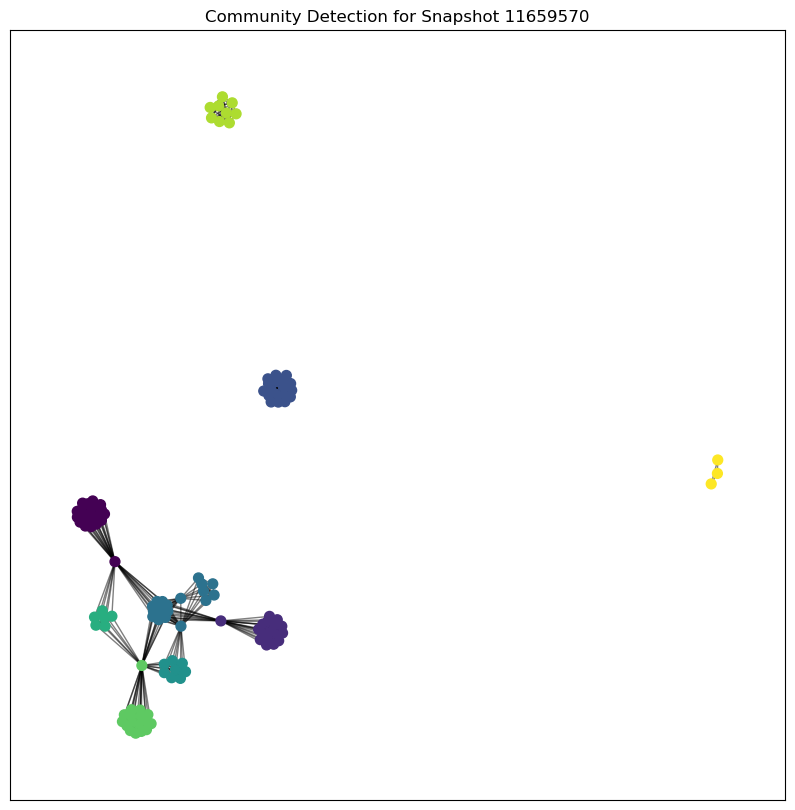

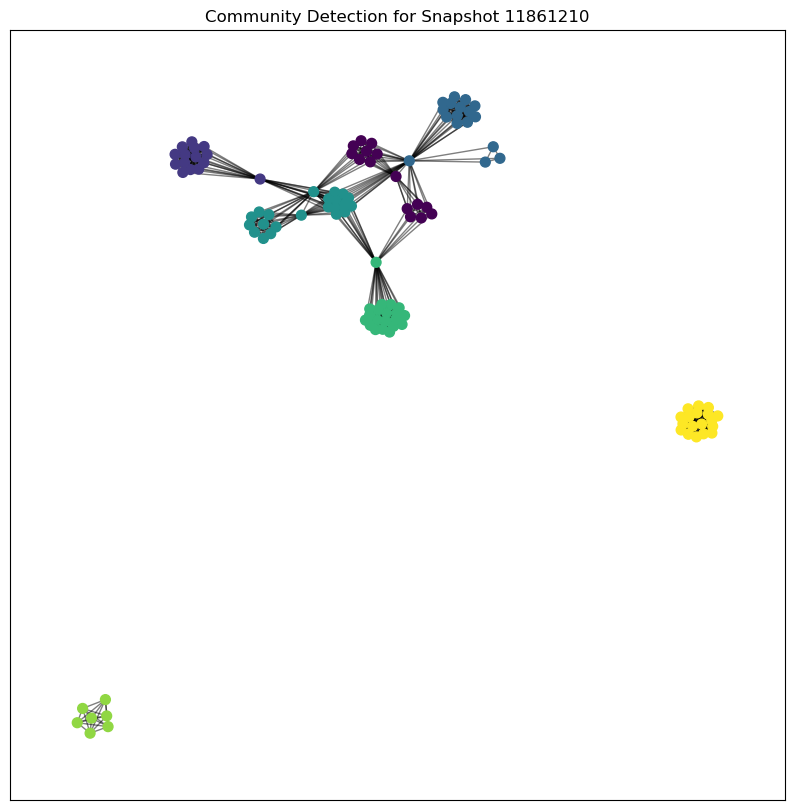

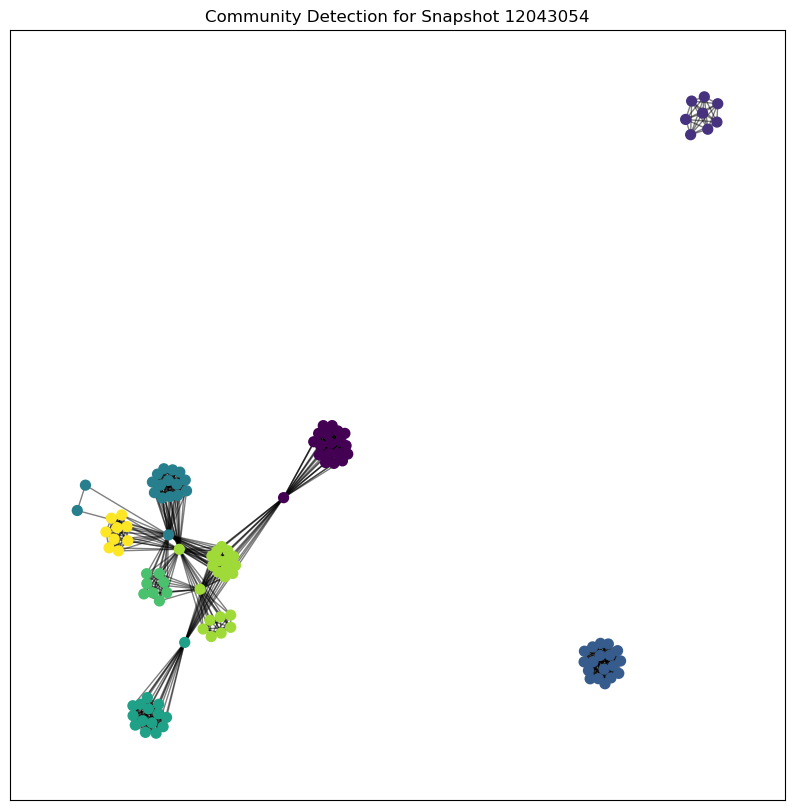

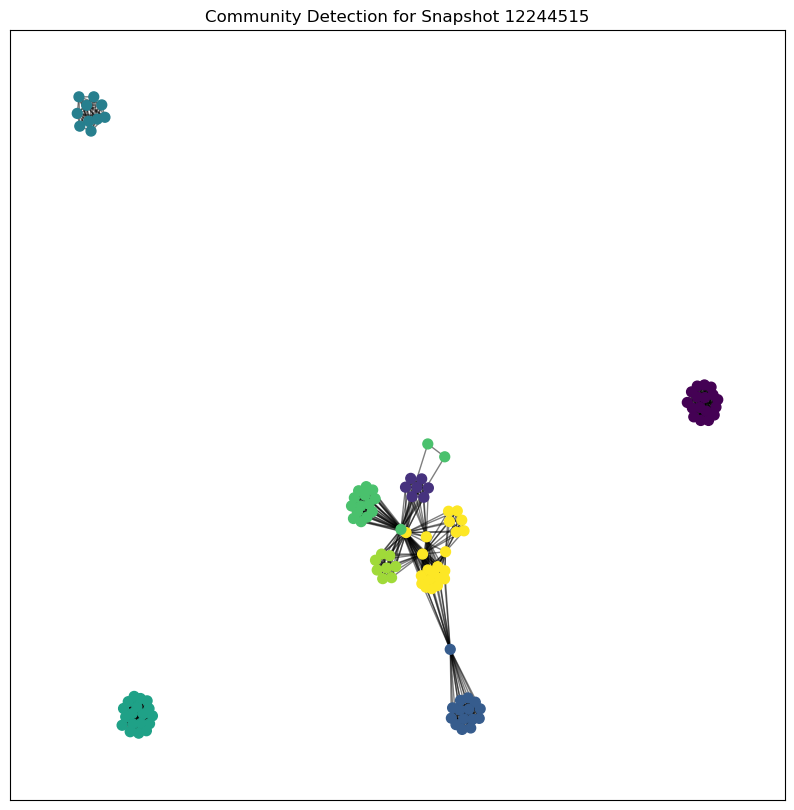

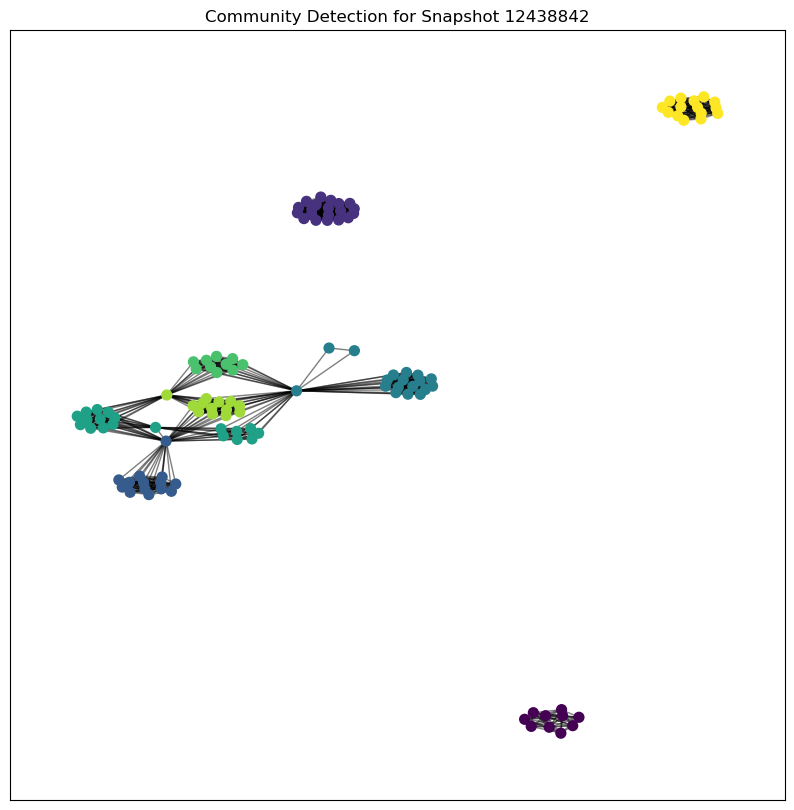

...

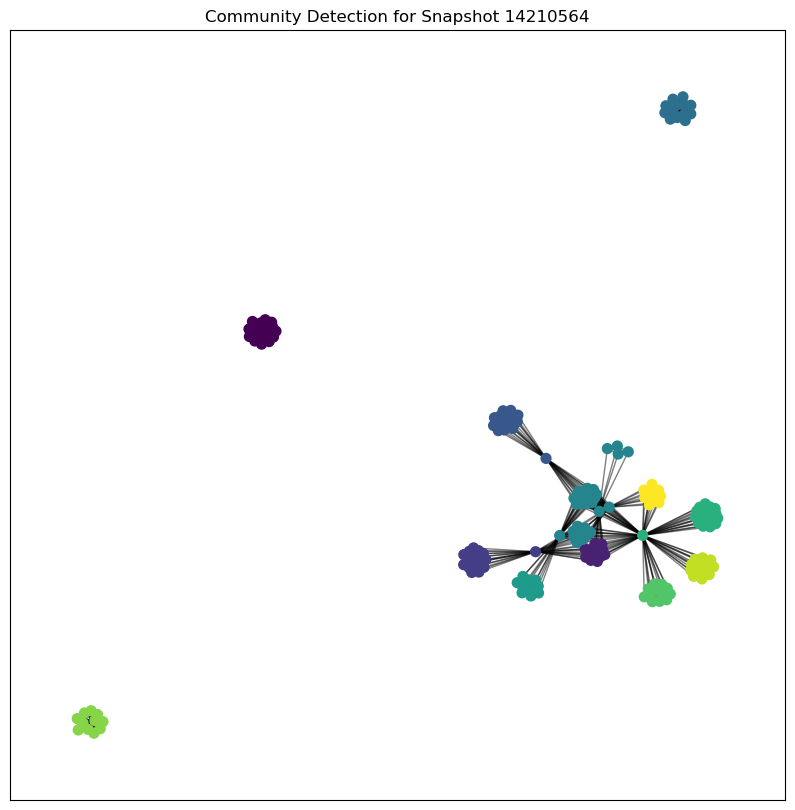

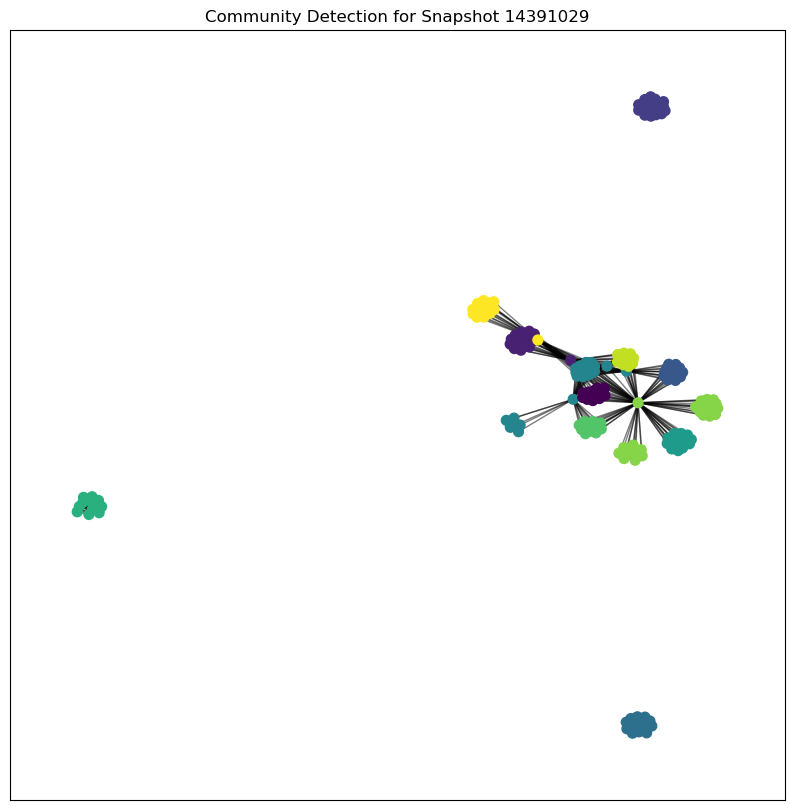

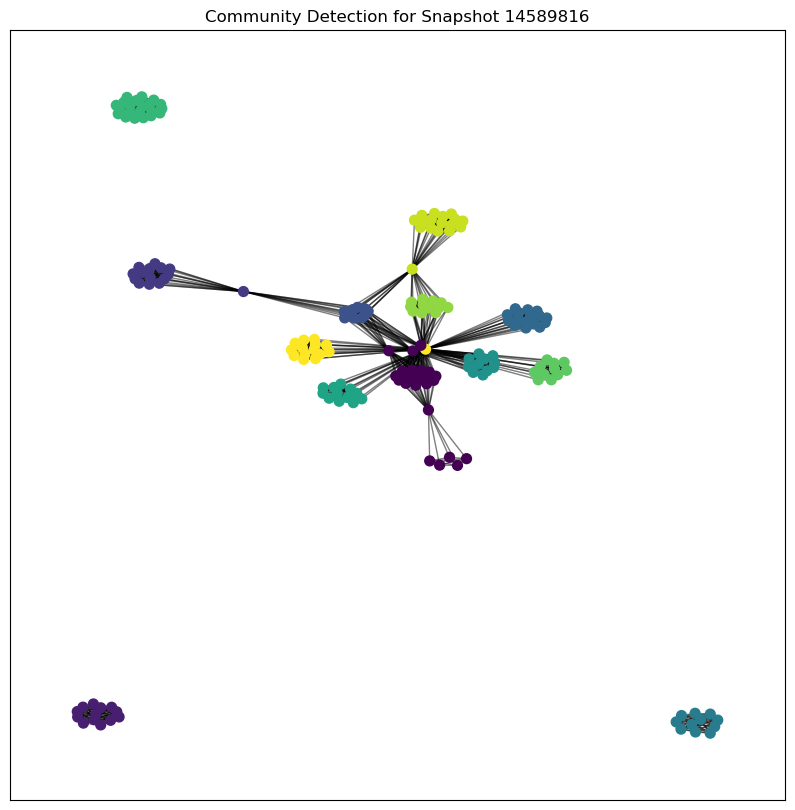

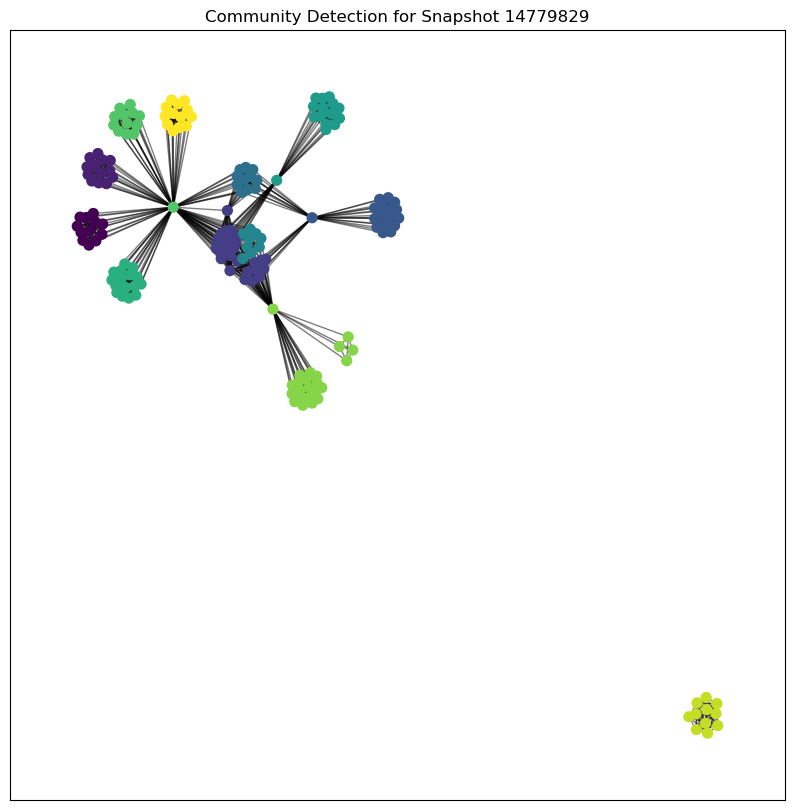

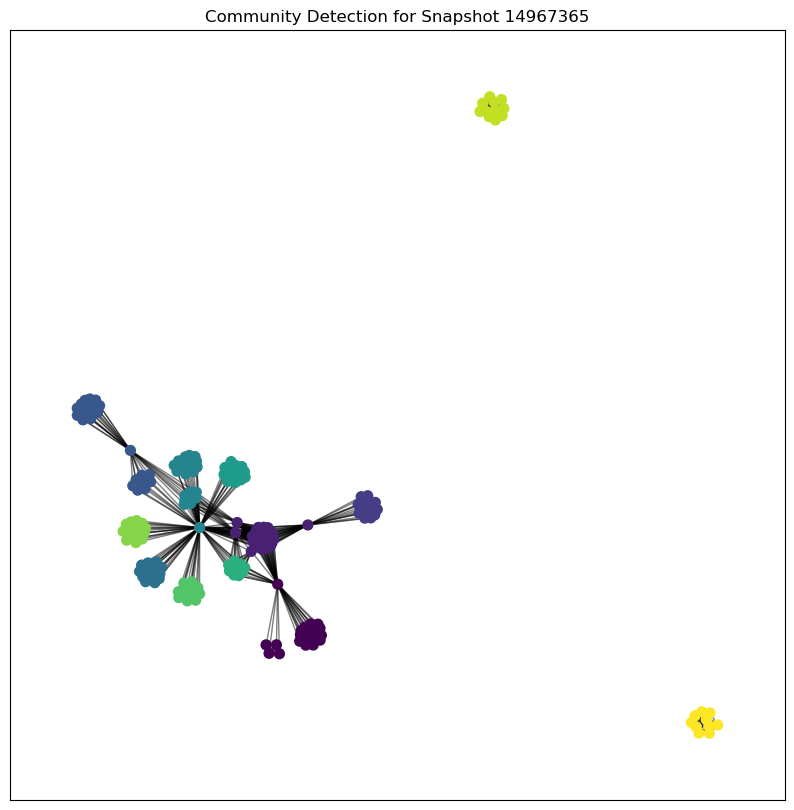

In [46]:
import os
import networkx as nx
import community as community_louvain
import matplotlib.pyplot as plt
from os.path import join

# Step 1: Load the Graph Data
def load_graphs(graph_directory):
    graphs = {}
    for filename in sorted(os.listdir(graph_directory)):
        if filename.endswith('.graphml'):
            graph_path = join(graph_directory, filename)
            G = nx.read_graphml(graph_path)
            snapshot_time = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            graphs[snapshot_time] = G
    return graphs

# Step 2: Apply Louvain Method for Community Detection
def detect_communities(graphs):
    communities = {}
    for snapshot_time, G in graphs.items():
        partition = community_louvain.best_partition(G)
        communities[snapshot_time] = partition
        # Set the community as an attribute for each node
        nx.set_node_attributes(G, partition, 'community')
    return communities

# Step 3: Visualize the Communities
def visualize_communities(graphs, communities):
    for snapshot_time, G in graphs.items():
        partition = communities[snapshot_time]
        pos = nx.spring_layout(G)
        plt.figure(figsize=(10, 10))
        cmap = plt.get_cmap('viridis')
        nx.draw_networkx_nodes(G, pos, node_size=50, cmap=cmap, node_color=list(partition.values()))
        nx.draw_networkx_edges(G, pos, alpha=0.5)
        plt.title(f"Community Detection for Snapshot {snapshot_time}")
        plt.show()

# Path setup
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'

# Load the graphs
graphs = load_graphs(graph_directory)

# Detect communities using Louvain method
communities = detect_communities(graphs)

# Visualize the communities
visualize_communities(graphs, communities)

In [47]:
import json

def save_communities(partition, filename):
    with open(filename, 'w') as file:
        json.dump(partition, file)

def load_communities(filename):
    with open(filename, 'r') as file:
        return json.load(file)

def generate_temporal_communities(graph_directory, enriched_graph_directory, token_info_path, save_directory):
    """
    Detect communities using the Louvain algorithm and adapt them across time.
    Save the community assignments to ensure consistency across runs.
    """
    # Load the token mapping for reference
    df_tokens = pd.read_csv(token_info_path)
    df_tokens['address'] = df_tokens['address'].str.lower()  # Normalize the address
    token_map = df_tokens.set_index('address')['name'].to_dict()

    temporal_community_stats = []
    prev_partition = None

    # Process each graph file in the directory
    for filename in sorted(os.listdir(graph_directory)):
        if filename.endswith('.graphml'):
            # Load the graphs using the correct naming convention
            normal_graph_file = join(graph_directory, filename)
            enriched_graph_file = join(enriched_graph_directory, filename)  # Match names exactly

            # Check if the enriched graph file exists
            if not os.path.exists(enriched_graph_file):
                print(f"Enriched graph file not found: {enriched_graph_file}")
                continue

            G = nx.read_graphml(normal_graph_file)
            enriched_G = nx.read_graphml(enriched_graph_file)

            # Define path to save the community assignments
            community_file = join(save_directory, f"{filename}_communities.json")

            # Load existing community assignments if they exist, otherwise detect and save
            if os.path.exists(community_file):
                curr_partition = load_communities(community_file)
            else:
                # Apply community detection
                curr_partition = community_louvain.best_partition(G)
                save_communities(curr_partition, community_file)

            # Temporal smoothing: match communities with the previous snapshot
            if prev_partition is not None:
                curr_partition = match_communities_across_snapshots(prev_partition, curr_partition, G)

            # Update the graph with new community labels
            nx.set_node_attributes(G, curr_partition, 'community')

            # Label nodes with token names from the enriched graph
            community_token_stats = defaultdict(lambda: defaultdict(int))
            for node, data in G.nodes(data=True):
                community = data['community']
                if node in enriched_G.nodes():
                    token_address = enriched_G.nodes[node].get('token_address', '').lower()
                    token_name = token_map.get(token_address, 'Unknown Token')
                    community_token_stats[community][token_name] += 1

            # Store results for the current snapshot
            snapshot_time = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            for community, tokens in community_token_stats.items():
                for token_name, count in tokens.items():
                    temporal_community_stats.append({
                        'Snapshot': snapshot_time,
                        'Community': community,
                        'Token Name': token_name,
                        'Count': count
                    })

            # Update previous partition for the next snapshot
            prev_partition = curr_partition

    # Convert to DataFrame for better display and analysis
    return pd.DataFrame(temporal_community_stats)


In [48]:
import os
import networkx as nx
import pandas as pd
from os.path import join
from collections import defaultdict
import community as community_louvain

def calculate_modularity(G, partition):
    """Calculate the modularity of a given graph and its partition."""
    return community_louvain.modularity(partition, G)

def match_communities_across_snapshots(prev_partition, curr_partition, G):
    """Match communities from the previous snapshot to the current snapshot based on node overlap."""
    community_map = {}
    for node, curr_comm in curr_partition.items():
        if node in prev_partition:
            prev_comm = prev_partition[node]
            community_map[curr_comm] = prev_comm
        else:
            community_map[curr_comm] = curr_comm
    
    new_partition = {node: community_map[curr_comm] for node, curr_comm in curr_partition.items()}
    return new_partition

def compute_token_distribution(partition, enriched_G, token_map):
    """Associate each node with its token name."""
    node_token_map = {}
    for node, community in partition.items():
        if node in enriched_G:
            token_address = enriched_G.nodes[node].get('token_address', '').lower()
            token_name = token_map.get(token_address, 'Unknown Token')
            node_token_map[node] = token_name
    return node_token_map

def track_communities_and_modularity(graph_directory, enriched_graph_directory, snapshot_dates, token_info_path):
    # Load the token mapping
    df_tokens = pd.read_csv(token_info_path)
    df_tokens['address'] = df_tokens['address'].str.lower()
    token_map = df_tokens.set_index('address')['name'].to_dict()

    # List to store the data for each top node
    community_data = []

    prev_partition = None  # To store the previous partition for temporal matching

    for filename in sorted(os.listdir(graph_directory)):
        if filename.endswith('.graphml'):
            normal_graph_file = join(graph_directory, filename)
            enriched_graph_file = join(enriched_graph_directory, filename)

            # Load the normal and enriched graphs
            G = nx.read_graphml(normal_graph_file)
            enriched_G = nx.read_graphml(enriched_graph_file)

            # Perform community detection
            partition = community_louvain.best_partition(G)

            # If a previous partition exists, match communities across snapshots
            if prev_partition is not None:
                partition = match_communities_across_snapshots(prev_partition, partition, G)

            # Calculate modularity
            modularity_temp = calculate_modularity(G, partition)

            # Update the previous partition for the next iteration
            prev_partition = partition

            # Get token distribution
            token_distribution = compute_token_distribution(partition, enriched_G, token_map)

            # Extract snapshot ID and date
            snapshot_id = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            snapshot_date = snapshot_dates.get(snapshot_id, 'Unknown Date')

            # Store data for each node
            for node, community in partition.items():
                token_name = token_distribution.get(node, 'Unknown Token')
                community_data.append({
                    'Snapshot': snapshot_id,
                    'Date': snapshot_date,
                    'Node': node,
                    'Token': token_name,
                    'Community': community,
                    'Modularity': modularity_temp
                })

    # Convert the collected data to a DataFrame for display
    community_df = pd.DataFrame(community_data)
    
    # Sort the DataFrame by Snapshot and Node
    community_df.sort_values(by=['Snapshot', 'Node'], ascending=[True, True], inplace=True)

    return community_df

# Paths
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'

# Snapshot dates (example)
snapshot_dates = {
    '11659570': '2021-01',
    '11861210': '2021-02',
    '12043054': '2021-03',
    '12244515': '2021-04',
    '12438842': '2021-5',
    '12638919': '2021-6',
    '12831436': '2021-7',
    '13029639': '2021-8',
    '13230157': '2021-9',
    '13422506': '2021-10',
    '13620205': '2021-11',
    '13809597': '2021-12',
    '14009885': '2022-01',
    '14210564': '2022-02',
    '14391029': '2022-03',
    '14589816': '2022-04',
    '14779829': '2022-05',
    '14967365': '2022-06'
}

# Track communities and modularity over time with temporal matching
community_df = track_communities_and_modularity(graph_directory, enriched_graph_directory, snapshot_dates, token_info_path)

# Display the DataFrame
print(community_df.head(50))  # Display the first 50 rows as an example

# Optionally, save the DataFrame to a CSV file
#output_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/community_modularity_temporal.csv'
#community_df.to_csv(output_file, index=False)


     Snapshot     Date                                        Node  \
29   11659570  2021-01  0x000be27f560fef0253cac4da8411611184356549   
20   11659570  2021-01  0x0248374df0bf742386a278430cdf2cf8a95d6dd9   
25   11659570  2021-01  0x05e793ce0c6027323ac150f6d45c2344d28b6019   
112  11659570  2021-01  0x088ee5007c98a9677165d78dd2109ae4a3d04d0c   
62   11659570  2021-01  0x090d4613473dee047c3f2706764f49e0821d256e   
21   11659570  2021-01  0x0a3f6849f78076aefadf113f5bed87720274ddc0   
39   11659570  2021-01  0x0d5d0004383b3e208dcceffb8dae28772d341135   
49   11659570  2021-01  0x0ef1b8a0e726fc3948e15b23993015eb1627f210   
115  11659570  2021-01  0x0f50d31b3eaefd65236dd3736b863cffa4c63c4e   
83   11659570  2021-01  0x0f89d54b02ca570de82f770d33c7b7cf7b3c3394   
28   11659570  2021-01  0x11577a8a5baf1e25b9a2d89f39670f447d75c3cd   
71   11659570  2021-01  0x1597d19659f3de52abd475f7d2314dcca29359bd   
60   11659570  2021-01  0x1a9c8182c09f50c8318d769245bea52c32be35bc   
113  11659570  2021-

# Different approach do not run this code do not change this file

In [ ]:
import os
import networkx as nx
import pandas as pd
from os.path import join
import community as community_louvain

def match_communities_across_snapshots(prev_partition, curr_partition):
    """Match communities from the previous snapshot to the current snapshot based on node overlap."""
    community_map = {}
    for node, curr_comm in curr_partition.items():
        if node in prev_partition:
            prev_comm = prev_partition[node]
            community_map[curr_comm] = prev_comm
        else:
            community_map[curr_comm] = curr_comm
    
    new_partition = {node: community_map[curr_comm] for node, curr_comm in curr_partition.items()}
    return new_partition

def detect_and_save_temporal_communities_with_tokens(graph_directory, enriched_graph_directory, output_file, snapshot_dates, token_info_path):
    community_data = []
    prev_partition = None  # Initialize previous partition for temporal matching
    
    # Load the token mapping
    df_tokens = pd.read_csv(token_info_path)
    df_tokens['address'] = df_tokens['address'].str.lower()
    token_map = df_tokens.set_index('address')['name'].to_dict()

    for filename in sorted(os.listdir(graph_directory)):
        if filename.endswith('.graphml'):
            graph_file = join(graph_directory, filename)
            enriched_graph_file = join(enriched_graph_directory, filename)

            G = nx.read_graphml(graph_file)
            enriched_G = nx.read_graphml(enriched_graph_file)

            # Perform community detection
            curr_partition = community_louvain.best_partition(G)

            # Match communities across snapshots if there's a previous partition
            if prev_partition is not None:
                curr_partition = match_communities_across_snapshots(prev_partition, curr_partition)

            # Save current partition as previous for the next iteration
            prev_partition = curr_partition

            # Extract snapshot ID and date
            snapshot_id = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            snapshot_date = snapshot_dates.get(snapshot_id, 'Unknown Date')

            # Store the community and token data
            for node, community in curr_partition.items():
                token_address = enriched_G.nodes[node].get('token_address', '').lower() if node in enriched_G else None
                token_name = token_map.get(token_address, 'Unknown Token') if token_address else 'Unknown Token'
                
                community_data.append({
                    'Snapshot': snapshot_id,
                    'Date': snapshot_date,
                    'Node': node,
                    'Token': token_name,
                    'Community': community
                })

    # Save the community data to a CSV file
    community_df = pd.DataFrame(community_data)
    community_df.to_csv(output_file, index=False)
    print(f"Temporal community assignments with tokens saved to {output_file}")

# Paths and snapshot dates
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
output_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'

# Snapshot dates (example)
snapshot_dates = {
    '11659570': '2021-01',
    '11861210': '2021-02',
    '12043054': '2021-03',
    '12244515': '2021-04',
    '12438842': '2021-5',
    '12638919': '2021-6',
    '12831436': '2021-7',
    '13029639': '2021-8',
    '13230157': '2021-9',
    '13422506': '2021-10',
    '13620205': '2021-11',
    '13809597': '2021-12',
    '14009885': '2022-01',
    '14210564': '2022-02',
    '14391029': '2022-03',
    '14589816': '2022-04',
    '14779829': '2022-05',
    '14967365': '2022-06'
}

# Run the temporal community detection and save the results with tokens
detect_and_save_temporal_communities_with_tokens(graph_directory, enriched_graph_directory, output_file, snapshot_dates, token_info_path)



In [1084]:
import pandas as pd
import networkx as nx
from os.path import join
from collections import defaultdict

def load_and_apply_saved_communities(graph, community_file, snapshot_id, snapshot_dates):
    """Load and apply the saved community assignments to the graph nodes."""
    # Load the saved community data
    community_df = pd.read_csv(community_file)

    # Ensure that snapshot_id and community_df['Snapshot'] are both strings and stripped of whitespace
    community_df['Snapshot'] = community_df['Snapshot'].astype(str).str.strip()
    snapshot_id = str(snapshot_id).strip()

    # Get the date corresponding to the snapshot_id
    snapshot_date = snapshot_dates.get(snapshot_id, 'Unknown Date')
    
    # Debugging: Print out the snapshot_id, snapshot_date, and a sample of the Snapshot column
    print(f"Filtering for Snapshot ID: {snapshot_id} with Date: {snapshot_date}")
    print("Available Snapshot IDs in the file:", community_df['Snapshot'].unique())

    # Filter the community data for the specific snapshot
    snapshot_communities = community_df[community_df['Snapshot'] == snapshot_id]

    if snapshot_communities.empty:
        print(f"No data found for Snapshot ID: {snapshot_id}")
        return

    # Create a mapping of node to community
    community_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Community']))

    # Apply the community labels to the graph nodes
    for node in graph.nodes():
        graph.nodes[node]['community'] = community_map.get(node, 'Unknown')

def analyze_graph_with_consistent_communities(graph_directory, community_file, snapshot_id, snapshot_dates):
    """Load the graph and apply consistent community assignments."""
    graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
    G = nx.read_graphml(graph_file)

    # Apply saved community assignments
    load_and_apply_saved_communities(G, community_file, snapshot_id, snapshot_dates)

    # Proceed with your analysis
    # For example, you can now analyze token distributions, community modularity, etc.
    # Here you would add the rest of your analysis code...

# Snapshot IDs and corresponding dates
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Example usage
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'
snapshot_id = '11659570'  # Example snapshot ID

analyze_graph_with_consistent_communities(graph_directory, community_file, snapshot_id, snapshot_dates)


Filtering for Snapshot ID: 11659570 with Date: 2021-06
Available Snapshot IDs in the file: ['11659570' '11861210' '12043054' '12244515' '12438842' '12638919'
 '12831436' '13029639' '13230157' '13422506' '13620205' '13809597'
 '14009885' '14210564' '14391029' '14589816' '14779829' '14967365']


# Community analysis

In [1085]:
import pandas as pd
import networkx as nx
from os.path import join
from collections import defaultdict

def load_and_apply_saved_communities(graph, community_file, snapshot_id):
    """Load and apply the saved community assignments to the graph nodes."""
    # Load the saved community data
    community_df = pd.read_csv(community_file)
    community_df['Snapshot'] = community_df['Snapshot'].astype(str).str.strip()
    snapshot_id = str(snapshot_id).strip()

    # Filter the community data for the specific snapshot
    snapshot_communities = community_df[community_df['Snapshot'] == snapshot_id]

    if snapshot_communities.empty:
        print(f"No data found for Snapshot ID: {snapshot_id}")
        return

    # Create a mapping of node (wallet) to community
    community_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Community']))

    # Apply the community labels to the graph nodes
    for node in graph.nodes():
        graph.nodes[node]['community'] = community_map.get(node, 'Unknown')

def calculate_community_sizes(graph):
    """Calculate the size of each community in the graph."""
    community_sizes = defaultdict(int)
    for node, data in graph.nodes(data=True):
        community = data.get('community', 'Unknown')
        community_sizes[community] += 1
    return community_sizes

def analyze_community_sizes_for_snapshot(graph_directory, community_file, snapshot_id):
    """Analyze the community sizes for a specific snapshot."""
    graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
    G = nx.read_graphml(graph_file)

    # Apply saved community assignments
    load_and_apply_saved_communities(G, community_file, snapshot_id)

    # Calculate community sizes
    community_sizes = calculate_community_sizes(G)

    print(f"Community Sizes for Snapshot {snapshot_id}:")
    for community, size in community_sizes.items():
        print(f"Community {community}: {size} wallets")

    return community_sizes

# Paths and snapshot information
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'
snapshot_id = '11659570'  # Specific snapshot ID for analysis

# Analyze community sizes for snapshot 11659570
community_sizes = analyze_community_sizes_for_snapshot(graph_directory, community_file, snapshot_id)



Community Sizes for Snapshot 11659570:
Community 3: 21 wallets
Community 5: 17 wallets
Community 0: 19 wallets
Community 6: 8 wallets
Community 7: 6 wallets
Community 4: 17 wallets
Community 8: 9 wallets
Community 2: 3 wallets
Community 1: 18 wallets


In [1086]:
import pandas as pd
import networkx as nx
from os.path import join
from collections import defaultdict

def load_and_apply_saved_communities(graph, community_file, snapshot_id):
    """Load and apply the saved community assignments to the graph nodes."""
    community_df = pd.read_csv(community_file)
    community_df['Snapshot'] = community_df['Snapshot'].astype(str).str.strip()
    snapshot_id = str(snapshot_id).strip()

    # Filter the community data for the specific snapshot
    snapshot_communities = community_df[community_df['Snapshot'] == snapshot_id]

    if snapshot_communities.empty:
        print(f"No data found for Snapshot ID: {snapshot_id}")
        return

    # Create a mapping of node (wallet) to community
    community_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Community']))
    token_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Token']))

    # Apply the community and token labels to the graph nodes
    for node in graph.nodes():
        graph.nodes[node]['community'] = community_map.get(node, 'Unknown')
        graph.nodes[node]['token'] = token_map.get(node, 'Unknown Token')

def analyze_community_tokens_for_snapshot(graph_directory, community_file, snapshot_id):
    """Analyze the community sizes and tokens for a specific snapshot."""
    graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
    G = nx.read_graphml(graph_file)

    # Apply saved community and token assignments
    load_and_apply_saved_communities(G, community_file, snapshot_id)

    # Analyze community sizes and tokens
    community_data = defaultdict(lambda: defaultdict(int))

    for node, data in G.nodes(data=True):
        community = data.get('community', 'Unknown')
        token = data.get('token', 'Unknown Token')
        community_data[community][token] += 1

    # Print results
    print(f"Community Sizes and Tokens for Snapshot {snapshot_id}:")
    for community, tokens in community_data.items():
        print(f"\nCommunity {community}:")
        total_size = sum(tokens.values())
        print(f"  Total Size: {total_size} wallets")
        for token, count in tokens.items():
            print(f"  Token {token}: {count} wallets")

    return community_data

# Paths and snapshot information
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'
snapshot_id = '11659570'  # Specific snapshot ID for analysis

# Analyze community sizes and tokens for snapshot 11659570
community_tokens = analyze_community_tokens_for_snapshot(graph_directory, community_file, snapshot_id)


Community Sizes and Tokens for Snapshot 11659570:

Community 3:
  Total Size: 21 wallets
  Token Maker: 21 wallets

Community 5:
  Total Size: 17 wallets
  Token Compound: 17 wallets

Community 0:
  Total Size: 19 wallets
  Token Sushi: 7 wallets
  Token Yearn Finance: 11 wallets
  Token Curve: 1 wallets

Community 6:
  Total Size: 8 wallets
  Token Curve: 8 wallets

Community 7:
  Total Size: 6 wallets
  Token Aave: 6 wallets

Community 4:
  Total Size: 17 wallets
  Token Uniswap: 16 wallets
  Token Curve: 1 wallets

Community 8:
  Total Size: 9 wallets
  Token Balancer: 9 wallets

Community 2:
  Total Size: 3 wallets
  Token 1Inch: 3 wallets

Community 1:
  Total Size: 18 wallets
  Token Lido: 18 wallets


In [1087]:
import pandas as pd
import networkx as nx
from os.path import join
from collections import defaultdict

def load_and_apply_saved_communities(graph, community_file, snapshot_id):
    """Load and apply the saved community assignments to the graph nodes."""
    community_df = pd.read_csv(community_file)
    community_df['Snapshot'] = community_df['Snapshot'].astype(str).str.strip()
    snapshot_id = str(snapshot_id).strip()

    # Filter the community data for the specific snapshot
    snapshot_communities = community_df[community_df['Snapshot'] == snapshot_id]

    if snapshot_communities.empty:
        print(f"No data found for Snapshot ID: {snapshot_id}")
        return

    # Create a mapping of node (wallet) to community
    community_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Community']))
    for node in graph.nodes():
        graph.nodes[node]['community'] = community_map.get(node, 'Unknown')

def calculate_community_sizes(graph):
    """Calculate the size of each community in the graph."""
    community_sizes = defaultdict(int)
    for node, data in graph.nodes(data=True):
        community = data.get('community', 'Unknown')
        community_sizes[community] += 1
    return community_sizes

def track_community_growth_over_time(graph_directory, community_file, snapshot_dates):
    """Track the growth of each community across all snapshots."""
    community_size_over_time = defaultdict(lambda: defaultdict(int))

    for snapshot_id in snapshot_dates.keys():
        graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        G = nx.read_graphml(graph_file)

        # Apply saved community assignments
        load_and_apply_saved_communities(G, community_file, snapshot_id)

        # Calculate community sizes for this snapshot
        community_sizes = calculate_community_sizes(G)

        # Store the community sizes with respect to the snapshot date
        snapshot_date = snapshot_dates[snapshot_id]
        for community, size in community_sizes.items():
            community_size_over_time[community][snapshot_date] = size

    return community_size_over_time

def calculate_community_growth(community_size_over_time):
    """Calculate the growth of each community over the entire period."""
    community_growth = {}

    for community, sizes in community_size_over_time.items():
        sorted_dates = sorted(sizes.keys())
        initial_size = sizes[sorted_dates[0]]
        final_size = sizes[sorted_dates[-1]]
        growth = final_size - initial_size
        community_growth[community] = growth

    return community_growth

def find_community_with_max_growth(community_growth):
    """Identify the community with the maximum growth."""
    max_growth_community = max(community_growth, key=community_growth.get)
    max_growth = community_growth[max_growth_community]
    return max_growth_community, max_growth

# Paths and snapshot dates
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Track community growth over the entire period
community_size_over_time = track_community_growth_over_time(graph_directory, community_file, snapshot_dates)

# Calculate the growth of each community
community_growth = calculate_community_growth(community_size_over_time)

# Find the community with the maximum growth
max_growth_community, max_growth = find_community_with_max_growth(community_growth)

# Output the result
print(f"The community that grew the most is Community {max_growth_community} with a growth of {max_growth} wallets.")


The community that grew the most is Community 1 with a growth of 28 wallets.


Available Communities: ['3', '5', '0', '6', '7', '4', '8', '2', '1', '10', '9', '11']


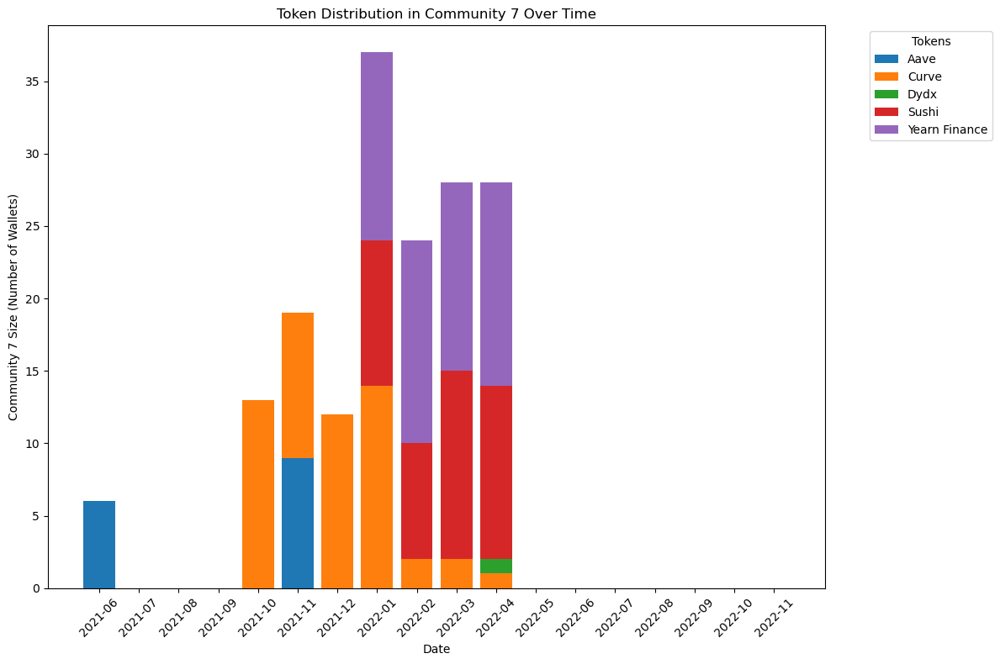

In [1088]:
def plot_token_distribution_over_time(token_distribution_over_time, community_id):
    """Plot the token distribution over time for a specific community."""
    # Check if the community exists in the data
    if community_id not in token_distribution_over_time:
        print(f"No data found for Community {community_id}.")
        return
    
    community_data = token_distribution_over_time[community_id]
    
    # Check if there is any data for the community
    if not community_data:
        print(f"No token distribution data available for Community {community_id}.")
        return

    # Extract dates and tokens for plotting
    dates = sorted(next(iter(community_data.values())).keys())
    tokens = sorted(community_data.keys())

    # Prepare data for plotting
    data = {token: [] for token in tokens}
    for date in dates:
        for token in tokens:
            data[token].append(community_data[token].get(date, 0))

    # Plot the stacked bar chart
    plt.figure(figsize=(12, 8))
    bottom = [0] * len(dates)
    for token in tokens:
        plt.bar(dates, data[token], bottom=bottom, label=token)
        bottom = [i + j for i, j in zip(bottom, data[token])]

    plt.xlabel("Date")
    plt.ylabel(f"Community {community_id} Size (Number of Wallets)")
    plt.title(f"Token Distribution in Community {community_id} Over Time")
    plt.xticks(rotation=45)
    plt.legend(title="Tokens", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

# Check available communities before plotting
print("Available Communities:", list(token_distribution_over_time.keys()))

# Plot the token distribution for a specific community (e.g., Community 1)
plot_token_distribution_over_time(token_distribution_over_time, community_id='7')


Available Communities: ['3', '5', '0', '6', '7', '4', '8', '2', '1', '10', '9', '11']


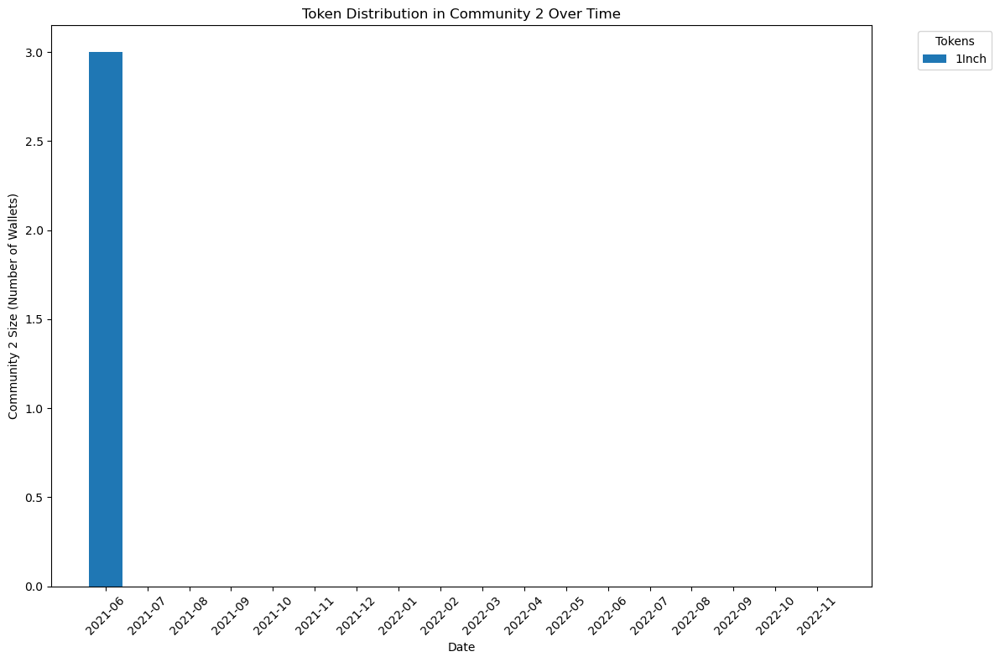

In [1089]:
import pandas as pd
import networkx as nx
from os.path import join
from collections import defaultdict
import matplotlib.pyplot as plt

def load_and_apply_saved_communities(graph, community_file, snapshot_id):
    """Load and apply the saved community assignments to the graph nodes."""
    community_df = pd.read_csv(community_file)
    community_df['Snapshot'] = community_df['Snapshot'].astype(str).str.strip()
    snapshot_id = str(snapshot_id).strip()

    # Convert community IDs to strings to ensure consistency
    community_df['Community'] = community_df['Community'].astype(str)
    
    # Filter the community data for the specific snapshot
    snapshot_communities = community_df[community_df['Snapshot'] == snapshot_id]

    if snapshot_communities.empty:
        print(f"No data found for Snapshot ID: {snapshot_id}")
        return

    # Create a mapping of node (wallet) to community and token
    community_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Community']))
    token_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Token']))
    for node in graph.nodes():
        graph.nodes[node]['community'] = community_map.get(node, 'Unknown')
        graph.nodes[node]['token'] = token_map.get(node, 'Unknown Token')

def analyze_token_distribution_in_communities(graph_directory, community_file, snapshot_dates):
    """Analyze how tokens are distributed within each community across snapshots."""
    token_distribution_over_time = defaultdict(lambda: defaultdict(lambda: defaultdict(int)))
    all_dates = set(snapshot_dates.values())

    for snapshot_id in snapshot_dates.keys():
        graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        G = nx.read_graphml(graph_file)

        # Apply saved community assignments
        load_and_apply_saved_communities(G, community_file, snapshot_id)

        # Analyze token distribution within communities
        for node, data in G.nodes(data=True):
            community = str(data.get('community', 'Unknown'))  # Convert community IDs to strings
            token = data.get('token', 'Unknown Token')
            snapshot_date = snapshot_dates[snapshot_id]
            token_distribution_over_time[community][token][snapshot_date] += 1

        # Ensure every token has an entry for each date, even if it's 0
        for community in token_distribution_over_time:
            for token in token_distribution_over_time[community]:
                for date in all_dates:
                    if date not in token_distribution_over_time[community][token]:
                        token_distribution_over_time[community][token][date] = 0

    return token_distribution_over_time

def plot_token_distribution_over_time(token_distribution_over_time, community_id):
    """Plot the token distribution over time for a specific community."""
    # Check if the community exists in the data
    if community_id not in token_distribution_over_time:
        print(f"No data found for Community {community_id}.")
        return
    
    community_data = token_distribution_over_time[community_id]
    
    # Check if there is any data for the community
    if not community_data:
        print(f"No token distribution data available for Community {community_id}.")
        return

    # Extract dates and tokens for plotting
    all_dates = sorted(set(date for token in community_data.values() for date in token.keys()))
    tokens = sorted(community_data.keys())

    # Prepare data for plotting
    data = {token: [] for token in tokens}
    for date in all_dates:
        for token in tokens:
            data[token].append(community_data[token].get(date, 0))

    # Plot the stacked bar chart
    plt.figure(figsize=(12, 8))
    bottom = [0] * len(all_dates)
    for token in tokens:
        plt.bar(all_dates, data[token], bottom=bottom, label=token)
        bottom = [i + j for i, j in zip(bottom, data[token])]

    plt.xlabel("Date")
    plt.ylabel(f"Community {community_id} Size (Number of Wallets)")
    plt.title(f"Token Distribution in Community {community_id} Over Time")
    plt.xticks(rotation=45)
    plt.legend(title="Tokens", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

# Paths and snapshot dates
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Analyze token distribution in communities
token_distribution_over_time = analyze_token_distribution_in_communities(graph_directory, community_file, snapshot_dates)

# Check available communities before plotting
print("Available Communities:", list(token_distribution_over_time.keys()))

# Plot the token distribution for a specific community (e.g., Community '7')
plot_token_distribution_over_time(token_distribution_over_time, community_id='2')



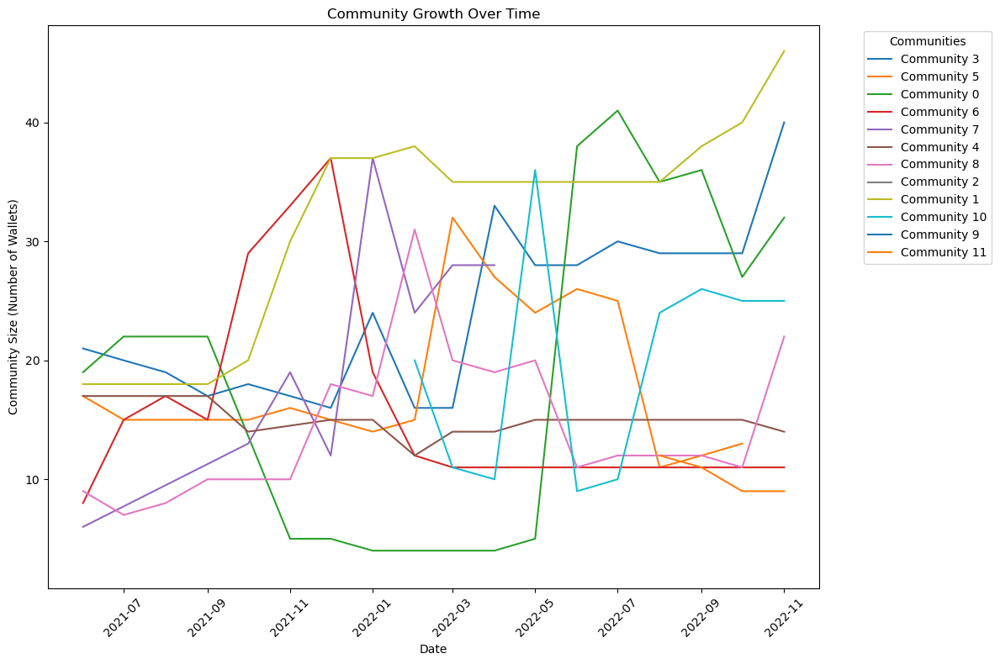

In [1090]:
import pandas as pd
import networkx as nx
from os.path import join
from collections import defaultdict
import matplotlib.pyplot as plt

def load_and_apply_saved_communities(graph, community_file, snapshot_id):
    """Load and apply the saved community assignments to the graph nodes."""
    community_df = pd.read_csv(community_file)
    community_df['Snapshot'] = community_df['Snapshot'].astype(str).str.strip()
    snapshot_id = str(snapshot_id).strip()

    # Convert community IDs to strings to ensure consistency
    community_df['Community'] = community_df['Community'].astype(str)
    
    # Filter the community data for the specific snapshot
    snapshot_communities = community_df[community_df['Snapshot'] == snapshot_id]

    if snapshot_communities.empty:
        print(f"No data found for Snapshot ID: {snapshot_id}")
        return

    # Create a mapping of node (wallet) to community
    community_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Community']))
    for node in graph.nodes():
        graph.nodes[node]['community'] = community_map.get(node, 'Unknown')

def calculate_community_sizes(graph):
    """Calculate the size of each community in the graph."""
    community_sizes = defaultdict(int)
    for node, data in graph.nodes(data=True):
        community = data.get('community', 'Unknown')
        community_sizes[community] += 1
    return community_sizes

def track_community_growth_over_time(graph_directory, community_file, snapshot_dates):
    """Track the growth of each community across all snapshots."""
    community_size_over_time = defaultdict(lambda: defaultdict(int))

    for snapshot_id in snapshot_dates.keys():
        graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        G = nx.read_graphml(graph_file)

        # Apply saved community assignments
        load_and_apply_saved_communities(G, community_file, snapshot_id)

        # Calculate community sizes for this snapshot
        community_sizes = calculate_community_sizes(G)

        # Store the community sizes with respect to the snapshot date
        snapshot_date = pd.to_datetime(snapshot_dates[snapshot_id])  # Convert to datetime
        for community, size in community_sizes.items():
            community_size_over_time[community][snapshot_date] = size

    return community_size_over_time

def plot_community_growth_over_time(community_size_over_time):
    """Plot the community growth over time."""
    plt.figure(figsize=(12, 8))

    for community, sizes in community_size_over_time.items():
        dates = sorted(sizes.keys())  # Ensure dates are sorted
        sizes_over_time = [sizes[date] for date in dates]
        plt.plot(dates, sizes_over_time, label=f'Community {community}')

    plt.xlabel("Date")
    plt.ylabel("Community Size (Number of Wallets)")
    plt.title("Community Growth Over Time")
    plt.xticks(rotation=45)
    plt.legend(title="Communities", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

# Paths and snapshot dates
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Track community growth over the entire period
community_size_over_time = track_community_growth_over_time(graph_directory, community_file, snapshot_dates)

# Plot the community growth over time
plot_community_growth_over_time(community_size_over_time)


In [1091]:
import os
import networkx as nx
import pandas as pd
from os.path import join
from collections import defaultdict

def load_and_apply_saved_communities(graph, community_file, snapshot_id):
    """Load and apply the saved community assignments to the graph nodes."""
    community_df = pd.read_csv(community_file)
    community_df['Snapshot'] = community_df['Snapshot'].astype(str).str.strip()
    snapshot_id = str(snapshot_id).strip()

    # Convert community IDs to strings to ensure consistency
    community_df['Community'] = community_df['Community'].astype(str)
    
    # Filter the community data for the specific snapshot
    snapshot_communities = community_df[community_df['Snapshot'] == snapshot_id]

    if snapshot_communities.empty:
        print(f"No data found for Snapshot ID: {snapshot_id}")
        return

    # Create a mapping of node (wallet) to community
    community_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Community']))
    for node in graph.nodes():
        graph.nodes[node]['community'] = community_map.get(node, 'Unknown')

def apply_token_names(normal_graph, enriched_graph, token_map):
    """Apply token names to the nodes in the normal graph based on the enriched graph."""
    matched_nodes = set(normal_graph.nodes()) & set(enriched_graph.nodes())

    for node in matched_nodes:
        token_address = enriched_graph.nodes[node].get('token_address', 'Unknown Address')
        token_name = token_map.get(token_address, 'Unknown Token')
        normal_graph.nodes[node]['token_name'] = token_name

def calculate_community_metrics(graph):
    """Calculate the size, tokens, and density for each community in the graph."""
    community_metrics = defaultdict(lambda: {'size': 0, 'tokens': set(), 'density': 0.0})

    # Collect the tokens for each community and calculate the size
    for node, data in graph.nodes(data=True):
        community = data.get('community', 'Unknown')
        community_metrics[community]['size'] += 1
        token = data.get('token_name', 'Unknown Token')
        community_metrics[community]['tokens'].add(token)

    # Calculate density for each community
    for community, metrics in community_metrics.items():
        community_nodes = [node for node, data in graph.nodes(data=True) if data.get('community') == community]
        subgraph = graph.subgraph(community_nodes)
        if len(subgraph) > 1:
            metrics['density'] = nx.density(subgraph)
        else:
            metrics['density'] = 0.0  # Density is zero for a single-node community

    return community_metrics

def track_community_metrics_over_time(graph_directory, enriched_graph_directory, community_file, token_map, snapshot_dates):
    """Track the size, tokens, and density of each community across all snapshots."""
    community_metrics_over_time = defaultdict(lambda: {'size': [], 'tokens': set(), 'density': []})

    for snapshot_id in snapshot_dates.keys():
        normal_graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        enriched_graph_file = join(enriched_graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        
        G = nx.read_graphml(normal_graph_file)
        enriched_G = nx.read_graphml(enriched_graph_file)

        # Apply token names
        apply_token_names(G, enriched_G, token_map)

        # Apply saved community assignments
        load_and_apply_saved_communities(G, community_file, snapshot_id)

        # Calculate community metrics for this snapshot
        community_metrics = calculate_community_metrics(G)

        # Store the metrics over time
        for community, metrics in community_metrics.items():
            community_metrics_over_time[community]['size'].append(metrics['size'])
            community_metrics_over_time[community]['tokens'].update(metrics['tokens'])
            community_metrics_over_time[community]['density'].append(metrics['density'])

    return community_metrics_over_time

def calculate_average_metrics_and_list_tokens(community_metrics_over_time):
    """Calculate the average size, token diversity, density, and list all tokens for each community."""
    average_metrics = []

    for community, metrics in community_metrics_over_time.items():
        avg_size = sum(metrics['size']) / len(metrics['size'])
        avg_density = sum(metrics['density']) / len(metrics['density'])
        token_list = ', '.join(sorted(metrics['tokens']))  # List all unique tokens
        
        average_metrics.append({
            'Community': community,
            'Average Size': avg_size,
            'Average Density': avg_density,
            'Tokens': token_list
        })

    return average_metrics

# Paths and snapshot dates
normal_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'
snapshot_dates = {
    '11659570': '2021-01',
    '11861210': '2021-02',
    '12043054': '2021-03',
    '12244515': '2021-04',
    '12438842': '2021-05',
    '12638919': '2021-06',
    '12831436': '2021-07',
    '13029639': '2021-08',
    '13230157': '2021-09',
    '13422506': '2021-10',
    '13620205': '2021-11',
    '13809597': '2021-12',
    '14009885': '2022-01',
    '14210564': '2022-02',
    '14391029': '2022-03',
    '14589816': '2022-04',
    '14779829': '2022-05',
    '14967365': '2022-06'
}

# Load the token information CSV
token_info = pd.read_csv(token_info_path)
token_info['address'] = token_info['address'].str.lower()
token_map = token_info.set_index('address')['name'].to_dict()

# Track community metrics over the entire period
community_metrics_over_time = track_community_metrics_over_time(normal_graph_path, enriched_graph_path, community_file, token_map, snapshot_dates)

# Calculate average metrics and list all tokens for each community
average_metrics = calculate_average_metrics_and_list_tokens(community_metrics_over_time)

# Convert to DataFrame for analysis and export
average_metrics_df = pd.DataFrame(average_metrics)

# Save the DataFrame to a CSV file
output_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/average_community_metrics.csv'
average_metrics_df.to_csv(output_file, index=False)

# Display the DataFrame
print(average_metrics_df)


   Community  Average Size  Average Density  \
0          3     23.888889         0.702924   
1          5     18.058824         0.850709   
2          0     19.117647         0.742033   
3          6     15.777778         0.783529   
4          7     20.875000         0.719091   
5          4     15.058824         0.958910   
6          8     14.388889         0.806835   
7          2      3.000000         1.000000   
8          1     31.555556         0.617418   
9         10     19.600000         0.693770   
10         9      8.000000         1.000000   
11        11     10.250000         1.000000   

                                               Tokens  
0         1Inch, Aura Finance, Compound, Curve, Maker  
1                               Compound, Curve, Dydx  
2   Aave, Balancer, Bitdao, Compound, Convex, Curv...  
3    Aave, Curve, Dydx, Sushi, Uniswap, Yearn Finance  
4             Aave, Curve, Dydx, Sushi, Yearn Finance  
5          1Inch, Aave, Bitdao, Curve, Sushi, Uniswa

In [1092]:
def track_community_metrics_over_time(graph_directory, enriched_graph_directory, community_file, token_map, snapshot_dates):
    """Track the size, tokens, density, and presence (age) of each community across all snapshots."""
    community_metrics_over_time = defaultdict(lambda: {'size': [], 'tokens': set(), 'density': [], 'presence': 0})

    for snapshot_id in snapshot_dates.keys():
        normal_graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        enriched_graph_file = join(enriched_graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        
        G = nx.read_graphml(normal_graph_file)
        enriched_G = nx.read_graphml(enriched_graph_file)

        # Apply token names
        apply_token_names(G, enriched_G, token_map)

        # Apply saved community assignments
        load_and_apply_saved_communities(G, community_file, snapshot_id)

        # Calculate community metrics for this snapshot
        community_metrics = calculate_community_metrics(G)

        # Store the metrics over time
        for community, metrics in community_metrics.items():
            community_metrics_over_time[community]['size'].append(metrics['size'])
            community_metrics_over_time[community]['tokens'].update(metrics['tokens'])
            community_metrics_over_time[community]['density'].append(metrics['density'])
            community_metrics_over_time[community]['presence'] += 1  # Increment the presence count

    return community_metrics_over_time


In [1093]:
def calculate_average_metrics_and_list_tokens(community_metrics_over_time):
    """Calculate the average size, token diversity, density, community age, and list all tokens for each community."""
    average_metrics = []

    for community, metrics in community_metrics_over_time.items():
        avg_size = sum(metrics['size']) / len(metrics['size'])
        avg_density = sum(metrics['density']) / len(metrics['density'])
        token_list = ', '.join(sorted(metrics['tokens']))  # List all unique tokens
        community_age = metrics['presence']  # The number of snapshots the community was present

        average_metrics.append({
            'Community': community,
            'Average Size': avg_size,
            'Average Density': avg_density,
            'Tokens': token_list,
            'Community Age': community_age  # Add community age to the metrics
        })

    return average_metrics


In [1094]:
# Track community metrics over the entire period
community_metrics_over_time = track_community_metrics_over_time(normal_graph_path, enriched_graph_path, community_file, token_map, snapshot_dates)

# Calculate average metrics, including community age, and list all tokens for each community
average_metrics = calculate_average_metrics_and_list_tokens(community_metrics_over_time)

# Convert to DataFrame for analysis
average_metrics_df = pd.DataFrame(average_metrics)

# Ensure the 'Community' column is treated as a numeric type, and sort the DataFrame by it
average_metrics_df['Community'] = pd.to_numeric(average_metrics_df['Community'])
average_metrics_df = average_metrics_df.sort_values(by='Community').reset_index(drop=True)

# Save the DataFrame to a CSV file
output_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/average_community_metrics_with_age.csv'
average_metrics_df.to_csv(output_file, index=False)

# Display the DataFrame
print(average_metrics_df)


    Community  Average Size  Average Density  \
0           0     19.117647         0.742033   
1           1     31.555556         0.617418   
2           2      3.000000         1.000000   
3           3     23.888889         0.702924   
4           4     15.058824         0.958910   
5           5     18.058824         0.850709   
6           6     15.777778         0.783529   
7           7     20.875000         0.719091   
8           8     14.388889         0.806835   
9           9      8.000000         1.000000   
10         10     19.600000         0.693770   
11         11     10.250000         1.000000   

                                               Tokens  Community Age  
0   Aave, Balancer, Bitdao, Compound, Convex, Curv...             17  
1      Aave, Balancer, Convex, Instadapp, Lido, Sushi             18  
2                                               1Inch              1  
3         1Inch, Aura Finance, Compound, Curve, Maker             18  
4          1Inch, Aa

# Gini

In [1095]:
import os
import networkx as nx
import pandas as pd
from os.path import join
from collections import defaultdict, Counter

def track_community_metrics_over_time(graph_directory, enriched_graph_directory, community_file, token_map, snapshot_dates):
    """Track the size, tokens, density, and presence (age) of each community across all snapshots."""
    community_metrics_over_time = defaultdict(lambda: {'size': [], 'tokens': Counter(), 'density': [], 'presence': 0})

    for snapshot_id in snapshot_dates.keys():
        normal_graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        enriched_graph_file = join(enriched_graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        
        G = nx.read_graphml(normal_graph_file)
        enriched_G = nx.read_graphml(enriched_graph_file)

        # Apply token names
        apply_token_names(G, enriched_G, token_map)

        # Apply saved community assignments
        load_and_apply_saved_communities(G, community_file, snapshot_id)

        # Calculate community metrics for this snapshot
        community_metrics = calculate_community_metrics(G)

        # Store the metrics over time
        for community, metrics in community_metrics.items():
            community_metrics_over_time[community]['size'].append(metrics['size'])
            community_metrics_over_time[community]['tokens'].update(Counter(metrics['tokens']))  # Track token counts
            community_metrics_over_time[community]['density'].append(metrics['density'])
            community_metrics_over_time[community]['presence'] += 1  # Increment the presence count

    return community_metrics_over_time

def calculate_average_metrics_and_list_tokens(community_metrics_over_time):
    """Calculate the average size, token diversity, density, community age, and list all tokens for each community."""
    average_metrics = []

    for community, metrics in community_metrics_over_time.items():
        avg_size = sum(metrics['size']) / len(metrics['size'])
        avg_density = sum(metrics['density']) / len(metrics['density'])
        
        # Format token concentration as "token_name (count)"
        token_list = ', '.join([f"{token} ({count})" for token, count in metrics['tokens'].items()])
        community_age = metrics['presence']  # The number of snapshots the community was present

        average_metrics.append({
            'Community': community,
            'Average Size': avg_size,
            'Average Density': avg_density,
            'Tokens': token_list,
            'Community Age': community_age  # Add community age to the metrics
        })

    return average_metrics

# Track community metrics over the entire period
community_metrics_over_time = track_community_metrics_over_time(normal_graph_path, enriched_graph_path, community_file, token_map, snapshot_dates)

# Calculate average metrics, including community age, and list all tokens for each community
average_metrics = calculate_average_metrics_and_list_tokens(community_metrics_over_time)

# Convert to DataFrame for analysis
average_metrics_df = pd.DataFrame(average_metrics)

# Ensure the 'Community' column is treated as a numeric type, and sort the DataFrame by it
average_metrics_df['Community'] = pd.to_numeric(average_metrics_df['Community'])
average_metrics_df = average_metrics_df.sort_values(by='Community').reset_index(drop=True)

# Display the DataFrame to confirm the correct calculation
print(average_metrics_df)

# Optionally save the DataFrame to a CSV file
output_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/average_community_metrics_with_token_concentration.csv'
average_metrics_df.to_csv(output_file, index=False)


    Community  Average Size  Average Density  \
0           0     19.117647         0.742033   
1           1     31.555556         0.617418   
2           2      3.000000         1.000000   
3           3     23.888889         0.702924   
4           4     15.058824         0.958910   
5           5     18.058824         0.850709   
6           6     15.777778         0.783529   
7           7     20.875000         0.719091   
8           8     14.388889         0.806835   
9           9      8.000000         1.000000   
10         10     19.600000         0.693770   
11         11     10.250000         1.000000   

                                               Tokens  Community Age  
0   Yearn Finance (10), Sushi (7), Curve (6), Aave...             17  
1   Lido (18), Instadapp (13), Balancer (6), Aave ...             18  
2                                           1Inch (1)              1  
3   Maker (18), Curve (5), 1Inch (12), Compound (2...             18  
4   Curve (5), Unisw

In [1126]:
import os
import networkx as nx
import pandas as pd
from os.path import join
from collections import defaultdict
import numpy as np

def gini_coefficient(x):
    """Calculate the Gini coefficient of a numpy array."""
    diffsum = 0
    for i, xi in enumerate(x[:-1], 1):
        diffsum += np.sum(np.abs(xi - x[i:]))
    return diffsum / (len(x) ** 2 * np.mean(x))

def track_community_metrics_over_time(graph_directory, enriched_graph_directory, community_file, token_map, snapshot_dates):
    """Track the size, tokens, density, and presence (age) of each community across all snapshots."""
    community_metrics_over_time = defaultdict(lambda: {'size': [], 'tokens': defaultdict(int), 'density': [], 'presence': 0})

    for snapshot_id in snapshot_dates.keys():
        normal_graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        enriched_graph_file = join(enriched_graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        
        G = nx.read_graphml(normal_graph_file)
        enriched_G = nx.read_graphml(enriched_graph_file)

        # Apply token names
        apply_token_names(G, enriched_G, token_map)

        # Apply saved community assignments
        load_and_apply_saved_communities(G, community_file, snapshot_id)

        # Calculate community metrics for this snapshot
        community_metrics = calculate_community_metrics(G)

        # Store the metrics over time
        for community, metrics in community_metrics.items():
            community_metrics_over_time[community]['size'].append(metrics['size'])
            for token in metrics['tokens']:
                community_metrics_over_time[community]['tokens'][token] += metrics['tokens'][token]
            community_metrics_over_time[community]['density'].append(metrics['density'])
            community_metrics_over_time[community]['presence'] += 1  # Increment the presence count

    return community_metrics_over_time

def calculate_average_metrics_and_list_tokens(community_metrics_over_time):
    """Calculate the average size, token diversity, density, community age, and list all tokens for each community."""
    average_metrics = []

    for community, metrics in community_metrics_over_time.items():
        avg_size = sum(metrics['size']) / len(metrics['size'])
        avg_density = sum(metrics['density']) / len(metrics['density'])
        
        # Calculate the Gini coefficient for token concentration
        token_counts = np.array(list(metrics['tokens'].values()))
        gini = gini_coefficient(token_counts)
        
        token_list = ', '.join([f"{token} ({count})" for token, count in sorted(metrics['tokens'].items())])
        community_age = metrics['presence']  # The number of snapshots the community was present

        average_metrics.append({
            'Community': community,
            'Average Size': avg_size,
            'Average Density': avg_density,
            'Tokens': token_list,
            'Gini Coefficient': gini,
            'Community Age': community_age  # Add community age to the metrics
        })

    return average_metrics

def apply_token_names(normal_graph, enriched_graph, token_map):
    """Apply token names to the nodes in the normal graph based on the enriched graph."""
    for node in normal_graph.nodes():
        token_address = enriched_graph.nodes[node].get('token_address', '').lower()
        token_name = token_map.get(token_address, 'Unknown Token')
        normal_graph.nodes[node]['token_name'] = token_name

def load_and_apply_saved_communities(graph, community_file, snapshot_id):
    """Load and apply the saved community assignments to the graph nodes."""
    community_df = pd.read_csv(community_file)
    community_df['Snapshot'] = community_df['Snapshot'].astype(str).str.strip()
    snapshot_id = str(snapshot_id).strip()

    snapshot_communities = community_df[community_df['Snapshot'] == snapshot_id]
    if snapshot_communities.empty:
        print(f"No data found for Snapshot ID: {snapshot_id}")
        return

    community_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Community']))
    
    for node in graph.nodes():
        graph.nodes[node]['community'] = community_map.get(node, 'Unknown')

def calculate_community_metrics(graph):
    """Calculate the size, tokens, and density for each community in the graph."""
    community_metrics = defaultdict(lambda: {'size': 0, 'tokens': defaultdict(int), 'density': 0.0})

    # Collect the tokens for each community and calculate the size
    for node, data in graph.nodes(data=True):
        community = data.get('community', 'Unknown')
        community_metrics[community]['size'] += 1
        token = data.get('token_name', 'Unknown Token')
        community_metrics[community]['tokens'][token] += 1

    # Calculate density for each community
    for community, metrics in community_metrics.items():
        community_nodes = [node for node, data in graph.nodes(data=True) if data.get('community') == community]
        subgraph = graph.subgraph(community_nodes)
        if len(subgraph) > 1:
            metrics['density'] = nx.density(subgraph)
        else:
            metrics['density'] = 0.0  # Density is zero for a single-node community

    return community_metrics

# Paths and snapshot information
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Load the token information CSV
token_info = pd.read_csv(token_info_path)
token_info['address'] = token_info['address'].str.lower()
token_map = token_info.set_index('address')['name'].to_dict()

# Track community metrics over the entire period
community_metrics_over_time = track_community_metrics_over_time(graph_directory, enriched_graph_directory, community_file, token_map, snapshot_dates)

# Calculate average metrics, including community age, and list all tokens for each community
average_metrics = calculate_average_metrics_and_list_tokens(community_metrics_over_time)

# Convert to DataFrame for analysis
average_metrics_df = pd.DataFrame(average_metrics)

# Ensure the 'Community' column is treated as a numeric type, and sort the DataFrame by it
average_metrics_df['Community'] = pd.to_numeric(average_metrics_df['Community'])
average_metrics_df = average_metrics_df.sort_values(by='Community').reset_index(drop=True)

# Display the DataFrame to confirm the correct calculation
print(average_metrics_df)

# Save the DataFrame to a CSV file if needed
output_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/average_community_metrics_with_gini.csv'
average_metrics_df.to_csv(output_file, index=False)


    Community  Average Size  Average Density  \
0           0     19.117647         0.742033   
1           1     31.555556         0.617418   
2           2      3.000000         1.000000   
3           3     23.888889         0.702924   
4           4     15.058824         0.958910   
5           5     18.058824         0.850709   
6           6     15.777778         0.783529   
7           7     20.875000         0.719091   
8           8     14.388889         0.806835   
9           9      8.000000         1.000000   
10         10     19.600000         0.693770   
11         11     10.250000         1.000000   

                                               Tokens  Gini Coefficient  \
0   Aave (59), Balancer (4), Bitdao (1), Compound ...          0.592692   
1   Aave (9), Balancer (6), Convex (8), Instadapp ...          0.669601   
2                                           1Inch (3)          0.000000   
3   1Inch (138), Aura Finance (10), Compound (2), ...          0.631628   


In [1128]:
import os
import networkx as nx
import pandas as pd
from os.path import join
from collections import defaultdict
import numpy as np

def gini_coefficient(x):
    """Calculate the Gini coefficient of a numpy array."""
    diffsum = 0
    for i, xi in enumerate(x[:-1], 1):
        diffsum += np.sum(np.abs(xi - x[i:]))
    return diffsum / (len(x) ** 2 * np.mean(x))

def track_community_metrics_over_time(graph_directory, enriched_graph_directory, community_file, token_map, snapshot_dates):
    """Track the size, tokens, density, and presence (age) of each community across all snapshots."""
    community_metrics_over_time = defaultdict(lambda: {'size': [], 'tokens': defaultdict(int), 'density': [], 'presence': 0})

    for snapshot_id in snapshot_dates.keys():
        normal_graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        enriched_graph_file = join(enriched_graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        
        G = nx.read_graphml(normal_graph_file)
        enriched_G = nx.read_graphml(enriched_graph_file)

        # Apply token names
        apply_token_names(G, enriched_G, token_map)

        # Apply saved community assignments
        load_and_apply_saved_communities(G, community_file, snapshot_id)

        # Calculate community metrics for this snapshot
        community_metrics = calculate_community_metrics(G)

        # Store the metrics over time
        for community, metrics in community_metrics.items():
            community_metrics_over_time[community]['size'].append(metrics['size'])
            for token in metrics['tokens']:
                community_metrics_over_time[community]['tokens'][token] += metrics['tokens'][token]
            community_metrics_over_time[community]['density'].append(metrics['density'])
            community_metrics_over_time[community]['presence'] += 1  # Increment the presence count

    return community_metrics_over_time

def calculate_average_metrics_and_list_tokens(community_metrics_over_time):
    """Calculate the average size, token diversity, density, community age, and list all tokens for each community."""
    average_metrics = []

    for community, metrics in community_metrics_over_time.items():
        avg_size = sum(metrics['size']) / len(metrics['size'])
        avg_density = sum(metrics['density']) / len(metrics['density'])
        
        # Calculate the Gini coefficient for token concentration
        token_counts = np.array(list(metrics['tokens'].values()))
        gini = gini_coefficient(token_counts)
        
        # Sort tokens by count in descending order and then create a token list
        sorted_tokens = sorted(metrics['tokens'].items(), key=lambda x: x[1], reverse=True)
        token_list = ', '.join([f"{token} ({count})" for token, count in sorted_tokens])
        
        community_age = metrics['presence']  # The number of snapshots the community was present

        average_metrics.append({
            'Community': community,
            'Average Size': avg_size,
            'Average Density': avg_density,
            'Tokens': token_list,
            'Gini Coefficient': gini,
            'Community Age': community_age  # Add community age to the metrics
        })

    return average_metrics

def apply_token_names(normal_graph, enriched_graph, token_map):
    """Apply token names to the nodes in the normal graph based on the enriched graph."""
    for node in normal_graph.nodes():
        token_address = enriched_graph.nodes[node].get('token_address', '').lower()
        token_name = token_map.get(token_address, 'Unknown Token')
        normal_graph.nodes[node]['token_name'] = token_name

def load_and_apply_saved_communities(graph, community_file, snapshot_id):
    """Load and apply the saved community assignments to the graph nodes."""
    community_df = pd.read_csv(community_file)
    community_df['Snapshot'] = community_df['Snapshot'].astype(str).str.strip()
    snapshot_id = str(snapshot_id).strip()

    snapshot_communities = community_df[community_df['Snapshot'] == snapshot_id]
    if snapshot_communities.empty:
        print(f"No data found for Snapshot ID: {snapshot_id}")
        return

    community_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Community']))
    
    for node in graph.nodes():
        graph.nodes[node]['community'] = community_map.get(node, 'Unknown')

def calculate_community_metrics(graph):
    """Calculate the size, tokens, and density for each community in the graph."""
    community_metrics = defaultdict(lambda: {'size': 0, 'tokens': defaultdict(int), 'density': 0.0})

    # Collect the tokens for each community and calculate the size
    for node, data in graph.nodes(data=True):
        community = data.get('community', 'Unknown')
        community_metrics[community]['size'] += 1
        token = data.get('token_name', 'Unknown Token')
        community_metrics[community]['tokens'][token] += 1

    # Calculate density for each community
    for community, metrics in community_metrics.items():
        community_nodes = [node for node, data in graph.nodes(data=True) if data.get('community') == community]
        subgraph = graph.subgraph(community_nodes)
        if len(subgraph) > 1:
            metrics['density'] = nx.density(subgraph)
        else:
            metrics['density'] = 0.0  # Density is zero for a single-node community

    return community_metrics

# Paths and snapshot information
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Load the token information CSV
token_info = pd.read_csv(token_info_path)
token_info['address'] = token_info['address'].str.lower()
token_map = token_info.set_index('address')['name'].to_dict()

# Track community metrics over the entire period
community_metrics_over_time = track_community_metrics_over_time(graph_directory, enriched_graph_directory, community_file, token_map, snapshot_dates)

# Calculate average metrics, including community age, and list all tokens for each community
average_metrics = calculate_average_metrics_and_list_tokens(community_metrics_over_time)

# Convert to DataFrame for analysis
average_metrics_df = pd.DataFrame(average_metrics)

# Ensure the 'Community' column is treated as a numeric type, and sort the DataFrame by it
average_metrics_df['Community'] = pd.to_numeric(average_metrics_df['Community'])
average_metrics_df = average_metrics_df.sort_values(by='Community').reset_index(drop=True)

# Display the DataFrame to confirm the correct calculation
print(average_metrics_df)

# Save the DataFrame to a CSV file if needed
output_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/average_community_metrics_with_gini.csv'
average_metrics_df.to_csv(output_file, index=False)


    Community  Average Size  Average Density  \
0           0     19.117647         0.742033   
1           1     31.555556         0.617418   
2           2      3.000000         1.000000   
3           3     23.888889         0.702924   
4           4     15.058824         0.958910   
5           5     18.058824         0.850709   
6           6     15.777778         0.783529   
7           7     20.875000         0.719091   
8           8     14.388889         0.806835   
9           9      8.000000         1.000000   
10         10     19.600000         0.693770   
11         11     10.250000         1.000000   

                                               Tokens  Gini Coefficient  \
0   Yearn Finance (154), Aave (59), Convex (50), S...          0.592692   
1   Lido (336), Instadapp (208), Aave (9), Convex ...          0.669601   
2                                           1Inch (3)          0.000000   
3   Maker (275), 1Inch (138), Aura Finance (10), C...          0.631628   


In [1129]:
def track_community_metrics_over_time(graph_directory, enriched_graph_directory, community_file, token_map, snapshot_dates):
    """Track the size, tokens, density, and presence (age) of each community across all snapshots."""
    community_metrics_over_time = defaultdict(lambda: {'size': [], 'tokens': defaultdict(int), 'density': [], 'presence': 0})
    total_tokens_over_time = defaultdict(int)

    for snapshot_id in snapshot_dates.keys():
        normal_graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        enriched_graph_file = join(enriched_graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        
        G = nx.read_graphml(normal_graph_file)
        enriched_G = nx.read_graphml(enriched_graph_file)

        # Apply token names
        apply_token_names(G, enriched_G, token_map)

        # Apply saved community assignments
        load_and_apply_saved_communities(G, community_file, snapshot_id)

        # Calculate community metrics for this snapshot
        community_metrics, total_tokens = calculate_community_metrics(G)

        # Store the metrics over time
        for community, metrics in community_metrics.items():
            community_metrics_over_time[community]['size'].append(metrics['size'])
            for token, count in metrics['tokens'].items():
                community_metrics_over_time[community]['tokens'][token] += count
                total_tokens_over_time[token] += count
            community_metrics_over_time[community]['density'].append(metrics['density'])
            community_metrics_over_time[community]['presence'] += 1  # Increment the presence count

    print("Total Tokens Over Time:", total_tokens_over_time)
    return community_metrics_over_time, total_tokens_over_time

def calculate_average_metrics_and_list_tokens(community_metrics_over_time, total_tokens_over_time):
    """Calculate the average size, token diversity, density, community age, and list all tokens for each community."""
    average_metrics = []

    for community, metrics in community_metrics_over_time.items():
        avg_size = sum(metrics['size']) / len(metrics['size'])
        avg_density = sum(metrics['density']) / len(metrics['density'])
        
        # Calculate the Gini coefficient for token concentration
        token_counts = np.array(list(metrics['tokens'].values()))
        gini = gini_coefficient(token_counts)
        
        # Calculate token percentages and sort by percentage
        token_percentages = {token: (count / total_tokens_over_time[token]) * 100 
                             for token, count in metrics['tokens'].items()}
        sorted_tokens = sorted(token_percentages.items(), key=lambda x: x[1], reverse=True)
        token_list = ', '.join([f"{token} ({percentage:.2f}%)" for token, percentage in sorted_tokens])
        
        community_age = metrics['presence']  # The number of snapshots the community was present

        print(f"Community {community} - Tokens and Percentages: {token_list}")

        average_metrics.append({
            'Community': community,
            'Average Size': avg_size,
            'Average Density': avg_density,
            'Tokens': token_list,
            'Gini Coefficient': gini,
            'Community Age': community_age  # Add community age to the metrics
        })

    return average_metrics

def calculate_community_metrics(graph):
    """Calculate the size, tokens, and density for each community in the graph."""
    community_metrics = defaultdict(lambda: {'size': 0, 'tokens': defaultdict(int), 'density': 0.0})
    total_tokens = defaultdict(int)

    # Collect the tokens for each community and calculate the size
    for node, data in graph.nodes(data=True):
        community = data.get('community', 'Unknown')
        community_metrics[community]['size'] += 1
        token = data.get('token_name', 'Unknown Token')
        community_metrics[community]['tokens'][token] += 1
        total_tokens[token] += 1

    # Calculate density for each community
    for community, metrics in community_metrics.items():
        community_nodes = [node for node, data in graph.nodes(data=True) if data.get('community') == community]
        subgraph = graph.subgraph(community_nodes)
        if len(subgraph) > 1:
            metrics['density'] = nx.density(subgraph)
        else:
            metrics['density'] = 0.0  # Density is zero for a single-node community

    return community_metrics, total_tokens

# Paths and snapshot information
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Load the token information CSV
token_info = pd.read_csv(token_info_path)
token_info['address'] = token_info['address'].str.lower()
token_map = token_info.set_index('address')['name'].to_dict()

# Track community metrics over the entire period
community_metrics_over_time, total_tokens_over_time = track_community_metrics_over_time(graph_directory, enriched_graph_directory, community_file, token_map, snapshot_dates)

# Calculate average metrics, including community age, and list all tokens for each community
average_metrics = calculate_average_metrics_and_list_tokens(community_metrics_over_time, total_tokens_over_time)

# Convert to DataFrame for analysis
average_metrics_df = pd.DataFrame(average_metrics)

# Ensure the 'Community' column is treated as a numeric type, and sort the DataFrame by it
average_metrics_df['Community'] = pd.to_numeric(average_metrics_df['Community'])
average_metrics_df = average_metrics_df.sort_values(by='Community').reset_index(drop=True)

# Display the DataFrame to confirm the correct calculation
print(average_metrics_df)

# Save the DataFrame to a CSV file if needed
output_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/average_community_metrics_with_gini.csv'
average_metrics_df.to_csv(output_file, index=False)


Total Tokens Over Time: defaultdict(<class 'int'>, {'Maker': 275, 'Compound': 257, 'Sushi': 172, 'Yearn Finance': 254, 'Curve': 220, 'Aave': 168, 'Uniswap': 222, 'Balancer': 191, '1Inch': 164, 'Lido': 336, 'Instadapp': 208, 'Convex': 58, 'Bitdao': 172, 'Dydx': 137, 'Aura Finance': 10})
Community 3 - Tokens and Percentages: Maker (100.00%), Aura Finance (100.00%), 1Inch (84.15%), Curve (2.27%), Compound (0.78%)
Community 5 - Tokens and Percentages: Compound (93.77%), Dydx (47.45%), Curve (0.45%)
Community 0 - Tokens and Percentages: Convex (86.21%), Yearn Finance (60.63%), Aave (35.12%), Sushi (28.49%), Curve (3.18%), Balancer (2.09%), Bitdao (0.58%), Compound (0.39%)
Community 6 - Tokens and Percentages: Uniswap (68.47%), Aave (18.45%), Curve (16.82%), Sushi (15.12%), Yearn Finance (12.60%), Dydx (4.38%)
Community 7 - Tokens and Percentages: Sushi (25.00%), Curve (24.55%), Yearn Finance (21.26%), Aave (8.93%), Dydx (0.73%)
Community 4 - Tokens and Percentages: Bitdao (99.42%), Uniswap 

In [1131]:
import numpy as np
import pandas as pd
from collections import defaultdict
import networkx as nx
from os.path import join

# Function to calculate the Gini coefficient
def gini_coefficient(x):
    """Calculate the Gini coefficient of a numpy array."""
    diffsum = 0
    for i, xi in enumerate(x[:-1], 1):
        diffsum += np.sum(np.abs(xi - x[i:]))
    return diffsum / (len(x) ** 2 * np.mean(x))

# Function to track community metrics over time
def track_community_metrics_over_time(graph_directory, enriched_graph_directory, community_file, token_map, snapshot_dates):
    """Track the size, tokens, density, and presence (age) of each community across all snapshots."""
    community_metrics_over_time = defaultdict(lambda: {'size': [], 'tokens': defaultdict(int), 'density': [], 'presence': 0})
    total_tokens_over_time = defaultdict(int)

    for snapshot_id in snapshot_dates.keys():
        normal_graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        enriched_graph_file = join(enriched_graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        
        G = nx.read_graphml(normal_graph_file)
        enriched_G = nx.read_graphml(enriched_graph_file)

        # Apply token names
        apply_token_names(G, enriched_G, token_map)

        # Apply saved community assignments
        load_and_apply_saved_communities(G, community_file, snapshot_id)

        # Calculate community metrics for this snapshot
        community_metrics, total_tokens = calculate_community_metrics(G)

        # Store the metrics over time
        for community, metrics in community_metrics.items():
            community_metrics_over_time[community]['size'].append(metrics['size'])
            for token, count in metrics['tokens'].items():
                community_metrics_over_time[community]['tokens'][token] += count
                total_tokens_over_time[token] += count
            community_metrics_over_time[community]['density'].append(metrics['density'])
            community_metrics_over_time[community]['presence'] += 1  # Increment the presence count

    print("Total Tokens Over Time:", total_tokens_over_time)
    return community_metrics_over_time, total_tokens_over_time

# Function to calculate the Gini coefficient across communities
def calculate_cross_community_gini(community_metrics_over_time, total_tokens_over_time):
    """Calculate the Gini coefficient for each token across all communities."""
    cross_community_gini = {}
    
    for token in total_tokens_over_time.keys():
        # Gather the distribution of this token across all communities
        token_distribution = [metrics['tokens'][token] for metrics in community_metrics_over_time.values()]
        
        # Calculate the Gini coefficient for this distribution
        gini = gini_coefficient(np.array(token_distribution))
        cross_community_gini[token] = gini
    
    return cross_community_gini

# Function to calculate the community metrics and include the cross-community Gini analysis
def calculate_average_metrics_and_list_tokens_with_cross_gini(community_metrics_over_time, total_tokens_over_time, cross_community_gini):
    """Calculate the average size, token diversity, density, community age, and list all tokens for each community."""
    average_metrics = []

    for community, metrics in community_metrics_over_time.items():
        avg_size = sum(metrics['size']) / len(metrics['size'])
        avg_density = sum(metrics['density']) / len(metrics['density'])
        
        # Calculate the Gini coefficient for token concentration within the community
        token_counts = np.array(list(metrics['tokens'].values()))
        gini = gini_coefficient(token_counts)
        
        # Calculate token percentages and sort by percentage
        token_percentages = {token: (count / total_tokens_over_time[token]) * 100 
                             for token, count in metrics['tokens'].items()}
        sorted_tokens = sorted(token_percentages.items(), key=lambda x: x[1], reverse=True)
        token_list = ', '.join([f"{token} ({percentage:.2f}%) - Cross-Community Gini: {cross_community_gini[token]:.2f}" 
                                for token, percentage in sorted_tokens])
        
        community_age = metrics['presence']  # The number of snapshots the community was present

        print(f"Community {community} - Tokens and Percentages: {token_list}")

        average_metrics.append({
            'Community': community,
            'Average Size': avg_size,
            'Average Density': avg_density,
            'Tokens': token_list,
            'Gini Coefficient': gini,
            'Community Age': community_age  # Add community age to the metrics
        })

    return average_metrics

# Main execution
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Load the token information CSV
token_info = pd.read_csv(token_info_path)
token_info['address'] = token_info['address'].str.lower()
token_map = token_info.set_index('address')['name'].to_dict()

# Track community metrics over the entire period
community_metrics_over_time, total_tokens_over_time = track_community_metrics_over_time(graph_directory, enriched_graph_directory, community_file, token_map, snapshot_dates)

# Calculate cross-community Gini coefficients
cross_community_gini = calculate_cross_community_gini(community_metrics_over_time, total_tokens_over_time)

# Calculate average metrics, including community age, and list all tokens for each community, with cross-community Gini included
average_metrics = calculate_average_metrics_and_list_tokens_with_cross_gini(community_metrics_over_time, total_tokens_over_time, cross_community_gini)

# Convert to DataFrame for analysis
average_metrics_df = pd.DataFrame(average_metrics)

# Ensure the 'Community' column is treated as a numeric type, and sort the DataFrame by it
average_metrics_df['Community'] = pd.to_numeric(average_metrics_df['Community'])
average_metrics_df = average_metrics_df.sort_values(by='Community').reset_index(drop=True)

# Display the DataFrame to confirm the correct calculation
print(average_metrics_df)

# Save the DataFrame to a CSV file if needed
output_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/average_community_metrics_with_cross_gini.csv'
average_metrics_df.to_csv(output_file, index=False)


Total Tokens Over Time: defaultdict(<class 'int'>, {'Maker': 275, 'Compound': 257, 'Sushi': 172, 'Yearn Finance': 254, 'Curve': 220, 'Aave': 168, 'Uniswap': 222, 'Balancer': 191, '1Inch': 164, 'Lido': 336, 'Instadapp': 208, 'Convex': 58, 'Bitdao': 172, 'Dydx': 137, 'Aura Finance': 10})
Community 3 - Tokens and Percentages: Maker (100.00%) - Cross-Community Gini: 0.92, Aura Finance (100.00%) - Cross-Community Gini: 0.92, 1Inch (84.15%) - Cross-Community Gini: 0.86, Curve (2.27%) - Cross-Community Gini: 0.76, Compound (0.78%) - Cross-Community Gini: 0.90, Sushi (0.00%) - Cross-Community Gini: 0.67, Yearn Finance (0.00%) - Cross-Community Gini: 0.81, Aave (0.00%) - Cross-Community Gini: 0.71, Uniswap (0.00%) - Cross-Community Gini: 0.86, Balancer (0.00%) - Cross-Community Gini: 0.90, Lido (0.00%) - Cross-Community Gini: 0.92, Instadapp (0.00%) - Cross-Community Gini: 0.92, Convex (0.00%) - Cross-Community Gini: 0.89, Bitdao (0.00%) - Cross-Community Gini: 0.92, Dydx (0.00%) - Cross-Commun

In [1098]:
 import numpy as np

# Test Cases
test_case_1 = np.array([1, 1, 1, 1])  # Perfect equality
test_case_2 = np.array([0, 0, 0, 1])  # High inequality
test_case_3 = np.array([1, 2, 3, 4])  # Moderate inequality

# Calculate Gini coefficients
gini_1 = gini_coefficient(test_case_1)
gini_2 = gini_coefficient(test_case_2)
gini_3 = gini_coefficient(test_case_3)

print("Gini for test_case_1 (should be 0):", gini_1)
print("Gini for test_case_2 (should be close to 1):", gini_2)
print("Gini for test_case_3 (moderate inequality):", gini_3)


Gini for test_case_1 (should be 0): 0.0
Gini for test_case_2 (should be close to 1): 0.75
Gini for test_case_3 (moderate inequality): 0.25


In [1099]:
import os
import networkx as nx
import pandas as pd
from os.path import join
from collections import defaultdict

def track_community_metrics_over_time(graph_directory, enriched_graph_directory, community_file, token_map, snapshot_dates):
    """Track the size, tokens, density, and presence (age) of each community across all snapshots."""
    community_metrics_over_time = defaultdict(lambda: {'size': [], 'tokens': set(), 'density': [], 'presence': 0})

    for snapshot_id in snapshot_dates.keys():
        normal_graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        enriched_graph_file = join(enriched_graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        
        G = nx.read_graphml(normal_graph_file)
        enriched_G = nx.read_graphml(enriched_graph_file)

        # Apply token names
        apply_token_names(G, enriched_G, token_map)

        # Apply saved community assignments
        load_and_apply_saved_communities(G, community_file, snapshot_id)

        # Calculate community metrics for this snapshot
        community_metrics = calculate_community_metrics(G)

        # Store the metrics over time
        for community, metrics in community_metrics.items():
            community_metrics_over_time[community]['size'].append(metrics['size'])
            community_metrics_over_time[community]['tokens'].update(metrics['tokens'])
            community_metrics_over_time[community]['density'].append(metrics['density'])
            community_metrics_over_time[community]['presence'] += 1  # Increment the presence count

    return community_metrics_over_time

def calculate_average_metrics_and_list_tokens(community_metrics_over_time):
    """Calculate the average size, token diversity, density, community age, and list all tokens for each community."""
    average_metrics = []

    for community, metrics in community_metrics_over_time.items():
        avg_size = sum(metrics['size']) / len(metrics['size'])
        avg_density = sum(metrics['density']) / len(metrics['density'])
        token_list = ', '.join(sorted(metrics['tokens']))  # List all unique tokens
        community_age = metrics['presence']  # The number of snapshots the community was present

        average_metrics.append({
            'Community': community,
            'Average Size': avg_size,
            'Average Density': avg_density,
            'Tokens': token_list,
            'Community Age': community_age  # Add community age to the metrics
        })

    return average_metrics

# Track community metrics over the entire period
community_metrics_over_time = track_community_metrics_over_time(normal_graph_path, enriched_graph_path, community_file, token_map, snapshot_dates)

# Calculate average metrics, including community age, and list all tokens for each community
average_metrics = calculate_average_metrics_and_list_tokens(community_metrics_over_time)

# Convert to DataFrame for analysis
average_metrics_df = pd.DataFrame(average_metrics)

# Ensure the 'Community' column is treated as a numeric type, and sort the DataFrame by it
average_metrics_df['Community'] = pd.to_numeric(average_metrics_df['Community'])
average_metrics_df = average_metrics_df.sort_values(by='Community').reset_index(drop=True)

# Display the DataFrame to confirm the correct calculation
print(average_metrics_df)


    Community  Average Size  Average Density  \
0           0     19.117647         0.742033   
1           1     31.555556         0.617418   
2           2      3.000000         1.000000   
3           3     23.888889         0.702924   
4           4     15.058824         0.958910   
5           5     18.058824         0.850709   
6           6     15.777778         0.783529   
7           7     20.875000         0.719091   
8           8     14.388889         0.806835   
9           9      8.000000         1.000000   
10         10     19.600000         0.693770   
11         11     10.250000         1.000000   

                                               Tokens  Community Age  
0   Aave, Balancer, Bitdao, Compound, Convex, Curv...             17  
1      Aave, Balancer, Convex, Instadapp, Lido, Sushi             18  
2                                               1Inch              1  
3         1Inch, Aura Finance, Compound, Curve, Maker             18  
4          1Inch, Aa

In [1100]:
# Display the first few rows of the DataFrame to inspect the data
print(average_metrics_df.head())

# Display the data types of the columns
print(average_metrics_df.dtypes)


   Community  Average Size  Average Density  \
0          0     19.117647         0.742033   
1          1     31.555556         0.617418   
2          2      3.000000         1.000000   
3          3     23.888889         0.702924   
4          4     15.058824         0.958910   

                                              Tokens  Community Age  
0  Aave, Balancer, Bitdao, Compound, Convex, Curv...             17  
1     Aave, Balancer, Convex, Instadapp, Lido, Sushi             18  
2                                              1Inch              1  
3        1Inch, Aura Finance, Compound, Curve, Maker             18  
4         1Inch, Aave, Bitdao, Curve, Sushi, Uniswap             17  
Community            int64
Average Size       float64
Average Density    float64
Tokens              object
Community Age        int64
dtype: object


In [1101]:
import pandas as pd
import numpy as np

# Calculate the mode and handle cases where no mode is found using pandas directly
def get_mode(series):
    mode_result = series.mode()
    return mode_result.iloc[0] if not mode_result.empty else np.nan

# Calculate descriptive statistics
descriptive_stats = {
    'Metric': ['Average Size', 'Average Density', 'Community Age'],
    'Mean': [
        average_metrics_df['Average Size'].mean(),
        average_metrics_df['Average Density'].mean(),
        average_metrics_df['Community Age'].mean()
    ],
    'Median': [
        average_metrics_df['Average Size'].median(),
        average_metrics_df['Average Density'].median(),
        average_metrics_df['Community Age'].median()
    ],
    'Mode': [
        get_mode(average_metrics_df['Average Size']),
        get_mode(average_metrics_df['Average Density']),
        get_mode(average_metrics_df['Community Age'])
    ],
    'Min': [
        average_metrics_df['Average Size'].min(),
        average_metrics_df['Average Density'].min(),
        average_metrics_df['Community Age'].min()
    ],
    'Max': [
        average_metrics_df['Average Size'].max(),
        average_metrics_df['Average Density'].max(),
        average_metrics_df['Community Age'].max()
    ]
}

# Convert to DataFrame for better visualization
descriptive_stats_df = pd.DataFrame(descriptive_stats)

# Define the path where the CSV will be saved
#output_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/descriptive_statistics.csv'

# Save the descriptive statistics to a CSV file
#descriptive_stats_df.to_csv(output_path, index=False)

# Display the descriptive statistics
print(descriptive_stats_df)


            Metric       Mean     Median  Mode       Min        Max
0     Average Size  16.630950  16.918301   3.0  3.000000  31.555556
1  Average Density   0.822935   0.795182   1.0  0.617418   1.000000
2    Community Age  12.250000  17.000000  18.0  1.000000  18.000000


In [1102]:
# Calculate the Pearson correlation coefficients
correlation_matrix = average_metrics_df[['Average Size', 'Average Density', 'Community Age']].corr()

# Display the correlation matrix
print(correlation_matrix)


                 Average Size  Average Density  Community Age
Average Size         1.000000        -0.897903       0.687467
Average Density     -0.897903         1.000000      -0.615167
Community Age        0.687467        -0.615167       1.000000


In [1103]:
# All graph betweeness by community

In [1104]:
import os
import networkx as nx
import pandas as pd
from os.path import join
from collections import defaultdict
import numpy as np

# Function to calculate betweenness centrality for each node
def calculate_betweenness_centrality(graph):
    """Calculate the betweenness centrality for each node in the graph."""
    return nx.betweenness_centrality(graph)

# Aggregate betweenness centrality by community
def aggregate_betweenness_by_community(graph, betweenness_centrality):
    """Aggregate betweenness centrality scores by community."""
    community_centrality = defaultdict(list)
    for node, centrality in betweenness_centrality.items():
        community = graph.nodes[node].get('community', 'Unknown')
        community_centrality[community].append(centrality)
    
    # Calculate aggregate statistics (e.g., mean) for each community
    aggregated_centrality = {community: np.mean(centralities) for community, centralities in community_centrality.items()}
    return aggregated_centrality

# Track betweenness centrality over time
def track_betweenness_over_time(graph_directory, community_file, snapshot_dates):
    """Track betweenness centrality for each community across all snapshots."""
    betweenness_over_time = defaultdict(lambda: defaultdict(float))

    for snapshot_id, date in snapshot_dates.items():
        graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        G = nx.read_graphml(graph_file)

        load_and_apply_saved_communities(G, community_file, snapshot_id)

        betweenness_centrality = calculate_betweenness_centrality(G)
        aggregated_centrality = aggregate_betweenness_by_community(G, betweenness_centrality)

        for community, centrality in aggregated_centrality.items():
            betweenness_over_time[community][date] = centrality

    return betweenness_over_time

# Paths and snapshot information
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'
snapshot_dates = {
    '11659570': '2021-01',
    '11861210': '2021-02',
    '12043054': '2021-03',
    '12244515': '2021-04',
    '12438842': '2021-05',
    '12638919': '2021-06',
    '12831436': '2021-07',
    '13029639': '2021-08',
    '13230157': '2021-09',
    '13422506': '2021-10',
    '13620205': '2021-11',
    '13809597': '2021-12',
    '14009885': '2022-01',
    '14210564': '2022-02',
    '14391029': '2022-03',
    '14589816': '2022-04',
    '14779829': '2022-05',
    '14967365': '2022-06'
}

# Track betweenness centrality over the entire period
betweenness_over_time = track_betweenness_over_time(graph_directory, community_file, snapshot_dates)

# Convert to DataFrame for analysis
betweenness_df = pd.DataFrame(betweenness_over_time)

# Display the DataFrame to confirm the correct calculation
print(betweenness_df)

# Save the DataFrame to a CSV file if needed
#output_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/betweenness_centrality_by_community.csv'
#betweenness_df.to_csv(output_file, index=False)


               3         5         0         6         7         4         8   \
2021-01  0.010136  0.009847  0.018300  0.000764  0.003979  0.013085  0.000000   
2021-02  0.011169  0.010914  0.018270  0.003503       NaN  0.014284  0.000000   
2021-03  0.010261  0.010679  0.022844  0.000093       NaN  0.008977  0.000000   
2021-04  0.000000  0.007965  0.011922  0.000083       NaN  0.005618  0.000000   
2021-05  0.009851  0.000000       NaN  0.001841  0.008556  0.010552  0.000000   
2021-06  0.010840  0.011787  0.000000  0.004020  0.001501       NaN  0.000000   
2021-07  0.013501  0.000000  0.000000  0.000407  0.000911  0.000000  0.000174   
2021-08  0.000000  0.000000  0.000000  0.000000  0.002763  0.000000  0.003561   
2021-09  0.000000  0.000000  0.000000  0.000000  0.002782  0.000000  0.002144   
2021-10  0.000000  0.002197  0.000000  0.000000  0.006859  0.000000  0.000146   
2021-11  0.006118  0.000000  0.000000  0.000000  0.004260  0.000000  0.000899   
2021-12  0.008766  0.004156 

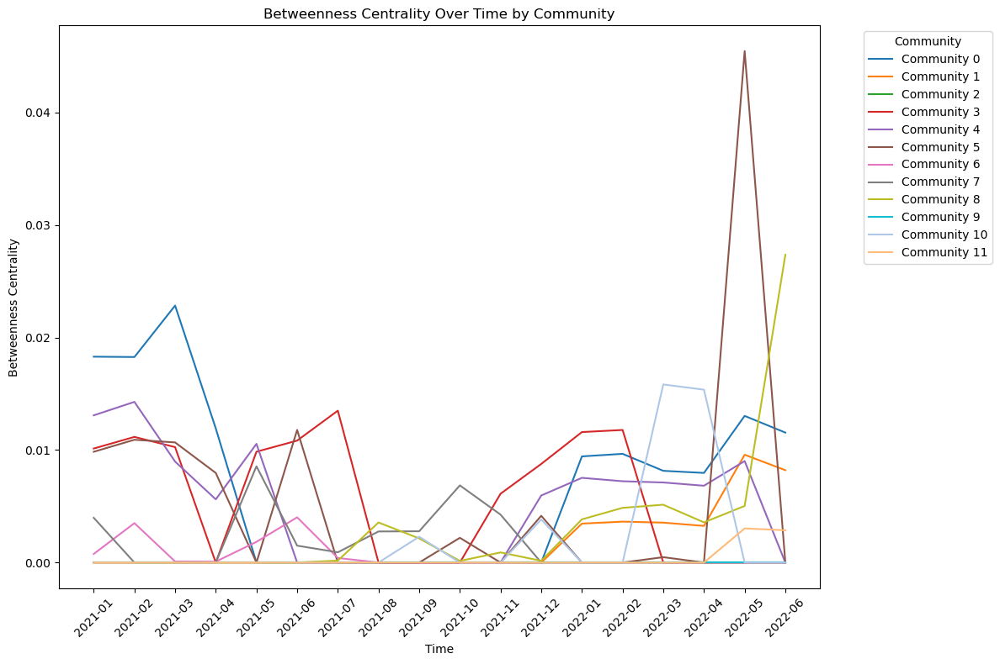

In [1105]:
import matplotlib.pyplot as plt

# Function to align the betweenness centrality DataFrame with the snapshot dates
def align_betweenness_with_dates(betweenness_df, snapshot_dates):
    """Align the betweenness centrality DataFrame with the snapshot dates."""
    # Ensure the DataFrame index is aligned with the snapshot dates
    betweenness_df.index = [snapshot_dates.get(str(date), date) for date in betweenness_df.index]
    return betweenness_df

# Function to plot betweenness centrality over time
def plot_betweenness_centrality_over_time(betweenness_df, snapshot_dates):
    """Plot betweenness centrality over time for each community with correct time alignment."""
    # Align the DataFrame with the correct dates
    betweenness_df_aligned = align_betweenness_with_dates(betweenness_df, snapshot_dates)
    
    # Fill NaN values with 0
    betweenness_df_filled = betweenness_df_aligned.fillna(0)
    
    plt.figure(figsize=(12, 8))

    # Sort the communities by their numeric order
    communities_sorted = sorted(betweenness_df_filled.columns)
    
    # Manually define distinct colors for each community
    colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', 
              '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf',
              '#aec7e8', '#ffbb78']

    # Plot each community's betweenness centrality over time
    for i, community in enumerate(communities_sorted):
        plt.plot(betweenness_df_filled.index, betweenness_df_filled[community], 
                 color=colors[i % len(colors)], label=f'Community {community}')

    plt.xlabel("Time")
    plt.ylabel("Betweenness Centrality")
    plt.title("Betweenness Centrality Over Time by Community")
    plt.xticks(rotation=45)
    plt.legend(title="Community", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

# Plot the data with correct time alignment
plot_betweenness_centrality_over_time(betweenness_df, snapshot_dates)


In [1111]:
import os
import networkx as nx
import pandas as pd
from os.path import join
from collections import defaultdict
import numpy as np

# Function to calculate normalized betweenness centrality for each component in the graph
def calculate_normalized_betweenness_centrality_by_component(graph):
    """Calculate normalized betweenness centrality for each component in the graph."""
    component_centralities = {}
    for idx, component in enumerate(nx.connected_components(graph)):
        subgraph = graph.subgraph(component)
        betweenness_centrality = nx.betweenness_centrality(subgraph)
        component_size = len(subgraph)
        
        # Normalization factor for undirected graph
        if component_size > 2:  # Only normalize if there are more than 2 nodes
            normalization_factor = 1 / ((component_size - 1) * (component_size - 2) / 2)
        else:
            normalization_factor = 1  # Avoid division by zero for small components

        # Apply normalization
        normalized_centrality = {node: centrality * normalization_factor for node, centrality in betweenness_centrality.items()}
        
        component_centralities[idx] = normalized_centrality
    return component_centralities

# Aggregate normalized betweenness centrality by community for each component
def aggregate_normalized_betweenness_by_community(graph, component_centralities):
    """Aggregate normalized betweenness centrality scores by community within each component."""
    community_centrality = defaultdict(list)
    
    for component_idx, betweenness_centrality in component_centralities.items():
        for node, centrality in betweenness_centrality.items():
            community = graph.nodes[node].get('community', 'Unknown')
            community_centrality[community].append(centrality)
    
    # Aggregate centrality scores by community
    aggregated_centrality = {community: np.mean(centralities) for community, centralities in community_centrality.items()}
    return aggregated_centrality

# Track normalized betweenness centrality over time for all components
def track_normalized_betweenness_over_time(graph_directory, community_file, snapshot_dates):
    """Track normalized betweenness centrality for each community across all snapshots."""
    betweenness_over_time = defaultdict(lambda: defaultdict(float))

    for snapshot_id, date in snapshot_dates.items():
        graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        G = nx.read_graphml(graph_file)

        load_and_apply_saved_communities(G, community_file, snapshot_id)

        component_centralities = calculate_normalized_betweenness_centrality_by_component(G)
        aggregated_centrality = aggregate_normalized_betweenness_by_community(G, component_centralities)

        for community, centrality in aggregated_centrality.items():
            betweenness_over_time[community][date] = centrality

    return betweenness_over_time

# Example utility function to load community data
def load_and_apply_saved_communities(graph, community_file, snapshot_id):
    """Load and apply the saved community assignments to the graph nodes."""
    community_df = pd.read_csv(community_file)
    community_df['Snapshot'] = community_df['Snapshot'].astype(str).str.strip()
    snapshot_id = str(snapshot_id).strip()

    snapshot_communities = community_df[community_df['Snapshot'] == snapshot_id]
    if snapshot_communities.empty:
        print(f"No data found for Snapshot ID: {snapshot_id}")
        return

    community_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Community']))
    
    for node in graph.nodes():
        graph.nodes[node]['community'] = community_map.get(node, 'Unknown')

# Paths and snapshot information
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'
snapshot_dates = {
    '11659570': '2021-01',
    '11861210': '2021-02',
    '12043054': '2021-03',
    '12244515': '2021-04',
    '12438842': '2021-05',
    '12638919': '2021-06',
    '12831436': '2021-07',
    '13029639': '2021-08',
    '13230157': '2021-09',
    '13422506': '2021-10',
    '13620205': '2021-11',
    '13809597': '2021-12',
    '14009885': '2022-01',
    '14210564': '2022-02',
    '14391029': '2022-03',
    '14589816': '2022-04',
    '14779829': '2022-05',
    '14967365': '2022-06'
}

# Track normalized betweenness centrality over the entire period
betweenness_over_time = track_normalized_betweenness_over_time(graph_directory, community_file, snapshot_dates)

# Convert to DataFrame for analysis
betweenness_df = pd.DataFrame(betweenness_over_time)

# Display the DataFrame to confirm the correct calculation
print(betweenness_df)

# Save the DataFrame to a CSV file if needed
#output_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/normalized_betweenness_centrality_by_community.csv'
#betweenness_df.to_csv(output_file, index=False)


               3             5             0             6             7   \
2021-01  0.000005  4.774787e-06  8.873432e-06  3.706334e-07  1.929249e-06   
2021-02  0.000005  4.713295e-06  7.889506e-06  1.512596e-06           NaN   
2021-03  0.000004  4.564705e-06  9.764645e-06  3.981217e-08           NaN   
2021-04  0.000000  9.712323e-06  1.453808e-05  1.010547e-07           NaN   
2021-05  0.000010  0.000000e+00           NaN  1.839725e-06  8.551822e-06   
2021-06  0.000009  9.745283e-06  0.000000e+00  3.323341e-06  1.240755e-06   
2021-07  0.000014  0.000000e+00  0.000000e+00  4.140145e-07  9.269361e-07   
2021-08  0.000000  0.000000e+00  0.000000e+00  0.000000e+00  1.129859e-05   
2021-09  0.000000  0.000000e+00  0.000000e+00  0.000000e+00  1.130646e-05   
2021-10  0.000000  2.989289e-06  0.000000e+00  0.000000e+00  9.330259e-06   
2021-11  0.000004  0.000000e+00  0.000000e+00  0.000000e+00  2.916208e-06   
2021-12  0.000004  1.784880e-06  0.000000e+00  0.000000e+00           NaN   

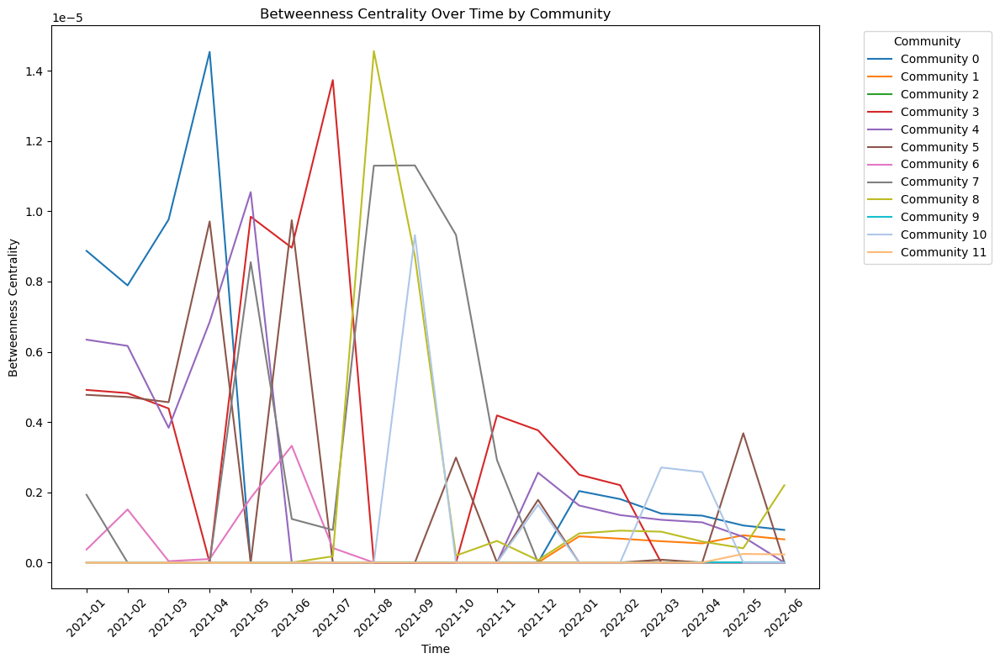

In [1112]:
import matplotlib.pyplot as plt

# Function to align the betweenness centrality DataFrame with the snapshot dates
def align_betweenness_with_dates(betweenness_df, snapshot_dates):
    """Align the betweenness centrality DataFrame with the snapshot dates."""
    # Ensure the DataFrame index is aligned with the snapshot dates
    betweenness_df.index = [snapshot_dates.get(str(date), date) for date in betweenness_df.index]
    return betweenness_df

# Function to plot betweenness centrality over time
def plot_betweenness_centrality_over_time(betweenness_df, snapshot_dates):
    """Plot betweenness centrality over time for each community with correct time alignment."""
    # Align the DataFrame with the correct dates
    betweenness_df_aligned = align_betweenness_with_dates(betweenness_df, snapshot_dates)
    
    # Fill NaN values with 0
    betweenness_df_filled = betweenness_df_aligned.fillna(0)
    
    plt.figure(figsize=(12, 8))

    # Sort the communities by their numeric order
    communities_sorted = sorted(betweenness_df_filled.columns)
    
    # Manually define distinct colors for each community
    colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', 
              '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf',
              '#aec7e8', '#ffbb78']

    # Plot each community's betweenness centrality over time
    for i, community in enumerate(communities_sorted):
        plt.plot(betweenness_df_filled.index, betweenness_df_filled[community], 
                 color=colors[i % len(colors)], label=f'Community {community}')

    plt.xlabel("Time")
    plt.ylabel("Betweenness Centrality")
    plt.title("Betweenness Centrality Over Time by Community")
    plt.xticks(rotation=45)
    plt.legend(title="Community", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

# Plot the data with correct time alignment
plot_betweenness_centrality_over_time(betweenness_df, snapshot_dates)


In [938]:
import os
import networkx as nx
import pandas as pd
from os.path import join
from collections import defaultdict
import numpy as np

# Function to identify and extract the largest component
def get_largest_component(graph):
    """Return the largest connected component of the graph."""
    components = nx.connected_components(graph)
    largest_component = max(components, key=len)
    subgraph = graph.subgraph(largest_component).copy()
    return subgraph

# Function to calculate betweenness centrality for the largest component
def calculate_betweenness_centrality_largest_component(graph):
    """Calculate the betweenness centrality for each node in the largest component of the graph."""
    largest_component = get_largest_component(graph)
    return nx.betweenness_centrality(largest_component)

# Aggregate betweenness centrality by community for the largest component
def aggregate_betweenness_by_community(graph, betweenness_centrality):
    """Aggregate betweenness centrality scores by community."""
    community_centrality = defaultdict(list)
    for node, centrality in betweenness_centrality.items():
        community = graph.nodes[node].get('community', 'Unknown')
        community_centrality[community].append(centrality)
    
    aggregated_centrality = {community: np.mean(centralities) for community, centralities in community_centrality.items()}
    return aggregated_centrality

# Track betweenness centrality over time for the largest component
def track_betweenness_over_time(graph_directory, community_file, snapshot_dates):
    """Track betweenness centrality for each community across all snapshots for the largest component."""
    betweenness_over_time = defaultdict(lambda: defaultdict(float))

    for snapshot_id, date in snapshot_dates.items():
        graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        G = nx.read_graphml(graph_file)

        load_and_apply_saved_communities(G, community_file, snapshot_id)

        betweenness_centrality = calculate_betweenness_centrality_largest_component(G)
        aggregated_centrality = aggregate_betweenness_by_community(G, betweenness_centrality)

        for community, centrality in aggregated_centrality.items():
            betweenness_over_time[community][date] = centrality

    return betweenness_over_time

# Paths and snapshot information
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Track betweenness centrality over the entire period for the largest component
betweenness_over_time = track_betweenness_over_time(graph_directory, community_file, snapshot_dates)

# Convert to DataFrame for analysis
betweenness_df = pd.DataFrame(betweenness_over_time)

# Display the DataFrame to confirm the correct calculation
print(betweenness_df)

# Save the DataFrame to a CSV file if needed
#output_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/betweenness_centrality_largest_component_by_community.csv'
#betweenness_df.to_csv(output_file, index=False)


               3         5         0         6         7         4         8   \
2021-06  0.018386  0.017862  0.033196  0.001387  0.007217  0.023736       NaN   
2021-07  0.018463  0.018042  0.030201  0.005790       NaN  0.023612       NaN   
2021-08  0.017176  0.017875  0.038238  0.000156       NaN  0.015026       NaN   
2021-10  0.025875       NaN       NaN  0.004835  0.022474  0.027717       NaN   
2021-11  0.028322  0.030795       NaN  0.018240  0.003921       NaN  0.000000   
2021-12  0.046740  0.000000       NaN  0.002266  0.003154       NaN  0.000602   
2022-01  0.000000       NaN       NaN       NaN  0.020676       NaN  0.026647   
2022-04  0.041902  0.000000       NaN       NaN  0.014147       NaN  0.002986   
2022-05  0.041363  0.010506       NaN       NaN       NaN  0.015064  0.000390   
2022-06  0.038567  0.000000  0.016810       NaN       NaN  0.013415  0.006839   
2022-07  0.035690  0.000000  0.016583       NaN       NaN  0.012404  0.008347   
2022-08  0.000000  0.000807 

# Investigating top betweeness nodes of each community

In [1115]:
import os
import networkx as nx
import pandas as pd
from os.path import join
from collections import defaultdict

# Function to calculate betweenness centrality for the entire graph
def calculate_betweenness_centrality(graph):
    """Calculate betweenness centrality for each node in the graph."""
    return nx.betweenness_centrality(graph)

# Function to collect betweenness centrality for each node across all snapshots
def collect_betweenness_across_snapshots(graph_directory, community_file, snapshot_dates):
    betweenness_across_snapshots = defaultdict(lambda: defaultdict(list))

    for snapshot_id, date in snapshot_dates.items():
        graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        G = nx.read_graphml(graph_file)

        load_and_apply_saved_communities(G, community_file, snapshot_id)

        betweenness_centrality = calculate_betweenness_centrality(G)

        for node, centrality in betweenness_centrality.items():
            community = G.nodes[node].get('community', 'Unknown')
            betweenness_across_snapshots[community][node].append(centrality)

    return betweenness_across_snapshots

# Function to compute average betweenness for each node
def compute_average_betweenness(betweenness_across_snapshots):
    average_betweenness = defaultdict(dict)

    for community, nodes_centralities in betweenness_across_snapshots.items():
        for node, centralities in nodes_centralities.items():
            average_betweenness[community][node] = sum(centralities) / len(centralities)

    return average_betweenness

# Function to find the top 10 nodes by average betweenness centrality for each community
def find_top_10_nodes_per_community(average_betweenness):
    top_10_per_community = {}

    for community, nodes_centralities in average_betweenness.items():
        sorted_nodes = sorted(nodes_centralities.items(), key=lambda item: item[1], reverse=True)[:10]
        top_10_per_community[community] = sorted_nodes

    return top_10_per_community

# Function to format the result as a DataFrame
def format_top_10_as_dataframe(top_10_per_community):
    records = []
    for community, top_nodes in top_10_per_community.items():
        for node, avg_betweenness in top_nodes:
            records.append({'Community': community, 'Node': node, 'Average Betweenness': avg_betweenness})

    return pd.DataFrame(records)

# Example utility function to load community data
def load_and_apply_saved_communities(graph, community_file, snapshot_id):
    """Load and apply the saved community assignments to the graph nodes."""
    community_df = pd.read_csv(community_file)
    community_df['Snapshot'] = community_df['Snapshot'].astype(str).str.strip()
    snapshot_id = str(snapshot_id).strip()

    snapshot_communities = community_df[community_df['Snapshot'] == snapshot_id]
    if snapshot_communities.empty:
        print(f"No data found for Snapshot ID: {snapshot_id}")
        return

    community_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Community']))
    
    for node in graph.nodes():
        graph.nodes[node]['community'] = community_map.get(node, 'Unknown')

# Paths and snapshot information
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'

# Snapshot dates (example)
snapshot_dates = {
    '11659570': '2021-01',
    '11861210': '2021-02',
    '12043054': '2021-03',
    '12244515': '2021-04',
    '12438842': '2021-05',
    '12638919': '2021-06',
    '12831436': '2021-07',
    '13029639': '2021-08',
    '13230157': '2021-09',
    '13422506': '2021-10',
    '13620205': '2021-11',
    '13809597': '2021-12',
    '14009885': '2022-01',
    '14210564': '2022-02',
    '14391029': '2022-03',
    '14589816': '2022-04',
    '14779829': '2022-05',
    '14967365': '2022-06'
}

# Step 1: Collect betweenness centrality across all snapshots
betweenness_across_snapshots = collect_betweenness_across_snapshots(graph_directory, community_file, snapshot_dates)

# Step 2: Compute the average betweenness centrality for each node
average_betweenness = compute_average_betweenness(betweenness_across_snapshots)

# Step 3: Find the top 10 nodes with the highest average betweenness centrality for each community
top_10_per_community = find_top_10_nodes_per_community(average_betweenness)

# Step 4: Format the result as a DataFrame
top_10_df = format_top_10_as_dataframe(top_10_per_community)

# Display the DataFrame to confirm the correct calculation
print(top_10_df)

# Save the DataFrame to a CSV file if needed
output_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/top_10_betweenness_centrality_nodes_per_community.csv'
top_10_df.to_csv(output_file, index=False)


     Community                                        Node  \
0            3  0xf977814e90da44bfa03b6295a0616a897441acec   
1            3  0x3dfd23a6c5e8bbcfc9581d2e864a68feb6a076d3   
2            3  0x5e89f8d81c74e311458277ea1be3d3247c7cd7d1   
3            3  0xa0446d8804611944f1b527ecd37d7dcbe442caba   
4            3  0x41527cc7cc6e63d9d0753d6fdbd4ac16096a029d   
..         ...                                         ...   
106         11  0x0437ac6109e8a366a1f4816edf312a36952db856   
107         11  0xe94b5eec1fa96ceecbd33ef5baa8d00e4493f4f3   
108         11  0xcbe6b83e77cdc011cc18f6f0df8444e5783ed982   
109         11  0xe93381fb4c4f14bda253907b18fad305d799241a   
110         11  0x6cc5f688a315f3dc28a7781717a9a798a59fda7b   

     Average Betweenness  
0               0.242193  
1               0.210399  
2               0.000331  
3               0.000331  
4               0.000000  
..                   ...  
106             0.001476  
107             0.001476  
108         

# Investigating top 10 noramlized betweeness of each community

In [1121]:
import os
import networkx as nx
import pandas as pd
from os.path import join
from collections import defaultdict
import numpy as np

# Function to calculate normalized betweenness centrality for each component in the graph
def calculate_normalized_betweenness_centrality_by_component(graph):
    """Calculate normalized betweenness centrality for each component in the graph."""
    component_centralities = {}
    for idx, component in enumerate(nx.connected_components(graph)):
        subgraph = graph.subgraph(component)
        betweenness_centrality = nx.betweenness_centrality(subgraph)
        component_size = len(subgraph)
        
        # Normalization factor for undirected graph
        if component_size > 2:  # Only normalize if there are more than 2 nodes
            normalization_factor = 1 / ((component_size - 1) * (component_size - 2) / 2)
        else:
            normalization_factor = 1  # Avoid division by zero for small components

        # Apply normalization
        normalized_centrality = {node: centrality * normalization_factor for node, centrality in betweenness_centrality.items()}
        
        component_centralities.update(normalized_centrality)
    return component_centralities

# Function to collect normalized betweenness centrality for each node across all snapshots
def collect_normalized_betweenness_across_snapshots(graph_directory, community_file, snapshot_dates):
    betweenness_across_snapshots = defaultdict(lambda: defaultdict(list))

    for snapshot_id, date in snapshot_dates.items():
        graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        G = nx.read_graphml(graph_file)

        load_and_apply_saved_communities(G, community_file, snapshot_id)

        normalized_betweenness_centrality = calculate_normalized_betweenness_centrality_by_component(G)

        for node, centrality in normalized_betweenness_centrality.items():
            community = G.nodes[node].get('community', 'Unknown')
            betweenness_across_snapshots[community][node].append(centrality)

    return betweenness_across_snapshots

# Function to compute average normalized betweenness for each node
def compute_average_betweenness(betweenness_across_snapshots):
    average_betweenness = defaultdict(dict)

    for community, nodes_centralities in betweenness_across_snapshots.items():
        for node, centralities in nodes_centralities.items():
            average_betweenness[community][node] = sum(centralities) / len(centralities)

    return average_betweenness

# Function to find the top 10 nodes by average betweenness centrality for each community
def find_top_10_nodes_per_community(average_betweenness):
    top_10_per_community = {}

    for community, nodes_centralities in average_betweenness.items():
        sorted_nodes = sorted(nodes_centralities.items(), key=lambda item: item[1], reverse=True)[:10]
        top_10_per_community[community] = sorted_nodes

    return top_10_per_community

# Function to format the result as a DataFrame
def format_top_10_as_dataframe(top_10_per_community):
    records = []
    for community, top_nodes in top_10_per_community.items():
        for node, avg_betweenness in top_nodes:
            records.append({'Community': community, 'Node': node, 'Average Betweenness': avg_betweenness})

    return pd.DataFrame(records)

# Example utility function to load community data
def load_and_apply_saved_communities(graph, community_file, snapshot_id):
    """Load and apply the saved community assignments to the graph nodes."""
    community_df = pd.read_csv(community_file)
    community_df['Snapshot'] = community_df['Snapshot'].astype(str).str.strip()
    snapshot_id = str(snapshot_id).strip()

    snapshot_communities = community_df[community_df['Snapshot'] == snapshot_id]
    if snapshot_communities.empty:
        print(f"No data found for Snapshot ID: {snapshot_id}")
        return

    community_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Community']))
    
    for node in graph.nodes():
        graph.nodes[node]['community'] = community_map.get(node, 'Unknown')

# Paths and snapshot information
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'

# Snapshot dates (example)
snapshot_dates = {
    '11659570': '2021-01',
    '11861210': '2021-02',
    '12043054': '2021-03',
    '12244515': '2021-04',
    '12438842': '2021-05',
    '12638919': '2021-06',
    '12831436': '2021-07',
    '13029639': '2021-08',
    '13230157': '2021-09',
    '13422506': '2021-10',
    '13620205': '2021-11',
    '13809597': '2021-12',
    '14009885': '2022-01',
    '14210564': '2022-02',
    '14391029': '2022-03',
    '14589816': '2022-04',
    '14779829': '2022-05',
    '14967365': '2022-06'
}

# Step 1: Collect normalized betweenness centrality across all snapshots
betweenness_across_snapshots = collect_normalized_betweenness_across_snapshots(graph_directory, community_file, snapshot_dates)

# Step 2: Compute the average normalized betweenness centrality for each node
average_betweenness = compute_average_betweenness(betweenness_across_snapshots)

# Step 3: Find the top 10 nodes with the highest average betweenness centrality for each community
top_10_per_community = find_top_10_nodes_per_community(average_betweenness)

# Step 4: Format the result as a DataFrame
top_10_df = format_top_10_as_dataframe(top_10_per_community)

# Display the DataFrame to confirm the correct calculation
print(top_10_df)

# Save the DataFrame to a CSV file if needed
#output_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/top_10_betweenness_centrality_nodes_per_community_Normalized.csv'
#top_10_df.to_csv(output_file, index=False)




     Community                                        Node  \
0            3  0xf977814e90da44bfa03b6295a0616a897441acec   
1            3  0x3dfd23a6c5e8bbcfc9581d2e864a68feb6a076d3   
2            3  0x5e89f8d81c74e311458277ea1be3d3247c7cd7d1   
3            3  0xa0446d8804611944f1b527ecd37d7dcbe442caba   
4            3  0x41527cc7cc6e63d9d0753d6fdbd4ac16096a029d   
..         ...                                         ...   
106         11  0x0437ac6109e8a366a1f4816edf312a36952db856   
107         11  0xe94b5eec1fa96ceecbd33ef5baa8d00e4493f4f3   
108         11  0xcbe6b83e77cdc011cc18f6f0df8444e5783ed982   
109         11  0xe93381fb4c4f14bda253907b18fad305d799241a   
110         11  0x6cc5f688a315f3dc28a7781717a9a798a59fda7b   

     Average Betweenness  
0           1.317947e-04  
1           9.433730e-05  
2           2.735093e-07  
3           2.735093e-07  
4           0.000000e+00  
..                   ...  
106         1.190665e-07  
107         1.190665e-07  
108         

In [1124]:
import os
import networkx as nx
import pandas as pd
from os.path import join
from collections import defaultdict
import numpy as np

# Function to calculate normalized betweenness centrality for each component in the graph
def calculate_normalized_betweenness_centrality_by_component(graph):
    """Calculate normalized betweenness centrality for each component in the graph."""
    component_centralities = {}
    for idx, component in enumerate(nx.connected_components(graph)):
        subgraph = graph.subgraph(component)
        betweenness_centrality = nx.betweenness_centrality(subgraph)
        component_size = len(subgraph)
        
        # Normalization factor for undirected graph
        if component_size > 2:  # Only normalize if there are more than 2 nodes
            normalization_factor = 1 / ((component_size - 1) * (component_size - 2) / 2)
        else:
            normalization_factor = 1  # Avoid division by zero for small components

        # Apply normalization
        normalized_centrality = {node: centrality * normalization_factor for node, centrality in betweenness_centrality.items()}
        
        component_centralities.update(normalized_centrality)
    return component_centralities

# Function to collect normalized betweenness centrality for each node across all snapshots
def collect_normalized_betweenness_across_snapshots(graph_directory, community_file, snapshot_dates):
    betweenness_across_snapshots = defaultdict(lambda: defaultdict(list))

    for snapshot_id, date in snapshot_dates.items():
        graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        G = nx.read_graphml(graph_file)

        load_and_apply_saved_communities(G, community_file, snapshot_id)

        normalized_betweenness_centrality = calculate_normalized_betweenness_centrality_by_component(G)

        for node, centrality in normalized_betweenness_centrality.items():
            community = G.nodes[node].get('community', 'Unknown')
            betweenness_across_snapshots[community][node].append(centrality)

    return betweenness_across_snapshots

# Function to compute average normalized betweenness for each node
def compute_average_betweenness(betweenness_across_snapshots):
    average_betweenness = defaultdict(dict)

    for community, nodes_centralities in betweenness_across_snapshots.items():
        for node, centralities in nodes_centralities.items():
            average_betweenness[community][node] = sum(centralities) / len(centralities)

    return average_betweenness

# Function to find the top 5 nodes by average betweenness centrality for each community
def find_top_5_nodes_per_community(average_betweenness):
    top_5_per_community = {}

    # Sort communities in order from 0 to 11
    communities_sorted = sorted(average_betweenness.keys())

    for community in communities_sorted:
        nodes_centralities = average_betweenness[community]
        sorted_nodes = sorted(nodes_centralities.items(), key=lambda item: item[1], reverse=True)[:5]
        top_5_per_community[community] = sorted_nodes

    return top_5_per_community

# Function to format the result as a DataFrame
def format_top_5_as_dataframe(top_5_per_community):
    records = []
    for community, top_nodes in top_5_per_community.items():
        for node, avg_betweenness in top_nodes:
            records.append({'Community': community, 'Node': node, 'Average Betweenness': avg_betweenness})

    return pd.DataFrame(records)

# Example utility function to load community data
def load_and_apply_saved_communities(graph, community_file, snapshot_id):
    """Load and apply the saved community assignments to the graph nodes."""
    community_df = pd.read_csv(community_file)
    community_df['Snapshot'] = community_df['Snapshot'].astype(str).str.strip()
    snapshot_id = str(snapshot_id).strip()

    snapshot_communities = community_df[community_df['Snapshot'] == snapshot_id]
    if snapshot_communities.empty:
        print(f"No data found for Snapshot ID: {snapshot_id}")
        return

    community_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Community']))
    
    for node in graph.nodes():
        graph.nodes[node]['community'] = community_map.get(node, 'Unknown')

# Paths and snapshot information
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'

# Snapshot dates (example)
snapshot_dates = {
    '11659570': '2021-01',
    '11861210': '2021-02',
    '12043054': '2021-03',
    '12244515': '2021-04',
    '12438842': '2021-05',
    '12638919': '2021-06',
    '12831436': '2021-07',
    '13029639': '2021-08',
    '13230157': '2021-09',
    '13422506': '2021-10',
    '13620205': '2021-11',
    '13809597': '2021-12',
    '14009885': '2022-01',
    '14210564': '2022-02',
    '14391029': '2022-03',
    '14589816': '2022-04',
    '14779829': '2022-05',
    '14967365': '2022-06'
}

# Step 1: Collect normalized betweenness centrality across all snapshots
betweenness_across_snapshots = collect_normalized_betweenness_across_snapshots(graph_directory, community_file, snapshot_dates)

# Step 2: Compute the average normalized betweenness centrality for each node
average_betweenness = compute_average_betweenness(betweenness_across_snapshots)

# Step 3: Find the top 5 nodes with the highest average betweenness centrality for each community
top_5_per_community = find_top_5_nodes_per_community(average_betweenness)

# Step 4: Format the result as a DataFrame
top_5_df = format_top_5_as_dataframe(top_5_per_community)

# Display the DataFrame to confirm the correct calculation
print(top_5_df)

# Save the DataFrame to a CSV file if needed
output_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/top_5_betweenness_centrality_nodes_per_community_normalised.csv'
top_5_df.to_csv(output_file, index=False)



    Community                                        Node  Average Betweenness
0           0  0xe93381fb4c4f14bda253907b18fad305d799241a         7.341265e-05
1           0  0xf977814e90da44bfa03b6295a0616a897441acec         2.080733e-05
2           0  0x3f5ce5fbfe3e9af3971dd833d26ba9b5c936f0be         1.673490e-05
3           0  0x2fdbadf3c4d5a8666bc06645b8358ab803996e28         1.100064e-05
4           0  0x28c6c06298d514db089934071355e5743bf21d60         1.057333e-05
5           1  0x40ec5b33f54e0e8a33a975908c5ba1c14e5bbbdf         1.914238e-05
6           1  0x28c6c06298d514db089934071355e5743bf21d60         1.620476e-05
7           1  0x317625234562b1526ea2fac4030ea499c5291de4         7.545334e-07
8           1  0xffc97d72e13e01096502cb8eb52dee56f74dad7b         7.545334e-07
9           1  0x3744da57184575064838bbc87a0fc791f5e39ea2         7.545334e-07
10          2  0x0ef1b8a0e726fc3948e15b23993015eb1627f210         0.000000e+00
11          2  0x5e89f8d81c74e311458277ea1be3d3247c7

# COMPONENT BY COMPONENT

In [1008]:
import os
import networkx as nx
import pandas as pd
from os.path import join
from collections import defaultdict
import numpy as np

# Function to calculate betweenness centrality for each component in the graph
def calculate_betweenness_centrality_by_component(graph):
    """Calculate betweenness centrality for each component in the graph."""
    component_centralities = {}
    for idx, component in enumerate(nx.connected_components(graph)):
        subgraph = graph.subgraph(component)
        betweenness_centrality = nx.betweenness_centrality(subgraph)
        component_centralities[idx] = betweenness_centrality  # Use an integer index as the key
    return component_centralities

# Aggregate betweenness centrality by community for each component
def aggregate_betweenness_by_community(graph, component_centralities):
    """Aggregate betweenness centrality scores by community within each component."""
    community_centrality = defaultdict(list)
    
    for component_idx, betweenness_centrality in component_centralities.items():
        for node, centrality in betweenness_centrality.items():
            community = graph.nodes[node].get('community', 'Unknown')
            community_centrality[community].append(centrality)
    
    # Aggregate centrality scores by community
    aggregated_centrality = {community: np.mean(centralities) for community, centralities in community_centrality.items()}
    return aggregated_centrality

# Track betweenness centrality over time for all components
def track_betweenness_over_time(graph_directory, community_file, snapshot_dates):
    """Track betweenness centrality for each community across all snapshots."""
    betweenness_over_time = defaultdict(dict)

    for snapshot_id, date in snapshot_dates.items():
        graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        G = nx.read_graphml(graph_file)

        load_and_apply_saved_communities(G, community_file, snapshot_id)

        component_centralities = calculate_betweenness_centrality_by_component(G)
        aggregated_centrality = aggregate_betweenness_by_community(G, component_centralities)

        for community, centrality in aggregated_centrality.items():
            betweenness_over_time[community][date] = centrality

    return betweenness_over_time

# Load and apply community data
def load_and_apply_saved_communities(graph, community_file, snapshot_id):
    """Load and apply the saved community assignments to the graph nodes."""
    community_df = pd.read_csv(community_file)
    community_df['Snapshot'] = community_df['Snapshot'].astype(str).str.strip()
    snapshot_id = str(snapshot_id).strip()

    snapshot_communities = community_df[community_df['Snapshot'] == snapshot_id]
    if snapshot_communities.empty:
        print(f"No data found for Snapshot ID: {snapshot_id}")
        return

    community_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Community']))
    
    for node in graph.nodes():
        graph.nodes[node]['community'] = community_map.get(node, 'Unknown')

# Paths and snapshot information
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Track betweenness centrality over the entire period
betweenness_over_time = track_betweenness_over_time(graph_directory, community_file, snapshot_dates)

# Convert to DataFrame for analysis
betweenness_df = pd.DataFrame(betweenness_over_time)

# Transpose the DataFrame so that communities are columns and dates are rows
betweenness_df = betweenness_df.T

# Display the DataFrame to confirm the correct calculation
print(betweenness_df)

# Save the DataFrame to a CSV file if needed
#output_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/betweenness_centrality_by_community_components.csv'
#betweenness_df.to_csv(output_file)


     2021-06   2021-07   2021-08   2021-09   2021-10   2021-11   2021-12  \
3   0.018386  0.018463  0.017176  0.000000  0.025875  0.028322  0.046740   
5   0.017862  0.018042  0.017875  0.022125  0.000000  0.030795  0.000000   
0   0.033196  0.030201  0.038238  0.033118       NaN  0.000000  0.000000   
6   0.001387  0.005790  0.000156  0.000230  0.004835  0.010502  0.001409   
7   0.007217       NaN       NaN       NaN  0.022474  0.003921  0.003154   
4   0.023736  0.023612  0.015026  0.015607  0.027717       NaN  0.000000   
8   0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000602   
2   0.000000       NaN       NaN       NaN       NaN       NaN       NaN   
1   0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
10       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
9        NaN       NaN       NaN       NaN       NaN       NaN       NaN   
11       NaN       NaN       NaN       NaN       NaN       NaN       NaN   

     2022-0

In [1014]:
import os
import networkx as nx
import pandas as pd
from os.path import join
from collections import defaultdict
import numpy as np

# Function to calculate betweenness centrality for each component in the graph
def calculate_betweenness_centrality_by_component(graph):
    """Calculate betweenness centrality for each component in the graph."""
    component_centralities = {}
    for idx, component in enumerate(nx.connected_components(graph)):
        subgraph = graph.subgraph(component)
        betweenness_centrality = nx.betweenness_centrality(subgraph)
        component_centralities[idx] = betweenness_centrality  # Use an integer index as the key
    return component_centralities

# Aggregate betweenness centrality by community for each component
def aggregate_betweenness_by_community(graph, component_centralities):
    """Aggregate betweenness centrality scores by community within each component."""
    community_centrality = defaultdict(list)
    
    for component_idx, betweenness_centrality in component_centralities.items():
        for node, centrality in betweenness_centrality.items():
            community = graph.nodes[node].get('community', 'Unknown')
            community_centrality[community].append(centrality)
    
    # Aggregate centrality scores by community
    aggregated_centrality = {community: np.mean(centralities) for community, centralities in community_centrality.items()}
    return aggregated_centrality

# Track betweenness centrality over time for all components
def track_betweenness_over_time(graph_directory, community_file, snapshot_dates):
    """Track betweenness centrality for each community across all snapshots."""
    betweenness_over_time = defaultdict(lambda: defaultdict(float))

    for snapshot_id, date in snapshot_dates.items():
        graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        G = nx.read_graphml(graph_file)

        load_and_apply_saved_communities(G, community_file, snapshot_id)

        component_centralities = calculate_betweenness_centrality_by_component(G)
        aggregated_centrality = aggregate_betweenness_by_community(G, component_centralities)

        for community, centrality in aggregated_centrality.items():
            betweenness_over_time[community][date] = centrality

    return betweenness_over_time

# Example utility function to load community data
def load_and_apply_saved_communities(graph, community_file, snapshot_id):
    """Load and apply the saved community assignments to the graph nodes."""
    community_df = pd.read_csv(community_file)
    community_df['Snapshot'] = community_df['Snapshot'].astype(str).str.strip()
    snapshot_id = str(snapshot_id).strip()

    snapshot_communities = community_df[community_df['Snapshot'] == snapshot_id]
    if snapshot_communities.empty:
        print(f"No data found for Snapshot ID: {snapshot_id}")
        return

    community_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Community']))
    
    for node in graph.nodes():
        graph.nodes[node]['community'] = community_map.get(node, 'Unknown')

# Paths and snapshot information
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'
snapshot_dates = {
    '11659570': '2021-01',
    '11861210': '2021-02',
    '12043054': '2021-03',
    '12244515': '2021-04',
    '12438842': '2021-05',
    '12638919': '2021-06',
    '12831436': '2021-07',
    '13029639': '2021-08',
    '13230157': '2021-09',
    '13422506': '2021-10',
    '13620205': '2021-11',
    '13809597': '2021-12',
    '14009885': '2022-01',
    '14210564': '2022-02',
    '14391029': '2022-03',
    '14589816': '2022-04',
    '14779829': '2022-05',
    '14967365': '2022-06'
}

# Track betweenness centrality over the entire period
betweenness_over_time = track_betweenness_over_time(graph_directory, community_file, snapshot_dates)

# Convert to DataFrame for analysis
betweenness_df = pd.DataFrame(betweenness_over_time).T

# Display the DataFrame to confirm the correct calculation
print(betweenness_df)

# Save the DataFrame to a CSV file if needed
#output_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/betweenness_centrality_by_community_components.csv'
#betweenness_df.to_csv(output_file)


     2021-01   2021-02   2021-03   2021-04   2021-05   2021-06   2021-07  \
3   0.018386  0.018463  0.017176  0.000000  0.025875  0.028322  0.046740   
5   0.017862  0.018042  0.017875  0.022125  0.000000  0.030795  0.000000   
0   0.033196  0.030201  0.038238  0.033118       NaN  0.000000  0.000000   
6   0.001387  0.005790  0.000156  0.000230  0.004835  0.010502  0.001409   
7   0.007217       NaN       NaN       NaN  0.022474  0.003921  0.003154   
4   0.023736  0.023612  0.015026  0.015607  0.027717       NaN  0.000000   
8   0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000602   
2   0.000000       NaN       NaN       NaN       NaN       NaN       NaN   
1   0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
10       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
9        NaN       NaN       NaN       NaN       NaN       NaN       NaN   
11       NaN       NaN       NaN       NaN       NaN       NaN       NaN   

     2021-0

In [1002]:
# Fill NaN values with 0
betweenness_df_filled = betweenness_df.fillna(0)


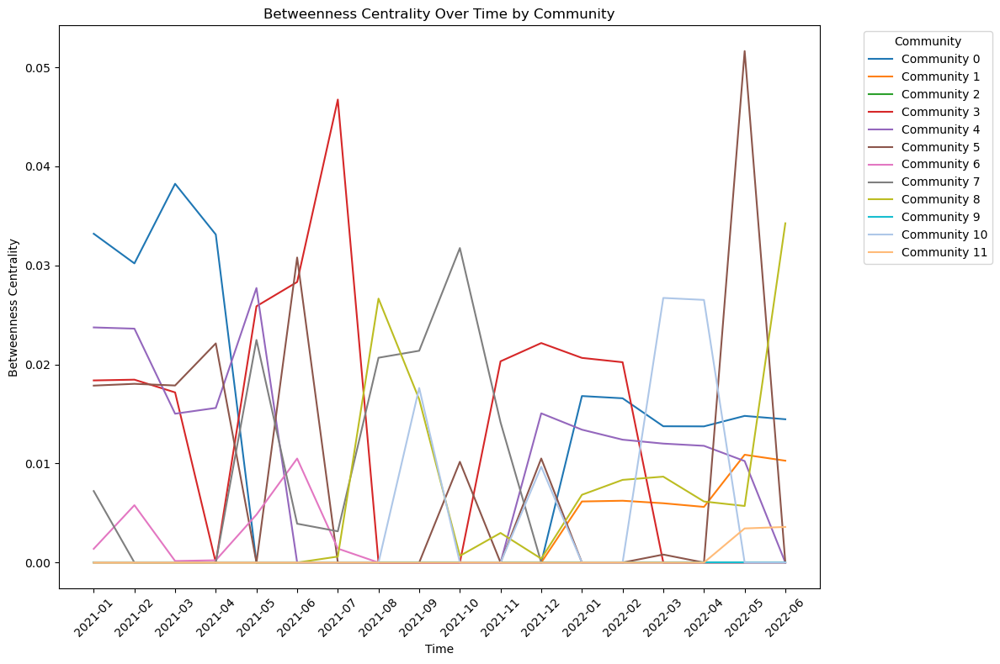

In [1012]:
import matplotlib.pyplot as plt

def align_betweenness_with_dates(betweenness_df, snapshot_dates):
    """Align the betweenness centrality DataFrame with the snapshot dates."""
    betweenness_df.columns = [snapshot_dates.get(str(col), col) for col in betweenness_df.columns]
    return betweenness_df

def plot_betweenness_centrality_over_time(betweenness_df, snapshot_dates):
    """Plot betweenness centrality over time for each community with correct time alignment."""
    # Align the DataFrame with the correct dates
    betweenness_df_aligned = align_betweenness_with_dates(betweenness_df.T, snapshot_dates)
    
    # Fill NaN values with 0
    betweenness_df_filled = betweenness_df_aligned.fillna(0)
    
    plt.figure(figsize=(12, 8))

    # Sort the communities by their numeric order
    communities_sorted = sorted(betweenness_df_filled.columns, key=lambda x: int(x))
    
    # Manually define distinct colors for each community
    colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', 
              '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf',
              '#aec7e8', '#ffbb78']
    
    # Plot each community's betweenness centrality over time
    for idx, community in enumerate(communities_sorted):
        plt.plot(betweenness_df_filled.index, betweenness_df_filled[community], color=colors[idx], label=f'Community {community}')

    plt.xlabel("Time")
    plt.ylabel("Betweenness Centrality")
    plt.title("Betweenness Centrality Over Time by Community")
    plt.xticks(rotation=45)
    plt.legend(title="Community", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

# Plot the data with correct time alignment and unique colors for each community
plot_betweenness_centrality_over_time(betweenness_df_filled, snapshot_dates)



In [1018]:
import os
import networkx as nx
import pandas as pd
from os.path import join
from collections import defaultdict
import numpy as np

# Function to calculate betweenness centrality for each component in the graph
def calculate_betweenness_centrality_by_component(graph):
    """Calculate betweenness centrality for each component in the graph."""
    component_centralities = {}
    for idx, component in enumerate(nx.connected_components(graph)):
        subgraph = graph.subgraph(component)
        betweenness_centrality = nx.betweenness_centrality(subgraph)
        component_centralities[idx] = betweenness_centrality  # Use an integer index as the key
    return component_centralities

# Aggregate betweenness centrality by community for each component
def aggregate_betweenness_by_community(graph, component_centralities):
    """Aggregate betweenness centrality scores by community within each component."""
    community_centrality = defaultdict(list)
    
    for component_idx, betweenness_centrality in component_centralities.items():
        for node, centrality in betweenness_centrality.items():
            community = graph.nodes[node].get('community', 'Unknown')
            community_centrality[community].append(centrality)
    
    # Aggregate centrality scores by community
    aggregated_centrality = {community: np.mean(centralities) for community, centralities in community_centrality.items()}
    return aggregated_centrality

# Track betweenness centrality over time for all components
def track_betweenness_over_time(graph_directory, community_file, snapshot_dates):
    """Track betweenness centrality for each community across all snapshots."""
    betweenness_over_time = defaultdict(lambda: defaultdict(float))

    for snapshot_id, date in snapshot_dates.items():
        graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        G = nx.read_graphml(graph_file)

        load_and_apply_saved_communities(G, community_file, snapshot_id)

        component_centralities = calculate_betweenness_centrality_by_component(G)
        aggregated_centrality = aggregate_betweenness_by_community(G, component_centralities)

        for community, centrality in aggregated_centrality.items():
            betweenness_over_time[community][date] = centrality

    return betweenness_over_time

# Example utility function to load community data
def load_and_apply_saved_communities(graph, community_file, snapshot_id):
    """Load and apply the saved community assignments to the graph nodes."""
    community_df = pd.read_csv(community_file)
    community_df['Snapshot'] = community_df['Snapshot'].astype(str).str.strip()
    snapshot_id = str(snapshot_id).strip()

    snapshot_communities = community_df[community_df['Snapshot'] == snapshot_id]
    if snapshot_communities.empty:
        print(f"No data found for Snapshot ID: {snapshot_id}")
        return

    community_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Community']))
    
    for node in graph.nodes():
        graph.nodes[node]['community'] = community_map.get(node, 'Unknown')

# Paths and snapshot information
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'
snapshot_dates = {
    '11659570': '2021-01',
    '11861210': '2021-02',
    '12043054': '2021-03',
    '12244515': '2021-04',
    '12438842': '2021-05',
    '12638919': '2021-06',
    '12831436': '2021-07',
    '13029639': '2021-08',
    '13230157': '2021-09',
    '13422506': '2021-10',
    '13620205': '2021-11',
    '13809597': '2021-12',
    '14009885': '2022-01',
    '14210564': '2022-02',
    '14391029': '2022-03',
    '14589816': '2022-04',
    '14779829': '2022-05',
    '14967365': '2022-06'
}

# Track betweenness centrality over the entire period
betweenness_over_time = track_betweenness_over_time(graph_directory, community_file, snapshot_dates)

# Convert to DataFrame for analysis
betweenness_df = pd.DataFrame(betweenness_over_time).T

# Display the DataFrame to confirm the correct calculation
print(betweenness_df)

# Save the DataFrame to a CSV file if needed
#output_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/betweenness_centrality_by_community_components.csv'
#betweenness_df.to_csv(output_file)


     2021-01   2021-02   2021-03   2021-04   2021-05   2021-06   2021-07  \
3   0.018386  0.018463  0.017176  0.000000  0.025875  0.028322  0.046740   
5   0.017862  0.018042  0.017875  0.022125  0.000000  0.030795  0.000000   
0   0.033196  0.030201  0.038238  0.033118       NaN  0.000000  0.000000   
6   0.001387  0.005790  0.000156  0.000230  0.004835  0.010502  0.001409   
7   0.007217       NaN       NaN       NaN  0.022474  0.003921  0.003154   
4   0.023736  0.023612  0.015026  0.015607  0.027717       NaN  0.000000   
8   0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000602   
2   0.000000       NaN       NaN       NaN       NaN       NaN       NaN   
1   0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
10       NaN       NaN       NaN       NaN       NaN       NaN       NaN   
9        NaN       NaN       NaN       NaN       NaN       NaN       NaN   
11       NaN       NaN       NaN       NaN       NaN       NaN       NaN   

     2021-0

In [1023]:
import os
import networkx as nx
import pandas as pd
from os.path import join

# Function to track the communities of specific addresses over time
def track_address_communities(graph_directory, community_file, snapshot_dates, addresses):
    address_community_over_time = {address: {} for address in addresses}

    for snapshot_id, date in snapshot_dates.items():
        normal_graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')

        # Load the normal graph
        G = nx.read_graphml(normal_graph_file)

        # Load and apply the saved community assignments
        load_and_apply_saved_communities(G, community_file, snapshot_id)

        # Track the community for each address
        for address in addresses:
            if address in G:
                community = G.nodes[address].get('community', 'Unknown')
                address_community_over_time[address][date] = community
            else:
                address_community_over_time[address][date] = 'Not Present'

    return pd.DataFrame(address_community_over_time)

# Example utility function to load community data
def load_and_apply_saved_communities(graph, community_file, snapshot_id):
    """Load and apply the saved community assignments to the graph nodes."""
    community_df = pd.read_csv(community_file)
    community_df['Snapshot'] = community_df['Snapshot'].astype(str).str.strip()
    snapshot_id = str(snapshot_id).strip()

    snapshot_communities = community_df[community_df['Snapshot'] == snapshot_id]
    if snapshot_communities.empty:
        print(f"No data found for Snapshot ID: {snapshot_id}")
        return

    community_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Community']))
    
    for node in graph.nodes():
        graph.nodes[node]['community'] = community_map.get(node, 'Unknown')

# Paths and snapshot information
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'
snapshot_dates = {
    '11659570': '2021-01',
    '11861210': '2021-02',
    '12043054': '2021-03',
    '12244515': '2021-04',
    '12438842': '2021-05',
    '12638919': '2021-06',
    '12831436': '2021-07',
    '13029639': '2021-08',
    '13230157': '2021-09',
    '13422506': '2021-10',
    '13620205': '2021-11',
    '13809597': '2021-12',
    '14009885': '2022-01',
    '14210564': '2022-02',
    '14391029': '2022-03',
    '14589816': '2022-04',
    '14779829': '2022-05',
    '14967365': '2022-06'
}

# List of addresses to track
addresses = [
    '0x8328a42a583d4812268c4dd63ae2f77f37a6b4f3',
    '0xa52abc4cf2cdb908fa6c38e88d7162c03ece92f9',
    '0xbcd5000f5c522856e710c5d274bb672b2f2eefbf',
    '0x2b67a3c0b90f6ae4394210692f69968d02970126'
]

# Track the communities of the specified addresses over time
address_community_df = track_address_communities(graph_directory, community_file, snapshot_dates, addresses)

# Display the DataFrame to confirm the correct calculation
print(address_community_df)

# Save the DataFrame to a CSV file if needed
output_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/address_community_over_time.csv'
address_community_df.to_csv(output_file, index=True)


        0x8328a42a583d4812268c4dd63ae2f77f37a6b4f3  \
2021-01                                          5   
2021-02                                          5   
2021-03                                          5   
2021-04                                          5   
2021-05                                          5   
2021-06                                          5   
2021-07                                          5   
2021-08                                          5   
2021-09                                          5   
2021-10                                          5   
2021-11                                          5   
2021-12                                Not Present   
2022-01                                Not Present   
2022-02                                Not Present   
2022-03                                Not Present   
2022-04                                Not Present   
2022-05                                Not Present   
2022-06                     

In [1022]:
import os
import networkx as nx
import pandas as pd
from os.path import join
from collections import defaultdict

# Function to calculate betweenness centrality for each component in the graph
def calculate_betweenness_centrality_by_component(graph):
    """Calculate betweenness centrality for each component in the graph."""
    component_centralities = {}
    for idx, component in enumerate(nx.connected_components(graph)):
        subgraph = graph.subgraph(component)
        betweenness_centrality = nx.betweenness_centrality(subgraph)
        component_centralities[idx] = betweenness_centrality  # Use an integer index as the key
    return component_centralities

# Function to find the top 5 nodes by betweenness centrality in each snapshot
def find_top_betweenness_nodes(graph, component_centralities, snapshot_date, token_map, enriched_graph):
    top_nodes = []
    
    for component_idx, betweenness_centrality in component_centralities.items():
        sorted_nodes = sorted(betweenness_centrality.items(), key=lambda item: item[1], reverse=True)[:5]
        
        for node, centrality in sorted_nodes:
            community = graph.nodes[node].get('community', 'Unknown')
            token_address = enriched_graph.nodes[node].get('token_address', '').lower()
            token = token_map.get(token_address, 'Unknown Token')
            top_nodes.append({
                'Date': snapshot_date,
                'Wallet': node,
                'Betweenness': centrality,
                'Token': token,
                'Community': community
            })
    
    return top_nodes

# Track and collect top betweenness nodes across all snapshots
def track_top_betweenness_nodes(graph_directory, enriched_graph_directory, community_file, snapshot_dates, token_map):
    top_betweenness_nodes_over_time = []

    for snapshot_id, date in snapshot_dates.items():
        normal_graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        enriched_graph_file = join(enriched_graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')

        # Load the normal and enriched graphs
        G = nx.read_graphml(normal_graph_file)
        enriched_G = nx.read_graphml(enriched_graph_file)

        load_and_apply_saved_communities(G, community_file, snapshot_id)

        component_centralities = calculate_betweenness_centrality_by_component(G)
        top_nodes = find_top_betweenness_nodes(G, component_centralities, date, token_map, enriched_G)
        top_betweenness_nodes_over_time.extend(top_nodes)

    return pd.DataFrame(top_betweenness_nodes_over_time)

# Example utility function to load community data
def load_and_apply_saved_communities(graph, community_file, snapshot_id):
    """Load and apply the saved community assignments to the graph nodes."""
    community_df = pd.read_csv(community_file)
    community_df['Snapshot'] = community_df['Snapshot'].astype(str).str.strip()
    snapshot_id = str(snapshot_id).strip()

    snapshot_communities = community_df[community_df['Snapshot'] == snapshot_id]
    if snapshot_communities.empty:
        print(f"No data found for Snapshot ID: {snapshot_id}")
        return

    community_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Community']))
    
    for node in graph.nodes():
        graph.nodes[node]['community'] = community_map.get(node, 'Unknown')

# Paths and snapshot information
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'

# Load token information
df_tokens = pd.read_csv(token_info_path)
df_tokens['address'] = df_tokens['address'].str.lower()
token_map = df_tokens.set_index('address')['name'].to_dict()

# Snapshot dates (example)
snapshot_dates = {
    '11659570': '2021-01',
    '11861210': '2021-02',
    '12043054': '2021-03',
    '12244515': '2021-04',
    '12438842': '2021-05',
    '12638919': '2021-06',
    '12831436': '2021-07',
    '13029639': '2021-08',
    '13230157': '2021-09',
    '13422506': '2021-10',
    '13620205': '2021-11',
    '13809597': '2021-12',
    '14009885': '2022-01',
    '14210564': '2022-02',
    '14391029': '2022-03',
    '14589816': '2022-04',
    '14779829': '2022-05',
    '14967365': '2022-06'
}

# Track and collect the top betweenness nodes across all snapshots
top_betweenness_df = track_top_betweenness_nodes(graph_directory, enriched_graph_directory, community_file, snapshot_dates, token_map)

# Display the DataFrame to confirm the correct calculation
print(top_betweenness_df)

# Save the DataFrame to a CSV file if needed
output_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/top_betweenness_centrality_nodes.csv'
top_betweenness_df.to_csv(output_file, index=False)


        Date                                      Wallet  Betweenness  \
0    2021-01  0xbe0eb53f46cd790cd13851d5eff43d12404d33e8     0.403520   
1    2021-01  0x3dfd23a6c5e8bbcfc9581d2e864a68feb6a076d3     0.386108   
2    2021-01  0x8328a42a583d4812268c4dd63ae2f77f37a6b4f3     0.303662   
3    2021-01  0xe93381fb4c4f14bda253907b18fad305d799241a     0.124664   
4    2021-01  0x3f5ce5fbfe3e9af3971dd833d26ba9b5c936f0be     0.053363   
..       ...                                         ...          ...   
434  2022-06  0xa7429af4deb16827dad0e71d8aeea9c2bf70e32c     0.000000   
435  2022-06  0x1a661cf8d8cd69dd2a423f3626a461a24280a8fb     0.000000   
436  2022-06  0x45eb1a004373b1d8457134a2c04a42d69d287724     0.000000   
437  2022-06  0x1ab80f7fb46b25b7e0b2cfac23fc88ac37aaf4e9     0.000000   
438  2022-06  0x24346652e0e2ae0ce05c781501fdf4fe4553fac6     0.000000   

            Token  Community  
0           Curve          4  
1           Maker          3  
2        Compound          5  

In [939]:
import os
import networkx as nx
import pandas as pd
from os.path import join
from collections import defaultdict
import numpy as np

def get_community_components(graph):
    """Return a dictionary of subgraphs for each community's connected component."""
    community_components = {}
    for community in set(nx.get_node_attributes(graph, 'community').values()):
        community_nodes = [n for n, data in graph.nodes(data=True) if data['community'] == community]
        subgraph = graph.subgraph(community_nodes).copy()
        components = list(nx.connected_components(subgraph))
        for i, component in enumerate(components):
            community_components[(community, i)] = subgraph.subgraph(component).copy()
    return community_components

def calculate_betweenness_centrality_within_components(community_components):
    """Calculate the betweenness centrality for each node within its respective community component."""
    betweenness_centrality = {}
    for (community, comp_id), subgraph in community_components.items():
        betweenness = nx.betweenness_centrality(subgraph)
        for node, centrality in betweenness.items():
            betweenness_centrality[node] = {
                'Community': community,
                'Component': comp_id,
                'Betweenness Centrality': centrality
            }
    return betweenness_centrality

def aggregate_betweenness_by_community(betweenness_centrality):
    """Aggregate betweenness centrality scores by community and component."""
    community_centrality = defaultdict(lambda: defaultdict(list))
    for node, data in betweenness_centrality.items():
        community = data['Community']
        component = data['Component']
        centrality = data['Betweenness Centrality']
        community_centrality[community][component].append(centrality)
    
    aggregated_centrality = {}
    for community, components in community_centrality.items():
        aggregated_centrality[community] = {
            comp_id: np.mean(centralities) for comp_id, centralities in components.items()
        }
    return aggregated_centrality

def track_betweenness_across_snapshots(graph_directory, community_file, snapshot_dates):
    """Track betweenness centrality across snapshots for each community's respective component."""
    betweenness_over_time = defaultdict(lambda: defaultdict(dict))

    for snapshot_id, date in snapshot_dates.items():
        graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        G = nx.read_graphml(graph_file)

        load_and_apply_saved_communities(G, community_file, snapshot_id)

        community_components = get_community_components(G)
        betweenness_centrality = calculate_betweenness_centrality_within_components(community_components)
        aggregated_centrality = aggregate_betweenness_by_community(betweenness_centrality)

        for community, components in aggregated_centrality.items():
            for comp_id, centrality in components.items():
                betweenness_over_time[community][comp_id][date] = centrality

    return betweenness_over_time

# Paths and snapshot information
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Track betweenness centrality over the entire period within each community's respective component
betweenness_over_time = track_betweenness_across_snapshots(graph_directory, community_file, snapshot_dates)

# Convert to DataFrame for analysis
betweenness_df = pd.DataFrame(betweenness_over_time)

# Display the DataFrame to confirm the correct calculation
print(betweenness_df)

# Save the DataFrame to a CSV file if needed
#output_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/betweenness_centrality_within_community_components.csv'
#betweenness_df.to_csv(output_file, index=False)


                                                  0   \
0  {'2021-06': 0.022703818369453045, '2021-07': 0...   
1                                                NaN   
2                                                NaN   

                                                  1                 2   \
0  {'2021-06': 0.0, '2021-07': 0.0, '2021-08': 0....  {'2021-06': 0.0}   
1  {'2021-11': 0.0, '2021-12': 0.0, '2022-01': 0....               NaN   
2                                                NaN               NaN   

                                                  3   \
0  {'2021-06': 0.0, '2021-07': 0.0, '2021-08': 0....   
1  {'2022-01': 0.0, '2022-04': 0.0, '2022-05': 0....   
2                                   {'2022-11': 0.0}   

                                                  4   \
0  {'2021-06': 0.0, '2021-07': 0.0191176470588235...   
1                                                NaN   
2                                                NaN   

                            

In [940]:
import pandas as pd
import networkx as nx
from collections import defaultdict
from os.path import join

def flatten_betweenness_data(betweenness_over_time):
    """Flatten the nested betweenness centrality data into a DataFrame."""
    flattened_data = []
    for community, components in betweenness_over_time.items():
        for component_id, snapshots in components.items():
            row = {'Community': community, 'Component': component_id}
            row.update(snapshots)  # Add snapshot data
            flattened_data.append(row)
    
    df_flattened = pd.DataFrame(flattened_data)
    return df_flattened

# Assuming betweenness_over_time is already calculated
# Flatten the betweenness data into a readable DataFrame
betweenness_flattened_df = flatten_betweenness_data(betweenness_over_time)

# Set MultiIndex for better organization: (Community, Component)
betweenness_flattened_df.set_index(['Community', 'Component'], inplace=True)

# Display the DataFrame
print(betweenness_flattened_df)

# Optionally, save the flattened DataFrame to a CSV file
output_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/betweenness_centrality_within_community_components_flattened.csv'
betweenness_flattened_df.to_csv(output_file)


                      2021-06   2021-07   2021-08   2021-09   2021-11  \
Community Component                                                     
0         0          0.022704  0.021429  0.019697  0.017316  0.000000   
1         0          0.000000  0.000000  0.000000  0.000000  0.000000   
          1               NaN       NaN       NaN       NaN  0.000000   
2         0          0.000000       NaN       NaN       NaN       NaN   
3         0          0.000000  0.000000  0.000000  0.000000  0.013725   
          1               NaN       NaN       NaN       NaN       NaN   
          2               NaN       NaN       NaN       NaN       NaN   
4         0          0.000000  0.019118  0.013725  0.013725       NaN   
5         0          0.000000  0.000000  0.000000  0.000000  0.000000   
          1               NaN       NaN       NaN       NaN       NaN   
6         0          0.000000  0.035165  0.000000  0.000000  0.000000   
          1               NaN       NaN  0.000000  

In [957]:
import pandas as pd
import matplotlib.pyplot as plt

# Ensure NaN values are filled with 0 before smoothing
betweenness_flattened_df = betweenness_flattened_df.fillna(0)

# Apply the corrected smoothing function
smoothed_centrality_df = smooth_betweenness_centrality(betweenness_flattened_df, window_size=3)

def plot_smoothed_betweenness_centrality(smoothed_df, top_n=None):
    """
    Plot the smoothed betweenness centrality over time for each community/component.
    """
   


/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_9961/904797073.py:5: FutureWarning:

Support for axis=1 in DataFrame.rolling is deprecated and will be removed in a future version. Use obj.T.rolling(...) instead



/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_9961/2913636038.py:24: FutureWarning:

DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.



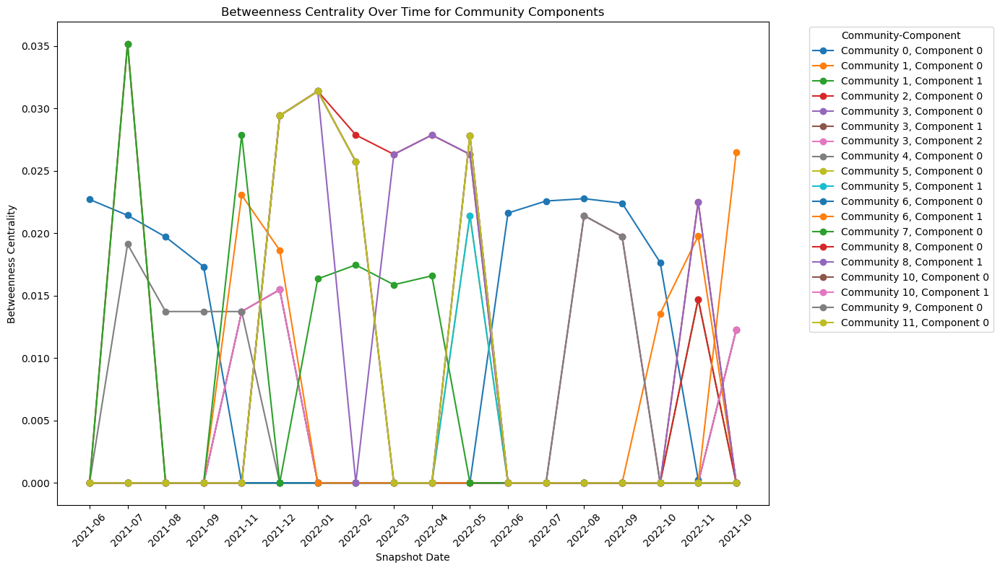

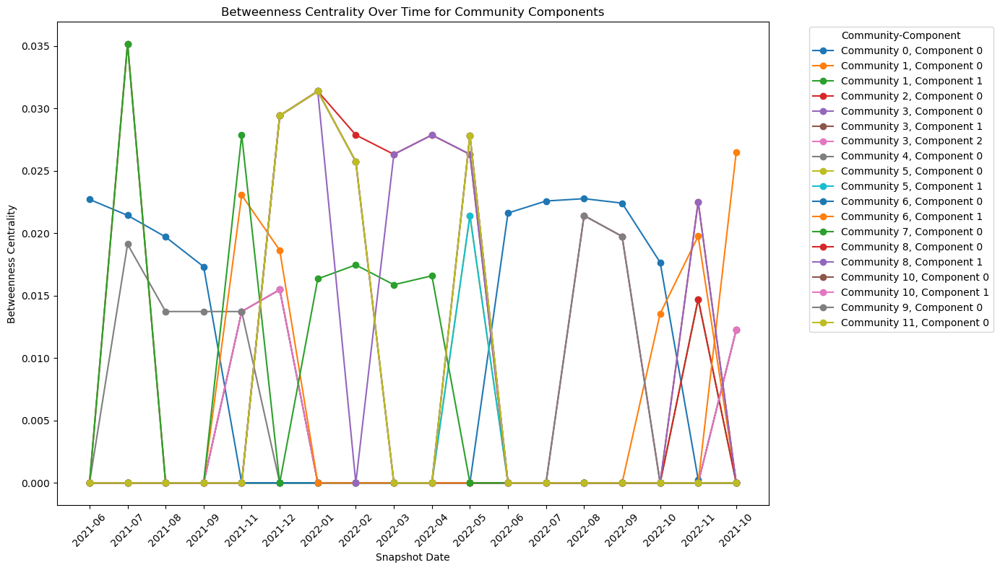

In [942]:
import matplotlib.pyplot as plt

def plot_betweenness_centrality_over_time(betweenness_flattened_df):
    """Plot betweenness centrality over time for each community-component pair."""
    
    plt.figure(figsize=(14, 8))

    for (community, component), data in betweenness_flattened_df.iterrows():
        dates = data.index  # Snapshot dates
        centralities = data.values  # Betweenness centrality values
        label = f"Community {community}, Component {component}"
        
        plt.plot(dates, centralities, marker='o', label=label)

    plt.xlabel("Snapshot Date")
    plt.ylabel("Betweenness Centrality")
    plt.title("Betweenness Centrality Over Time for Community Components")
    plt.xticks(rotation=45)
    plt.legend(title="Community-Component", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

# Fill NaN values with the last available value (forward fill)
betweenness_flattened_df = betweenness_flattened_df.fillna(method='ffill')

# Now plot the data
plot_betweenness_centrality_over_time(betweenness_flattened_df)

# Assuming betweenness_flattened_df is already created from the previous code
plot_betweenness_centrality_over_time(betweenness_flattened_df)


In [947]:
import pandas as pd
import networkx as nx
from collections import defaultdict

def calculate_eigenvector_centrality_for_components(graph):
    """Calculate the eigenvector centrality for each node within its component."""
    # Find all connected components
    components = list(nx.connected_components(graph))
    
    eigenvector_centrality = {}
    
    for component in components:
        subgraph = graph.subgraph(component)
        # Calculate eigenvector centrality for the subgraph (component)
        centrality = nx.eigenvector_centrality(subgraph, max_iter=1000)
        
        # Store the centrality values
        eigenvector_centrality.update(centrality)
    
    return eigenvector_centrality

def track_eigenvector_centrality_over_time(graph_directory, community_file, snapshot_dates):
    """Track the eigenvector centrality for each node across all snapshots for their respective components."""
    centrality_over_time = defaultdict(lambda: defaultdict(float))

    for snapshot_id, snapshot_date in snapshot_dates.items():
        graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        G = nx.read_graphml(graph_file)

        # Load and apply saved community assignments (assuming the function is defined elsewhere)
        load_and_apply_saved_communities(G, community_file, snapshot_id)

        # Calculate eigenvector centrality within components
        eigenvector_centrality = calculate_eigenvector_centrality_for_components(G)

        # Track the centrality over time for each community
        for node, centrality in eigenvector_centrality.items():
            community = G.nodes[node].get('community', 'Unknown')
            centrality_over_time[community][snapshot_date] += centrality
    
    return centrality_over_time

def aggregate_community_centrality(centrality_over_time):
    """Aggregate eigenvector centrality by community across snapshots."""
    community_centrality = defaultdict(list)

    for community, time_series in centrality_over_time.items():
        for date, centrality in time_series.items():
            community_centrality[community].append(centrality)
    
    # Average the centrality for each community
    community_centrality_avg = {community: sum(centralities)/len(centralities) 
                                for community, centralities in community_centrality.items()}
    
    return community_centrality_avg

# Paths and snapshot information
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Track eigenvector centrality over the entire period
centrality_over_time = track_eigenvector_centrality_over_time(graph_directory, community_file, snapshot_dates)

# Aggregate the centrality values by community
community_centrality_avg = aggregate_community_centrality(centrality_over_time)

# Convert the results to a DataFrame for better visualization and export
df_community_centrality = pd.DataFrame.from_dict(community_centrality_avg, orient='index', columns=['Average Eigenvector Centrality'])

# Display the results
print(df_community_centrality)

# Optionally, save the results to a CSV file
#output_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/community_eigenvector_centrality.csv'
#df_community_centrality.to_csv(output_file, index=True)


    Average Eigenvector Centrality
3                         3.721163
5                         1.581150
0                         2.847225
6                         3.164977
7                         2.912437
4                         1.484068
8                         1.522361
2                         1.732051
1                         5.589057
10                        1.049004
9                         0.206524
11                        0.473398


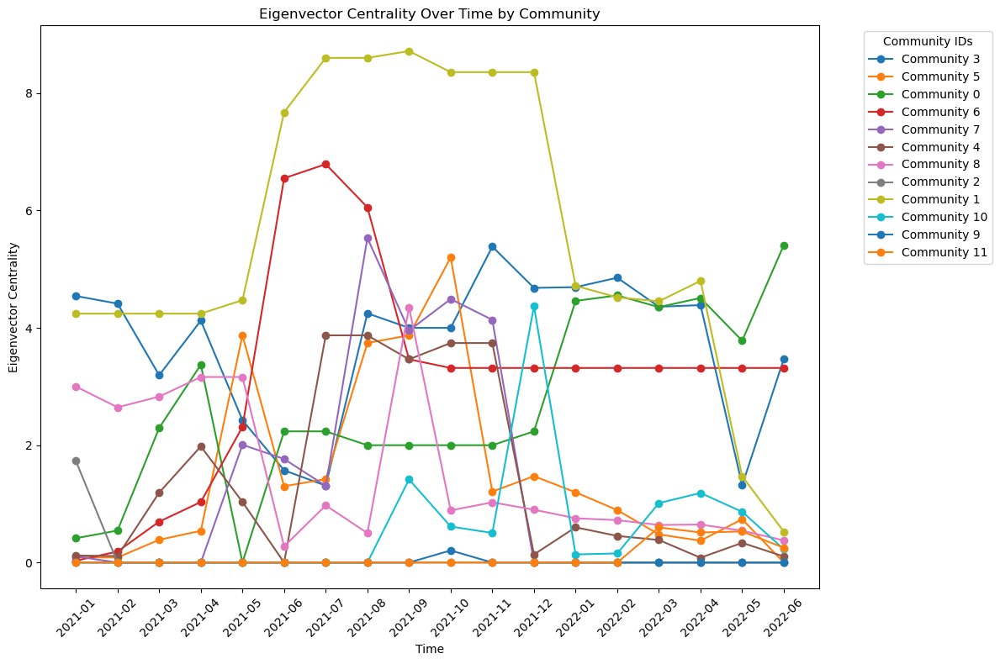

In [949]:
import matplotlib.pyplot as plt
import pandas as pd
import networkx as nx
from collections import defaultdict
from os.path import join

def calculate_eigenvector_centrality_for_components(graph):
    """Calculate the eigenvector centrality for each node within its component."""
    components = list(nx.connected_components(graph))
    eigenvector_centrality = {}
    
    for component in components:
        subgraph = graph.subgraph(component)
        centrality = nx.eigenvector_centrality(subgraph, max_iter=1000)
        for node, value in centrality.items():
            community = graph.nodes[node].get('community', 'Unknown')
            eigenvector_centrality[(node, community)] = value
    
    return eigenvector_centrality

def track_eigenvector_centrality_over_time(graph_directory, community_file, snapshot_dates):
    """Track the eigenvector centrality for each community across all snapshots for their respective components."""
    centrality_over_time = defaultdict(lambda: defaultdict(float))

    for snapshot_id, snapshot_date in snapshot_dates.items():
        graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        G = nx.read_graphml(graph_file)

        # Load and apply saved community assignments
        load_and_apply_saved_communities(G, community_file, snapshot_id)

        # Calculate eigenvector centrality within components
        eigenvector_centrality = calculate_eigenvector_centrality_for_components(G)

        # Track the centrality over time for each community
        for (node, community), centrality in eigenvector_centrality.items():
            centrality_over_time[community][snapshot_date] += centrality
    
    return centrality_over_time

def plot_eigenvector_centrality_over_time(centrality_over_time, snapshot_dates):
    """Plot the eigenvector centrality over time for each community."""
    df_centrality = pd.DataFrame(centrality_over_time).fillna(0)
    df_centrality = df_centrality.reindex(sorted(snapshot_dates.values()))

    plt.figure(figsize=(12, 8))
    for community in df_centrality.columns:
        plt.plot(df_centrality.index, df_centrality[community], marker='o', label=f'Community {community}')
    
    plt.xlabel("Time")
    plt.ylabel("Eigenvector Centrality")
    plt.title("Eigenvector Centrality Over Time by Community")
    plt.xticks(rotation=45)
    plt.legend(title="Community IDs", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

# Paths and snapshot information
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'
snapshot_dates = {
    '11659570': '2021-01',
    '11861210': '2021-02',
    '12043054': '2021-03',
    '12244515': '2021-04',
    '12438842': '2021-05',
    '12638919': '2021-06',
    '12831436': '2021-07',
    '13029639': '2021-08',
    '13230157': '2021-09',
    '13422506': '2021-10',
    '13620205': '2021-11',
    '13809597': '2021-12',
    '14009885': '2022-01',
    '14210564': '2022-02',
    '14391029': '2022-03',
    '14589816': '2022-04',
    '14779829': '2022-05',
    '14967365': '2022-06'
}

# Track eigenvector centrality over the entire period
centrality_over_time = track_eigenvector_centrality_over_time(graph_directory, community_file, snapshot_dates)

# Plot the eigenvector centrality over time for each community
plot_eigenvector_centrality_over_time(centrality_over_time, snapshot_dates)


In [945]:
import pandas as pd
import numpy as np

# Function to flatten any tuple to a numerical value
def flatten_tuple(x):
    if isinstance(x, tuple):
        return np.mean(x)  # Or any other operation you want to perform on the tuple
    return x

# Apply the flattening function to the entire DataFrame
betweenness_flattened_df = betweenness_flattened_df.applymap(flatten_tuple)

# Now replace NaN values with 0
betweenness_flattened_df = betweenness_flattened_df.fillna(0)


/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_9961/3287720042.py:11: FutureWarning:

DataFrame.applymap has been deprecated. Use DataFrame.map instead.



In [795]:
import pandas as pd

# Calculate the Pearson correlation coefficients
correlation_matrix = average_metrics_df[['Average Size', 'Average Density', 'Community Age']].corr()

# Define the path where the CSV will be saved
output_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/correlation_matrix.csv'

# Save the correlation matrix to a CSV file
#correlation_matrix.to_csv(output_path)

# Display the correlation matrix to verify
print(correlation_matrix)


                 Average Size  Average Density  Community Age
Average Size         1.000000        -0.897903       0.687467
Average Density     -0.897903         1.000000      -0.615167
Community Age        0.687467        -0.615167       1.000000


In [523]:
import networkx as nx
import pandas as pd
from os.path import join
from collections import defaultdict

def load_and_apply_saved_communities(graph, community_file, snapshot_id):
    """Load and apply the saved community assignments to the graph nodes."""
    community_df = pd.read_csv(community_file)
    community_df['Snapshot'] = community_df['Snapshot'].astype(str).str.strip()
    snapshot_id = str(snapshot_id).strip()

    # Convert community IDs to strings to ensure consistency
    community_df['Community'] = community_df['Community'].astype(str)
    
    # Filter the community data for the specific snapshot
    snapshot_communities = community_df[community_df['Snapshot'] == snapshot_id]

    if snapshot_communities.empty:
        print(f"No data found for Snapshot ID: {snapshot_id}")
        return

    # Create a mapping of node (wallet) to community
    community_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Community']))
    for node in graph.nodes():
        graph.nodes[node]['community'] = community_map.get(node, 'Unknown')

def calculate_centrality_for_communities(graph):
    """Calculate betweenness and closeness centrality for each node and aggregate by community."""
    community_centrality = defaultdict(lambda: {'betweenness': [], 'closeness': []})
    
    # Calculate centralities
    betweenness = nx.betweenness_centrality(graph)
    closeness = nx.closeness_centrality(graph)

    # Aggregate by community
    for node in graph.nodes():
        community = graph.nodes[node].get('community', 'Unknown')
        community_centrality[community]['betweenness'].append(betweenness[node])
        community_centrality[community]['closeness'].append(closeness[node])
    
    # Calculate average centralities per community
    for community, centralities in community_centrality.items():
        centralities['average_betweenness'] = sum(centralities['betweenness']) / len(centralities['betweenness'])
        centralities['average_closeness'] = sum(centralities['closeness']) / len(centralities['closeness'])

    return community_centrality

def track_and_aggregate_centrality(graph_directory, community_file, snapshot_dates):
    """Track the centrality measures for each community across all snapshots and aggregate results."""
    centrality_over_time = defaultdict(lambda: {'betweenness': [], 'closeness': []})

    for snapshot_id in snapshot_dates.keys():
        graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        G = nx.read_graphml(graph_file)

        # Apply saved community assignments
        load_and_apply_saved_communities(G, community_file, snapshot_id)

        # Calculate centralities for this snapshot
        community_centrality = calculate_centrality_for_communities(G)

        # Store the metrics over time
        for community, centralities in community_centrality.items():
            centrality_over_time[community]['betweenness'].append(centralities['average_betweenness'])
            centrality_over_time[community]['closeness'].append(centralities['average_closeness'])

    # Aggregate results and sort by community
    aggregated_data = []
    for community in sorted(centrality_over_time.keys(), key=lambda x: int(x)):
        avg_betweenness = sum(centrality_over_time[community]['betweenness']) / len(centrality_over_time[community]['betweenness'])
        avg_closeness = sum(centrality_over_time[community]['closeness']) / len(centrality_over_time[community]['closeness'])
        
        aggregated_data.append({
            'Community': community,
            'Average Betweenness Centrality': avg_betweenness,
            'Average Closeness Centrality': avg_closeness
        })

    return aggregated_data

# Paths and snapshot dates
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Track and aggregate centrality metrics over the entire period
aggregated_centrality_data = track_and_aggregate_centrality(graph_directory, community_file, snapshot_dates)

# Convert to DataFrame for analysis and export
aggregated_centrality_df = pd.DataFrame(aggregated_centrality_data)

# Save the DataFrame to a CSV file
output_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/community_centrality_snapshot_analysis.csv'
aggregated_centrality_df.to_csv(output_file, index=False)

# Display the DataFrame
print(aggregated_centrality_df)



   Community  Average Betweenness Centrality  Average Closeness Centrality
0          0                        0.007715                      0.221345
1          1                        0.001761                      0.148449
2          2                        0.000000                      0.017094
3          3                        0.005779                      0.214796
4          4                        0.005659                      0.195627
5          5                        0.006088                      0.234511
6          6                        0.000595                      0.138427
7          7                        0.003951                      0.262585
8          8                        0.003160                      0.224027
9          9                        0.000000                      0.202630
10        10                        0.003732                      0.274057
11        11                        0.001476                      0.358265


In [529]:
import os
import networkx as nx
import pandas as pd
from os.path import join
from collections import defaultdict

def load_and_apply_saved_communities(graph, community_file, snapshot_id):
    """Load and apply the saved community assignments to the graph nodes."""
    community_df = pd.read_csv(community_file)
    community_df['Snapshot'] = community_df['Snapshot'].astype(str).str.strip()
    snapshot_id = str(snapshot_id).strip()

    # Convert community IDs to strings to ensure consistency
    community_df['Community'] = community_df['Community'].astype(str)
    
    # Filter the community data for the specific snapshot
    snapshot_communities = community_df[community_df['Snapshot'] == snapshot_id]

    if snapshot_communities.empty:
        print(f"No data found for Snapshot ID: {snapshot_id}")
        return

    # Create a mapping of node (wallet) to community
    community_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Community']))
    for node in graph.nodes():
        graph.nodes[node]['community'] = community_map.get(node, 'Unknown')

def calculate_betweenness_centrality_for_communities(graph):
    """Calculate betweenness centrality for each node and aggregate by community."""
    community_centrality = defaultdict(lambda: {'betweenness': defaultdict(float), 'count': defaultdict(int)})
    
    # Calculate betweenness centrality
    betweenness = nx.betweenness_centrality(graph)

    # Aggregate by community
    for node in graph.nodes():
        community = graph.nodes[node].get('community', 'Unknown')
        community_centrality[community]['betweenness'][node] += betweenness[node]
        community_centrality[community]['count'][node] += 1
    
    # Calculate average betweenness centrality per node within each community
    for community, centralities in community_centrality.items():
        for node in centralities['betweenness'].keys():
            centralities['betweenness'][node] /= centralities['count'][node]

    return community_centrality

def track_and_aggregate_betweenness_centrality(graph_directory, community_file, snapshot_dates):
    """Track the betweenness centrality measures for each community across all snapshots and aggregate results."""
    community_centrality_over_time = defaultdict(lambda: {'betweenness': defaultdict(float), 'count': defaultdict(int)})

    for snapshot_id in snapshot_dates.keys():
        graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        G = nx.read_graphml(graph_file)

        # Apply saved community assignments
        load_and_apply_saved_communities(G, community_file, snapshot_id)

        # Calculate betweenness centrality for this snapshot
        community_centrality = calculate_betweenness_centrality_for_communities(G)

        # Store the metrics over time
        for community, centralities in community_centrality.items():
            for node, betweenness in centralities['betweenness'].items():
                community_centrality_over_time[community]['betweenness'][node] += betweenness
                community_centrality_over_time[community]['count'][node] += 1

    # Calculate average betweenness centrality per node within each community across all snapshots
    for community, centralities in community_centrality_over_time.items():
        for node in centralities['betweenness'].keys():
            centralities['betweenness'][node] /= centralities['count'][node]

    return community_centrality_over_time

def find_top_5_average_betweenness_centrality_nodes(community_centrality_over_time):
    """Find the top 5 nodes with the highest average betweenness centrality in each community."""
    top_centrality_nodes = []

    for community, centralities in community_centrality_over_time.items():
        # Sort nodes by betweenness centrality and get the top 5
        sorted_betweenness = sorted(centralities['betweenness'].items(), key=lambda item: item[1], reverse=True)[:5]
        
        for node, betweenness in sorted_betweenness:
            top_centrality_nodes.append({
                'Community': community,
                'Node': node,
                'Average Betweenness Centrality': betweenness
            })

    return top_centrality_nodes

# Paths and snapshot dates
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Track and aggregate betweenness centrality metrics over the entire period
community_centrality_over_time = track_and_aggregate_betweenness_centrality(graph_directory, community_file, snapshot_dates)

# Find the top 5 nodes with the highest average betweenness centrality in each community
top_centrality_nodes = find_top_5_average_betweenness_centrality_nodes(community_centrality_over_time)

# Convert to DataFrame for analysis and export
top_centrality_nodes_df = pd.DataFrame(top_centrality_nodes)

# Save the DataFrame to a CSV file
output_file = '//Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/top_5_average_betweenness_centrality_nodes.csv'
top_centrality_nodes_df.to_csv(output_file, index=False)

# Display the DataFrame
print(top_centrality_nodes_df)


   Community                                        Node  \
0          0  0xe93381fb4c4f14bda253907b18fad305d799241a   
1          0  0x28c6c06298d514db089934071355e5743bf21d60   
2          0  0x2faf487a4414fe77e2327f0bf4ae2a264a776ad2   
3          0  0xbe0eb53f46cd790cd13851d5eff43d12404d33e8   
4          0  0x3f5ce5fbfe3e9af3971dd833d26ba9b5c936f0be   
5          1  0x28c6c06298d514db089934071355e5743bf21d60   
6          1  0x40ec5b33f54e0e8a33a975908c5ba1c14e5bbbdf   
7          1  0x26a78d5b6d7a7aceedd1e6ee3229b372a624d8b7   
8          1  0xc697051d1c6296c24ae3bcef39aca743861d9a81   
9          1  0x3744da57184575064838bbc87a0fc791f5e39ea2   
10         3  0xf977814e90da44bfa03b6295a0616a897441acec   
11         3  0x3dfd23a6c5e8bbcfc9581d2e864a68feb6a076d3   
12         3  0x5e89f8d81c74e311458277ea1be3d3247c7cd7d1   
13         3  0xa0446d8804611944f1b527ecd37d7dcbe442caba   
14         3  0x26732399f47e00739d2b4b0451acc3f93f7e3a14   
15         4  0xbe0eb53f46cd790cd13851d5

In [276]:
import pandas as pd
import networkx as nx
from os.path import join
from collections import defaultdict
import matplotlib.pyplot as plt

def load_and_apply_saved_communities(graph, community_file, snapshot_id):
    """Load and apply the saved community assignments to the graph nodes."""
    community_df = pd.read_csv(community_file)
    community_df['Snapshot'] = community_df['Snapshot'].astype(str).str.strip()
    snapshot_id = str(snapshot_id).strip()

    # Convert community IDs to strings to ensure consistency
    community_df['Community'] = community_df['Community'].astype(str)
    
    # Filter the community data for the specific snapshot
    snapshot_communities = community_df[community_df['Snapshot'] == snapshot_id]

    if snapshot_communities.empty:
        print(f"No data found for Snapshot ID: {snapshot_id}")
        return

    # Create a mapping of node (wallet) to community
    community_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Community']))
    for node in graph.nodes():
        graph.nodes[node]['community'] = community_map.get(node, 'Unknown')

def calculate_community_sizes(graph):
    """Calculate the size of each community in the graph."""
    community_sizes = defaultdict(int)
    for node, data in graph.nodes(data=True):
        community = data.get('community', 'Unknown')
        community_sizes[community] += 1
    return community_sizes

def track_community_growth_over_time(graph_directory, community_file, snapshot_dates):
    """Track the growth of each community across all snapshots."""
    community_size_over_time = defaultdict(lambda: defaultdict(int))

    for snapshot_id in snapshot_dates.keys():
        graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        G = nx.read_graphml(graph_file)

        # Apply saved community assignments
        load_and_apply_saved_communities(G, community_file, snapshot_id)

        # Calculate community sizes for this snapshot
        community_sizes = calculate_community_sizes(G)

        # Store the community sizes with respect to the snapshot date
        snapshot_date = pd.to_datetime(snapshot_dates[snapshot_id])  # Convert to datetime
        for community, size in community_sizes.items():
            community_size_over_time[community][snapshot_date] = size

    return community_size_over_time

def calculate_community_growth(community_size_over_time):
    """Calculate the growth of each community over the entire period."""
    community_growth = {}

    for community, sizes in community_size_over_time.items():
        sorted_dates = sorted(sizes.keys())
        initial_size = sizes[sorted_dates[0]]
        final_size = sizes[sorted_dates[-1]]
        growth = final_size - initial_size
        growth_percentage = (growth / initial_size) * 100 if initial_size > 0 else float('inf')
        community_growth[community] = {
            'Initial Size': initial_size,
            'Final Size': final_size,
            'Growth': growth,
            'Growth Percentage': growth_percentage
        }

    return community_growth

def print_community_growth_statistics(community_growth):
    """Print the growth statistics for each community."""
    print("Community Growth Statistics:")
    for community, stats in community_growth.items():
        print(f"\nCommunity {community}:")
        print(f"  Initial Size: {stats['Initial Size']}")
        print(f"  Final Size: {stats['Final Size']}")
        print(f"  Growth: {stats['Growth']}")
        print(f"  Growth Percentage: {stats['Growth Percentage']:.2f}%")

# Paths and snapshot dates
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Track community growth over the entire period
community_size_over_time = track_community_growth_over_time(graph_directory, community_file, snapshot_dates)

# Calculate community growth statistics
community_growth = calculate_community_growth(community_size_over_time)

# Print the community growth statistics
print_community_growth_statistics(community_growth)


Community Growth Statistics:

Community 0:
  Initial Size: 19
  Final Size: 32
  Growth: 13
  Growth Percentage: 68.42%

Community 1:
  Initial Size: 18
  Final Size: 46
  Growth: 28
  Growth Percentage: 155.56%

Community 3:
  Initial Size: 21
  Final Size: 40
  Growth: 19
  Growth Percentage: 90.48%

Community 4:
  Initial Size: 17
  Final Size: 14
  Growth: -3
  Growth Percentage: -17.65%

Community 5:
  Initial Size: 17
  Final Size: 13
  Growth: -4
  Growth Percentage: -23.53%

Community 6:
  Initial Size: 8
  Final Size: 11
  Growth: 3
  Growth Percentage: 37.50%

Community 7:
  Initial Size: 6
  Final Size: 28
  Growth: 22
  Growth Percentage: 366.67%

Community 8:
  Initial Size: 9
  Final Size: 22
  Growth: 13
  Growth Percentage: 144.44%

Community 2:
  Initial Size: 3
  Final Size: 3
  Growth: 0
  Growth Percentage: 0.00%

Community 10:
  Initial Size: 20
  Final Size: 25
  Growth: 5
  Growth Percentage: 25.00%

Community 9:
  Initial Size: 8
  Final Size: 8
  Growth: 0
  Gr

# Track node membership over time

In [277]:
import pandas as pd
import networkx as nx
from os.path import join
from collections import defaultdict

def load_and_apply_saved_communities(graph, community_file, snapshot_id):
    """Load and apply the saved community assignments to the graph nodes."""
    community_df = pd.read_csv(community_file)
    community_df['Snapshot'] = community_df['Snapshot'].astype(str).str.strip()
    snapshot_id = str(snapshot_id).strip()

    # Convert community IDs to strings to ensure consistency
    community_df['Community'] = community_df['Community'].astype(str)
    
    # Filter the community data for the specific snapshot
    snapshot_communities = community_df[community_df['Snapshot'] == snapshot_id]

    if snapshot_communities.empty:
        print(f"No data found for Snapshot ID: {snapshot_id}")
        return

    # Create a mapping of node (wallet) to community
    community_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Community']))
    for node in graph.nodes():
        graph.nodes[node]['community'] = community_map.get(node, 'Unknown')

def track_node_membership_over_time(graph_directory, community_file, snapshot_dates):
    """Track each node's community membership across all snapshots."""
    node_communities_over_time = defaultdict(list)

    for snapshot_id in snapshot_dates.keys():
        graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        G = nx.read_graphml(graph_file)

        # Apply saved community assignments
        load_and_apply_saved_communities(G, community_file, snapshot_id)

        # Track community membership for each node
        for node, data in G.nodes(data=True):
            community = data.get('community', 'Unknown')
            node_communities_over_time[node].append(community)

    return node_communities_over_time

# Paths and snapshot dates
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Track node membership over time
node_communities_over_time = track_node_membership_over_time(graph_directory, community_file, snapshot_dates)

# Example output
for node, communities in list(node_communities_over_time.items())[:5]:
    print(f"Node: {node}, Communities over time: {communities}")


Node: 0x338286c0bc081891a4bda39c7667ae150bf5d206, Communities over time: ['0']
Node: 0xe94b5eec1fa96ceecbd33ef5baa8d00e4493f4f3, Communities over time: ['0', '0', '0', '0', '6', '6', '6', '7', '7', '7', '7', '10', '0', '0', '11', '11', '11', '11']
Node: 0x3e40d73eb977dc6a537af587d48316fee66e9c8c, Communities over time: ['1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1']
Node: 0x447f95026107aaed7472a0470931e689f51e0e42, Communities over time: ['1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1']
Node: 0xe93381fb4c4f14bda253907b18fad305d799241a, Communities over time: ['0', '0', '0', '0', '4', '6', '6', '7', '7', '7', '7', '10', '11', '11']


In [278]:
def calculate_community_stability(node_communities_over_time):
    """Calculate the stability of each community across snapshots."""
    stability_counts = defaultdict(int)
    transition_counts = defaultdict(int)

    for node, communities in node_communities_over_time.items():
        for i in range(len(communities) - 1):
            if communities[i] == communities[i + 1]:
                stability_counts[communities[i]] += 1
            else:
                transition_counts[(communities[i], communities[i + 1])] += 1

    return stability_counts, transition_counts

# Calculate community stability
stability_counts, transition_counts = calculate_community_stability(node_communities_over_time)

# Display stability results
print("Community Stability Counts:")
for community, count in stability_counts.items():
    print(f"Community {community}: {count} stable nodes")

print("\nCommunity Transition Counts:")
for (community_from, community_to), count in transition_counts.items():
    print(f"Transition from Community {community_from} to Community {community_to}: {count} nodes")


Community Stability Counts:
Community 0: 217 stable nodes
Community 6: 215 stable nodes
Community 7: 103 stable nodes
Community 11: 28 stable nodes
Community 1: 508 stable nodes
Community 3: 355 stable nodes
Community 4: 208 stable nodes
Community 5: 263 stable nodes
Community 10: 132 stable nodes
Community 8: 197 stable nodes

Community Transition Counts:
Transition from Community 0 to Community 6: 21 nodes
Transition from Community 6 to Community 7: 41 nodes
Transition from Community 7 to Community 10: 36 nodes
Transition from Community 10 to Community 0: 24 nodes
Transition from Community 0 to Community 11: 8 nodes
Transition from Community 0 to Community 4: 1 nodes
Transition from Community 4 to Community 6: 15 nodes
Transition from Community 10 to Community 11: 1 nodes
Transition from Community 7 to Community 4: 1 nodes
Transition from Community 4 to Community 0: 1 nodes
Transition from Community 4 to Community 7: 1 nodes
Transition from Community 5 to Community 8: 12 nodes
Transi

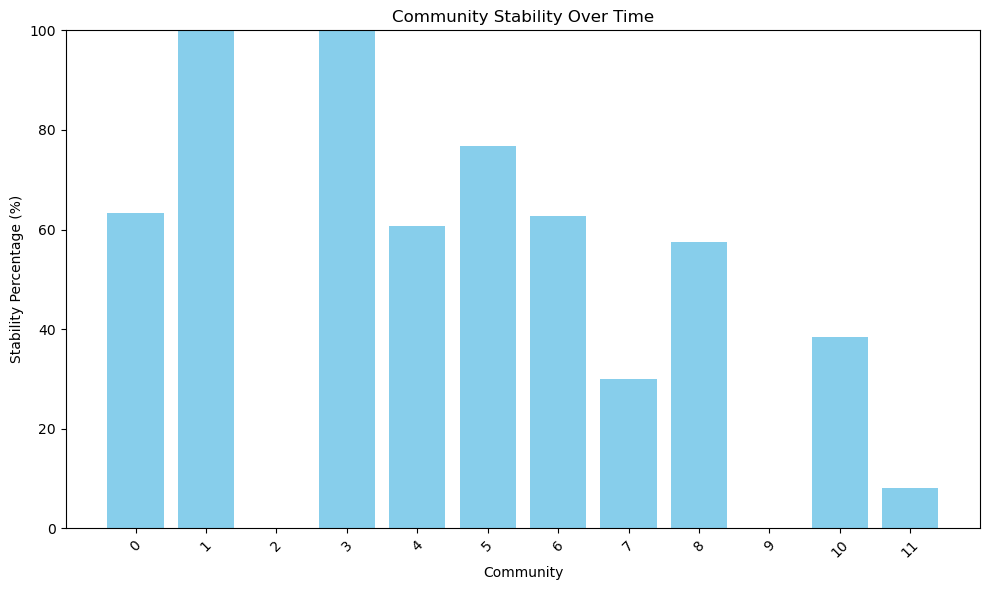

In [279]:
import matplotlib.pyplot as plt

def plot_community_stability(stability_counts, total_nodes):
    """Plot the stability of each community as a percentage of stable nodes, ensuring the x-axis goes from 0 to 11."""
    communities = list(range(12))  # Ensure communities from 0 to 11 are included
    stability_percentages = [(stability_counts.get(str(community), 0) / total_nodes) * 100 for community in communities]

    plt.figure(figsize=(10, 6))
    plt.bar(communities, stability_percentages, color='skyblue')
    plt.xlabel("Community")
    plt.ylabel("Stability Percentage (%)")
    plt.title("Community Stability Over Time")
    plt.xticks(communities, rotation=45)
    plt.ylim(0, 100)  # Assuming we want to show the percentage from 0% to 100%
    plt.tight_layout()
    plt.show()

# Assuming total_nodes is the number of unique nodes in the dataset
total_nodes = len(node_communities_over_time)

# Plot community stability
plot_community_stability(stability_counts, total_nodes)


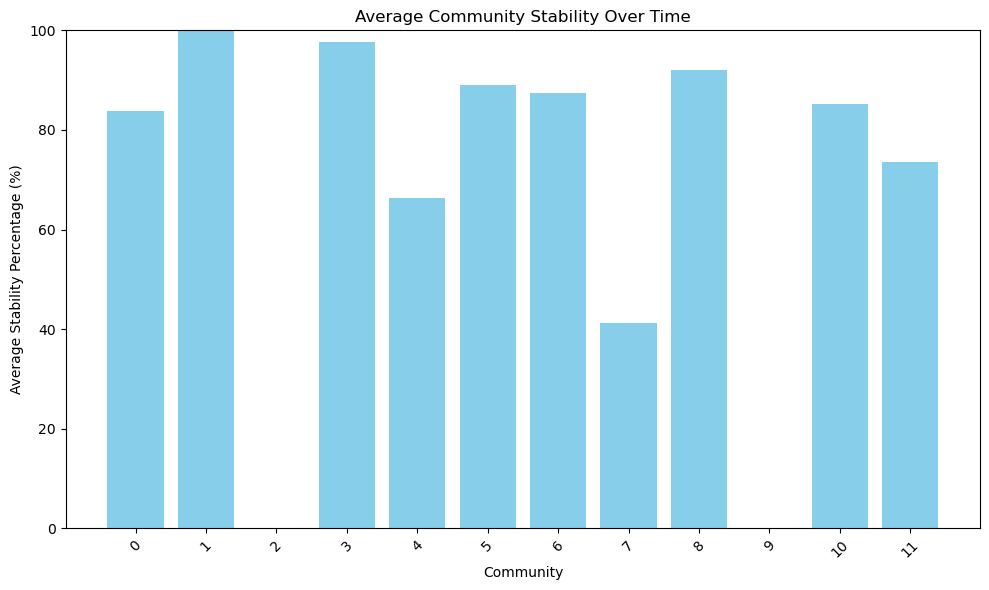

In [280]:
def calculate_community_stability(node_communities_over_time, snapshot_dates):
    """Calculate the stability of each community across snapshots as a percentage."""
    stability_percentages = defaultdict(float)
    community_sizes = defaultdict(lambda: defaultdict(int))

    snapshots = list(snapshot_dates.values())

    # Initialize stability and community size trackers
    community_stability = defaultdict(lambda: defaultdict(int))  # community_stability[community][snapshot] = stable nodes
    total_nodes_in_community = defaultdict(lambda: defaultdict(int))  # total nodes per community per snapshot

    # Track node stability and community sizes over time
    for node, communities in node_communities_over_time.items():
        for i in range(len(communities) - 1):
            snapshot_current = snapshots[i]
            snapshot_next = snapshots[i + 1]
            current_community = communities[i]
            next_community = communities[i + 1]

            total_nodes_in_community[current_community][snapshot_current] += 1
            if current_community == next_community:
                community_stability[current_community][snapshot_current] += 1

    # Calculate stability percentages
    for community in community_stability.keys():
        for snapshot in community_stability[community].keys():
            if total_nodes_in_community[community][snapshot] > 0:
                stability_percentages[community] += (community_stability[community][snapshot] / total_nodes_in_community[community][snapshot])

    # Average stability percentage over all snapshots
    for community in stability_percentages.keys():
        stability_percentages[community] = (stability_percentages[community] / (len(snapshots) - 1)) * 100

    return stability_percentages

def plot_community_stability(stability_percentages):
    """Plot the stability of each community as a percentage of stable nodes."""
    communities = list(range(12))  # Ensure communities from 0 to 11 are included
    stability_values = [stability_percentages.get(str(community), 0) for community in communities]

    plt.figure(figsize=(10, 6))
    plt.bar(communities, stability_values, color='skyblue')
    plt.xlabel("Community")
    plt.ylabel("Average Stability Percentage (%)")
    plt.title("Average Community Stability Over Time")
    plt.xticks(communities, rotation=45)
    plt.ylim(0, 100)  # Correctly constrained to 0-100%
    plt.tight_layout()
    plt.show()

# Calculate community stability correctly
stability_percentages = calculate_community_stability(node_communities_over_time, snapshot_dates)

# Plot community stability
plot_community_stability(stability_percentages)


# Community influence

In [281]:
import networkx as nx
import pandas as pd
from os.path import join
from collections import defaultdict

def load_and_apply_saved_communities(graph, community_file, snapshot_id):
    """Load and apply the saved community assignments to the graph nodes."""
    community_df = pd.read_csv(community_file)
    community_df['Snapshot'] = community_df['Snapshot'].astype(str).str.strip()
    snapshot_id = str(snapshot_id).strip()

    # Convert community IDs to strings to ensure consistency
    community_df['Community'] = community_df['Community'].astype(str)
    
    # Filter the community data for the specific snapshot
    snapshot_communities = community_df[community_df['Snapshot'] == snapshot_id]

    if snapshot_communities.empty:
        print(f"No data found for Snapshot ID: {snapshot_id}")
        return

    # Create a mapping of node (wallet) to community
    community_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Community']))
    for node in graph.nodes():
        graph.nodes[node]['community'] = community_map.get(node, 'Unknown')

def calculate_centrality_measures(graph):
    """Calculate degree, betweenness, and closeness centrality for each node in the graph."""
    degree_centrality = nx.degree_centrality(graph)
    betweenness_centrality = nx.betweenness_centrality(graph)
    closeness_centrality = nx.closeness_centrality(graph)

    return degree_centrality, betweenness_centrality, closeness_centrality


In [282]:
def aggregate_centrality_by_community(graph, degree_centrality, betweenness_centrality, closeness_centrality):
    """Aggregate centrality measures for each community."""
    community_centrality = defaultdict(lambda: defaultdict(float))

    for node, data in graph.nodes(data=True):
        community = data.get('community', 'Unknown')
        community_centrality[community]['degree'] += degree_centrality[node]
        community_centrality[community]['betweenness'] += betweenness_centrality[node]
        community_centrality[community]['closeness'] += closeness_centrality[node]
        community_centrality[community]['count'] += 1

    # Calculate the average centrality for each community
    for community, centrality in community_centrality.items():
        centrality['degree'] /= centrality['count']
        centrality['betweenness'] /= centrality['count']
        centrality['closeness'] /= centrality['count']

    return community_centrality


In [283]:
def analyze_community_influence(graph_directory, community_file, snapshot_id):
    """Analyze the influence of each community based on centrality measures."""
    graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
    G = nx.read_graphml(graph_file)

    # Apply saved community assignments
    load_and_apply_saved_communities(G, community_file, snapshot_id)

    # Calculate centrality measures
    degree_centrality, betweenness_centrality, closeness_centrality = calculate_centrality_measures(G)

    # Aggregate centrality by community
    community_centrality = aggregate_centrality_by_community(G, degree_centrality, betweenness_centrality, closeness_centrality)

    return community_centrality

def print_community_influence(community_centrality):
    """Print the influence of each community based on centrality measures."""
    print(f"{'Community':<10} {'Degree':>10} {'Betweenness':>15} {'Closeness':>10}")
    print("-" * 40)
    for community, centrality in community_centrality.items():
        print(f"{community:<10} {centrality['degree']:>10.4f} {centrality['betweenness']:>15.4f} {centrality['closeness']:>10.4f}")

# Example usage
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'
snapshot_id = '11659570'  # Example snapshot ID

# Analyze community influence for the given snapshot
community_centrality = analyze_community_influence(graph_directory, community_file, snapshot_id)

# Print community influence results
print_community_influence(community_centrality)


Community      Degree     Betweenness  Closeness
----------------------------------------
0              0.1129          0.0183     0.3394
1              0.1453          0.0000     0.1453
3              0.1779          0.0101     0.2633
4              0.1493          0.0131     0.2693
5              0.1423          0.0098     0.2410
6              0.0769          0.0008     0.2707
7              0.0598          0.0040     0.3023
8              0.0684          0.0000     0.0684
2              0.0171          0.0000     0.0171


In [284]:
import networkx as nx
import pandas as pd
from os.path import join
from collections import defaultdict

def load_and_apply_saved_communities(graph, community_file, snapshot_id):
    """Load and apply the saved community assignments to the graph nodes."""
    community_df = pd.read_csv(community_file)
    community_df['Snapshot'] = community_df['Snapshot'].astype(str).str.strip()
    snapshot_id = str(snapshot_id).strip()

    # Convert community IDs to strings to ensure consistency
    community_df['Community'] = community_df['Community'].astype(str)
    
    # Filter the community data for the specific snapshot
    snapshot_communities = community_df[community_df['Snapshot'] == snapshot_id]

    if snapshot_communities.empty:
        print(f"No data found for Snapshot ID: {snapshot_id}")
        return

    # Create a mapping of node (wallet) to community
    community_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Community']))
    for node in graph.nodes():
        graph.nodes[node]['community'] = community_map.get(node, 'Unknown')

def calculate_centrality_measures(graph):
    """Calculate degree, betweenness, and closeness centrality for each node in the graph."""
    degree_centrality = nx.degree_centrality(graph)
    betweenness_centrality = nx.betweenness_centrality(graph)
    closeness_centrality = nx.closeness_centrality(graph)

    return degree_centrality, betweenness_centrality, closeness_centrality

def aggregate_centrality_by_community(graph, degree_centrality, betweenness_centrality, closeness_centrality):
    """Aggregate centrality measures for each community."""
    community_centrality = defaultdict(lambda: defaultdict(float))

    for node, data in graph.nodes(data=True):
        community = data.get('community', 'Unknown')
        community_centrality[community]['degree'] += degree_centrality[node]
        community_centrality[community]['betweenness'] += betweenness_centrality[node]
        community_centrality[community]['closeness'] += closeness_centrality[node]
        community_centrality[community]['count'] += 1

    # Calculate the average centrality for each community
    for community, centrality in community_centrality.items():
        centrality['degree'] /= centrality['count']
        centrality['betweenness'] /= centrality['count']
        centrality['closeness'] /= centrality['count']

    return community_centrality

def analyze_community_influence_across_snapshots(graph_directory, community_file, snapshot_dates):
    """Analyze the influence of each community based on centrality measures across all snapshots."""
    overall_community_centrality = defaultdict(lambda: defaultdict(float))

    for snapshot_id in snapshot_dates.keys():
        graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        G = nx.read_graphml(graph_file)

        # Apply saved community assignments
        load_and_apply_saved_communities(G, community_file, snapshot_id)

        # Calculate centrality measures
        degree_centrality, betweenness_centrality, closeness_centrality = calculate_centrality_measures(G)

        # Aggregate centrality by community for this snapshot
        snapshot_community_centrality = aggregate_centrality_by_community(G, degree_centrality, betweenness_centrality, closeness_centrality)

        # Add to overall community centrality
        for community, centrality in snapshot_community_centrality.items():
            overall_community_centrality[community]['degree'] += centrality['degree']
            overall_community_centrality[community]['betweenness'] += centrality['betweenness']
            overall_community_centrality[community]['closeness'] += centrality['closeness']
            overall_community_centrality[community]['count'] += 1

    # Calculate average centrality measures across all snapshots
    for community, centrality in overall_community_centrality.items():
        centrality['degree'] /= centrality['count']
        centrality['betweenness'] /= centrality['count']
        centrality['closeness'] /= centrality['count']

    return overall_community_centrality

def print_community_influence(community_centrality):
    """Print the influence of each community based on centrality measures."""
    print(f"{'Community':<10} {'Degree':>10} {'Betweenness':>15} {'Closeness':>10}")
    print("-" * 40)
    for community, centrality in community_centrality.items():
        print(f"{community:<10} {centrality['degree']:>10.4f} {centrality['betweenness']:>15.4f} {centrality['closeness']:>10.4f}")

# Paths and snapshot dates
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Analyze community influence across all snapshots
overall_community_centrality = analyze_community_influence_across_snapshots(graph_directory, community_file, snapshot_dates)

# Print community influence results
print_community_influence(overall_community_centrality)


Community      Degree     Betweenness  Closeness
----------------------------------------
0              0.0777          0.0077     0.2213
1              0.1134          0.0018     0.1484
3              0.1073          0.0058     0.2148
4              0.0952          0.0057     0.1956
5              0.0982          0.0061     0.2345
6              0.0696          0.0006     0.1384
7              0.0972          0.0040     0.2626
8              0.0700          0.0032     0.2240
2              0.0171          0.0000     0.0171
10             0.0702          0.0037     0.2741
9              0.0449          0.0000     0.2026
11             0.0641          0.0015     0.3583


# Community evolution

/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_9961/3730911005.py:31: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



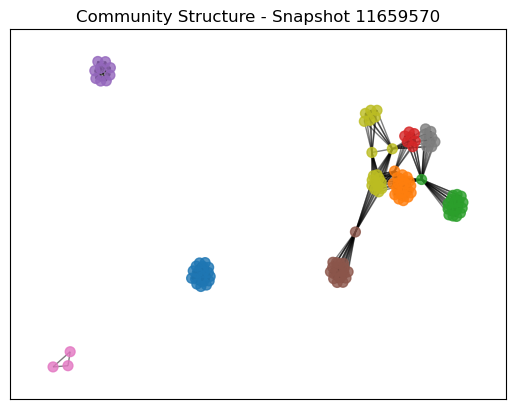

In [269]:
import networkx as nx
import matplotlib.pyplot as plt
from os.path import join
import pandas as pd

def load_and_apply_saved_communities(graph, community_file, snapshot_id):
    """Load and apply the saved community assignments to the graph nodes."""
    community_df = pd.read_csv(community_file)
    community_df['Snapshot'] = community_df['Snapshot'].astype(str).str.strip()
    snapshot_id = str(snapshot_id).strip()

    # Convert community IDs to strings to ensure consistency
    community_df['Community'] = community_df['Community'].astype(str)
    
    # Filter the community data for the specific snapshot
    snapshot_communities = community_df[community_df['Snapshot'] == snapshot_id]

    if snapshot_communities.empty:
        print(f"No data found for Snapshot ID: {snapshot_id}")
        return

    # Create a mapping of node (wallet) to community
    community_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Community']))
    for node in graph.nodes():
        graph.nodes[node]['community'] = community_map.get(node, 'Unknown')

def visualize_communities(graph, snapshot_id, title=None):
    """Visualize the network with nodes color-coded by community."""
    pos = nx.spring_layout(graph, seed=42)  # Position nodes using a force-directed layout
    communities = set(nx.get_node_attributes(graph, 'community').values())
    community_colors = {community: plt.cm.get_cmap('tab10')(i) for i, community in enumerate(communities)}

    # Draw nodes, color-coded by community
    node_colors = [community_colors[data['community']] for node, data in graph.nodes(data=True)]
    nx.draw_networkx_nodes(graph, pos, node_color=node_colors, node_size=50, alpha=0.8)
    
    # Draw edges
    nx.draw_networkx_edges(graph, pos, alpha=0.5)
    
    # Add labels if desired
    if title:
        plt.title(title)
    
    plt.show()

# Example usage for a single snapshot
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'
snapshot_id = '11659570'  # Example snapshot ID

# Load the graph and apply community assignments
graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
G = nx.read_graphml(graph_file)
load_and_apply_saved_communities(G, community_file, snapshot_id)

# Visualize the network
visualize_communities(G, snapshot_id, title=f"Community Structure - Snapshot {snapshot_id}")


/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_9961/3730911005.py:31: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



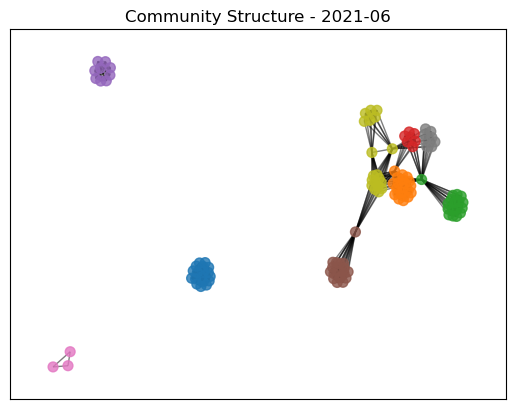

/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_9961/3730911005.py:31: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



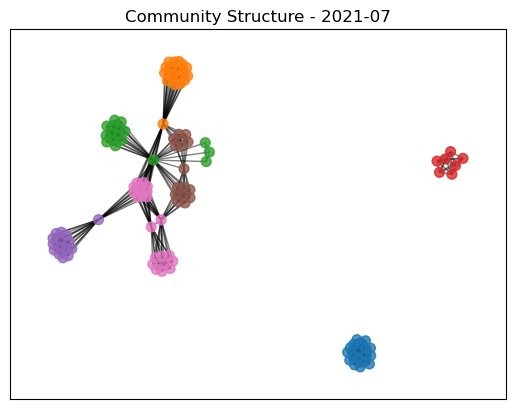

/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_9961/3730911005.py:31: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



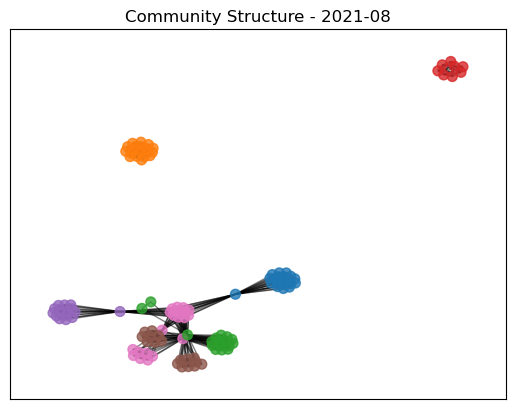

/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_9961/3730911005.py:31: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



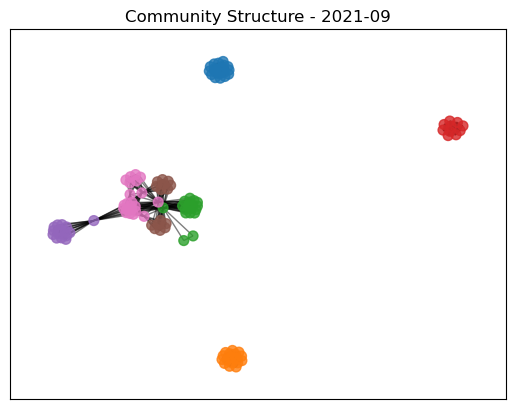

/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_9961/3730911005.py:31: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



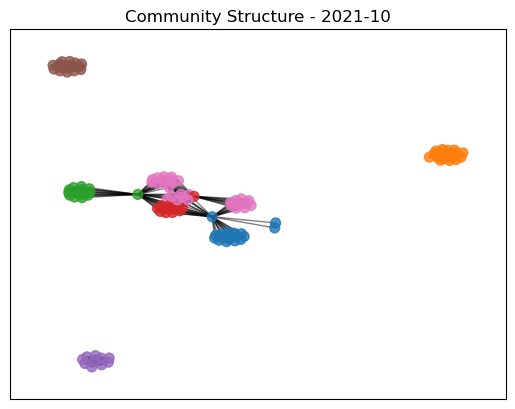

/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_9961/3730911005.py:31: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



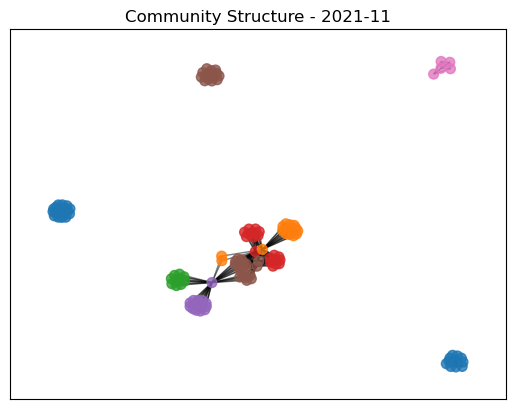

/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_9961/3730911005.py:31: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



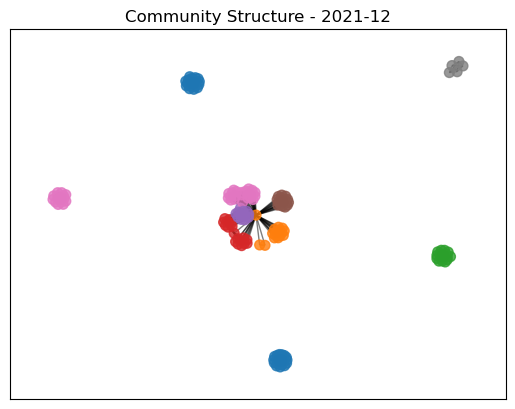

/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_9961/3730911005.py:31: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



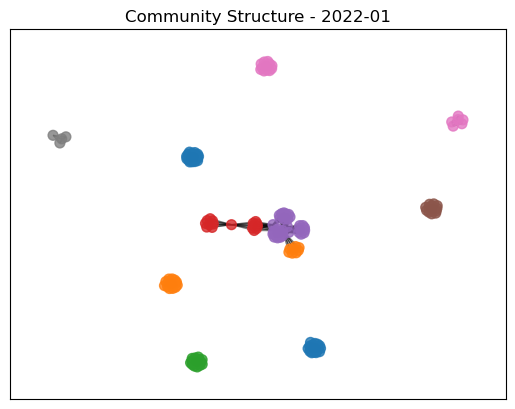

/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_9961/3730911005.py:31: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



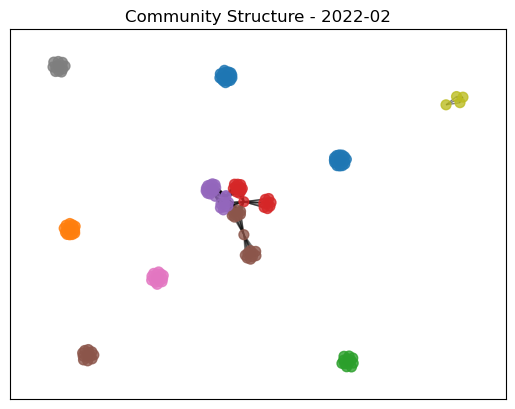

/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_9961/3730911005.py:31: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



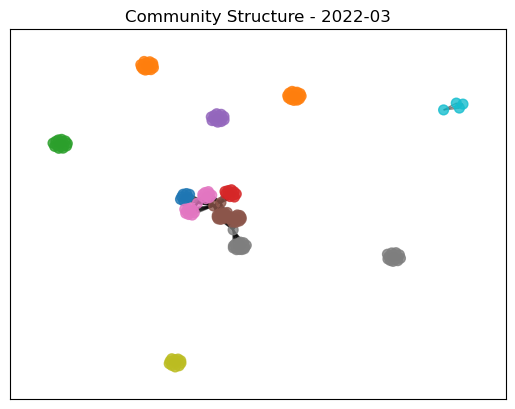

/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_9961/3730911005.py:31: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



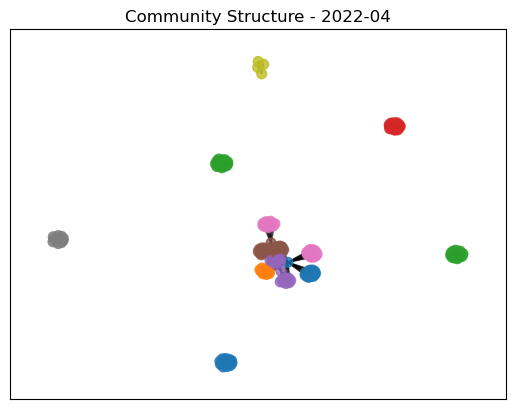

/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_9961/3730911005.py:31: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



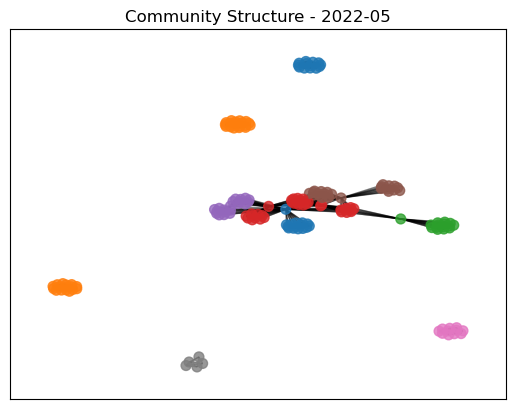

/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_9961/3730911005.py:31: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



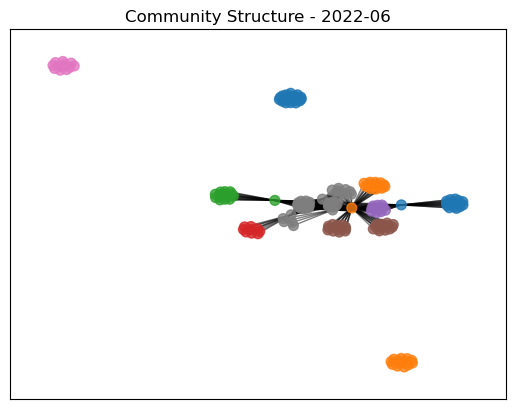

/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_9961/3730911005.py:31: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



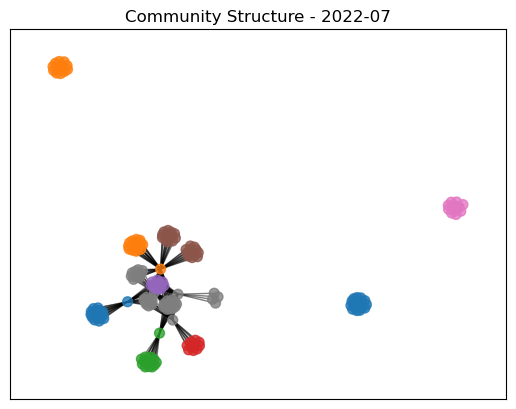

/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_9961/3730911005.py:31: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



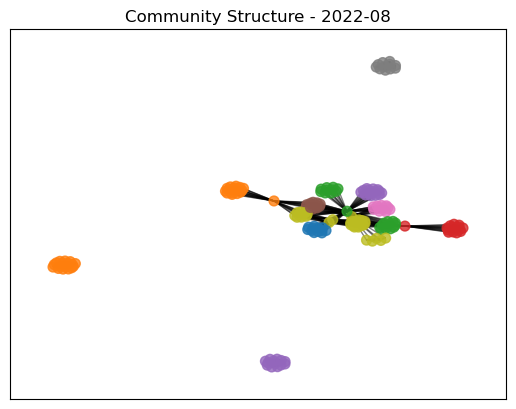

/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_9961/3730911005.py:31: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



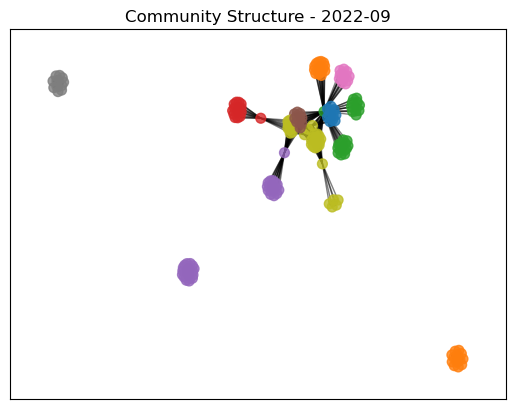

/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_9961/3730911005.py:31: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



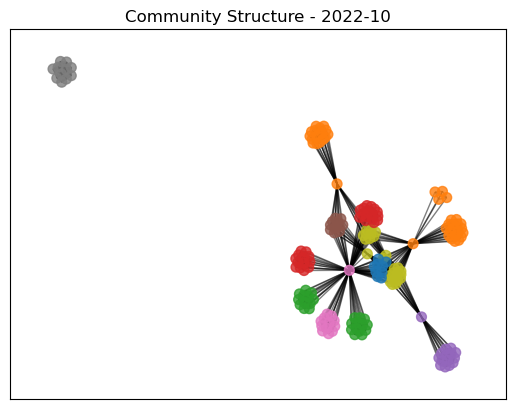

/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_9961/3730911005.py:31: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



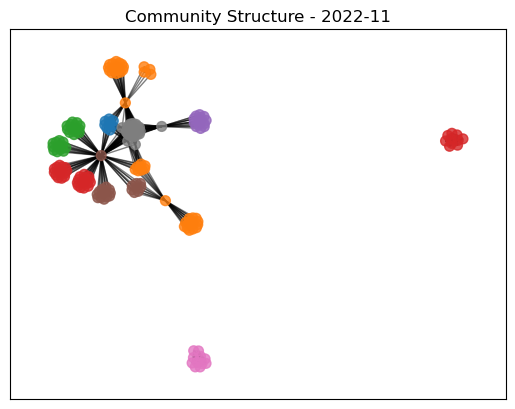

In [574]:
def visualize_community_evolution(graph_directory, community_file, snapshot_dates):
    """Visualize community evolution over time."""
    for snapshot_id, snapshot_date in snapshot_dates.items():
        # Load the graph and apply community assignments
        graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        G = nx.read_graphml(graph_file)
        load_and_apply_saved_communities(G, community_file, snapshot_id)
        
        # Visualize the network for this snapshot
        title = f"Community Structure - {snapshot_date}"
        visualize_communities(G, snapshot_id, title=title)

# Example usage to visualize evolution across all snapshots
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Visualize community evolution across all snapshots
visualize_community_evolution(graph_directory, community_file, snapshot_dates)


/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_9961/2262047330.py:91: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



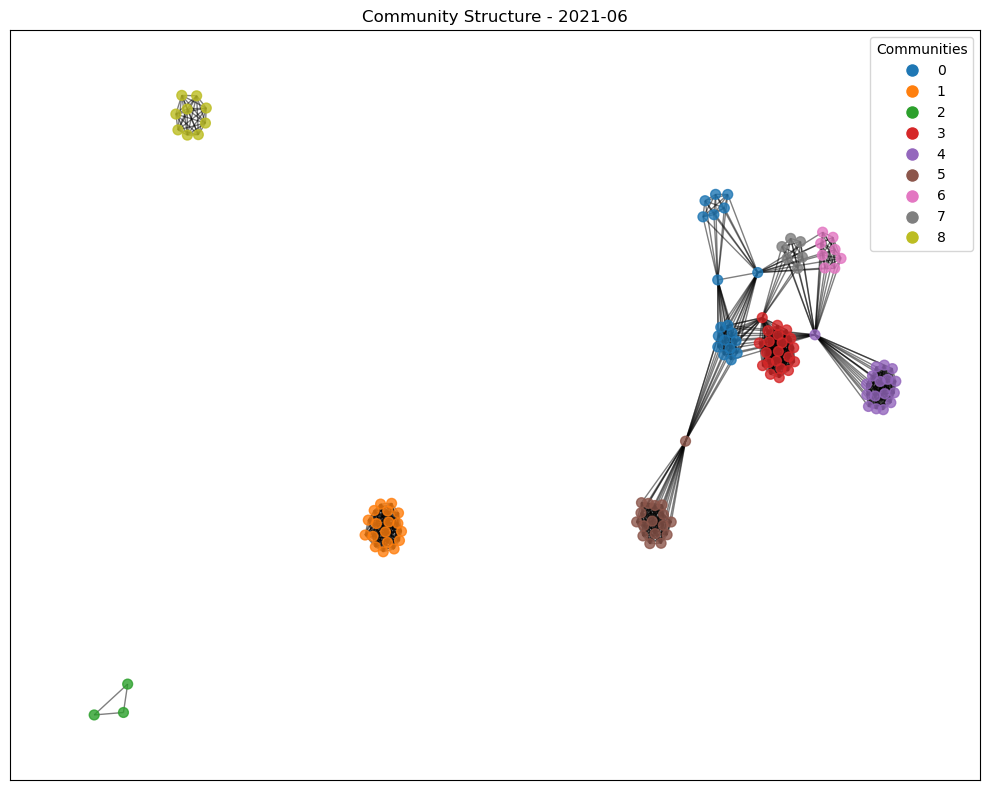

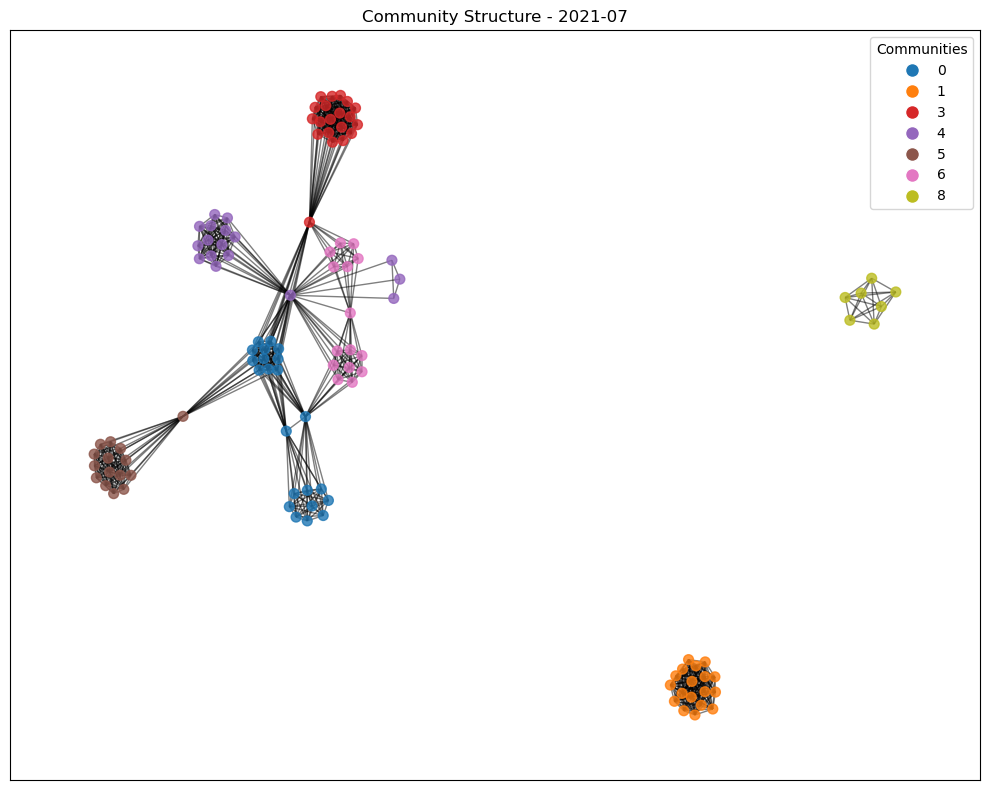

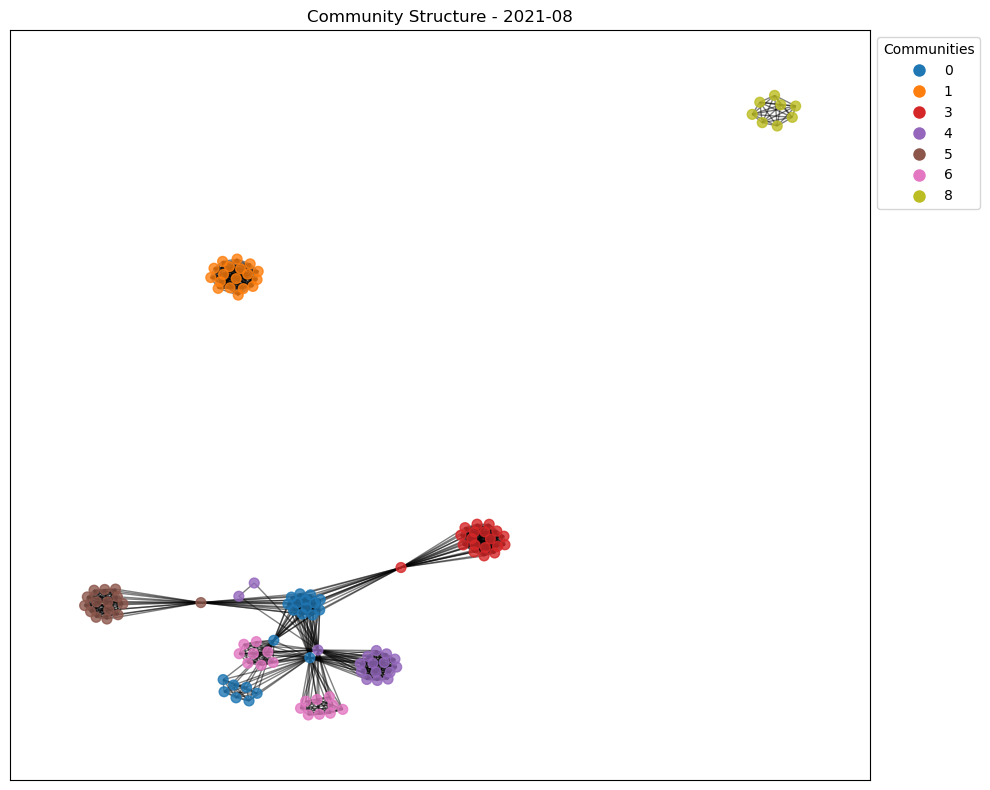

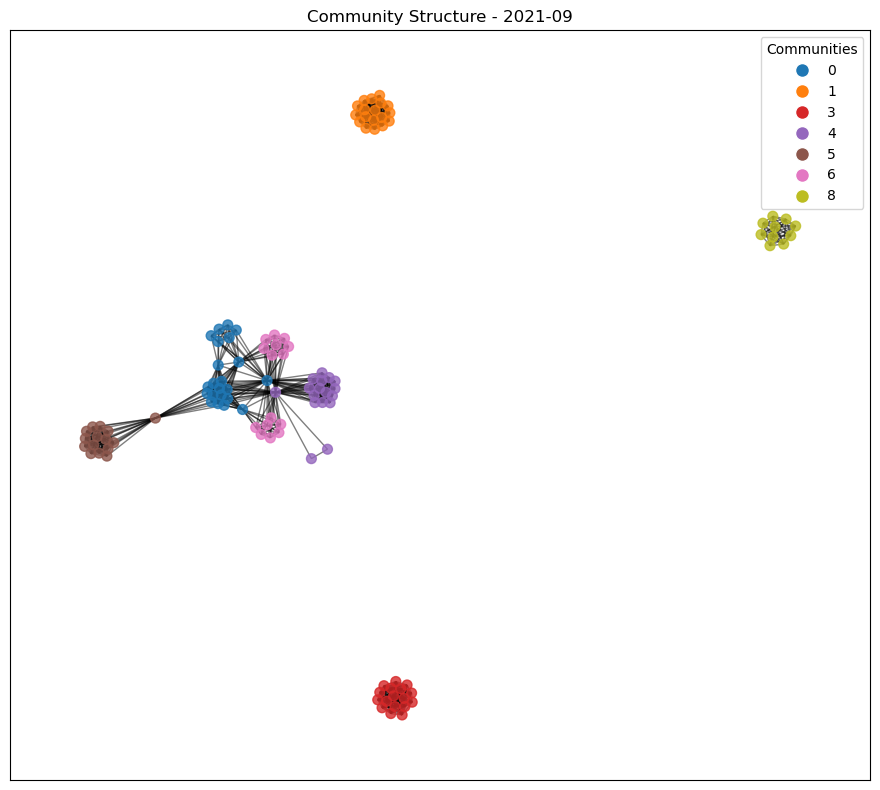

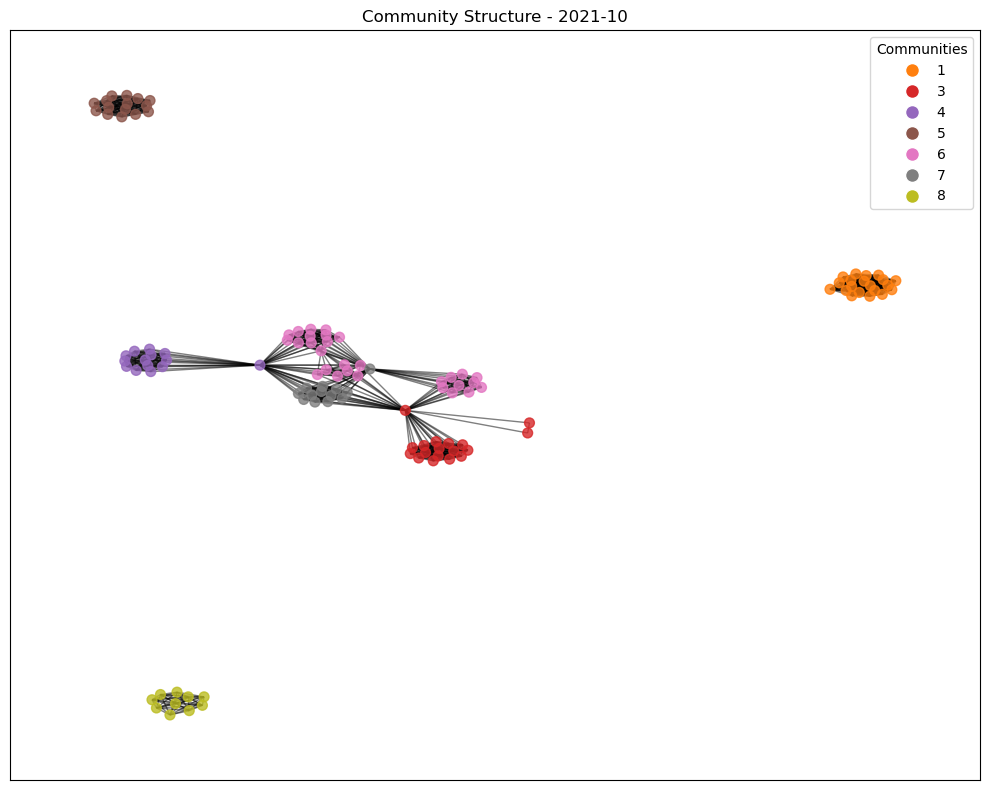

...

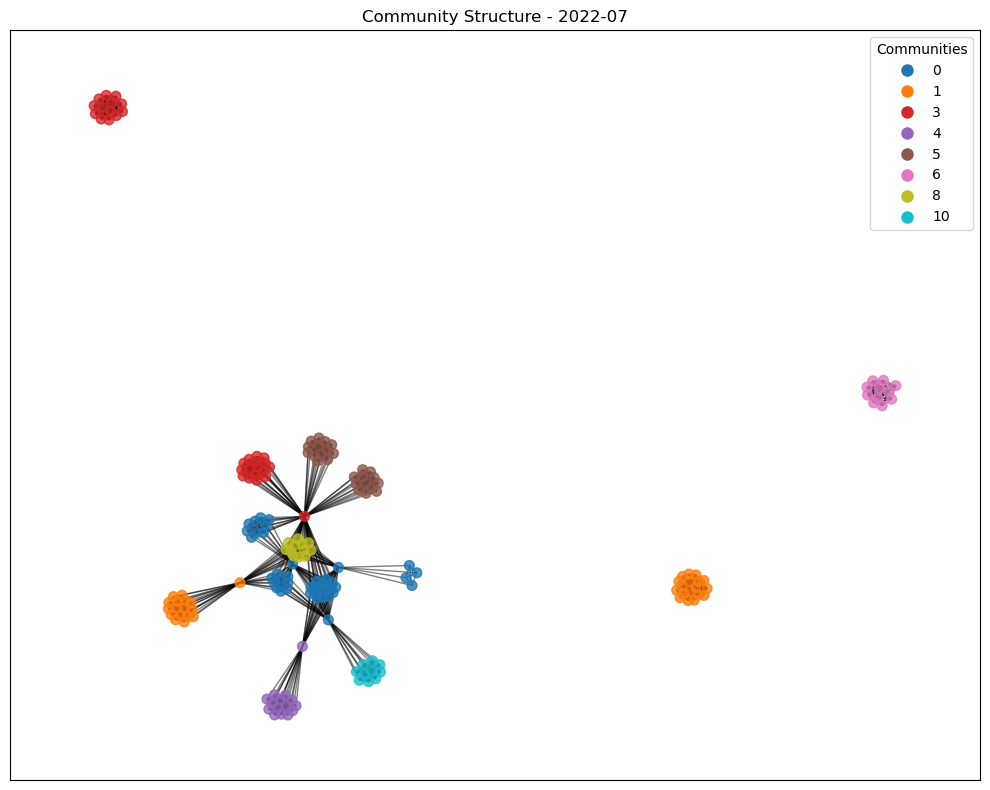

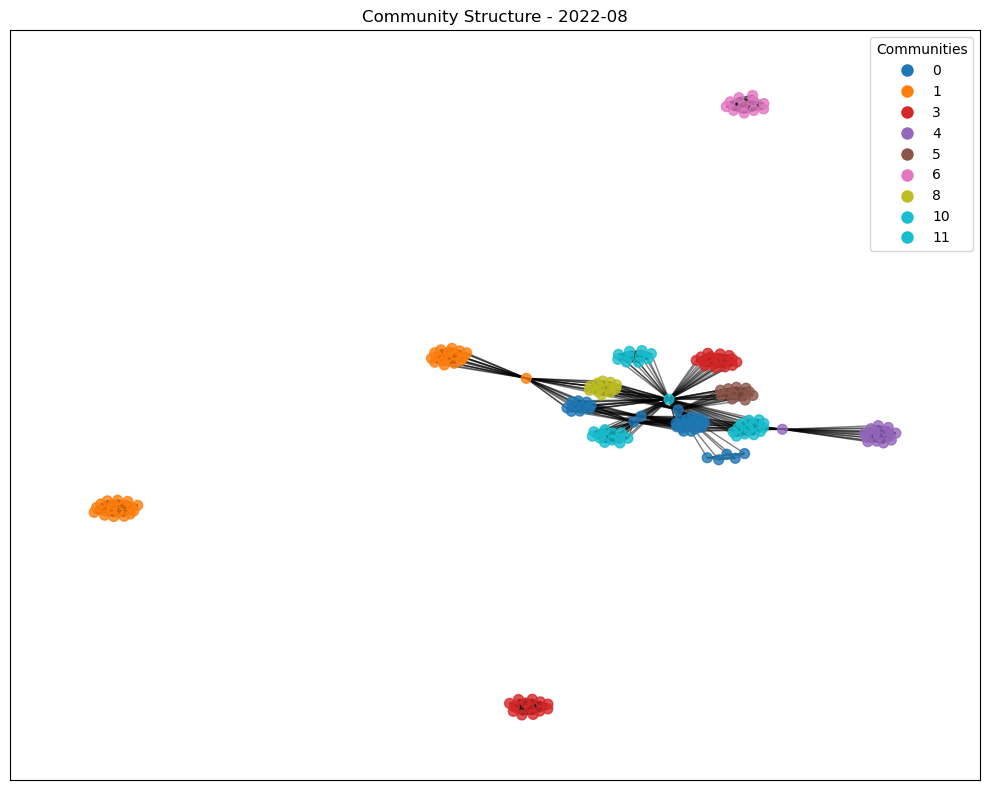

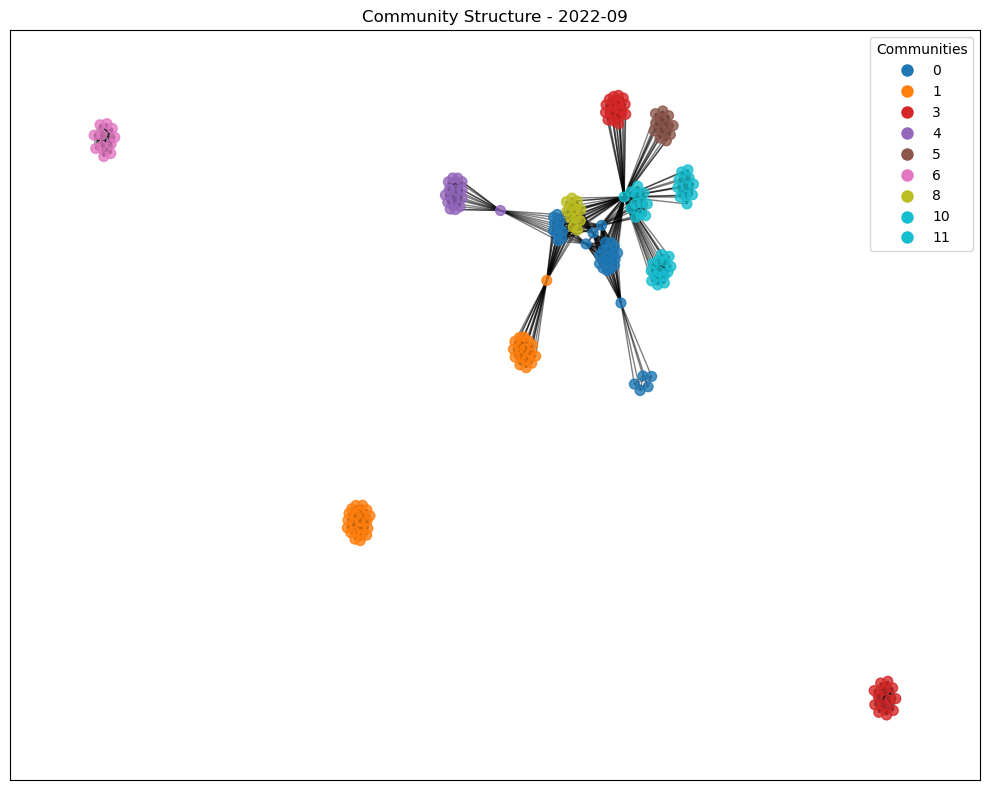

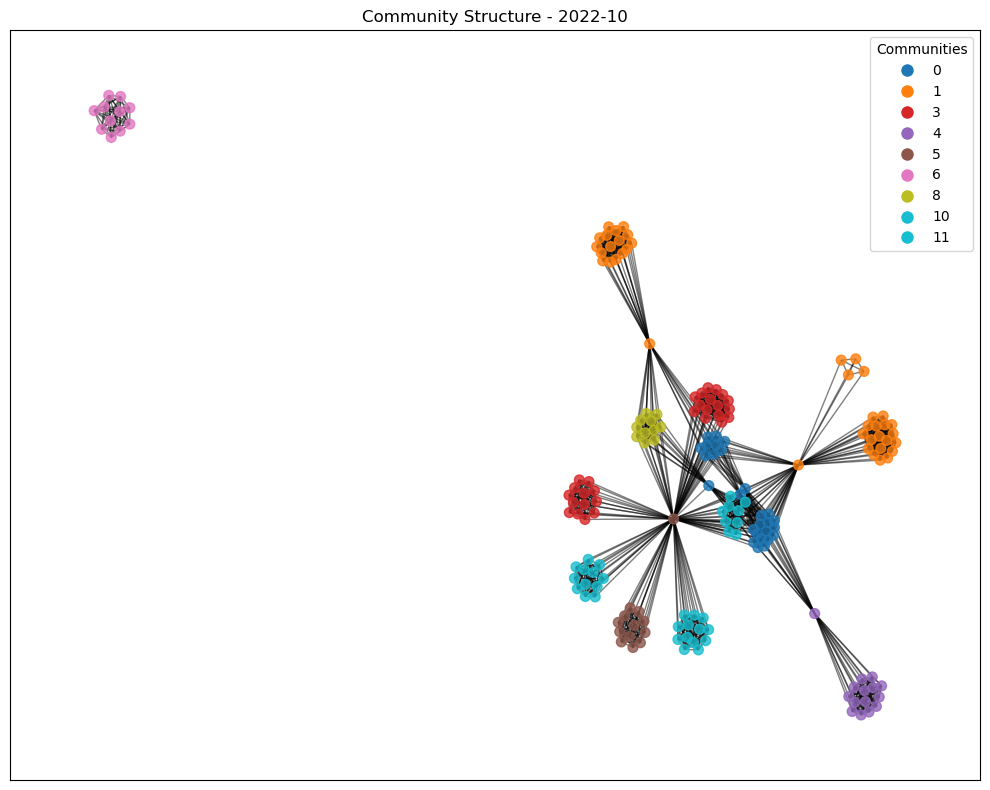

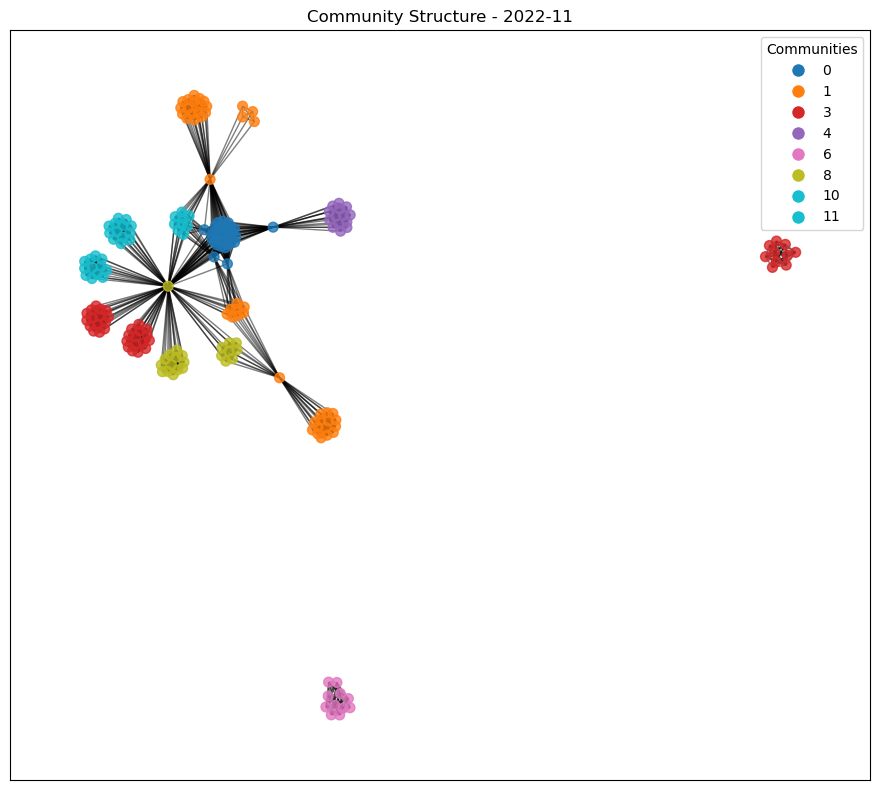

In [575]:
import networkx as nx
import matplotlib.pyplot as plt
from os.path import join
import pandas as pd

def load_and_apply_saved_communities(graph, community_file, snapshot_id):
    """Load and apply the saved community assignments to the graph nodes."""
    community_df = pd.read_csv(community_file)
    community_df['Snapshot'] = community_df['Snapshot'].astype(str).str.strip()
    snapshot_id = str(snapshot_id).strip()

    # Convert community IDs to strings to ensure consistency
    community_df['Community'] = community_df['Community'].astype(str)
    
    # Filter the community data for the specific snapshot
    snapshot_communities = community_df[community_df['Snapshot'] == snapshot_id]

    if snapshot_communities.empty:
        print(f"No data found for Snapshot ID: {snapshot_id}")
        return

    # Create a mapping of node (wallet) to community
    community_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Community']))
    for node in graph.nodes():
        graph.nodes[node]['community'] = community_map.get(node, 'Unknown')

def visualize_communities(graph, snapshot_id, community_colors, title=None):
    """Visualize the network with nodes color-coded by community."""
    pos = nx.spring_layout(graph, seed=42)  # Position nodes using a force-directed layout

    # Draw nodes, color-coded by community
    node_communities = nx.get_node_attributes(graph, 'community')
    node_colors = [community_colors.get(node_communities[node], '#808080') for node in graph.nodes()]
    
    plt.figure(figsize=(10, 8))
    nx.draw_networkx_nodes(graph, pos, node_color=node_colors, node_size=50, alpha=0.8)
    
    # Draw edges
    nx.draw_networkx_edges(graph, pos, alpha=0.5)
    
    # Add title
    if title:
        plt.title(title)
    
    # Sort communities for legend
    sorted_communities = sorted(set(node_communities.values()), key=lambda x: int(x))
    legend_handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=community_colors[com], markersize=10) for com in sorted_communities]
    plt.legend(legend_handles, sorted_communities, title="Communities", loc="best", bbox_to_anchor=(1, 1))
    
    # Adjust layout to reduce empty space
    plt.tight_layout()
    plt.show()

def visualize_community_evolution(graph_directory, community_file, snapshot_dates, community_colors):
    """Visualize community evolution over time."""
    for snapshot_id, snapshot_date in snapshot_dates.items():
        # Load the graph and apply community assignments
        graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        G = nx.read_graphml(graph_file)
        load_and_apply_saved_communities(G, community_file, snapshot_id)
        
        # Visualize the network for this snapshot
        title = f"Community Structure - {snapshot_date}"
        visualize_communities(G, snapshot_id, community_colors, title=title)

# Example usage to visualize evolution across all snapshots
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Assign consistent colors for each community
# You can expand this colormap if you have more than 10 communities
communities = [str(i) for i in range(12)]  # Assuming up to 12 communities
community_colors = {community: plt.cm.get_cmap('tab10')(i) for i, community in enumerate(communities)}

# Visualize community evolution across all snapshots
visualize_community_evolution('/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs',
                              '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv',
                              snapshot_dates, community_colors)


# Comparing communities accross time 

In [600]:
def analyze_community_evolution(node_communities_over_time):
    """Analyze the evolution of communities over time to detect merges, splits, and other changes."""
    community_evolution = defaultdict(lambda: {'split_or_merged': 0, 'nodes': set()})
    
    for node, memberships in node_communities_over_time.items():
        for i in range(len(memberships) - 1):
            current_snapshot, current_community = memberships[i]
            next_snapshot, next_community = memberships[i + 1]
            
            if current_community != next_community:
                # Track the transition of nodes
                community_evolution[current_community]['nodes'].add(node)
                community_evolution[next_community]['nodes'].add(node)
                
                # Increment the merge or split counter
                community_evolution[current_community]['split_or_merged'] += 1
                community_evolution[next_community]['split_or_merged'] += 1

    return community_evolution


In [601]:
def classify_community_changes(community_evolution, community_sizes_over_time):
    """Classify community changes over time, with a focus on merges and splits."""
    classified_changes = defaultdict(dict)
    
    for community, changes in community_evolution.items():
        start_size = community_sizes_over_time[min(snapshot_dates.keys())].get(community, 0)
        end_size = sum(community_sizes_over_time[snapshot_id].get(community, 0) for snapshot_id in snapshot_dates.keys())
        split_or_merge_count = changes.get('split_or_merged', 0)
        nodes_involved = len(changes['nodes'])

        if end_size > start_size:
            change_type = 'growth'
        elif end_size < start_size:
            change_type = 'shrinkage'
        elif split_or_merge_count > 0:
            change_type = 'merge_or_split'
        else:
            change_type = 'stable'

        classified_changes[community] = {
            'start_size': start_size,
            'end_size': end_size,
            'change_type': change_type,
            'nodes_involved': nodes_involved,
            'split_or_merge_count': split_or_merge_count
        }

    return classified_changes


# Original

In [576]:
import pandas as pd
import networkx as nx
from collections import defaultdict
from os.path import join

def load_and_apply_saved_communities(graph, community_file, snapshot_id):
    """Load and apply the saved community assignments to the graph nodes."""
    community_df = pd.read_csv(community_file)
    community_df['Snapshot'] = community_df['Snapshot'].astype(str).str.strip()
    snapshot_id = str(snapshot_id).strip()

    # Convert community IDs to strings to ensure consistency
    community_df['Community'] = community_df['Community'].astype(str)
    
    # Filter the community data for the specific snapshot
    snapshot_communities = community_df[community_df['Snapshot'] == snapshot_id]

    if snapshot_communities.empty:
        print(f"No data found for Snapshot ID: {snapshot_id}")
        return

    # Create a mapping of node (wallet) to community
    community_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Community']))
    for node in graph.nodes():
        graph.nodes[node]['community'] = community_map.get(node, 'Unknown')

def track_community_membership_over_time(graph_directory, community_file, snapshot_dates):
    """Track community membership for each node across all snapshots."""
    node_communities_over_time = defaultdict(list)
    community_sizes_over_time = defaultdict(lambda: defaultdict(int))

    for snapshot_id in snapshot_dates.keys():
        graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        G = nx.read_graphml(graph_file)
        
        # Apply the saved community assignments
        load_and_apply_saved_communities(G, community_file, snapshot_id)

        for node, data in G.nodes(data=True):
            community = data.get('community', 'Unknown')  # Get the community assignment for each node
            node_communities_over_time[node].append((snapshot_id, community))
            community_sizes_over_time[snapshot_id][community] += 1

    return node_communities_over_time, community_sizes_over_time

# Example usage
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'

# Track community membership and sizes over time
node_communities_over_time, community_sizes_over_time = track_community_membership_over_time(graph_directory, community_file, snapshot_dates)



In [577]:
# Assuming you already have the snapshot_dates, graph_directory, and community_file defined

def track_and_analyze_community_evolution(graph_directory, community_file, snapshot_dates):
    node_communities_over_time = defaultdict(list)
    
    # Step 1: Track community memberships over time
    for snapshot_id in snapshot_dates.keys():
        graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        G = nx.read_graphml(graph_file)
        load_and_apply_saved_communities(G, community_file, snapshot_id)  # Ensure correct community assignments

        for node, data in G.nodes(data=True):
            community = data['community']
            node_communities_over_time[node].append((snapshot_id, community))
    
    # Step 2: Analyze community evolution based on tracked data
    community_evolution = analyze_community_evolution(node_communities_over_time)
    
    return community_evolution

# Execute the combined tracking and analysis
community_evolution = track_and_analyze_community_evolution(graph_directory, community_file, snapshot_dates)


In [604]:
def classify_community_changes(community_evolution, community_sizes_over_time):
    """Classify community changes over time."""
    classified_changes = defaultdict(dict)
    
    for community, changes in community_evolution.items():
        start_size = community_sizes_over_time[min(snapshot_dates.keys())].get(community, 0)
        end_size = changes.get('end_size', 0)

        if end_size > start_size:
            change_type = 'growth'
        elif end_size < start_size:
            change_type = 'shrinkage'
        elif changes.get('split_or_merged', 0) > 0:
            change_type = 'merge_or_split'
        else:
            change_type = 'stable'

        classified_changes[community] = {
            'start_size': start_size,
            'end_size': end_size,
            'change_type': change_type
        }

    return classified_changes

# Classify community changes
classified_changes = classify_community_changes(community_evolution, community_sizes_over_time)

# Output classification results
for community, change in classified_changes.items():
    print(f"Community {community}: {change['change_type']} (Start Size: {change['start_size']}, End Size: {change['end_size']})")


Community 0: growth (Start Size: 19, End Size: 35)
Community 6: growth (Start Size: 8, End Size: 15)
Community 7: growth (Start Size: 6, End Size: 7)
Community 10: growth (Start Size: 0, End Size: 35)
Community 11: growth (Start Size: 0, End Size: 12)
Community 1: growth (Start Size: 18, End Size: 54)
Community 4: growth (Start Size: 17, End Size: 24)
Community 3: growth (Start Size: 21, End Size: 43)
Community 5: shrinkage (Start Size: 17, End Size: 11)
Community 8: growth (Start Size: 9, End Size: 34)
Community 2: shrinkage (Start Size: 3, End Size: 0)
Community 9: merge_or_split (Start Size: 0, End Size: 0)


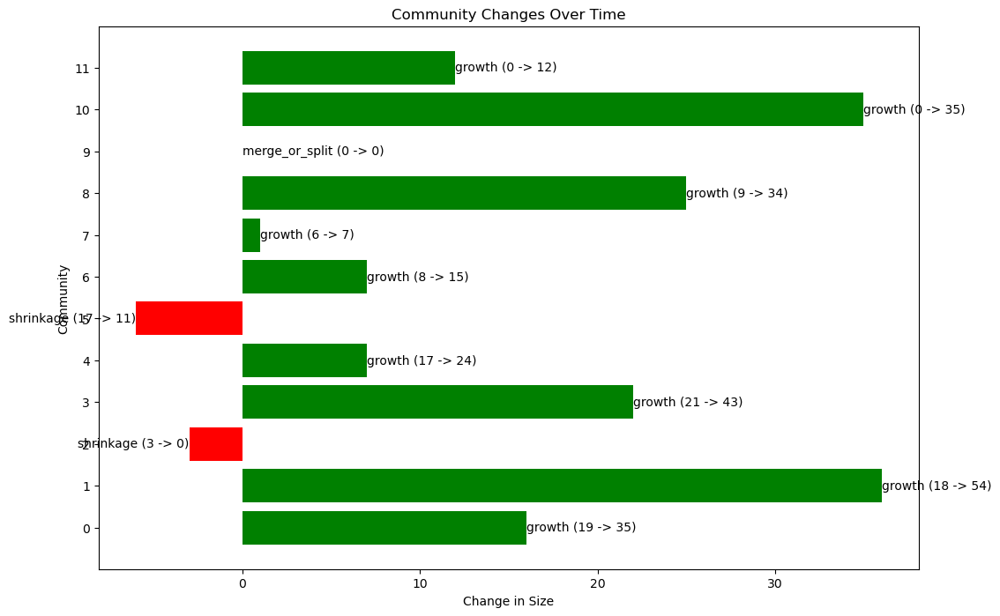

In [605]:
import matplotlib.pyplot as plt

def plot_community_changes(classified_changes, snapshot_dates):
    """Visualize community changes over time in order from community 0 to 10."""
    fig, ax = plt.subplots(figsize=(12, 8))

    # Sort communities by numerical order
    sorted_communities = sorted(classified_changes.keys(), key=lambda x: int(x))

    # Prepare data for plotting
    community_names = []
    size_changes = []
    change_types = []
    start_sizes = []
    end_sizes = []

    for community in sorted_communities:
        change = classified_changes[community]
        community_names.append(community)
        size_changes.append(change['end_size'] - change['start_size'])
        change_types.append(change['change_type'])
        start_sizes.append(change['start_size'])
        end_sizes.append(change['end_size'])

    # Plotting the bars
    bar_colors = ['green' if t == 'growth' else 'red' for t in change_types]
    ax.barh(community_names, size_changes, color=bar_colors)

    # Annotating the bars with the change type and size
    for i, community in enumerate(community_names):
        ax.text(size_changes[i], community, f"{change_types[i]} ({start_sizes[i]} -> {end_sizes[i]})", 
                va='center', ha='left' if size_changes[i] >= 0 else 'right')

    ax.set_xlabel("Change in Size")
    ax.set_ylabel("Community")
    ax.set_title("Community Changes Over Time")
    plt.show()

# Plot community changes
plot_community_changes(classified_changes, snapshot_dates)


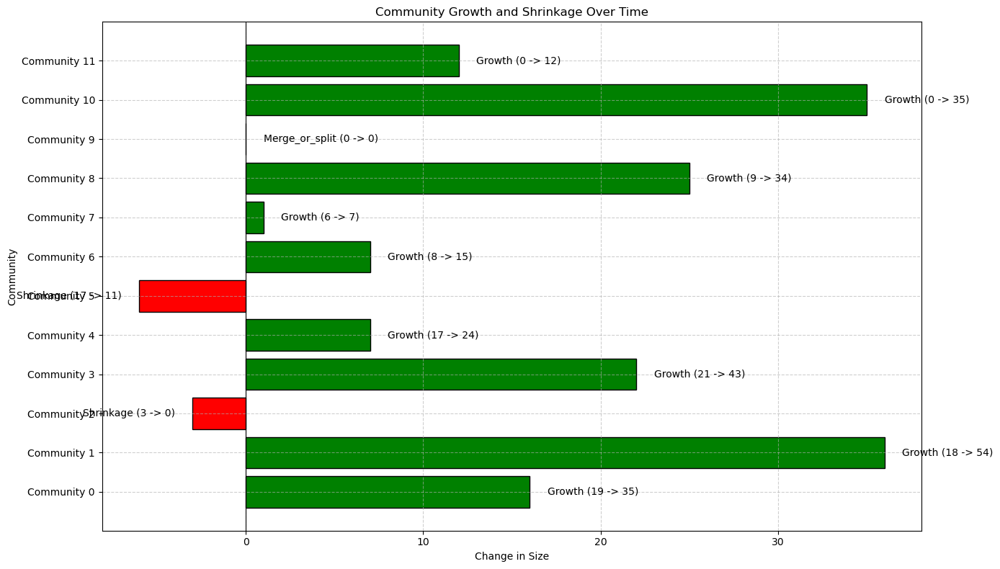

In [606]:
import matplotlib.pyplot as plt
import numpy as np

def plot_community_changes(classified_changes, snapshot_dates):
    """Visualize community changes over time in order from community 0 to 10 with improved visualization."""
    fig, ax = plt.subplots(figsize=(14, 8))

    # Sort communities by numerical order
    sorted_communities = sorted(classified_changes.keys(), key=lambda x: int(x))

    # Prepare data for plotting
    community_names = []
    size_changes = []
    change_types = []
    start_sizes = []
    end_sizes = []

    for community in sorted_communities:
        change = classified_changes[community]
        community_names.append(community)
        size_changes.append(change['end_size'] - change['start_size'])
        change_types.append(change['change_type'])
        start_sizes.append(change['start_size'])
        end_sizes.append(change['end_size'])

    # Plotting the bars
    bar_colors = ['green' if t == 'growth' else 'red' if t == 'shrinkage' else 'blue' for t in change_types]
    y_positions = np.arange(len(community_names))
    bars = ax.barh(y_positions, size_changes, color=bar_colors, edgecolor='black')

    # Annotating the bars with the change type and size
    for i, bar in enumerate(bars):
        width = bar.get_width()
        label_x_pos = width + 1 if width >= 0 else width - 1
        ax.text(label_x_pos, bar.get_y() + bar.get_height()/2,
                f"{change_types[i].capitalize()} ({start_sizes[i]} -> {end_sizes[i]})",
                va='center', ha='left' if width >= 0 else 'right', fontsize=10, color='black')

    # Set labels, title, and grid
    ax.set_yticks(y_positions)
    ax.set_yticklabels([f"Community {name}" for name in community_names])
    ax.set_xlabel("Change in Size")
    ax.set_ylabel("Community")
    ax.set_title("Community Growth and Shrinkage Over Time")

    ax.axvline(0, color='black', linewidth=0.8)
    ax.grid(True, linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()

# Plot community changes
plot_community_changes(classified_changes, snapshot_dates)


In [607]:
# Print out the community sizes over time for inspection
for snapshot_id, sizes in community_sizes_over_time.items():
    print(f"Snapshot {snapshot_id} ({snapshot_dates[snapshot_id]}):")
    total_nodes = sum(sizes.values())
    print(f"  Total nodes: {total_nodes}")
    for community, size in sizes.items():
        print(f"    Community {community}: {size} nodes")
    print("-" * 50)


Snapshot 11659570 (2021-06):
  Total nodes: 118
    Community 0: 19 nodes
    Community 1: 18 nodes
    Community 3: 21 nodes
    Community 4: 17 nodes
    Community 5: 17 nodes
    Community 6: 8 nodes
    Community 7: 6 nodes
    Community 8: 9 nodes
    Community 2: 3 nodes
--------------------------------------------------
Snapshot 11861210 (2021-07):
  Total nodes: 114
    Community 3: 20 nodes
    Community 1: 18 nodes
    Community 5: 15 nodes
    Community 4: 17 nodes
    Community 0: 22 nodes
    Community 8: 7 nodes
    Community 6: 15 nodes
--------------------------------------------------
Snapshot 12043054 (2021-08):
  Total nodes: 116
    Community 1: 18 nodes
    Community 0: 22 nodes
    Community 6: 17 nodes
    Community 4: 17 nodes
    Community 3: 19 nodes
    Community 5: 15 nodes
    Community 8: 8 nodes
--------------------------------------------------
Snapshot 12244515 (2021-09):
  Total nodes: 114
    Community 0: 22 nodes
    Community 6: 15 nodes
    Communi

In [608]:
# Print a summary of the community sizes over time
print("Summary of community_sizes_over_time:")
print(f"Total snapshots: {len(community_sizes_over_time)}")
for snapshot_id, sizes in community_sizes_over_time.items():
    print(f"Snapshot {snapshot_id} ({snapshot_dates[snapshot_id]}): {len(sizes)} communities")

# Print a detailed view of community sizes for each snapshot
for snapshot_id, sizes in community_sizes_over_time.items():
    print(f"\nSnapshot {snapshot_id} ({snapshot_dates[snapshot_id]}):")
    total_nodes = sum(sizes.values())
    print(f"  Total nodes: {total_nodes}")
    for community, size in sizes.items():
        print(f"    Community {community}: {size} nodes")
    print("-" * 50)


Summary of community_sizes_over_time:
Total snapshots: 18
Snapshot 11659570 (2021-06): 9 communities
Snapshot 11861210 (2021-07): 7 communities
Snapshot 12043054 (2021-08): 7 communities
Snapshot 12244515 (2021-09): 7 communities
Snapshot 12438842 (2021-10): 7 communities
Snapshot 12638919 (2021-11): 7 communities
Snapshot 12831436 (2021-12): 8 communities
Snapshot 13029639 (2022-01): 8 communities
Snapshot 13230157 (2022-02): 9 communities
Snapshot 13422506 (2022-03): 10 communities
Snapshot 13620205 (2022-04): 9 communities
Snapshot 13809597 (2022-05): 8 communities
Snapshot 14009885 (2022-06): 8 communities
Snapshot 14210564 (2022-07): 8 communities
Snapshot 14391029 (2022-08): 9 communities
Snapshot 14589816 (2022-09): 9 communities
Snapshot 14779829 (2022-10): 9 communities
Snapshot 14967365 (2022-11): 8 communities

Snapshot 11659570 (2021-06):
  Total nodes: 118
    Community 0: 19 nodes
    Community 1: 18 nodes
    Community 3: 21 nodes
    Community 4: 17 nodes
    Community 

In [609]:
# Focus on a specific snapshot (e.g., 2021-06) to inspect deeply
snapshot_id = '11659570'  # Corresponding to 2021-06
if snapshot_id in community_sizes_over_time:
    sizes = community_sizes_over_time[snapshot_id]
    print(f"\nDetailed view of community sizes for Snapshot {snapshot_id} ({snapshot_dates[snapshot_id]}):")
    total_nodes = sum(sizes.values())
    print(f"  Total nodes: {total_nodes}")
    for community, size in sizes.items():
        print(f"    Community {community}: {size} nodes")
else:
    print(f"Snapshot {snapshot_id} not found in community_sizes_over_time")



Detailed view of community sizes for Snapshot 11659570 (2021-06):
  Total nodes: 118
    Community 0: 19 nodes
    Community 1: 18 nodes
    Community 3: 21 nodes
    Community 4: 17 nodes
    Community 5: 17 nodes
    Community 6: 8 nodes
    Community 7: 6 nodes
    Community 8: 9 nodes
    Community 2: 3 nodes


In [610]:
# Check consistency across multiple snapshots
print("\nChecking consistency across snapshots:")
for snapshot_id in ['11659570', '11861210', '12043054']:  # 2021-06, 2021-07, 2021-08
    if snapshot_id in community_sizes_over_time:
        sizes = community_sizes_over_time[snapshot_id]
        total_nodes = sum(sizes.values())
        print(f"Snapshot {snapshot_id} ({snapshot_dates[snapshot_id]}): Total nodes = {total_nodes}")
        for community, size in sizes.items():
            print(f"    Community {community}: {size} nodes")
    else:
        print(f"Snapshot {snapshot_id} not found in community_sizes_over_time")
    print("-" * 50)



Checking consistency across snapshots:
Snapshot 11659570 (2021-06): Total nodes = 118
    Community 0: 19 nodes
    Community 1: 18 nodes
    Community 3: 21 nodes
    Community 4: 17 nodes
    Community 5: 17 nodes
    Community 6: 8 nodes
    Community 7: 6 nodes
    Community 8: 9 nodes
    Community 2: 3 nodes
--------------------------------------------------
Snapshot 11861210 (2021-07): Total nodes = 114
    Community 3: 20 nodes
    Community 1: 18 nodes
    Community 5: 15 nodes
    Community 4: 17 nodes
    Community 0: 22 nodes
    Community 8: 7 nodes
    Community 6: 15 nodes
--------------------------------------------------
Snapshot 12043054 (2021-08): Total nodes = 116
    Community 1: 18 nodes
    Community 0: 22 nodes
    Community 6: 17 nodes
    Community 4: 17 nodes
    Community 3: 19 nodes
    Community 5: 15 nodes
    Community 8: 8 nodes
--------------------------------------------------


In [613]:
# Merges and splits

In [611]:
import plotly.graph_objects as go
import pandas as pd

def prepare_alluvial_data(node_communities_over_time, snapshot_dates):
    """Prepare data for an alluvial plot showing community transitions over time."""
    snapshots = list(snapshot_dates.keys())
    communities = sorted({community for memberships in node_communities_over_time.values() for _, community in memberships}, key=int)

    # Initialize variables to hold source, target, and values (flows)
    source = []
    target = []
    value = []
    labels = []
    color_links = []
    node_map = {}
    current_index = 0

    for i in range(len(snapshots) - 1):
        start_snapshot = snapshots[i]
        end_snapshot = snapshots[i + 1]
        
        for node, memberships in node_communities_over_time.items():
            start_community = None
            end_community = None
            for snap, comm in memberships:
                if snap == start_snapshot:
                    start_community = int(comm)  # Ensure community is an integer
                if snap == end_snapshot:
                    end_community = int(comm)  # Ensure community is an integer
            if start_community is not None and end_community is not None:
                start_label = f"Comm {start_community} ({snapshot_dates[start_snapshot]})"
                end_label = f"Comm {end_community} ({snapshot_dates[end_snapshot]})"
                
                if start_label not in node_map:
                    node_map[start_label] = current_index
                    labels.append(start_label)
                    current_index += 1

                if end_label not in node_map:
                    node_map[end_label] = current_index
                    labels.append(end_label)
                    current_index += 1

                source.append(node_map[start_label])
                target.append(node_map[end_label])
                value.append(1)  # Each node is one flow unit

                # Use consistent colors for links based on the starting community
                color_links.append(f"rgba({(start_community * 37) % 256}, {(start_community * 97) % 256}, {(start_community * 157) % 256}, 0.7)")

    return source, target, value, labels, color_links

# Prepare data for the alluvial plot
source, target, value, labels, color_links = prepare_alluvial_data(node_communities_over_time, snapshot_dates)



In [612]:
def plot_enhanced_alluvial(source, target, value, labels, color_links):
    """Plot an enhanced alluvial diagram showing community transitions over time with smoother flows."""
    fig = go.Figure(go.Sankey(
        arrangement='snap',  # Align nodes as tightly as possible
        node=dict(
            pad=15,
            thickness=15,
            line=dict(color="black", width=0.5),
            label=labels,
            color="rgba(31, 119, 180, 0.8)",  # Set a semi-transparent base color for nodes
            hovertemplate='%{label}<extra></extra>',
        ),
        link=dict(
            source=source,
            target=target,
            value=value,
            color=color_links,  # Apply the custom colors for each link
            hovertemplate='<b>Flow:</b> %{value}<br><b>From:</b> %{source.label}<br><b>To:</b> %{target.label}<extra></extra>',
        )
    ))

    fig.update_layout(
        title_text="Time Evolution of Community Structure",
        font_size=12,
        hovermode='x',
        plot_bgcolor='white',
        paper_bgcolor='white',
        margin=dict(l=0, r=0, t=50, b=0)
    )

    fig.show()

# Example usage to plot the enhanced alluvial diagram
plot_enhanced_alluvial(source, target, value, labels, color_links)


In [589]:
import plotly.graph_objects as go
import pandas as pd

def prepare_alluvial_data(node_communities_over_time, snapshot_dates):
    """Prepare data for an alluvial plot showing community transitions over time."""
    snapshots = list(snapshot_dates.keys())
    communities = sorted({community for memberships in node_communities_over_time.values() for _, community in memberships}, key=int)

    # Initialize variables to hold source, target, and values (flows)
    source = []
    target = []
    value = []
    labels = []
    color_links = []
    node_map = {}
    current_index = 0

    for i in range(len(snapshots) - 1):
        start_snapshot = snapshots[i]
        end_snapshot = snapshots[i + 1]
        
        for node, memberships in node_communities_over_time.items():
            start_community = None
            end_community = None
            for snap, comm in memberships:
                if snap == start_snapshot:
                    start_community = int(comm)  # Ensure community is an integer
                if snap == end_snapshot:
                    end_community = int(comm)  # Ensure community is an integer
            if start_community is not None and end_community is not None:
                start_label = f"Comm {start_community} ({snapshot_dates[start_snapshot]})"
                end_label = f"Comm {end_community} ({snapshot_dates[end_snapshot]})"
                
                if start_label not in node_map:
                    node_map[start_label] = current_index
                    labels.append(start_label)
                    current_index += 1

                if end_label not in node_map:
                    node_map[end_label] = current_index
                    labels.append(end_label)
                    current_index += 1

                source.append(node_map[start_label])
                target.append(node_map[end_label])
                value.append(1)  # Each node is one flow unit

                # Use consistent colors for links based on the starting community
                color_links.append(f"rgba({(start_community * 37) % 256}, {(start_community * 97) % 256}, {(start_community * 157) % 256}, 0.7)")

    return source, target, value, labels, color_links

# Prepare data for the alluvial plot
source, target, value, labels, color_links = prepare_alluvial_data(node_communities_over_time, snapshot_dates)


def plot_enhanced_alluvial(source, target, value, labels, color_links):
    """Plot an enhanced alluvial diagram showing community transitions over time with smoother flows."""
    fig = go.Figure(go.Sankey(
        arrangement='snap',  # Align nodes as tightly as possible
        node=dict(
            pad=15,
            thickness=15,
            line=dict(color="black", width=0.5),
            label=labels,
            color="rgba(31, 119, 180, 0.8)",  # Set a semi-transparent base color for nodes
            hovertemplate='%{label}<extra></extra>',
        ),
        link=dict(
            source=source,
            target=target,
            value=value,
            color=color_links,  # Apply the custom colors for each link
            hovertemplate='<b>Flow:</b> %{value}<br><b>From:</b> %{source.label}<br><b>To:</b> %{target.label}<extra></extra>',
        )
    ))

    fig.update_layout(
        title_text="Time Evolution of Community Structure",
        font_size=12,
        hovermode='x',
        plot_bgcolor='white',
        paper_bgcolor='white',
        margin=dict(l=0, r=0, t=50, b=0)
    )

    fig.show()

# Example usage to plot the enhanced alluvial diagram
plot_enhanced_alluvial(source, target, value, labels, color_links)


In [598]:
# Persistence

In [596]:
from collections import defaultdict

def track_community_persistence(node_communities_over_time, snapshot_dates):
    """Track the persistence of communities across multiple snapshots."""
    
    community_persistence = defaultdict(int)
    community_snapshots = defaultdict(set)

    # Iterate through the node-community assignments
    for node, memberships in node_communities_over_time.items():
        for snap, comm in memberships:
            community_snapshots[comm].add(snap)
    
    # Count how many snapshots each community appears in
    for comm, snapshots in community_snapshots.items():
        community_persistence[comm] = len(snapshots)
    
    return community_persistence

# Example usage to track community persistence
community_persistence = track_community_persistence(node_communities_over_time, snapshot_dates)

# Print results
print("Community Persistence:")
for community, persistence_count in community_persistence.items():
    print(f"Community {community} persisted across {persistence_count} snapshots")

# Optionally, sort and print communities by persistence duration
sorted_communities = sorted(community_persistence.items(), key=lambda x: x[1], reverse=True)
print("\nSorted Community Persistence (from most to least persistent):")
for community, persistence_count in sorted_communities:
    print(f"Community {community}: {persistence_count} snapshots")


Community Persistence:
Community 0 persisted across 17 snapshots
Community 6 persisted across 18 snapshots
Community 7 persisted across 8 snapshots
Community 10 persisted across 10 snapshots
Community 11 persisted across 4 snapshots
Community 1 persisted across 18 snapshots
Community 4 persisted across 17 snapshots
Community 3 persisted across 18 snapshots
Community 5 persisted across 17 snapshots
Community 8 persisted across 18 snapshots
Community 2 persisted across 1 snapshots
Community 9 persisted across 1 snapshots

Sorted Community Persistence (from most to least persistent):
Community 6: 18 snapshots
Community 1: 18 snapshots
Community 3: 18 snapshots
Community 8: 18 snapshots
Community 0: 17 snapshots
Community 4: 17 snapshots
Community 5: 17 snapshots
Community 10: 10 snapshots
Community 7: 8 snapshots
Community 11: 4 snapshots
Community 2: 1 snapshots
Community 9: 1 snapshots


In [597]:
# Merges 

In [616]:
from collections import defaultdict

def analyze_community_dynamics(node_communities_over_time, snapshot_dates):
    """Analyze community dynamics such as merges, splits, growth, age, and death."""
    community_stats = defaultdict(lambda: {
        'start_snapshot': None,
        'end_snapshot': None,
        'age': 0,
        'growth': 0,
        'status': 'alive',  # could be 'alive', 'dead', 'merged', 'split'
        'merge_count': 0,
        'split_count': 0
    })

    for node, memberships in node_communities_over_time.items():
        for i, (snapshot_id, community) in enumerate(memberships):
            if community_stats[community]['start_snapshot'] is None:
                community_stats[community]['start_snapshot'] = snapshot_id
            community_stats[community]['end_snapshot'] = snapshot_id
            community_stats[community]['age'] += 1

            if i > 0:
                prev_community = memberships[i-1][1]
                if prev_community != community:
                    community_stats[prev_community]['growth'] -= 1
                    community_stats[community]['growth'] += 1

    # Determine merges, splits, and deaths
    for community, stats in community_stats.items():
        for node, memberships in node_communities_over_time.items():
            communities_in_last_snapshot = [
                comm for snap, comm in memberships if snap == stats['end_snapshot']
            ]
            communities_in_next_snapshot = [
                comm for snap, comm in memberships if snap == stats['end_snapshot']
            ]

            if len(set(communities_in_next_snapshot)) > 1:
                stats['split_count'] += 1
                stats['status'] = 'split'
            elif len(set(communities_in_last_snapshot)) > 1:
                stats['merge_count'] += 1
                stats['status'] = 'merged'

        if stats['end_snapshot'] == max(snapshot_dates.keys()):
            stats['status'] = 'alive'
        else:
            stats['status'] = 'dead'

    return community_stats


In [592]:
# Flows

# This

In [850]:
import pandas as pd
from collections import defaultdict

def calculate_flows_for_snapshot(node_communities_over_time, snapshot_id, next_snapshot_id):
    """Calculate the flow counts between communities from one snapshot to the next, along with nodes added and left."""
    flow_counts = defaultdict(int)
    nodes_left = 0
    nodes_added = 0
    
    current_snapshot_nodes = {}
    next_snapshot_nodes = {}

    # Organize nodes by community for both snapshots
    for node, memberships in node_communities_over_time.items():
        for snap, comm in memberships:
            if snap == snapshot_id:
                current_snapshot_nodes[node] = int(comm)
            elif snap == next_snapshot_id:
                next_snapshot_nodes[node] = int(comm)
    
    # Identify flows and nodes that left
    for node, start_community in current_snapshot_nodes.items():
        end_community = next_snapshot_nodes.get(node)
        if end_community is not None:
            flow_counts[(start_community, end_community)] += 1
        else:
            nodes_left += 1  # Node was present in the current snapshot but not in the next

    # Identify new nodes that joined a community in the next snapshot
    for node, end_community in next_snapshot_nodes.items():
        if node not in current_snapshot_nodes:
            nodes_added += 1  # Node was not present in the current snapshot but appeared in the next

    total_flows = sum(flow_counts.values())
    return flow_counts, total_flows, nodes_left, nodes_added, len(current_snapshot_nodes), len(next_snapshot_nodes)

def calculate_flow_percentages(flow_counts, total_flows):
    """Calculate the percentage of each flow relative to the total flows."""
    if total_flows == 0:
        return {key: 0 for key in flow_counts}  # Avoid division by zero
    flow_percentages = {key: (count / total_flows) * 100 for key, count in flow_counts.items()}
    return flow_percentages

def calculate_and_display_flows_for_all_snapshots(node_communities_over_time, snapshot_dates):
    """Calculate and display flows and percentages for each pair of consecutive snapshots, along with nodes added and left."""
    sorted_snapshots = sorted(snapshot_dates.keys(), key=lambda x: snapshot_dates[x])
    
    for i in range(len(sorted_snapshots) - 1):
        snapshot_id = sorted_snapshots[i]
        next_snapshot_id = sorted_snapshots[i + 1]

        flow_counts, total_flows, nodes_left, nodes_added, num_current_nodes, num_next_nodes = calculate_flows_for_snapshot(
            node_communities_over_time, snapshot_id, next_snapshot_id
        )
        flow_percentages = calculate_flow_percentages(flow_counts, total_flows)

        print(f"\nSnapshot {snapshot_id} to {next_snapshot_id}:")
        print(f"Total Flows: {total_flows}")
        print(f"Nodes Added: {nodes_added}, Nodes Left: {nodes_left}")
        print(f"Number of Nodes in Current Snapshot: {num_current_nodes}, Number of Nodes in Next Snapshot: {num_next_nodes}")
        print(f"Sum of Nodes Accounted For: {total_flows + nodes_left + nodes_added}")
        print(f"Expected Total Nodes in Next Snapshot: {num_next_nodes}")

        print("\nFlow Counts between Communities:")
        for (start, end), count in flow_counts.items():
            print(f"Community {start} -> Community {end}: {count} flows")

        print("\nPercentage of Each Flow:")
        for (start, end), percentage in flow_percentages.items():
            print(f"Community {start} -> Community {end}: {percentage:.2f}%")

# Example data and paths (these should already be defined in your environment)
# node_communities_over_time = {...}
# snapshot_dates = {...}

# Call the function to calculate and display flows for all snapshot pairs
calculate_and_display_flows_for_all_snapshots(node_communities_over_time, snapshot_dates)



Snapshot 11659570 to 11861210:
Total Flows: 105
Nodes Added: 9, Nodes Left: 13
Number of Nodes in Current Snapshot: 118, Number of Nodes in Next Snapshot: 114
Sum of Nodes Accounted For: 127
Expected Total Nodes in Next Snapshot: 114

Flow Counts between Communities:
Community 0 -> Community 0: 16 flows
Community 1 -> Community 1: 18 flows
Community 3 -> Community 3: 19 flows
Community 4 -> Community 4: 14 flows
Community 5 -> Community 5: 15 flows
Community 0 -> Community 6: 1 flows
Community 6 -> Community 6: 8 flows
Community 7 -> Community 6: 4 flows
Community 8 -> Community 8: 7 flows
Community 2 -> Community 4: 3 flows

Percentage of Each Flow:
Community 0 -> Community 0: 15.24%
Community 1 -> Community 1: 17.14%
Community 3 -> Community 3: 18.10%
Community 4 -> Community 4: 13.33%
Community 5 -> Community 5: 14.29%
Community 0 -> Community 6: 0.95%
Community 6 -> Community 6: 7.62%
Community 7 -> Community 6: 3.81%
Community 8 -> Community 8: 6.67%
Community 2 -> Community 4: 2

In [851]:
import pandas as pd
from collections import defaultdict

def calculate_flows_for_snapshot(node_communities_over_time, snapshot_id, next_snapshot_id):
    """Calculate the flow counts between communities from one snapshot to the next, along with nodes added and left."""
    flow_counts = defaultdict(int)
    nodes_left = 0
    nodes_added = 0
    
    current_snapshot_nodes = {}
    next_snapshot_nodes = {}

    # Organize nodes by community for both snapshots
    for node, memberships in node_communities_over_time.items():
        for snap, comm in memberships:
            if snap == snapshot_id:
                current_snapshot_nodes[node] = int(comm)
            elif snap == next_snapshot_id:
                next_snapshot_nodes[node] = int(comm)
    
    # Identify flows and nodes that left
    for node, start_community in current_snapshot_nodes.items():
        end_community = next_snapshot_nodes.get(node)
        if end_community is not None:
            flow_counts[(start_community, end_community)] += 1
        else:
            nodes_left += 1  # Node was present in the current snapshot but not in the next

    # Identify new nodes that joined a community in the next snapshot
    for node, end_community in next_snapshot_nodes.items():
        if node not in current_snapshot_nodes:
            nodes_added += 1  # Node was not present in the current snapshot but appeared in the next

    total_flows = sum(flow_counts.values())
    return flow_counts, total_flows, nodes_left, nodes_added

def calculate_flow_percentages(flow_counts, total_flows):
    """Calculate the percentage of each flow relative to the total flows."""
    if total_flows == 0:
        return {key: 0 for key in flow_counts}  # Avoid division by zero
    flow_percentages = {key: (count / total_flows) * 100 for key, count in flow_counts.items()}
    return flow_percentages

def calculate_and_summarize_flows_for_all_snapshots(node_communities_over_time, snapshot_dates):
    """Calculate and summarize flows, nodes added, and nodes left across all snapshots."""
    sorted_snapshots = sorted(snapshot_dates.keys(), key=lambda x: snapshot_dates[x])
    
    total_flows_summary = 0
    total_nodes_added_summary = 0
    total_nodes_left_summary = 0

    for i in range(len(sorted_snapshots) - 1):
        snapshot_id = sorted_snapshots[i]
        next_snapshot_id = sorted_snapshots[i + 1]

        flow_counts, total_flows, nodes_left, nodes_added = calculate_flows_for_snapshot(
            node_communities_over_time, snapshot_id, next_snapshot_id
        )

        # Aggregate the totals
        total_flows_summary += total_flows
        total_nodes_added_summary += nodes_added
        total_nodes_left_summary += nodes_left

    # Print the summary
    print(f"Total Flows Across All Snapshots: {total_flows_summary}")
    print(f"Total Nodes Added Across All Snapshots: {total_nodes_added_summary}")
    print(f"Total Nodes Left Across All Snapshots: {total_nodes_left_summary}")

# Example data and paths (these should already be defined in your environment)
# node_communities_over_time = {...}
# snapshot_dates = {...}

# Call the function to calculate and summarize flows, nodes added, and nodes left across all snapshot pairs
calculate_and_summarize_flows_for_all_snapshots(node_communities_over_time, snapshot_dates)


Total Flows Across All Snapshots: 2458
Total Nodes Added Across All Snapshots: 268
Total Nodes Left Across All Snapshots: 187


In [852]:
import pandas as pd
from collections import defaultdict

def calculate_flows_for_snapshot(node_communities_over_time, snapshot_id, next_snapshot_id):
    """Calculate the flow counts between communities from one snapshot to the next, along with nodes added and left."""
    flow_counts = defaultdict(int)
    same_community_flows = 0
    different_community_flows = 0
    nodes_left = 0
    nodes_added = 0
    
    current_snapshot_nodes = {}
    next_snapshot_nodes = {}

    # Organize nodes by community for both snapshots
    for node, memberships in node_communities_over_time.items():
        for snap, comm in memberships:
            if snap == snapshot_id:
                current_snapshot_nodes[node] = int(comm)
            elif snap == next_snapshot_id:
                next_snapshot_nodes[node] = int(comm)
    
    # Identify flows and nodes that left
    for node, start_community in current_snapshot_nodes.items():
        end_community = next_snapshot_nodes.get(node)
        if end_community is not None:
            flow_counts[(start_community, end_community)] += 1
            if start_community == end_community:
                same_community_flows += 1  # Node stayed in the same community
            else:
                different_community_flows += 1  # Node moved to a different community
        else:
            nodes_left += 1  # Node was present in the current snapshot but not in the next

    # Identify new nodes that joined a community in the next snapshot
    for node, end_community in next_snapshot_nodes.items():
        if node not in current_snapshot_nodes:
            nodes_added += 1  # Node was not present in the current snapshot but appeared in the next

    total_flows = sum(flow_counts.values())
    return flow_counts, total_flows, nodes_left, nodes_added, same_community_flows, different_community_flows

def calculate_flow_percentages(flow_counts, total_flows):
    """Calculate the percentage of each flow relative to the total flows."""
    if total_flows == 0:
        return {key: 0 for key in flow_counts}  # Avoid division by zero
    flow_percentages = {key: (count / total_flows) * 100 for key, count in flow_counts.items()}
    return flow_percentages

def calculate_and_summarize_flows_for_all_snapshots(node_communities_over_time, snapshot_dates):
    """Calculate and summarize flows, nodes added, and nodes left across all snapshots."""
    sorted_snapshots = sorted(snapshot_dates.keys(), key=lambda x: snapshot_dates[x])
    
    total_flows_summary = 0
    total_nodes_added_summary = 0
    total_nodes_left_summary = 0
    total_same_community_flows = 0
    total_different_community_flows = 0

    for i in range(len(sorted_snapshots) - 1):
        snapshot_id = sorted_snapshots[i]
        next_snapshot_id = sorted_snapshots[i + 1]

        flow_counts, total_flows, nodes_left, nodes_added, same_community_flows, different_community_flows = calculate_flows_for_snapshot(
            node_communities_over_time, snapshot_id, next_snapshot_id
        )

        # Aggregate the totals
        total_flows_summary += total_flows
        total_nodes_added_summary += nodes_added
        total_nodes_left_summary += nodes_left
        total_same_community_flows += same_community_flows
        total_different_community_flows += different_community_flows

    # Calculate percentages
    same_community_percentage = (total_same_community_flows / total_flows_summary) * 100 if total_flows_summary > 0 else 0
    different_community_percentage = (total_different_community_flows / total_flows_summary) * 100 if total_flows_summary > 0 else 0

    # Print the summary
    print(f"Total Flows Across All Snapshots: {total_flows_summary}")
    print(f"Total Nodes Added Across All Snapshots: {total_nodes_added_summary}")
    print(f"Total Nodes Left Across All Snapshots: {total_nodes_left_summary}")
    print(f"Total Same Community Flows: {total_same_community_flows} ({same_community_percentage:.2f}%)")
    print(f"Total Different Community Flows: {total_different_community_flows} ({different_community_percentage:.2f}%)")

# Example data and paths (these should already be defined in your environment)
# node_communities_over_time = {...}
# snapshot_dates = {...}

# Call the function to calculate and summarize flows, nodes added, and nodes left across all snapshot pairs
calculate_and_summarize_flows_for_all_snapshots(node_communities_over_time, snapshot_dates)


Total Flows Across All Snapshots: 2458
Total Nodes Added Across All Snapshots: 268
Total Nodes Left Across All Snapshots: 187
Total Same Community Flows: 2205 (89.71%)
Total Different Community Flows: 253 (10.29%)


In [853]:
import pandas as pd
from collections import defaultdict

def calculate_flows_for_snapshot(node_communities_over_time, snapshot_id, next_snapshot_id):
    """Calculate the flow counts between communities from one snapshot to the next."""
    flow_counts = defaultdict(int)
    same_community_flows = 0
    different_community_flows = 0

    for node, memberships in node_communities_over_time.items():
        start_community = None
        end_community = None
        for snap, comm in memberships:
            if snap == snapshot_id:
                start_community = int(comm)
            if snap == next_snapshot_id:
                end_community = int(comm)
        if start_community is not None and end_community is not None:
            flow_counts[(start_community, end_community)] += 1
            if start_community == end_community:
                same_community_flows += 1
            else:
                different_community_flows += 1

    total_flows = sum(flow_counts.values())
    return flow_counts, total_flows, same_community_flows, different_community_flows

def calculate_flow_percentages(flow_counts, total_flows):
    """Calculate the percentage of each flow relative to the total flows."""
    if total_flows == 0:
        return {key: 0 for key in flow_counts}  # Avoid division by zero
    flow_percentages = {key: (count / total_flows) * 100 for key, count in flow_counts.items()}
    return flow_percentages

def calculate_and_display_flows_for_all_snapshots(node_communities_over_time, snapshot_dates):
    """Calculate and display flows, percentages, and summaries for all snapshots."""
    sorted_snapshots = sorted(snapshot_dates.keys(), key=lambda x: snapshot_dates[x])
    
    total_same_community_flows = 0
    total_different_community_flows = 0
    total_flows_across_snapshots = 0
    
    for i in range(len(sorted_snapshots) - 1):
        snapshot_id = sorted_snapshots[i]
        next_snapshot_id = sorted_snapshots[i + 1]

        flow_counts, total_flows, same_community_flows, different_community_flows = calculate_flows_for_snapshot(
            node_communities_over_time, snapshot_id, next_snapshot_id
        )
        flow_percentages = calculate_flow_percentages(flow_counts, total_flows)

        total_same_community_flows += same_community_flows
        total_different_community_flows += different_community_flows
        total_flows_across_snapshots += total_flows

        print(f"\nTotal Flows between {snapshot_dates[snapshot_id]} and {snapshot_dates[next_snapshot_id]}: {total_flows}")
        print("\nFlow Counts between Communities:")
        for (start, end), count in flow_counts.items():
            print(f"Community {start} -> Community {end}: {count} flows")

        print("\nPercentage of Each Flow:")
        for (start, end), percentage in flow_percentages.items():
            print(f"Community {start} -> Community {end}: {percentage:.2f}%")

    # Summary of total flows across all snapshots
    total_percentage_same = (total_same_community_flows / total_flows_across_snapshots) * 100
    total_percentage_different = (total_different_community_flows / total_flows_across_snapshots) * 100

    print(f"\nSummary of Flows Across All Snapshots:")
    print(f"Total Same Community Flows: {total_same_community_flows} ({total_percentage_same:.2f}%)")
    print(f"Total Different Community Flows: {total_different_community_flows} ({total_percentage_different:.2f}%)")
    print(f"Total Flows Across All Snapshots: {total_flows_across_snapshots}")

# Example data and paths (these should already be defined in your environment)
# node_communities_over_time = {...}
# snapshot_dates = {...}

# Call the function to calculate and display flows for all snapshot pairs
calculate_and_display_flows_for_all_snapshots(node_communities_over_time, snapshot_dates)



Total Flows between 2021-06 and 2021-07: 105

Flow Counts between Communities:
Community 0 -> Community 0: 16 flows
Community 1 -> Community 1: 18 flows
Community 3 -> Community 3: 19 flows
Community 4 -> Community 4: 14 flows
Community 5 -> Community 5: 15 flows
Community 0 -> Community 6: 1 flows
Community 6 -> Community 6: 8 flows
Community 7 -> Community 6: 4 flows
Community 8 -> Community 8: 7 flows
Community 2 -> Community 4: 3 flows

Percentage of Each Flow:
Community 0 -> Community 0: 15.24%
Community 1 -> Community 1: 17.14%
Community 3 -> Community 3: 18.10%
Community 4 -> Community 4: 13.33%
Community 5 -> Community 5: 14.29%
Community 0 -> Community 6: 0.95%
Community 6 -> Community 6: 7.62%
Community 7 -> Community 6: 3.81%
Community 8 -> Community 8: 6.67%
Community 2 -> Community 4: 2.86%

Total Flows between 2021-07 and 2021-08: 98

Flow Counts between Communities:
Community 0 -> Community 0: 18 flows
Community 1 -> Community 1: 18 flows
Community 3 -> Community 3: 17 

In [854]:
import pandas as pd
from collections import defaultdict

def calculate_flows_for_snapshot(node_communities_over_time, snapshot_id, next_snapshot_id):
    """Calculate the flow counts between communities from one snapshot to the next."""
    flow_counts = defaultdict(int)
    same_community_flows = 0
    different_community_flows = 0

    for node, memberships in node_communities_over_time.items():
        start_community = None
        end_community = None
        for snap, comm in memberships:
            if snap == snapshot_id:
                start_community = int(comm)
            if snap == next_snapshot_id:
                end_community = int(comm)
        if start_community is not None and end_community is not None:
            flow_counts[(start_community, end_community)] += 1
            if start_community == end_community:
                same_community_flows += 1
            else:
                different_community_flows += 1

    total_flows = sum(flow_counts.values())
    return flow_counts, total_flows, same_community_flows, different_community_flows

def calculate_flow_percentages(flow_counts, total_flows):
    """Calculate the percentage of each flow relative to the total flows."""
    if total_flows == 0:
        return {key: 0 for key in flow_counts}  # Avoid division by zero
    flow_percentages = {key: (count / total_flows) * 100 for key, count in flow_counts.items()}
    return flow_percentages

def calculate_node_changes(node_communities_over_time, snapshot_id, next_snapshot_id):
    """Calculate the number of nodes added and nodes that left between snapshots."""
    current_snapshot_nodes = set()
    next_snapshot_nodes = set()

    for node, memberships in node_communities_over_time.items():
        for snap, _ in memberships:
            if snap == snapshot_id:
                current_snapshot_nodes.add(node)
            if snap == next_snapshot_id:
                next_snapshot_nodes.add(node)
    
    nodes_added = len(next_snapshot_nodes - current_snapshot_nodes)
    nodes_left = len(current_snapshot_nodes - next_snapshot_nodes)
    
    return nodes_added, nodes_left

def calculate_overall_summary(node_communities_over_time, snapshot_dates):
    """Calculate and display an overall summary of flows and node changes across all snapshots."""
    sorted_snapshots = sorted(snapshot_dates.keys(), key=lambda x: snapshot_dates[x])
    
    total_same_community_flows = 0
    total_different_community_flows = 0
    total_flows_across_snapshots = 0
    total_nodes_added = 0
    total_nodes_left = 0
    
    for i in range(len(sorted_snapshots) - 1):
        snapshot_id = sorted_snapshots[i]
        next_snapshot_id = sorted_snapshots[i + 1]

        # Calculate flows
        flow_counts, total_flows, same_community_flows, different_community_flows = calculate_flows_for_snapshot(
            node_communities_over_time, snapshot_id, next_snapshot_id
        )
        total_same_community_flows += same_community_flows
        total_different_community_flows += different_community_flows
        total_flows_across_snapshots += total_flows

        # Calculate node changes
        nodes_added, nodes_left = calculate_node_changes(node_communities_over_time, snapshot_id, next_snapshot_id)
        total_nodes_added += nodes_added
        total_nodes_left += nodes_left

    # Calculate percentages for same and different community flows
    total_percentage_same = (total_same_community_flows / total_flows_across_snapshots) * 100 if total_flows_across_snapshots > 0 else 0
    total_percentage_different = (total_different_community_flows / total_flows_across_snapshots) * 100 if total_flows_across_snapshots > 0 else 0

    # Overall Summary
    print(f"\nOverall Summary Across All Snapshots:")
    print(f"Total Flows: {total_flows_across_snapshots}")
    print(f"Total Nodes Added: {total_nodes_added}")
    print(f"Total Nodes Left: {total_nodes_left}")
    print(f"Total Same Community Flows: {total_same_community_flows} ({total_percentage_same:.2f}%)")
    print(f"Total Different Community Flows: {total_different_community_flows} ({total_percentage_different:.2f}%)")

# Example data and paths (these should already be defined in your environment)
# node_communities_over_time = {...}
# snapshot_dates = {...}

# Call the function to calculate and display the overall summary
calculate_overall_summary(node_communities_over_time, snapshot_dates)



Overall Summary Across All Snapshots:
Total Flows: 2458
Total Nodes Added: 268
Total Nodes Left: 187
Total Same Community Flows: 2205 (89.71%)
Total Different Community Flows: 253 (10.29%)


In [855]:
import pandas as pd
from collections import defaultdict

# Example node_communities_over_time and snapshot_dates from previous code (these should already be defined in your environment)
# node_communities_over_time = {...}
# snapshot_dates = {...}

# Step 1: Calculate total flows between all communities
def calculate_total_flows(node_communities_over_time, snapshot_dates):
    flow_counts = defaultdict(int)

    snapshots = list(snapshot_dates.keys())

    for i in range(len(snapshots) - 1):
        start_snapshot = snapshots[i]
        end_snapshot = snapshots[i + 1]
        
        for node, memberships in node_communities_over_time.items():
            start_community = None
            end_community = None
            for snap, comm in memberships:
                if snap == start_snapshot:
                    start_community = int(comm)
                if snap == end_snapshot:
                    end_community = int(comm)
            if start_community is not None and end_community is not None:
                flow_counts[(start_community, end_community)] += 1

    total_flows = sum(flow_counts.values())
    return flow_counts, total_flows

# Step 2: Calculate the percentage of each flow
def calculate_flow_percentages(flow_counts, total_flows):
    flow_percentages = {key: (count / total_flows) * 100 for key, count in flow_counts.items()}
    return flow_percentages

# Example Usage:
flow_counts, total_flows = calculate_total_flows(node_communities_over_time, snapshot_dates)
flow_percentages = calculate_flow_percentages(flow_counts, total_flows)

# Display the results
print("Total Flows:", total_flows)
print("\nFlow Counts between Communities:")
for (start, end), count in flow_counts.items():
    print(f"Community {start} -> Community {end}: {count} flows")

print("\nPercentage of Each Flow:")
for (start, end), percentage in flow_percentages.items():
    print(f"Community {start} -> Community {end}: {percentage:.2f}%")


Total Flows: 2458

Flow Counts between Communities:
Community 0 -> Community 0: 213 flows
Community 1 -> Community 1: 508 flows
Community 3 -> Community 3: 351 flows
Community 4 -> Community 4: 208 flows
Community 5 -> Community 5: 259 flows
Community 0 -> Community 6: 17 flows
Community 6 -> Community 6: 214 flows
Community 7 -> Community 6: 4 flows
Community 8 -> Community 8: 193 flows
Community 2 -> Community 4: 3 flows
Community 3 -> Community 0: 1 flows
Community 6 -> Community 0: 1 flows
Community 0 -> Community 4: 1 flows
Community 4 -> Community 7: 1 flows
Community 0 -> Community 3: 1 flows
Community 6 -> Community 7: 39 flows
Community 4 -> Community 3: 2 flows
Community 4 -> Community 6: 14 flows
Community 7 -> Community 7: 101 flows
Community 7 -> Community 8: 9 flows
Community 5 -> Community 6: 1 flows
Community 3 -> Community 7: 1 flows
Community 7 -> Community 10: 34 flows
Community 3 -> Community 10: 9 flows
Community 6 -> Community 8: 5 flows
Community 10 -> Community 

In [856]:
import pandas as pd
from collections import defaultdict

# Step 1: Calculate total flows between all communities and categorize them
def calculate_total_flows(node_communities_over_time, snapshot_dates):
    same_community_flow_counts = defaultdict(int)
    inter_community_flow_counts = defaultdict(int)

    snapshots = list(snapshot_dates.keys())

    for i in range(len(snapshots) - 1):
        start_snapshot = snapshots[i]
        end_snapshot = snapshots[i + 1]
        
        for node, memberships in node_communities_over_time.items():
            start_community = None
            end_community = None
            for snap, comm in memberships:
                if snap == start_snapshot:
                    start_community = int(comm)
                if snap == end_snapshot:
                    end_community = int(comm)
            if start_community is not None and end_community is not None:
                if start_community == end_community:
                    same_community_flow_counts[(start_community, end_community)] += 1
                else:
                    inter_community_flow_counts[(start_community, end_community)] += 1

    total_same_community_flows = sum(same_community_flow_counts.values())
    total_inter_community_flows = sum(inter_community_flow_counts.values())
    total_flows = total_same_community_flows + total_inter_community_flows

    return same_community_flow_counts, inter_community_flow_counts, total_flows

# Step 2: Calculate the percentage of each flow
def calculate_flow_percentages(flow_counts, total_flows):
    flow_percentages = {key: (count / total_flows) * 100 for key, count in flow_counts.items()}
    return flow_percentages

# Example Usage:
same_community_flows, inter_community_flows, total_flows = calculate_total_flows(node_communities_over_time, snapshot_dates)

# Calculate percentages
same_community_percentages = calculate_flow_percentages(same_community_flows, total_flows)
inter_community_percentages = calculate_flow_percentages(inter_community_flows, total_flows)

# Display the results
print("Total Flows:", total_flows)

print("\nSame Community Flows:")
for (start, end), count in same_community_flows.items():
    print(f"Community {start} -> Community {end}: {count} flows")

print("\nPercentage of Same Community Flows:")
for (start, end), percentage in same_community_percentages.items():
    print(f"Community {start} -> Community {end}: {percentage:.2f}%")

print("\nInter-Community Flows:")
for (start, end), count in inter_community_flows.items():
    print(f"Community {start} -> Community {end}: {count} flows")

print("\nPercentage of Inter-Community Flows:")
for (start, end), percentage in inter_community_percentages.items():
    print(f"Community {start} -> Community {end}: {percentage:.2f}%")


Total Flows: 2458

Same Community Flows:
Community 0 -> Community 0: 213 flows
Community 1 -> Community 1: 508 flows
Community 3 -> Community 3: 351 flows
Community 4 -> Community 4: 208 flows
Community 5 -> Community 5: 259 flows
Community 6 -> Community 6: 214 flows
Community 8 -> Community 8: 193 flows
Community 7 -> Community 7: 101 flows
Community 10 -> Community 10: 131 flows
Community 11 -> Community 11: 27 flows

Percentage of Same Community Flows:
Community 0 -> Community 0: 8.67%
Community 1 -> Community 1: 20.67%
Community 3 -> Community 3: 14.28%
Community 4 -> Community 4: 8.46%
Community 5 -> Community 5: 10.54%
Community 6 -> Community 6: 8.71%
Community 8 -> Community 8: 7.85%
Community 7 -> Community 7: 4.11%
Community 10 -> Community 10: 5.33%
Community 11 -> Community 11: 1.10%

Inter-Community Flows:
Community 0 -> Community 6: 17 flows
Community 7 -> Community 6: 4 flows
Community 2 -> Community 4: 3 flows
Community 3 -> Community 0: 1 flows
Community 6 -> Communit

In [857]:
import pandas as pd
from collections import defaultdict

# Step 1: Calculate total flows between all communities and categorize them
def calculate_total_flows(node_communities_over_time, snapshot_dates):
    same_community_flow_counts = defaultdict(int)
    inter_community_flow_counts = defaultdict(int)

    snapshots = list(snapshot_dates.keys())

    for i in range(len(snapshots) - 1):
        start_snapshot = snapshots[i]
        end_snapshot = snapshots[i + 1]
        
        for node, memberships in node_communities_over_time.items():
            start_community = None
            end_community = None
            for snap, comm in memberships:
                if snap == start_snapshot:
                    start_community = int(comm)
                if snap == end_snapshot:
                    end_community = int(comm)
            if start_community is not None and end_community is not None:
                if start_community == end_community:
                    same_community_flow_counts[(start_community, end_community)] += 1
                else:
                    inter_community_flow_counts[(start_community, end_community)] += 1

    total_same_community_flows = sum(same_community_flow_counts.values())
    total_inter_community_flows = sum(inter_community_flow_counts.values())
    total_flows = total_same_community_flows + total_inter_community_flows

    return same_community_flow_counts, inter_community_flow_counts, total_flows

# Step 2: Calculate the percentage of each flow
def calculate_flow_percentages(flow_counts, total_flows):
    flow_percentages = {key: (count / total_flows) * 100 for key, count in flow_counts.items()}
    return flow_percentages

# Example Usage:
same_community_flows, inter_community_flows, total_flows = calculate_total_flows(node_communities_over_time, snapshot_dates)

# Calculate percentages
same_community_percentages = calculate_flow_percentages(same_community_flows, total_flows)
inter_community_percentages = calculate_flow_percentages(inter_community_flows, total_flows)

# Sort the flow counts by magnitude (descending order)
sorted_same_community_flows = sorted(same_community_flows.items(), key=lambda x: x[1], reverse=True)
sorted_inter_community_flows = sorted(inter_community_flows.items(), key=lambda x: x[1], reverse=True)

# Display the results
print("Total Flows:", total_flows)

print("\nSame Community Flows (sorted by magnitude):")
for (start, end), count in sorted_same_community_flows:
    percentage = same_community_percentages[(start, end)]
    print(f"Community {start} -> Community {end}: {count} flows ({percentage:.2f}%)")

print("\nInter-Community Flows (sorted by magnitude):")
for (start, end), count in sorted_inter_community_flows:
    percentage = inter_community_percentages[(start, end)]
    print(f"Community {start} -> Community {end}: {count} flows ({percentage:.2f}%)")


Total Flows: 2458

Same Community Flows (sorted by magnitude):
Community 1 -> Community 1: 508 flows (20.67%)
Community 3 -> Community 3: 351 flows (14.28%)
Community 5 -> Community 5: 259 flows (10.54%)
Community 6 -> Community 6: 214 flows (8.71%)
Community 0 -> Community 0: 213 flows (8.67%)
Community 4 -> Community 4: 208 flows (8.46%)
Community 8 -> Community 8: 193 flows (7.85%)
Community 10 -> Community 10: 131 flows (5.33%)
Community 7 -> Community 7: 101 flows (4.11%)
Community 11 -> Community 11: 27 flows (1.10%)

Inter-Community Flows (sorted by magnitude):
Community 6 -> Community 7: 39 flows (1.59%)
Community 7 -> Community 10: 34 flows (1.38%)
Community 10 -> Community 0: 23 flows (0.94%)
Community 0 -> Community 6: 17 flows (0.69%)
Community 4 -> Community 6: 14 flows (0.57%)
Community 5 -> Community 10: 13 flows (0.53%)
Community 0 -> Community 1: 13 flows (0.53%)
Community 5 -> Community 8: 12 flows (0.49%)
Community 8 -> Community 5: 10 flows (0.41%)
Community 7 -> Co

In [858]:
import pandas as pd
from collections import defaultdict

# Step 1: Calculate total flows between all communities and categorize them
def calculate_total_flows(node_communities_over_time, snapshot_dates):
    same_community_flow_counts = defaultdict(int)
    inter_community_flow_counts = defaultdict(int)

    snapshots = list(snapshot_dates.keys())

    for i in range(len(snapshots) - 1):
        start_snapshot = snapshots[i]
        end_snapshot = snapshots[i + 1]
        
        for node, memberships in node_communities_over_time.items():
            start_community = None
            end_community = None
            for snap, comm in memberships:
                if snap == start_snapshot:
                    start_community = int(comm)
                if snap == end_snapshot:
                    end_community = int(comm)
            if start_community is not None and end_community is not None:
                if start_community == end_community:
                    same_community_flow_counts[(start_community, end_community)] += 1
                else:
                    inter_community_flow_counts[(start_community, end_community)] += 1

    total_same_community_flows = sum(same_community_flow_counts.values())
    total_inter_community_flows = sum(inter_community_flow_counts.values())
    total_flows = total_same_community_flows + total_inter_community_flows

    return same_community_flow_counts, inter_community_flow_counts, total_flows

# Step 2: Calculate the percentage of each flow
def calculate_flow_percentages(flow_counts, total_flows):
    flow_percentages = {key: (count / total_flows) * 100 for key, count in flow_counts.items()}
    return flow_percentages

# Example Usage:
same_community_flows, inter_community_flows, total_flows = calculate_total_flows(node_communities_over_time, snapshot_dates)

# Calculate percentages
same_community_percentages = calculate_flow_percentages(same_community_flows, total_flows)
inter_community_percentages = calculate_flow_percentages(inter_community_flows, total_flows)

# Sort the flow counts by magnitude (descending order)
sorted_same_community_flows = sorted(same_community_flows.items(), key=lambda x: x[1], reverse=True)
sorted_inter_community_flows = sorted(inter_community_flows.items(), key=lambda x: x[1], reverse=True)

# Prepare data for saving
data = []

# Same Community Flows
for (start, end), count in sorted_same_community_flows:
    percentage = same_community_percentages[(start, end)]
    data.append({
        "Flow Type": "Same Community",
        "Start Community": start,
        "End Community": end,
        "Flow Count": count,
        "Percentage": percentage
    })

# Inter-Community Flows
for (start, end), count in sorted_inter_community_flows:
    percentage = inter_community_percentages[(start, end)]
    data.append({
        "Flow Type": "Inter-Community",
        "Start Community": start,
        "End Community": end,
        "Flow Count": count,
        "Percentage": percentage
    })

# Convert to DataFrame
df_flows = pd.DataFrame(data)

# Define the output path
#output_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/flow_summary.csv'

# Save to CSV
df_flows.to_csv(output_file, index=False)

print(f"Flow summary saved to {output_file}")


Flow summary saved to /Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/flow_summary.csv


# BEFORE YOU DO ANYTHING READ BELOW THIS IS GOOD

In [845]:
import pandas as pd
from collections import defaultdict

def calculate_flows_for_snapshot(node_communities_over_time, snapshot_id, next_snapshot_id):
    """Calculate the flow counts between communities from one snapshot to the next."""
    flow_counts = defaultdict(int)
    stayed_counts = defaultdict(int)
    new_counts = defaultdict(int)
    
    current_snapshot_nodes = {}
    next_snapshot_nodes = {}

    # Organize nodes by community for both snapshots
    for node, memberships in node_communities_over_time.items():
        for snap, comm in memberships:
            if snap == snapshot_id:
                current_snapshot_nodes[node] = int(comm)
            elif snap == next_snapshot_id:
                next_snapshot_nodes[node] = int(comm)
    
    # Identify flows
    for node, start_community in current_snapshot_nodes.items():
        end_community = next_snapshot_nodes.get(node)
        if end_community is not None:
            flow_counts[(start_community, end_community)] += 1
            if start_community == end_community:
                stayed_counts[start_community] += 1

    # Identify new nodes that joined a community in the next snapshot
    for node, end_community in next_snapshot_nodes.items():
        if node not in current_snapshot_nodes:
            new_counts[end_community] += 1

    total_flows = sum(flow_counts.values())
    return flow_counts, stayed_counts, new_counts, total_flows

def calculate_flow_percentages(flow_counts, total_flows):
    """Calculate the percentage of each flow relative to the total flows."""
    if total_flows == 0:
        return {key: 0 for key in flow_counts}  # Avoid division by zero
    flow_percentages = {key: (count / total_flows) * 100 for key, count in flow_counts.items()}
    return flow_percentages

def calculate_and_display_flows_for_all_snapshots(node_communities_over_time, snapshot_dates):
    """Calculate and display flows and percentages for each pair of consecutive snapshots."""
    sorted_snapshots = sorted(snapshot_dates.keys(), key=lambda x: snapshot_dates[x])
    
    for i in range(len(sorted_snapshots) - 1):
        snapshot_id = sorted_snapshots[i]
        next_snapshot_id = sorted_snapshots[i + 1]

        flow_counts, stayed_counts, new_counts, total_flows = calculate_flows_for_snapshot(
            node_communities_over_time, snapshot_id, next_snapshot_id
        )
        flow_percentages = calculate_flow_percentages(flow_counts, total_flows)

        print(f"\nTotal Flows between {snapshot_dates[snapshot_id]} and {snapshot_dates[next_snapshot_id]}: {total_flows}")
        print("\nFlow Counts between Communities:")
        for (start, end), count in flow_counts.items():
            print(f"Community {start} -> Community {end}: {count} flows")

        print("\nPercentage of Each Flow:")
        for (start, end), percentage in flow_percentages.items():
            print(f"Community {start} -> Community {end}: {percentage:.2f}%")

        print("\nStayed in the Same Community:")
        for community, count in stayed_counts.items():
            print(f"Community {community}: {count} nodes stayed")

        print("\nNew Nodes in Each Community:")
        for community, count in new_counts.items():
            print(f"Community {community}: {count} new nodes")

# Example data and paths (these should already be defined in your environment)
# node_communities_over_time = {...}
# snapshot_dates = {...}

# Call the function to calculate and display flows for all snapshot pairs
calculate_and_display_flows_for_all_snapshots(node_communities_over_time, snapshot_dates)



Total Flows between 2021-06 and 2021-07: 105

Flow Counts between Communities:
Community 0 -> Community 0: 16 flows
Community 1 -> Community 1: 18 flows
Community 3 -> Community 3: 19 flows
Community 4 -> Community 4: 14 flows
Community 5 -> Community 5: 15 flows
Community 0 -> Community 6: 1 flows
Community 6 -> Community 6: 8 flows
Community 7 -> Community 6: 4 flows
Community 8 -> Community 8: 7 flows
Community 2 -> Community 4: 3 flows

Percentage of Each Flow:
Community 0 -> Community 0: 15.24%
Community 1 -> Community 1: 17.14%
Community 3 -> Community 3: 18.10%
Community 4 -> Community 4: 13.33%
Community 5 -> Community 5: 14.29%
Community 0 -> Community 6: 0.95%
Community 6 -> Community 6: 7.62%
Community 7 -> Community 6: 3.81%
Community 8 -> Community 8: 6.67%
Community 2 -> Community 4: 2.86%

Stayed in the Same Community:
Community 0: 16 nodes stayed
Community 1: 18 nodes stayed
Community 3: 19 nodes stayed
Community 4: 14 nodes stayed
Community 5: 15 nodes stayed
Communit

In [846]:
import pandas as pd
from collections import defaultdict

def calculate_total_flows_over_period(node_communities_over_time, snapshot_dates):
    """Calculate the total flow counts between communities over the entire period."""
    flow_counts = defaultdict(int)
    stayed_counts = defaultdict(int)
    new_counts = defaultdict(int)

    first_snapshot_nodes = {}
    last_snapshot_nodes = {}

    sorted_snapshots = sorted(snapshot_dates.keys(), key=lambda x: snapshot_dates[x])
    first_snapshot_id = sorted_snapshots[0]
    last_snapshot_id = sorted_snapshots[-1]

    # Organize nodes by community for the first and last snapshots
    for node, memberships in node_communities_over_time.items():
        for snap, comm in memberships:
            if snap == first_snapshot_id:
                first_snapshot_nodes[node] = int(comm)
            elif snap == last_snapshot_id:
                last_snapshot_nodes[node] = int(comm)
    
    # Identify flows over the entire period
    for node, start_community in first_snapshot_nodes.items():
        end_community = last_snapshot_nodes.get(node)
        if end_community is not None:
            flow_counts[(start_community, end_community)] += 1
            if start_community == end_community:
                stayed_counts[start_community] += 1

    # Identify new nodes that joined a community in the last snapshot
    for node, end_community in last_snapshot_nodes.items():
        if node not in first_snapshot_nodes:
            new_counts[end_community] += 1

    total_flows = sum(flow_counts.values())
    return flow_counts, stayed_counts, new_counts, total_flows

def calculate_flow_percentages(flow_counts, total_flows):
    """Calculate the percentage of each flow relative to the total flows."""
    if total_flows == 0:
        return {key: 0 for key in flow_counts}  # Avoid division by zero
    flow_percentages = {key: (count / total_flows) * 100 for key, count in flow_counts.items()}
    return flow_percentages

def calculate_and_display_total_flows(node_communities_over_time, snapshot_dates):
    """Calculate and display the total flows, stayed nodes, and new nodes over the entire period."""
    flow_counts, stayed_counts, new_counts, total_flows = calculate_total_flows_over_period(
        node_communities_over_time, snapshot_dates
    )
    flow_percentages = calculate_flow_percentages(flow_counts, total_flows)

    print(f"\nTotal Flows over the entire period:")
    print("\nFlow Counts between Communities:")
    for (start, end), count in flow_counts.items():
        print(f"Community {start} -> Community {end}: {count} flows")

    print("\nPercentage of Each Flow:")
    for (start, end), percentage in flow_percentages.items():
        print(f"Community {start} -> Community {end}: {percentage:.2f}%")

    print("\nStayed in the Same Community:")
    for community, count in stayed_counts.items():
        print(f"Community {community}: {count} nodes stayed")

    print("\nNew Nodes in Each Community:")
    for community, count in new_counts.items():
        print(f"Community {community}: {count} new nodes")

# Example data and paths (these should already be defined in your environment)
# node_communities_over_time = {...}
# snapshot_dates = {...}

# Call the function to calculate and display total flows over the entire period
calculate_and_display_total_flows(node_communities_over_time, snapshot_dates)



Total Flows over the entire period:

Flow Counts between Communities:
Community 0 -> Community 11: 4 flows
Community 1 -> Community 1: 16 flows
Community 4 -> Community 6: 6 flows
Community 3 -> Community 3: 8 flows
Community 0 -> Community 0: 7 flows
Community 4 -> Community 0: 1 flows
Community 5 -> Community 8: 10 flows
Community 0 -> Community 8: 1 flows
Community 7 -> Community 1: 3 flows
Community 6 -> Community 10: 6 flows
Community 8 -> Community 8: 4 flows
Community 2 -> Community 3: 2 flows
Community 7 -> Community 3: 1 flows

Percentage of Each Flow:
Community 0 -> Community 11: 5.80%
Community 1 -> Community 1: 23.19%
Community 4 -> Community 6: 8.70%
Community 3 -> Community 3: 11.59%
Community 0 -> Community 0: 10.14%
Community 4 -> Community 0: 1.45%
Community 5 -> Community 8: 14.49%
Community 0 -> Community 8: 1.45%
Community 7 -> Community 1: 4.35%
Community 6 -> Community 10: 8.70%
Community 8 -> Community 8: 5.80%
Community 2 -> Community 3: 2.90%
Community 7 -> Co

In [622]:
import pandas as pd
from collections import defaultdict

def calculate_flows_for_snapshot(node_communities_over_time, snapshot_id, next_snapshot_id):
    """Calculate the flow counts between communities from one snapshot to the next."""
    flow_counts = defaultdict(int)

    for node, memberships in node_communities_over_time.items():
        start_community = None
        end_community = None
        for snap, comm in memberships:
            if snap == snapshot_id:
                start_community = int(comm)
            if snap == next_snapshot_id:
                end_community = int(comm)
        if start_community is not None and end_community is not None:
            flow_counts[(start_community, end_community)] += 1

    total_flows = sum(flow_counts.values())
    return flow_counts, total_flows

def calculate_flow_percentages(flow_counts, total_flows):
    """Calculate the percentage of each flow relative to the total flows."""
    if total_flows == 0:
        return {key: 0 for key in flow_counts}  # Avoid division by zero
    flow_percentages = {key: (count / total_flows) * 100 for key, count in flow_counts.items()}
    return flow_percentages

def calculate_and_display_flows_for_all_snapshots(node_communities_over_time, snapshot_dates):
    """Calculate and display flows and percentages for each pair of consecutive snapshots."""
    sorted_snapshots = sorted(snapshot_dates.keys(), key=lambda x: snapshot_dates[x])
    
    for i in range(len(sorted_snapshots) - 1):
        snapshot_id = sorted_snapshots[i]
        next_snapshot_id = sorted_snapshots[i + 1]

        flow_counts, total_flows = calculate_flows_for_snapshot(node_communities_over_time, snapshot_id, next_snapshot_id)
        flow_percentages = calculate_flow_percentages(flow_counts, total_flows)

        print(f"\nTotal Flows between {snapshot_dates[snapshot_id]} and {snapshot_dates[next_snapshot_id]}: {total_flows}")
        print("\nFlow Counts between Communities:")
        for (start, end), count in flow_counts.items():
            print(f"Community {start} -> Community {end}: {count} flows")

        print("\nPercentage of Each Flow:")
        for (start, end), percentage in flow_percentages.items():
            print(f"Community {start} -> Community {end}: {percentage:.2f}%")

# Example data and paths (these should already be defined in your environment)
# node_communities_over_time = {...}
# snapshot_dates = {...}

# Call the function to calculate and display flows for all snapshot pairs
calculate_and_display_flows_for_all_snapshots(node_communities_over_time, snapshot_dates)



Total Flows between 2021-06 and 2021-07: 105

Flow Counts between Communities:
Community 0 -> Community 0: 16 flows
Community 1 -> Community 1: 18 flows
Community 3 -> Community 3: 19 flows
Community 4 -> Community 4: 14 flows
Community 5 -> Community 5: 15 flows
Community 0 -> Community 6: 1 flows
Community 6 -> Community 6: 8 flows
Community 7 -> Community 6: 4 flows
Community 8 -> Community 8: 7 flows
Community 2 -> Community 4: 3 flows

Percentage of Each Flow:
Community 0 -> Community 0: 15.24%
Community 1 -> Community 1: 17.14%
Community 3 -> Community 3: 18.10%
Community 4 -> Community 4: 13.33%
Community 5 -> Community 5: 14.29%
Community 0 -> Community 6: 0.95%
Community 6 -> Community 6: 7.62%
Community 7 -> Community 6: 3.81%
Community 8 -> Community 8: 6.67%
Community 2 -> Community 4: 2.86%

Total Flows between 2021-07 and 2021-08: 98

Flow Counts between Communities:
Community 0 -> Community 0: 18 flows
Community 1 -> Community 1: 18 flows
Community 3 -> Community 3: 17 

In [849]:
import pandas as pd
from collections import defaultdict

def calculate_flows_for_snapshot(node_communities_over_time, snapshot_id, next_snapshot_id):
    """Calculate the flow counts between communities from one snapshot to the next, along with nodes added and left."""
    flow_counts = defaultdict(int)
    nodes_left = 0
    nodes_added = 0
    
    current_snapshot_nodes = {}
    next_snapshot_nodes = {}

    # Organize nodes by community for both snapshots
    for node, memberships in node_communities_over_time.items():
        for snap, comm in memberships:
            if snap == snapshot_id:
                current_snapshot_nodes[node] = int(comm)
            elif snap == next_snapshot_id:
                next_snapshot_nodes[node] = int(comm)
    
    # Identify flows
    for node, start_community in current_snapshot_nodes.items():
        end_community = next_snapshot_nodes.get(node)
        if end_community is not None:
            flow_counts[(start_community, end_community)] += 1
        else:
            nodes_left += 1  # Node was present in the current snapshot but not in the next

    # Identify new nodes that joined a community in the next snapshot
    for node, end_community in next_snapshot_nodes.items():
        if node not in current_snapshot_nodes:
            nodes_added += 1  # Node was not present in the current snapshot but appeared in the next

    total_flows = sum(flow_counts.values())
    return flow_counts, total_flows, nodes_left, nodes_added

def calculate_flow_percentages(flow_counts, total_flows):
    """Calculate the percentage of each flow relative to the total flows."""
    if total_flows == 0:
        return {key: 0 for key in flow_counts}  # Avoid division by zero
    flow_percentages = {key: (count / total_flows) * 100 for key, count in flow_counts.items()}
    return flow_percentages

def calculate_and_display_flows_for_all_snapshots(node_communities_over_time, snapshot_dates):
    """Calculate and display flows and percentages for each pair of consecutive snapshots, along with nodes added and left."""
    sorted_snapshots = sorted(snapshot_dates.keys(), key=lambda x: snapshot_dates[x])
    
    for i in range(len(sorted_snapshots) - 1):
        snapshot_id = sorted_snapshots[i]
        next_snapshot_id = sorted_snapshots[i + 1]

        flow_counts, total_flows, nodes_left, nodes_added = calculate_flows_for_snapshot(
            node_communities_over_time, snapshot_id, next_snapshot_id
        )
        flow_percentages = calculate_flow_percentages(flow_counts, total_flows)

        print(f"\nTotal Flows between {snapshot_dates[snapshot_id]} and {snapshot_dates[next_snapshot_id]}: {total_flows}")
        print(f"Nodes Added: {nodes_added}, Nodes Left: {nodes_left}")

        print("\nFlow Counts between Communities:")
        for (start, end), count in flow_counts.items():
            print(f"Community {start} -> Community {end}: {count} flows")

        print("\nPercentage of Each Flow:")
        for (start, end), percentage in flow_percentages.items():
            print(f"Community {start} -> Community {end}: {percentage:.2f}%")

# Example data and paths (these should already be defined in your environment)
# node_communities_over_time = {...}
# snapshot_dates = {...}

# Call the function to calculate and display flows for all snapshot pairs
calculate_and_display_flows_for_all_snapshots(node_communities_over_time, snapshot_dates)



Total Flows between 2021-06 and 2021-07: 105
Nodes Added: 9, Nodes Left: 13

Flow Counts between Communities:
Community 0 -> Community 0: 16 flows
Community 1 -> Community 1: 18 flows
Community 3 -> Community 3: 19 flows
Community 4 -> Community 4: 14 flows
Community 5 -> Community 5: 15 flows
Community 0 -> Community 6: 1 flows
Community 6 -> Community 6: 8 flows
Community 7 -> Community 6: 4 flows
Community 8 -> Community 8: 7 flows
Community 2 -> Community 4: 3 flows

Percentage of Each Flow:
Community 0 -> Community 0: 15.24%
Community 1 -> Community 1: 17.14%
Community 3 -> Community 3: 18.10%
Community 4 -> Community 4: 13.33%
Community 5 -> Community 5: 14.29%
Community 0 -> Community 6: 0.95%
Community 6 -> Community 6: 7.62%
Community 7 -> Community 6: 3.81%
Community 8 -> Community 8: 6.67%
Community 2 -> Community 4: 2.86%

Total Flows between 2021-07 and 2021-08: 98
Nodes Added: 18, Nodes Left: 16

Flow Counts between Communities:
Community 0 -> Community 0: 18 flows
Commu

In [350]:
import pandas as pd
from collections import defaultdict

# Example node_communities_over_time and snapshot_dates from previous code (these should already be defined in your environment)
# node_communities_over_time = {...}
# snapshot_dates = {...}

# Step 1: Calculate total flows between all communities
def calculate_total_flows(node_communities_over_time, snapshot_dates):
    flow_counts = defaultdict(int)

    snapshots = list(snapshot_dates.keys())

    for i in range(len(snapshots) - 1):
        start_snapshot = snapshots[i]
        end_snapshot = snapshots[i + 1]
        
        for node, memberships in node_communities_over_time.items():
            start_community = None
            end_community = None
            for snap, comm in memberships:
                if snap == start_snapshot:
                    start_community = int(comm)
                if snap == end_snapshot:
                    end_community = int(comm)
            if start_community is not None and end_community is not None:
                flow_counts[(start_community, end_community)] += 1

    total_flows = sum(flow_counts.values())
    return flow_counts, total_flows

# Step 2: Calculate the percentage of each flow
def calculate_flow_percentages(flow_counts, total_flows):
    flow_percentages = {key: (count / total_flows) * 100 for key, count in flow_counts.items()}
    return flow_percentages

# Example Usage:
flow_counts, total_flows = calculate_total_flows(node_communities_over_time, snapshot_dates)
flow_percentages = calculate_flow_percentages(flow_counts, total_flows)

# Display the results
print("Total Flows:", total_flows)
print("\nFlow Counts between Communities:")
for (start, end), count in flow_counts.items():
    print(f"Community {start} -> Community {end}: {count} flows")

print("\nPercentage of Each Flow:")
for (start, end), percentage in flow_percentages.items():
    print(f"Community {start} -> Community {end}: {percentage:.2f}%")


Total Flows: 2458

Flow Counts between Communities:
Community 0 -> Community 0: 213 flows
Community 1 -> Community 1: 508 flows
Community 3 -> Community 3: 351 flows
Community 4 -> Community 4: 208 flows
Community 5 -> Community 5: 259 flows
Community 0 -> Community 6: 17 flows
Community 6 -> Community 6: 214 flows
Community 7 -> Community 6: 4 flows
Community 8 -> Community 8: 193 flows
Community 2 -> Community 4: 3 flows
Community 3 -> Community 0: 1 flows
Community 6 -> Community 0: 1 flows
Community 0 -> Community 4: 1 flows
Community 4 -> Community 7: 1 flows
Community 0 -> Community 3: 1 flows
Community 6 -> Community 7: 39 flows
Community 4 -> Community 3: 2 flows
Community 4 -> Community 6: 14 flows
Community 7 -> Community 7: 101 flows
Community 7 -> Community 8: 9 flows
Community 5 -> Community 6: 1 flows
Community 3 -> Community 7: 1 flows
Community 7 -> Community 10: 34 flows
Community 3 -> Community 10: 9 flows
Community 6 -> Community 8: 5 flows
Community 10 -> Community 

In [848]:
import pandas as pd
from collections import defaultdict

def calculate_total_flows(node_communities_over_time, snapshot_dates):
    flow_counts = defaultdict(int)
    stayed_counts = defaultdict(int)
    new_counts = defaultdict(int)
    disappeared_counts = defaultdict(int)
    unclassified_counts = defaultdict(int)

    snapshots = list(snapshot_dates.keys())

    for i in range(len(snapshots) - 1):
        start_snapshot = snapshots[i]
        end_snapshot = snapshots[i + 1]
        
        current_snapshot_nodes = {}
        next_snapshot_nodes = {}

        # Organize nodes by community for both snapshots
        for node, memberships in node_communities_over_time.items():
            for snap, comm in memberships:
                if snap == start_snapshot:
                    current_snapshot_nodes[node] = int(comm) if pd.notna(comm) else "Unclassified"
                elif snap == end_snapshot:
                    next_snapshot_nodes[node] = int(comm) if pd.notna(comm) else "Unclassified"

        # Track node disappearance and unclassified nodes
        for node, start_community in current_snapshot_nodes.items():
            end_community = next_snapshot_nodes.get(node)
            if end_community is not None:
                flow_counts[(start_community, end_community)] += 1
                if start_community == end_community:
                    stayed_counts[start_community] += 1
            else:
                disappeared_counts[start_community] += 1

            if start_community == "Unclassified":
                unclassified_counts[start_community] += 1

        # Track new nodes that joined the network in the next snapshot
        for node, end_community in next_snapshot_nodes.items():
            if node not in current_snapshot_nodes:
                new_counts[end_community] += 1
                if end_community == "Unclassified":
                    unclassified_counts[end_community] += 1

    total_flows = sum(flow_counts.values())
    total_disappeared = sum(disappeared_counts.values())
    total_unclassified = sum(unclassified_counts.values())

    return flow_counts, stayed_counts, new_counts, disappeared_counts, unclassified_counts, total_flows, total_disappeared, total_unclassified

def calculate_flow_percentages(flow_counts, total_flows):
    flow_percentages = {key: (count / total_flows) * 100 for key, count in flow_counts.items()}
    return flow_percentages

def calculate_and_display_flows_for_all_snapshots(node_communities_over_time, snapshot_dates):
    sorted_snapshots = sorted(snapshot_dates.keys(), key=lambda x: snapshot_dates[x])

    flow_counts, stayed_counts, new_counts, disappeared_counts, unclassified_counts, total_flows, total_disappeared, total_unclassified = calculate_total_flows(
        node_communities_over_time, snapshot_dates
    )
    flow_percentages = calculate_flow_percentages(flow_counts, total_flows)

    print(f"Total Flows: {total_flows}, Total Nodes Disappeared: {total_disappeared}, Total Unclassified Nodes: {total_unclassified}")
    print("\nFlow Counts between Communities:")
    for (start, end), count in flow_counts.items():
        print(f"Community {start} -> Community {end}: {count} flows")

    print("\nPercentage of Each Flow:")
    for (start, end), percentage in flow_percentages.items():
        print(f"Community {start} -> Community {end}: {percentage:.2f}%")

    print("\nStayed in the Same Community:")
    for community, count in stayed_counts.items():
        print(f"Community {community}: {count} nodes stayed")

    print("\nNew Nodes in Each Community:")
    for community, count in new_counts.items():
        print(f"Community {community}: {count} new nodes")

    print("\nNodes that Disappeared:")
    for community, count in disappeared_counts.items():
        print(f"Community {community}: {count} nodes disappeared")

    print("\nUnclassified Nodes:")
    for community, count in unclassified_counts.items():
        print(f"Community {community}: {count} unclassified nodes")

# Assuming node_communities_over_time and snapshot_dates are already defined
calculate_and_display_flows_for_all_snapshots(node_communities_over_time, snapshot_dates)


Total Flows: 2458, Total Nodes Disappeared: 187, Total Unclassified Nodes: 0

Flow Counts between Communities:
Community 0 -> Community 0: 213 flows
Community 1 -> Community 1: 508 flows
Community 3 -> Community 3: 351 flows
Community 4 -> Community 4: 208 flows
Community 5 -> Community 5: 259 flows
Community 0 -> Community 6: 17 flows
Community 6 -> Community 6: 214 flows
Community 7 -> Community 6: 4 flows
Community 8 -> Community 8: 193 flows
Community 2 -> Community 4: 3 flows
Community 3 -> Community 0: 1 flows
Community 6 -> Community 0: 1 flows
Community 0 -> Community 4: 1 flows
Community 4 -> Community 7: 1 flows
Community 0 -> Community 3: 1 flows
Community 6 -> Community 7: 39 flows
Community 4 -> Community 3: 2 flows
Community 4 -> Community 6: 14 flows
Community 7 -> Community 7: 101 flows
Community 7 -> Community 8: 9 flows
Community 5 -> Community 6: 1 flows
Community 3 -> Community 7: 1 flows
Community 7 -> Community 10: 34 flows
Community 3 -> Community 10: 9 flows
Com

# HERE

In [847]:
import pandas as pd
from collections import defaultdict

# Example node_communities_over_time and snapshot_dates from previous code (these should already be defined in your environment)
# node_communities_over_time = {...}
# snapshot_dates = {...}

# Step 1: Calculate total flows between all communities and count new nodes
def calculate_total_flows(node_communities_over_time, snapshot_dates):
    flow_counts = defaultdict(int)
    new_node_count = 0
    all_nodes_in_first_snapshot = set()

    snapshots = list(snapshot_dates.keys())

    for i in range(len(snapshots) - 1):
        start_snapshot = snapshots[i]
        end_snapshot = snapshots[i + 1]
        
        nodes_in_current_snapshot = set()
        
        for node, memberships in node_communities_over_time.items():
            start_community = None
            end_community = None
            for snap, comm in memberships:
                if snap == start_snapshot:
                    start_community = int(comm)
                    nodes_in_current_snapshot.add(node)
                if snap == end_snapshot:
                    end_community = int(comm)
            if start_community is not None and end_community is not None:
                flow_counts[(start_community, end_community)] += 1

        if i == 0:
            all_nodes_in_first_snapshot = nodes_in_current_snapshot
        else:
            new_nodes_in_this_snapshot = nodes_in_current_snapshot - all_nodes_in_first_snapshot
            new_node_count += len(new_nodes_in_this_snapshot)
            all_nodes_in_first_snapshot.update(nodes_in_current_snapshot)

    total_flows = sum(flow_counts.values())
    return flow_counts, total_flows, new_node_count

# Step 2: Calculate the percentage of each flow
def calculate_flow_percentages(flow_counts, total_flows):
    flow_percentages = {key: (count / total_flows) * 100 for key, count in flow_counts.items()}
    return flow_percentages

# Example Usage:
flow_counts, total_flows, new_node_count = calculate_total_flows(node_communities_over_time, snapshot_dates)
flow_percentages = calculate_flow_percentages(flow_counts, total_flows)

# Display the results
print(f"Total Flows: {total_flows} (New Nodes: {new_node_count})")
print("\nFlow Counts between Communities:")
for (start, end), count in flow_counts.items():
    print(f"Community {start} -> Community {end}: {count} flows")

print("\nPercentage of Each Flow:")
for (start, end), percentage in flow_percentages.items():
    print(f"Community {start} -> Community {end}: {percentage:.2f}%")


Total Flows: 2458 (New Nodes: 192)

Flow Counts between Communities:
Community 0 -> Community 0: 213 flows
Community 1 -> Community 1: 508 flows
Community 3 -> Community 3: 351 flows
Community 4 -> Community 4: 208 flows
Community 5 -> Community 5: 259 flows
Community 0 -> Community 6: 17 flows
Community 6 -> Community 6: 214 flows
Community 7 -> Community 6: 4 flows
Community 8 -> Community 8: 193 flows
Community 2 -> Community 4: 3 flows
Community 3 -> Community 0: 1 flows
Community 6 -> Community 0: 1 flows
Community 0 -> Community 4: 1 flows
Community 4 -> Community 7: 1 flows
Community 0 -> Community 3: 1 flows
Community 6 -> Community 7: 39 flows
Community 4 -> Community 3: 2 flows
Community 4 -> Community 6: 14 flows
Community 7 -> Community 7: 101 flows
Community 7 -> Community 8: 9 flows
Community 5 -> Community 6: 1 flows
Community 3 -> Community 7: 1 flows
Community 7 -> Community 10: 34 flows
Community 3 -> Community 10: 9 flows
Community 6 -> Community 8: 5 flows
Community

In [623]:
import pandas as pd
from collections import defaultdict

# Step 1: Calculate total flows between all communities
def calculate_total_flows(node_communities_over_time, snapshot_dates):
    flow_counts = defaultdict(int)

    snapshots = list(snapshot_dates.keys())

    for i in range(len(snapshots) - 1):
        start_snapshot = snapshots[i]
        end_snapshot = snapshots[i + 1]
        
        for node, memberships in node_communities_over_time.items():
            start_community = None
            end_community = None
            for snap, comm in memberships:
                if snap == start_snapshot:
                    start_community = int(comm)
                if snap == end_snapshot:
                    end_community = int(comm)
            if start_community is not None and end_community is not None:
                flow_counts[(start_community, end_community)] += 1

    total_flows = sum(flow_counts.values())
    return flow_counts, total_flows

# Step 2: Calculate the percentage of each flow
def calculate_flow_percentages(flow_counts, total_flows):
    flow_percentages = {key: (count / total_flows) * 100 for key, count in flow_counts.items()}
    return flow_percentages

# Step 3: Convert flow data to a DataFrame and save as CSV
def save_flows_to_csv(flow_counts, flow_percentages, file_name="community_flows.csv"):
    data = []
    for (start, end), count in flow_counts.items():
        percentage = flow_percentages[(start, end)]
        data.append({
            'Start Community': start,
            'End Community': end,
            'Flow Count': count,
            'Flow Percentage': percentage
        })
    
    df = pd.DataFrame(data)
    df.to_csv(file_name, index=False)
    print(f"Flow data saved to {file_name}")

# Example Usage:
# Assuming node_communities_over_time and snapshot_dates are already defined
flow_counts, total_flows = calculate_total_flows(node_communities_over_time, snapshot_dates)
flow_percentages = calculate_flow_percentages(flow_counts, total_flows)

# Save the results to a CSV file
save_flows_to_csv(flow_counts, flow_percentages, "community_flows.csv")


Flow data saved to community_flows.csv


In [546]:
from collections import defaultdict

def analyze_community_dynamics(node_communities_over_time, snapshot_dates):
    """Analyze the flow, persistence, and emergence of communities over time."""
    
    snapshots = list(snapshot_dates.keys())
    community_flow = defaultdict(lambda: defaultdict(int))
    persistent_communities = defaultdict(lambda: defaultdict(list))
    new_communities = defaultdict(list)
    community_appearance = defaultdict(set)

    # Iterate over the snapshots
    for i in range(len(snapshots) - 1):
        start_snapshot = snapshots[i]
        end_snapshot = snapshots[i + 1]

        # Track the flow of wallets between communities
        for node, memberships in node_communities_over_time.items():
            start_community = None
            end_community = None
            
            for snap, comm in memberships:
                if snap == start_snapshot:
                    start_community = comm
                if snap == end_snapshot:
                    end_community = comm
            
            if start_community and end_community:
                community_flow[(start_snapshot, start_community)][(end_snapshot, end_community)] += 1
                community_appearance[start_community].add(start_snapshot)
                community_appearance[end_community].add(end_snapshot)

    # Identify persistent communities (appear in multiple snapshots with minimal transitions)
    for comm, snapshots_set in community_appearance.items():
        if len(snapshots_set) > 1:
            persistence_count = len(snapshots_set)
            persistent_communities[comm] = persistence_count
    
    # Identify new communities
    for end_snapshot, community in community_appearance.items():
        for comm in community:
            if comm not in community_appearance:
                new_communities[end_snapshot].append(comm)
    
    return community_flow, persistent_communities, new_communities

# Example usage to analyze the community dynamics
community_flow, persistent_communities, new_communities = analyze_community_dynamics(node_communities_over_time, snapshot_dates)

# Print results
print("Community Flow:")
for (start_snapshot, start_community), flows in community_flow.items():
    for (end_snapshot, end_community), count in flows.items():
        print(f"From {start_community} ({start_snapshot}) to {end_community} ({end_snapshot}): {count} wallets")

print("\nPersistent Communities:")
for community, persistence_count in persistent_communities.items():
    print(f"Community {community} persisted over {persistence_count} snapshots")

print("\nNew Communities:")
for snapshot, communities in new_communities.items():
    print(f"New communities in snapshot {snapshot}: {', '.join(map(str, communities))}")



Community Flow:
From 0 (11659570) to 0 (11861210): 16 wallets
From 0 (11659570) to 6 (11861210): 1 wallets
From 1 (11659570) to 1 (11861210): 18 wallets
From 3 (11659570) to 3 (11861210): 19 wallets
From 4 (11659570) to 4 (11861210): 14 wallets
From 5 (11659570) to 5 (11861210): 15 wallets
From 6 (11659570) to 6 (11861210): 8 wallets
From 7 (11659570) to 6 (11861210): 4 wallets
From 8 (11659570) to 8 (11861210): 7 wallets
From 2 (11659570) to 4 (11861210): 3 wallets
From 0 (11861210) to 0 (12043054): 18 wallets
From 1 (11861210) to 1 (12043054): 18 wallets
From 3 (11861210) to 3 (12043054): 17 wallets
From 4 (11861210) to 4 (12043054): 10 wallets
From 5 (11861210) to 5 (12043054): 15 wallets
From 6 (11861210) to 6 (12043054): 14 wallets
From 8 (11861210) to 8 (12043054): 6 wallets
From 0 (12043054) to 0 (12244515): 17 wallets
From 1 (12043054) to 1 (12244515): 18 wallets
From 3 (12043054) to 3 (12244515): 17 wallets
From 3 (12043054) to 0 (12244515): 1 wallets
From 4 (12043054) to 4 (1

In [356]:
import pandas as pd
from collections import defaultdict

def calculate_overall_node_retention(node_communities_over_time, snapshot_dates):
    """Calculate the overall retention of nodes within the same community across the entire period."""
    community_retention_counts = defaultdict(lambda: defaultdict(int))
    community_total_counts = defaultdict(lambda: defaultdict(int))

    snapshots = list(snapshot_dates.keys())

    for i in range(len(snapshots) - 1):
        start_snapshot = snapshots[i]
        end_snapshot = snapshots[i + 1]

        for node, memberships in node_communities_over_time.items():
            start_community = None
            end_community = None
            for snap, comm in memberships:
                if snap == start_snapshot:
                    start_community = int(comm)
                if snap == end_snapshot:
                    end_community = int(comm)

            if start_community is not None and end_community is not None:
                community_total_counts[start_community][start_snapshot] += 1
                if start_community == end_community:
                    community_retention_counts[start_community][start_snapshot] += 1

    # Calculate overall retention rates
    overall_retention_rates = {}
    all_communities = set()

    # Gather all communities that appeared in any snapshot
    for node, memberships in node_communities_over_time.items():
        for _, comm in memberships:
            all_communities.add(int(comm))

    # Calculate retention rates for all communities
    for community in all_communities:
        total_retained = sum(community_retention_counts[community].values())
        total_possible = sum(community_total_counts[community].values())
        if total_possible > 0:
            overall_retention_rates[community] = total_retained / total_possible
        else:
            overall_retention_rates[community] = 0.0  # Zero retention for communities with no nodes across snapshots

    return overall_retention_rates

# Example Usage:
overall_retention_rates = calculate_overall_node_retention(node_communities_over_time, snapshot_dates)

# Display the results
print("Overall Community Retention Rates:")
for community in sorted(overall_retention_rates.keys()):
    print(f"Community {community}: {overall_retention_rates[community]:.2%} retention over the entire period")


Overall Community Retention Rates:
Community 0: 83.86% retention over the entire period
Community 1: 100.00% retention over the entire period
Community 2: 0.00% retention over the entire period
Community 3: 96.96% retention over the entire period
Community 4: 92.04% retention over the entire period
Community 5: 90.24% retention over the entire period
Community 6: 82.63% retention over the entire period
Community 7: 66.45% retention over the entire period
Community 8: 90.61% retention over the entire period
Community 9: 0.00% retention over the entire period
Community 10: 82.91% retention over the entire period
Community 11: 96.43% retention over the entire period


In [357]:
import networkx as nx
from collections import defaultdict

def build_community_graph(node_communities_over_time, snapshot_dates):
    """Build a directed graph where communities are nodes and transitions between them are edges."""
    G = nx.DiGraph()  # Directed graph since transitions between communities have direction

    snapshots = list(snapshot_dates.keys())

    for i in range(len(snapshots) - 1):
        start_snapshot = snapshots[i]
        end_snapshot = snapshots[i + 1]

        for node, memberships in node_communities_over_time.items():
            start_community = None
            end_community = None
            for snap, comm in memberships:
                if snap == start_snapshot:
                    start_community = int(comm)
                if snap == end_snapshot:
                    end_community = int(comm)

            if start_community is not None and end_community is not None:
                if G.has_edge(start_community, end_community):
                    G[start_community][end_community]['weight'] += 1
                else:
                    G.add_edge(start_community, end_community, weight=1)

    return G

def calculate_centrality_measures(G):
    """Calculate betweenness and closeness centrality for the community graph."""
    betweenness_centrality = nx.betweenness_centrality(G, weight='weight', normalized=True)
    closeness_centrality = nx.closeness_centrality(G, distance='weight')
    
    return betweenness_centrality, closeness_centrality

# Step 1: Build the community graph
G = build_community_graph(node_communities_over_time, snapshot_dates)

# Step 2: Calculate centrality measures
betweenness_centrality, closeness_centrality = calculate_centrality_measures(G)

# Display the results
print("Betweenness Centrality of Communities:")
for community, centrality in betweenness_centrality.items():
    print(f"Community {community}: {centrality:.4f}")

print("\nCloseness Centrality of Communities:")
for community, centrality in closeness_centrality.items():
    print(f"Community {community}: {centrality:.4f}")


Betweenness Centrality of Communities:
Community 0: 0.4515
Community 1: 0.0000
Community 3: 0.2848
Community 4: 0.1485
Community 5: 0.1212
Community 6: 0.0000
Community 7: 0.1818
Community 8: 0.0909
Community 2: 0.0000
Community 10: 0.0818
Community 9: 0.0000
Community 11: 0.0000

Closeness Centrality of Communities:
Community 0: 0.2933
Community 1: 0.2558
Community 3: 0.2597
Community 4: 0.2597
Community 5: 0.1818
Community 6: 0.1653
Community 7: 0.2525
Community 8: 0.2841
Community 2: 0.0000
Community 10: 0.0739
Community 9: 0.0722
Community 11: 0.0826


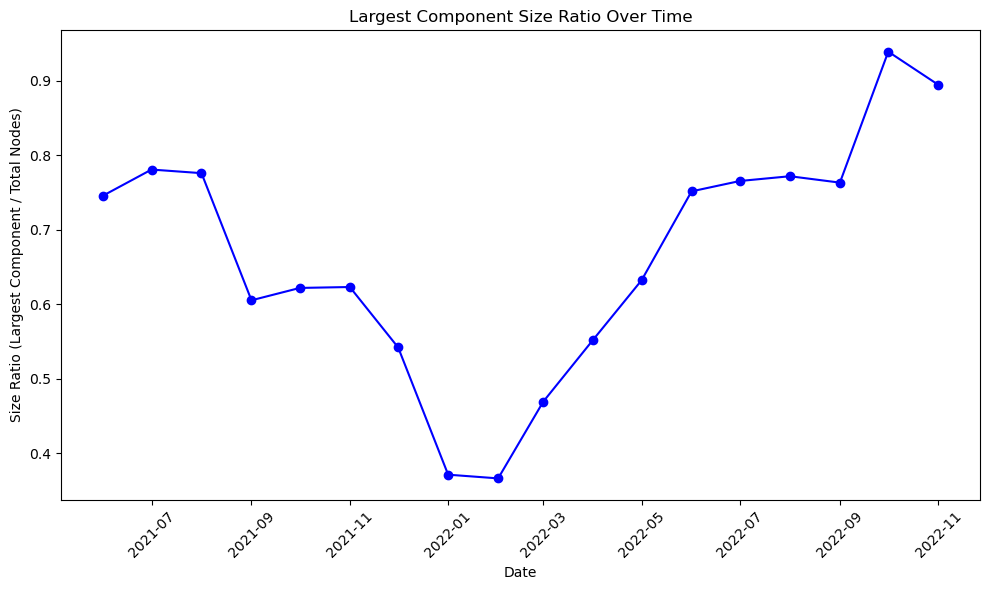

Snapshot Date: 2021-06-01 00:00:00
Largest Component Size: 88
Total Nodes: 118
Size Ratio: 0.7458
Other Components Sizes: [18, 9, 3]


Snapshot Date: 2021-07-01 00:00:00
Largest Component Size: 89
Total Nodes: 114
Size Ratio: 0.7807
Other Components Sizes: [18, 7]


Snapshot Date: 2021-08-01 00:00:00
Largest Component Size: 90
Total Nodes: 116
Size Ratio: 0.7759
Other Components Sizes: [90, 8]


Snapshot Date: 2021-09-01 00:00:00
Largest Component Size: 69
Total Nodes: 114
Size Ratio: 0.6053
Other Components Sizes: [18, 17, 10]


Snapshot Date: 2021-10-01 00:00:00
Largest Component Size: 74
Total Nodes: 119
Size Ratio: 0.6218
Other Components Sizes: [74, 20, 10]


Snapshot Date: 2021-11-01 00:00:00
Largest Component Size: 81
Total Nodes: 130
Size Ratio: 0.6231
Other Components Sizes: [81, 19, 14, 11]


Snapshot Date: 2021-12-01 00:00:00
Largest Component Size: 84
Total Nodes: 155
Size Ratio: 0.5419
Other Components Sizes: [18, 15, 19, 5, 14]


Snapshot Date: 2022-01-01 00:00:00
Largest

In [312]:
import pandas as pd
import networkx as nx
from os.path import join
import matplotlib.pyplot as plt

def load_and_apply_saved_communities(graph, community_file, snapshot_id):
    """Load and apply the saved community assignments to the graph nodes."""
    community_df = pd.read_csv(community_file)
    community_df['Snapshot'] = community_df['Snapshot'].astype(str).str.strip()
    snapshot_id = str(snapshot_id).strip()

    snapshot_communities = community_df[community_df['Snapshot'] == snapshot_id]
    if snapshot_communities.empty:
        print(f"No data found for Snapshot ID: {snapshot_id}")
        return

    community_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Community']))
    for node in graph.nodes():
        graph.nodes[node]['community'] = community_map.get(node, 'Unknown')

def compare_component_sizes(graph_directory, community_file, snapshot_dates):
    """Compare the size of the largest component to other components across all snapshots."""
    size_ratios = {}

    for snapshot_id, snapshot_date in snapshot_dates.items():
        graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        G = nx.read_graphml(graph_file)

        load_and_apply_saved_communities(G, community_file, snapshot_id)

        components = list(nx.connected_components(G))
        component_sizes = [len(component) for component in components]
        largest_component_size = max(component_sizes)
        total_nodes = sum(component_sizes)

        # Calculate the ratio of the largest component size to the total number of nodes
        size_ratio = largest_component_size / total_nodes

        size_ratios[pd.to_datetime(snapshot_date)] = {
            'Largest Component Size': largest_component_size,
            'Total Nodes': total_nodes,
            'Size Ratio': size_ratio,
            'Other Components Sizes': component_sizes[1:],  # Exclude the largest component
        }

    return size_ratios

def plot_component_size_ratios(size_ratios):
    """Plot the ratio of the largest component size to the total number of nodes over time."""
    dates = sorted(size_ratios.keys())
    size_ratios_values = [size_ratios[date]['Size Ratio'] for date in dates]

    plt.figure(figsize=(10, 6))
    plt.plot(dates, size_ratios_values, marker='o', linestyle='-', color='b')
    plt.xlabel("Date")
    plt.ylabel("Size Ratio (Largest Component / Total Nodes)")
    plt.title("Largest Component Size Ratio Over Time")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# Paths and snapshot dates
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Compare component sizes across snapshots
size_ratios = compare_component_sizes(graph_directory, community_file, snapshot_dates)

# Plot the size ratios over time
plot_component_size_ratios(size_ratios)

# Optional: Inspect the component size details
for date, stats in size_ratios.items():
    print(f"Snapshot Date: {date}")
    print(f"Largest Component Size: {stats['Largest Component Size']}")
    print(f"Total Nodes: {stats['Total Nodes']}")
    print(f"Size Ratio: {stats['Size Ratio']:.4f}")
    print(f"Other Components Sizes: {stats['Other Components Sizes']}")
    print("\n")


In [618]:
import plotly.graph_objects as go
import pandas as pd

def prepare_alluvial_data(node_communities_over_time, snapshot_dates):
    """Prepare data for an alluvial plot showing community transitions over time."""
    snapshots = list(snapshot_dates.keys())
    communities = sorted({community for memberships in node_communities_over_time.values() for _, community in memberships}, key=int)

    # Initialize variables to hold source, target, and values (flows)
    source = []
    target = []
    value = []
    labels = []
    color_links = []
    node_map = {}
    current_index = 0

    for i in range(len(snapshots) - 1):
        start_snapshot = snapshots[i]
        end_snapshot = snapshots[i + 1]
        
        for node, memberships in node_communities_over_time.items():
            start_community = None
            end_community = None
            for snap, comm in memberships:
                if snap == start_snapshot:
                    start_community = int(comm)  # Ensure community is an integer
                if snap == end_snapshot:
                    end_community = int(comm)  # Ensure community is an integer
            if start_community is not None and end_community is not None:
                start_label = f"Comm {start_community} ({snapshot_dates[start_snapshot]})"
                end_label = f"Comm {end_community} ({snapshot_dates[end_snapshot]})"
                
                if start_label not in node_map:
                    node_map[start_label] = current_index
                    labels.append(start_label)
                    current_index += 1

                if end_label not in node_map:
                    node_map[end_label] = current_index
                    labels.append(end_label)
                    current_index += 1

                source.append(node_map[start_label])
                target.append(node_map[end_label])
                value.append(1)  # Each node is one flow unit

                # Use consistent colors for links based on the starting community
                color_links.append(f"rgba({(start_community * 37) % 256}, {(start_community * 97) % 256}, {(start_community * 157) % 256}, 0.7)")

    return source, target, value, labels, color_links

# Prepare data for the alluvial plot
source, target, value, labels, color_links = prepare_alluvial_data(node_communities_over_time, snapshot_dates)

def plot_enhanced_alluvial(source, target, value, labels, color_links):
    """Plot an enhanced alluvial diagram showing community transitions over time with smoother flows."""
    fig = go.Figure(go.Sankey(
        arrangement='snap',  # Align nodes as tightly as possible
        node=dict(
            pad=15,
            thickness=15,
            line=dict(color="black", width=0.5),
            label=labels,
            color="rgba(31, 119, 180, 0.8)",  # Set a semi-transparent base color for nodes
            hovertemplate='%{label}<extra></extra>',
        ),
        link=dict(
            source=source,
            target=target,
            value=value,
            color=color_links,  # Apply the custom colors for each link
            hovertemplate='<b>Flow:</b> %{value}<br><b>From:</b> %{source.label}<br><b>To:</b> %{target.label}<extra></extra>',
        )
    ))

    fig.update_layout(
        title_text="Time Evolution of Community Structure",
        font_size=12,
        hovermode='x',
        plot_bgcolor='white',
        paper_bgcolor='white',
        margin=dict(l=0, r=0, t=50, b=0)
    )

    fig.show()

# Example usage to plot the enhanced alluvial diagram
plot_enhanced_alluvial(source, target, value, labels, color_links)


In [620]:
import pandas as pd
from collections import defaultdict

def calculate_magnitude_of_flows(node_communities_over_time, snapshot_dates):
    """Calculate the magnitude of flows between communities over time."""
    flow_data = defaultdict(lambda: defaultdict(int))  # flow_data[start_comm][end_comm] = count

    # Sort the snapshots by date
    sorted_snapshots = sorted(snapshot_dates.keys(), key=lambda x: snapshot_dates[x])

    # Analyze flows between consecutive snapshots
    for i in range(len(sorted_snapshots) - 1):
        start_snapshot = sorted_snapshots[i]
        end_snapshot = sorted_snapshots[i + 1]

        # Temporary storage for the current and next snapshot's communities
        current_communities = defaultdict(set)
        next_communities = defaultdict(set)

        for node, memberships in node_communities_over_time.items():
            start_community = None
            end_community = None

            for snap, comm in memberships:
                if snap == start_snapshot:
                    start_community = int(comm)
                if snap == end_snapshot:
                    end_community = int(comm)

            if start_community is not None and end_community is not None:
                current_communities[start_community].add(node)
                next_communities[end_community].add(node)

                # Record the flow between the communities
                flow_data[start_community][end_community] += 1

    return flow_data, sorted_snapshots

def format_flow_data_table(flow_data, sorted_snapshots):
    """Format the flow data into a table."""
    table_data = []

    for start_community, end_communities in flow_data.items():
        for end_community, count in end_communities.items():
            table_data.append({
                'Start Community': start_community,
                'End Community': end_community,
                'Flow Magnitude': count
            })

    return pd.DataFrame(table_data)

# Example Usage
# Assuming you have node_communities_over_time and snapshot_dates defined

flow_data, sorted_snapshots = calculate_magnitude_of_flows(node_communities_over_time, snapshot_dates)
flow_df = format_flow_data_table(flow_data, sorted_snapshots)

# Display the table
print(flow_df)


    Start Community  End Community  Flow Magnitude
0                 0              0             213
1                 0              6              17
2                 0              4               1
3                 0              3               1
4                 0             11               8
5                 0              1              13
6                 0              8               1
7                 1              1             508
8                 3              3             351
9                 3              0               1
10                3              7               1
11                3             10               9
12                4              4             208
13                4              7               1
14                4              3               2
15                4              6              14
16                4              0               1
17                5              5             259
18                5            

# Betweeness centrality

In [313]:
import pandas as pd
import networkx as nx
from os.path import join
from collections import defaultdict

def load_and_apply_saved_communities(graph, community_file, snapshot_id):
    """Load and apply the saved community assignments to the graph nodes."""
    community_df = pd.read_csv(community_file)
    community_df['Snapshot'] = community_df['Snapshot'].astype(str).str.strip()
    snapshot_id = str(snapshot_id).strip()

    snapshot_communities = community_df[community_df['Snapshot'] == snapshot_id]
    if snapshot_communities.empty:
        print(f"No data found for Snapshot ID: {snapshot_id}")
        return

    community_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Community']))
    for node in graph.nodes():
        graph.nodes[node]['community'] = community_map.get(node, 'Unknown')

def calculate_betweenness_centrality(graph):
    """Calculate the betweenness centrality for each node in the graph."""
    betweenness_centrality = nx.betweenness_centrality(graph)
    return betweenness_centrality

def analyze_betweenness_centrality_for_snapshot(graph_directory, community_file, snapshot_id):
    """Analyze betweenness centrality for a specific snapshot."""
    graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
    G = nx.read_graphml(graph_file)

    # Apply saved community assignments
    load_and_apply_saved_communities(G, community_file, snapshot_id)

    # Calculate betweenness centrality
    betweenness_centrality = calculate_betweenness_centrality(G)

    # Optional: Aggregate or analyze betweenness centrality by community
    community_centrality = defaultdict(list)
    for node, centrality in betweenness_centrality.items():
        community = G.nodes[node].get('community', 'Unknown')
        community_centrality[community].append(centrality)

    # Average betweenness centrality per community
    average_centrality_per_community = {community: sum(centralities) / len(centralities) 
                                        for community, centralities in community_centrality.items()}

    print(f"Betweenness Centrality for Snapshot {snapshot_id}:")
    for community, avg_centrality in average_centrality_per_community.items():
        print(f"Community {community}: Average Betweenness Centrality = {avg_centrality}")

    return betweenness_centrality, average_centrality_per_community

# Paths and snapshot information
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'
snapshot_id = '11659570'  # Specific snapshot ID for analysis

# Analyze betweenness centrality for the snapshot
betweenness_centrality, avg_centrality_per_community = analyze_betweenness_centrality_for_snapshot(graph_directory, community_file, snapshot_id)


Betweenness Centrality for Snapshot 11659570:
Community 0: Average Betweenness Centrality = 0.018300088756454436
Community 1: Average Betweenness Centrality = 0.0
Community 3: Average Betweenness Centrality = 0.010135929499324722
Community 4: Average Betweenness Centrality = 0.013085498090959156
Community 5: Average Betweenness Centrality = 0.009847263396959138
Community 6: Average Betweenness Centrality = 0.0007643743787817497
Community 7: Average Betweenness Centrality = 0.0039787798408488055
Community 8: Average Betweenness Centrality = 0.0
Community 2: Average Betweenness Centrality = 0.0


In [314]:
import pandas as pd
import networkx as nx
from os.path import join
from collections import defaultdict

def load_and_apply_saved_communities(graph, community_file, snapshot_id):
    """Load and apply the saved community assignments to the graph nodes."""
    community_df = pd.read_csv(community_file)
    community_df['Snapshot'] = community_df['Snapshot'].astype(str).str.strip()
    snapshot_id = str(snapshot_id).strip()

    snapshot_communities = community_df[community_df['Snapshot'] == snapshot_id]
    if snapshot_communities.empty:
        print(f"No data found for Snapshot ID: {snapshot_id}")
        return

    community_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Community']))
    for node in graph.nodes():
        graph.nodes[node]['community'] = community_map.get(node, 'Unknown')

def calculate_betweenness_centrality(graph):
    """Calculate the betweenness centrality for each node in the graph."""
    betweenness_centrality = nx.betweenness_centrality(graph, weight='weight')
    return betweenness_centrality

def calculate_closeness_centrality(graph):
    """Calculate the closeness centrality for each node in the graph."""
    closeness_centrality = nx.closeness_centrality(graph, distance='weight')
    return closeness_centrality

def analyze_centrality_for_all_snapshots(graph_directory, community_file, snapshot_dates):
    """Analyze betweenness and closeness centrality across all snapshots."""
    community_betweenness = defaultdict(list)
    community_closeness = defaultdict(list)

    for snapshot_id in snapshot_dates.keys():
        graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        G = nx.read_graphml(graph_file)

        # Apply saved community assignments
        load_and_apply_saved_communities(G, community_file, snapshot_id)

        # Calculate betweenness and closeness centrality
        betweenness_centrality = calculate_betweenness_centrality(G)
        closeness_centrality = calculate_closeness_centrality(G)

        # Aggregate centrality measures by community
        for node in G.nodes():
            community = G.nodes[node].get('community', 'Unknown')
            community_betweenness[community].append(betweenness_centrality.get(node, 0))
            community_closeness[community].append(closeness_centrality.get(node, 0))

    # Calculate average centrality measures across all snapshots
    avg_betweenness_per_community = {community: sum(values) / len(values) 
                                     for community, values in community_betweenness.items()}
    avg_closeness_per_community = {community: sum(values) / len(values) 
                                   for community, values in community_closeness.items()}

    print("Overall Betweenness Centrality Across All Snapshots:")
    for community, avg_centrality in avg_betweenness_per_community.items():
        print(f"Community {community}: Average Betweenness Centrality = {avg_centrality:.4f}")

    print("\nOverall Closeness Centrality Across All Snapshots:")
    for community, avg_centrality in avg_closeness_per_community.items():
        print(f"Community {community}: Average Closeness Centrality = {avg_centrality:.4f}")

    return avg_betweenness_per_community, avg_closeness_per_community

# Paths and snapshot information
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Analyze betweenness and closeness centrality across all snapshots
avg_betweenness_per_community, avg_closeness_per_community = analyze_centrality_for_all_snapshots(graph_directory, community_file, snapshot_dates)


Overall Betweenness Centrality Across All Snapshots:
Community 0: Average Betweenness Centrality = 0.0110
Community 1: Average Betweenness Centrality = 0.0022
Community 3: Average Betweenness Centrality = 0.0054
Community 4: Average Betweenness Centrality = 0.0059
Community 5: Average Betweenness Centrality = 0.0051
Community 6: Average Betweenness Centrality = 0.0009
Community 7: Average Betweenness Centrality = 0.0039
Community 8: Average Betweenness Centrality = 0.0039
Community 2: Average Betweenness Centrality = 0.0000
Community 10: Average Betweenness Centrality = 0.0049
Community 9: Average Betweenness Centrality = 0.0000
Community 11: Average Betweenness Centrality = 0.0013

Overall Closeness Centrality Across All Snapshots:
Community 0: Average Closeness Centrality = 0.3278
Community 1: Average Closeness Centrality = 0.1516
Community 3: Average Closeness Centrality = 0.2189
Community 4: Average Closeness Centrality = 0.2004
Community 5: Average Closeness Centrality = 0.2308
Co

In [315]:
import pandas as pd
import networkx as nx
from os.path import join

def load_and_apply_saved_communities(graph, community_file, snapshot_id):
    """Load and apply the saved community assignments to the graph nodes."""
    community_df = pd.read_csv(community_file)
    community_df['Snapshot'] = community_df['Snapshot'].astype(str).str.strip()
    snapshot_id = str(snapshot_id).strip()

    snapshot_communities = community_df[community_df['Snapshot'] == snapshot_id]
    if snapshot_communities.empty:
        print(f"No data found for Snapshot ID: {snapshot_id}")
        return

    community_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Community']))
    token_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Token']))
    
    for node in graph.nodes():
        graph.nodes[node]['community'] = community_map.get(node, 'Unknown')
        graph.nodes[node]['token'] = token_map.get(node, 'Unknown Token')

def calculate_betweenness_centrality(graph):
    """Calculate the betweenness centrality for each node in the graph."""
    betweenness_centrality = nx.betweenness_centrality(graph)
    return betweenness_centrality

def find_top_betweenness_nodes(graph_directory, community_file, snapshot_id, top_n=10):
    """Find and display the top N nodes with the highest betweenness centrality."""
    graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
    G = nx.read_graphml(graph_file)

    # Apply saved community and token assignments
    load_and_apply_saved_communities(G, community_file, snapshot_id)

    # Calculate betweenness centrality
    betweenness_centrality = calculate_betweenness_centrality(G)

    # Sort nodes by betweenness centrality
    sorted_nodes = sorted(betweenness_centrality.items(), key=lambda x: x[1], reverse=True)

    # Display the top N nodes with the highest betweenness centrality
    print(f"Top {top_n} Nodes by Betweenness Centrality in Snapshot {snapshot_id}:")
    for node, centrality in sorted_nodes[:top_n]:
        community = G.nodes[node].get('community', 'Unknown')
        token = G.nodes[node].get('token', 'Unknown Token')
        print(f"Node: {node}, Betweenness Centrality: {centrality:.6f}, Community: {community}, Token: {token}")

    return sorted_nodes[:top_n]

# Paths and snapshot information
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'
snapshot_id = '11659570'  # Specific snapshot ID for analysis

# Find and display the top nodes with the highest betweenness centrality
top_betweenness_nodes = find_top_betweenness_nodes(graph_directory, community_file, snapshot_id)


Top 10 Nodes by Betweenness Centrality in Snapshot 11659570:
Node: 0xbe0eb53f46cd790cd13851d5eff43d12404d33e8, Betweenness Centrality: 0.222453, Community: 4, Token: Curve
Node: 0x3dfd23a6c5e8bbcfc9581d2e864a68feb6a076d3, Betweenness Centrality: 0.212855, Community: 3, Token: Maker
Node: 0x8328a42a583d4812268c4dd63ae2f77f37a6b4f3, Betweenness Centrality: 0.167403, Community: 5, Token: Compound
Node: 0xe93381fb4c4f14bda253907b18fad305d799241a, Betweenness Centrality: 0.068725, Community: 0, Token: Curve
Node: 0x3f5ce5fbfe3e9af3971dd833d26ba9b5c936f0be, Betweenness Centrality: 0.029418, Community: 0, Token: Sushi
Node: 0x2faf487a4414fe77e2327f0bf4ae2a264a776ad2, Betweenness Centrality: 0.022687, Community: 0, Token: Yearn Finance
Node: 0xba37b002abafdd8e89a1995da52740bbc013d992, Betweenness Centrality: 0.022687, Community: 0, Token: Yearn Finance
Node: 0x2fdbadf3c4d5a8666bc06645b8358ab803996e28, Betweenness Centrality: 0.022687, Community: 0, Token: Yearn Finance
Node: 0x088ee5007c98a967

# Betweeness largest component

In [317]:
import pandas as pd
import networkx as nx
from os.path import join
from collections import defaultdict

def load_and_apply_saved_communities(graph, community_file, snapshot_id):
    """Load and apply the saved community assignments to the graph nodes."""
    community_df = pd.read_csv(community_file)
    community_df['Snapshot'] = community_df['Snapshot'].astype(str).str.strip()
    snapshot_id = str(snapshot_id).strip()

    snapshot_communities = community_df[community_df['Snapshot'] == snapshot_id]
    if snapshot_communities.empty:
        print(f"No data found for Snapshot ID: {snapshot_id}")
        return

    community_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Community']))
    token_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Token']))
    
    for node in graph.nodes():
        graph.nodes[node]['community'] = community_map.get(node, 'Unknown')
        graph.nodes[node]['token'] = token_map.get(node, 'Unknown Token')

def calculate_betweenness_centrality_largest_component(graph):
    """Calculate the betweenness centrality for each node in the largest component of the graph."""
    largest_component = max(nx.connected_components(graph), key=len)
    subgraph = graph.subgraph(largest_component)
    betweenness_centrality = nx.betweenness_centrality(subgraph)
    return betweenness_centrality

def average_betweenness_centrality_across_snapshots(graph_directory, community_file, snapshot_dates):
    """Calculate the average betweenness centrality for each node across all snapshots for the largest component."""
    centrality_sums = defaultdict(float)
    node_occurrences = defaultdict(int)
    node_community = {}
    node_token = {}

    for snapshot_id, snapshot_date in snapshot_dates.items():
        graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        G = nx.read_graphml(graph_file)

        load_and_apply_saved_communities(G, community_file, snapshot_id)

        betweenness_centrality = calculate_betweenness_centrality_largest_component(G)

        for node, centrality in betweenness_centrality.items():
            centrality_sums[node] += centrality
            node_occurrences[node] += 1
            node_community[node] = G.nodes[node].get('community', 'Unknown')
            node_token[node] = G.nodes[node].get('token', 'Unknown Token')

    # Calculate average centrality for each node
    average_centrality = {node: centrality_sums[node] / node_occurrences[node] for node in centrality_sums}

    return average_centrality, node_community, node_token

def find_top_average_betweenness_nodes(average_centrality, node_community, node_token, top_n=50):
    """Find the top N nodes with the highest average betweenness centrality."""
    sorted_nodes = sorted(average_centrality.items(), key=lambda x: x[1], reverse=True)[:top_n]
    top_nodes = [
        {
            'Node': node,
            'Average Betweenness Centrality': centrality,
            'Community': node_community[node],
            'Token': node_token[node]
        }
        for node, centrality in sorted_nodes
    ]
    return top_nodes

# Paths and snapshot information
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Step 1: Calculate average betweenness centrality across all snapshots
average_centrality, node_community, node_token = average_betweenness_centrality_across_snapshots(graph_directory, community_file, snapshot_dates)

# Step 2: Find and display the top nodes with the highest average betweenness centrality
top_average_nodes = find_top_average_betweenness_nodes(average_centrality, node_community, node_token, top_n=50)

# Convert the results to a DataFrame for better visualization and export
df_top_average_nodes = pd.DataFrame(top_average_nodes)

# Display the results
print(df_top_average_nodes)

# Optionally, save the results to a CSV file
#output_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/top_average_betweenness_nodes_largest_component.csv'
#df_top_average_nodes.to_csv(output_file, index=False)


                                          Node  \
0   0xf977814e90da44bfa03b6295a0616a897441acec   
1   0x8328a42a583d4812268c4dd63ae2f77f37a6b4f3   
2   0x28c6c06298d514db089934071355e5743bf21d60   
3   0xbe0eb53f46cd790cd13851d5eff43d12404d33e8   
4   0xe93381fb4c4f14bda253907b18fad305d799241a   
5   0x40ec5b33f54e0e8a33a975908c5ba1c14e5bbbdf   
6   0x2faf487a4414fe77e2327f0bf4ae2a264a776ad2   
7   0x3dfd23a6c5e8bbcfc9581d2e864a68feb6a076d3   
8   0x3f5ce5fbfe3e9af3971dd833d26ba9b5c936f0be   
9   0x2fdbadf3c4d5a8666bc06645b8358ab803996e28   
10  0xa52abc4cf2cdb908fa6c38e88d7162c03ece92f9   
11  0xbcd5000f5c522856e710c5d274bb672b2f2eefbf   
12  0x9c4ea0bf80c4768314c4f631ac84e274b32385fe   
13  0x2b67a3c0b90f6ae4394210692f69968d02970126   
14  0x47ac0fb4f2d84898e4d9e7b4dab3c24507a6d503   
15  0x555981b82743aa443cb1c3002c85ba9d795d4596   
16  0x3744da57184575064838bbc87a0fc791f5e39ea2   
17  0x5f65f7b609678448494de4c87521cdf6cef1e932   
18  0x4048c47b546b68ad226ea20b5f0acac49b086a21   


In [318]:
import pandas as pd
import networkx as nx
from os.path import join
from collections import defaultdict

def load_and_apply_saved_communities(graph, community_file, snapshot_id):
    """Load and apply the saved community assignments to the graph nodes."""
    community_df = pd.read_csv(community_file)
    community_df['Snapshot'] = community_df['Snapshot'].astype(str).str.strip()
    snapshot_id = str(snapshot_id).strip()

    snapshot_communities = community_df[community_df['Snapshot'] == snapshot_id]
    if snapshot_communities.empty:
        print(f"No data found for Snapshot ID: {snapshot_id}")
        return

    community_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Community']))
    token_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Token']))
    
    for node in graph.nodes():
        graph.nodes[node]['community'] = community_map.get(node, 'Unknown')
        graph.nodes[node]['token'] = token_map.get(node, 'Unknown Token')

def calculate_betweenness_centrality_largest_component(graph):
    """Calculate the betweenness centrality for each node in the largest component of the graph."""
    largest_component = max(nx.connected_components(graph), key=len)
    subgraph = graph.subgraph(largest_component)
    betweenness_centrality = nx.betweenness_centrality(subgraph)
    return betweenness_centrality

def average_betweenness_centrality_across_snapshots(graph_directory, community_file, snapshot_dates):
    """Calculate the average betweenness centrality for each node across all snapshots for the largest component."""
    centrality_sums = defaultdict(float)
    node_occurrences = defaultdict(int)

    for snapshot_id, snapshot_date in snapshot_dates.items():
        graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        G = nx.read_graphml(graph_file)

        load_and_apply_saved_communities(G, community_file, snapshot_id)

        betweenness_centrality = calculate_betweenness_centrality_largest_component(G)

        for node, centrality in betweenness_centrality.items():
            centrality_sums[node] += centrality
            node_occurrences[node] += 1

    # Calculate average centrality for each node
    average_centrality = {node: centrality_sums[node] / node_occurrences[node] for node in centrality_sums}

    return average_centrality

def find_top_average_betweenness_nodes(average_centrality, top_n=50):
    """Find the top N nodes with the highest average betweenness centrality."""
    sorted_nodes = sorted(average_centrality.items(), key=lambda x: x[1], reverse=True)[:top_n]
    return sorted_nodes

# Paths and snapshot information
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Step 1: Calculate average betweenness centrality across all snapshots
average_centrality = average_betweenness_centrality_across_snapshots(graph_directory, community_file, snapshot_dates)

# Step 2: Find and display the top nodes with the highest average betweenness centrality
top_average_nodes = find_top_average_betweenness_nodes(average_centrality, top_n=50)

# Convert the results to a DataFrame for better visualization and export
df_top_average_nodes = pd.DataFrame(top_average_nodes, columns=['Node', 'Average Betweenness Centrality'])

# Display the results
print(df_top_average_nodes)

# Optionally, save the results to a CSV file
#output_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/top_average_betweenness_nodes_largest_component.csv'
#df_top_average_nodes.to_csv(output_file, index=False)


                                          Node  Average Betweenness Centrality
0   0xf977814e90da44bfa03b6295a0616a897441acec                        0.466768
1   0x8328a42a583d4812268c4dd63ae2f77f37a6b4f3                        0.167757
2   0x28c6c06298d514db089934071355e5743bf21d60                        0.165960
3   0xbe0eb53f46cd790cd13851d5eff43d12404d33e8                        0.136250
4   0xe93381fb4c4f14bda253907b18fad305d799241a                        0.127573
5   0x40ec5b33f54e0e8a33a975908c5ba1c14e5bbbdf                        0.123256
6   0x2faf487a4414fe77e2327f0bf4ae2a264a776ad2                        0.099139
7   0x3dfd23a6c5e8bbcfc9581d2e864a68feb6a076d3                        0.083473
8   0x3f5ce5fbfe3e9af3971dd833d26ba9b5c936f0be                        0.047959
9   0x2fdbadf3c4d5a8666bc06645b8358ab803996e28                        0.041153
10  0xa52abc4cf2cdb908fa6c38e88d7162c03ece92f9                        0.037184
11  0xbcd5000f5c522856e710c5d274bb672b2f2eefbf      

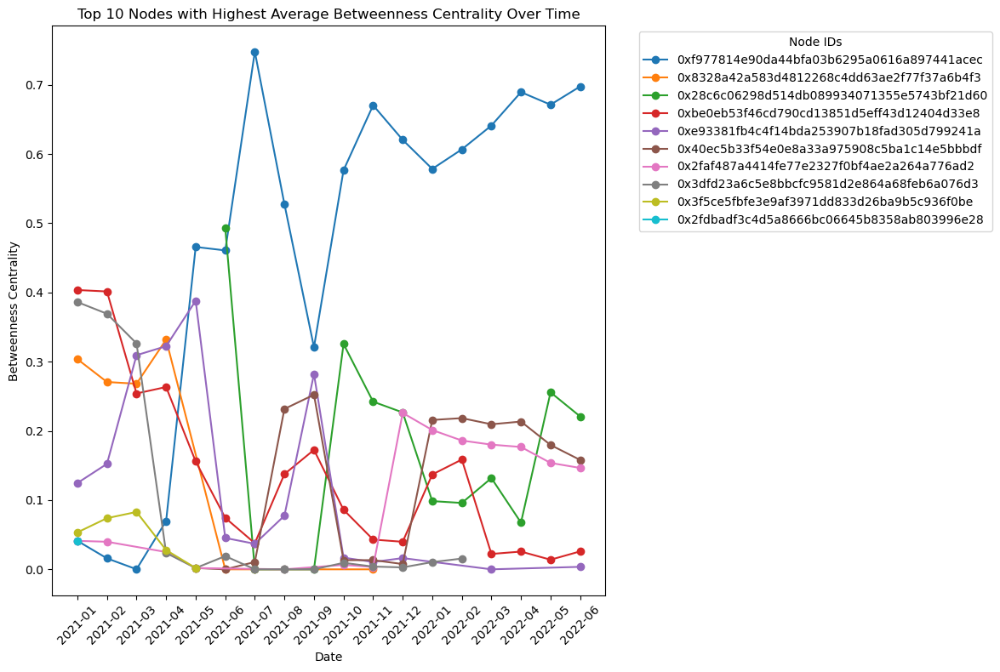

In [810]:
import pandas as pd
import networkx as nx
from os.path import join
from collections import defaultdict
import matplotlib.pyplot as plt

def load_and_apply_saved_communities(graph, community_file, snapshot_id):
    """Load and apply the saved community assignments to the graph nodes."""
    community_df = pd.read_csv(community_file)
    community_df['Snapshot'] = community_df['Snapshot'].astype(str).str.strip()
    snapshot_id = str(snapshot_id).strip()

    snapshot_communities = community_df[community_df['Snapshot'] == snapshot_id]
    if snapshot_communities.empty:
        print(f"No data found for Snapshot ID: {snapshot_id}")
        return

    community_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Community']))
    token_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Token']))
    
    for node in graph.nodes():
        graph.nodes[node]['community'] = community_map.get(node, 'Unknown')
        graph.nodes[node]['token'] = token_map.get(node, 'Unknown Token')

def calculate_betweenness_centrality_largest_component(graph):
    """Calculate the betweenness centrality for each node in the largest component of the graph."""
    largest_component = max(nx.connected_components(graph), key=len)
    subgraph = graph.subgraph(largest_component)
    betweenness_centrality = nx.betweenness_centrality(subgraph)
    return betweenness_centrality

def track_betweenness_centrality_over_time(graph_directory, community_file, snapshot_dates):
    """Track the betweenness centrality for each node across all snapshots for the largest component."""
    centrality_over_time = defaultdict(lambda: defaultdict(float))

    for snapshot_id, snapshot_date in snapshot_dates.items():
        graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        G = nx.read_graphml(graph_file)

        load_and_apply_saved_communities(G, community_file, snapshot_id)

        betweenness_centrality = calculate_betweenness_centrality_largest_component(G)

        for node, centrality in betweenness_centrality.items():
            centrality_over_time[node][snapshot_date] = centrality

    return centrality_over_time

def plot_top_betweenness_centrality_over_time(centrality_over_time, snapshot_dates, top_n=10):
    """Plot the betweenness centrality over time for the top N nodes with the highest average centrality."""
    # Calculate the average centrality for each node
    average_centrality = {node: sum(centralities.values()) / len(centralities) 
                          for node, centralities in centrality_over_time.items()}
    
    # Get the top N nodes by average centrality
    top_nodes = sorted(average_centrality.items(), key=lambda x: x[1], reverse=True)[:top_n]
    top_node_ids = [node for node, _ in top_nodes]

    plt.figure(figsize=(12, 8))
    
    # Plot the betweenness centrality over time for each top node
    for node in top_node_ids:
        dates = sorted(centrality_over_time[node].keys())
        centralities = [centrality_over_time[node][date] for date in dates]
        plt.plot(dates, centralities, marker='o', label=node)
    
    plt.xlabel("Date")
    plt.ylabel("Betweenness Centrality")
    plt.title(f"Top {top_n} Nodes with Highest Average Betweenness Centrality Over Time")
    plt.xticks(rotation=45)
    plt.legend(title="Node IDs", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

# Paths and snapshot dates
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'
snapshot_dates = {
    '11659570': '2021-01',
    '11861210': '2021-02',
    '12043054': '2021-03',
    '12244515': '2021-04',
    '12438842': '2021-05',
    '12638919': '2021-06',
    '12831436': '2021-07',
    '13029639': '2021-08',
    '13230157': '2021-09',
    '13422506': '2021-10',
    '13620205': '2021-11',
    '13809597': '2021-12',
    '14009885': '2022-01',
    '14210564': '2022-02',
    '14391029': '2022-03',
    '14589816': '2022-04',
    '14779829': '2022-05',
    '14967365': '2022-06'
}

# Track betweenness centrality over the entire period
centrality_over_time = track_betweenness_centrality_over_time(graph_directory, community_file, snapshot_dates)

# Plot the betweenness centrality over time for the top 10 nodes
plot_top_betweenness_centrality_over_time(centrality_over_time, snapshot_dates, top_n=10)


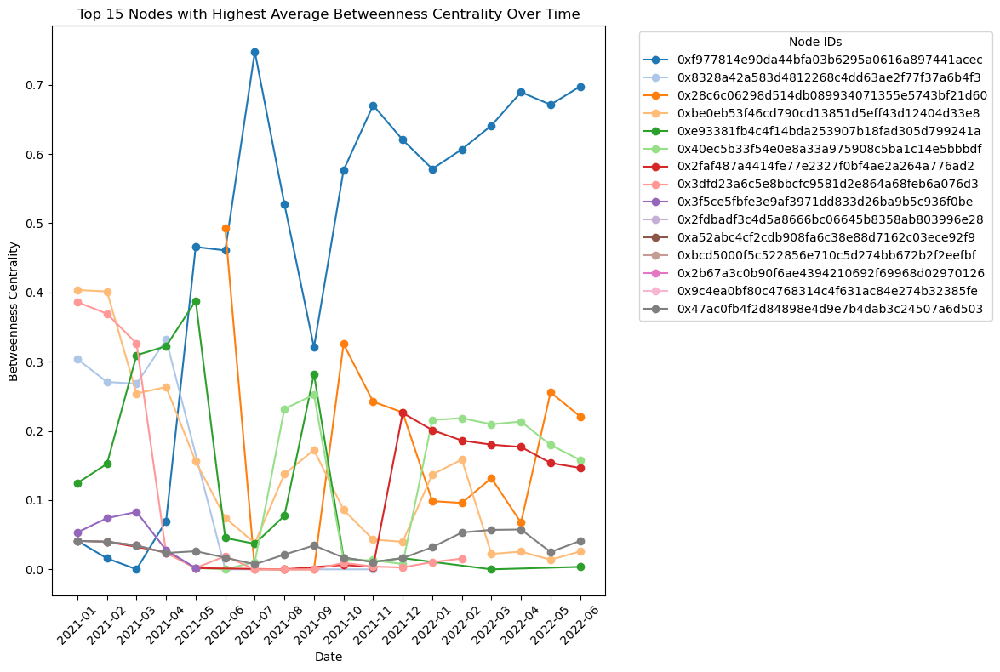

In [823]:
import pandas as pd
import networkx as nx
from os.path import join
from collections import defaultdict
import matplotlib.pyplot as plt
import seaborn as sns  # Import seaborn for better color control

def load_and_apply_saved_communities(graph, community_file, snapshot_id):
    """Load and apply the saved community assignments to the graph nodes."""
    community_df = pd.read_csv(community_file)
    community_df['Snapshot'] = community_df['Snapshot'].astype(str).str.strip()
    snapshot_id = str(snapshot_id).strip()

    snapshot_communities = community_df[community_df['Snapshot'] == snapshot_id]
    if snapshot_communities.empty:
        print(f"No data found for Snapshot ID: {snapshot_id}")
        return

    community_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Community']))
    token_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Token']))
    
    for node in graph.nodes():
        graph.nodes[node]['community'] = community_map.get(node, 'Unknown')
        graph.nodes[node]['token'] = token_map.get(node, 'Unknown Token')

def calculate_betweenness_centrality_largest_component(graph):
    """Calculate the betweenness centrality for each node in the largest component of the graph."""
    largest_component = max(nx.connected_components(graph), key=len)
    subgraph = graph.subgraph(largest_component)
    betweenness_centrality = nx.betweenness_centrality(subgraph)
    return betweenness_centrality

def track_betweenness_centrality_over_time(graph_directory, community_file, snapshot_dates):
    """Track the betweenness centrality for each node across all snapshots for the largest component."""
    centrality_over_time = defaultdict(lambda: defaultdict(float))

    for snapshot_id, snapshot_date in snapshot_dates.items():
        graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        G = nx.read_graphml(graph_file)

        load_and_apply_saved_communities(G, community_file, snapshot_id)

        betweenness_centrality = calculate_betweenness_centrality_largest_component(G)

        for node, centrality in betweenness_centrality.items():
            centrality_over_time[node][snapshot_date] = centrality

    return centrality_over_time

def plot_top_betweenness_centrality_over_time(centrality_over_time, snapshot_dates, top_n=10):
    """Plot the betweenness centrality over time for the top N nodes with the highest average centrality."""
    # Calculate the average centrality for each node
    average_centrality = {node: sum(centralities.values()) / len(centralities) 
                          for node, centralities in centrality_over_time.items()}
    
    # Get the top N nodes by average centrality
    top_nodes = sorted(average_centrality.items(), key=lambda x: x[1], reverse=True)[:top_n]
    top_node_ids = [node for node, _ in top_nodes]

    plt.figure(figsize=(12, 8))
    
    # Generate a color palette with a balanced mix of colors
    palette = sns.color_palette("tab20", top_n)  # "tab20" provides a good mix of standard colors

    # Plot the betweenness centrality over time for each top node with unique colors
    for idx, node in enumerate(top_node_ids):
        dates = sorted(centrality_over_time[node].keys())
        centralities = [centrality_over_time[node][date] for date in dates]
        plt.plot(dates, centralities, marker='o', label=node, color=palette[idx])
    
    plt.xlabel("Date")
    plt.ylabel("Betweenness Centrality")
    plt.title(f"Top {top_n} Nodes with Highest Average Betweenness Centrality Over Time")
    plt.xticks(rotation=45)
    plt.legend(title="Node IDs", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

# Paths and snapshot dates
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'
snapshot_dates = {
    '11659570': '2021-01',
    '11861210': '2021-02',
    '12043054': '2021-03',
    '12244515': '2021-04',
    '12438842': '2021-05',
    '12638919': '2021-06',
    '12831436': '2021-07',
    '13029639': '2021-08',
    '13230157': '2021-09',
    '13422506': '2021-10',
    '13620205': '2021-11',
    '13809597': '2021-12',
    '14009885': '2022-01',
    '14210564': '2022-02',
    '14391029': '2022-03',
    '14589816': '2022-04',
    '14779829': '2022-05',
    '14967365': '2022-06'
}

# Track betweenness centrality over the entire period
centrality_over_time = track_betweenness_centrality_over_time(graph_directory, community_file, snapshot_dates)

# Plot the betweenness centrality over time for the top 15 nodes
plot_top_betweenness_centrality_over_time(centrality_over_time, snapshot_dates, top_n=15)



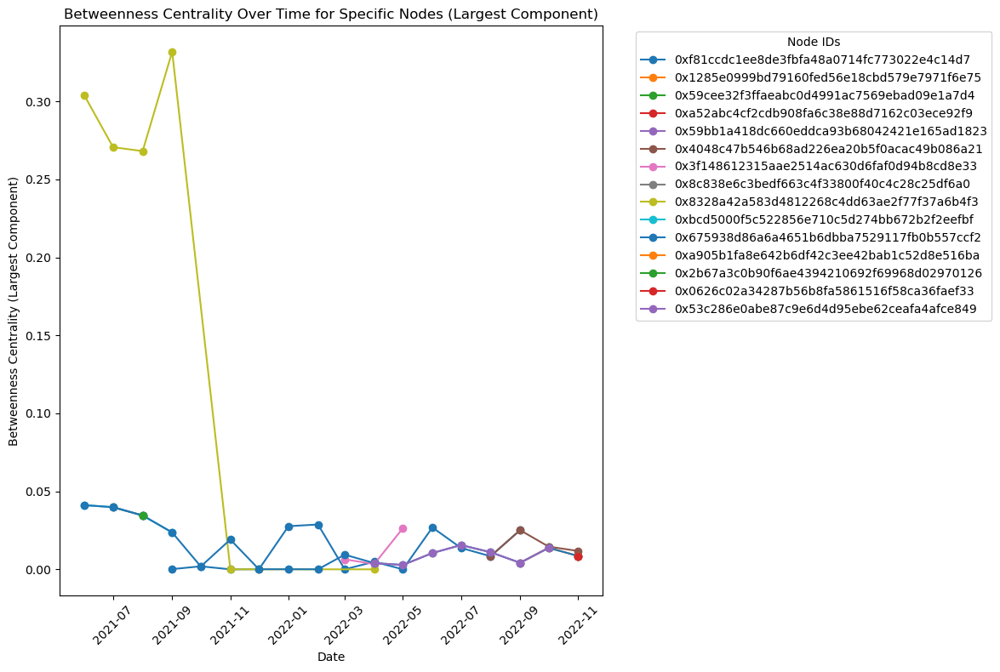

In [815]:
import pandas as pd
import networkx as nx
from os.path import join
from collections import defaultdict
import matplotlib.pyplot as plt

# Define the specific nodes to track
specific_nodes = {
    '0x8328a42a583d4812268c4dd63ae2f77f37a6b4f3',
    '0xa52abc4cf2cdb908fa6c38e88d7162c03ece92f9',
    '0xbcd5000f5c522856e710c5d274bb672b2f2eefbf',
    '0x2b67a3c0b90f6ae4394210692f69968d02970126',
    '0x4048c47b546b68ad226ea20b5f0acac49b086a21',
    '0x59cee32f3ffaeabc0d4991ac7569ebad09e1a7d4',
    '0x675938d86a6a4651b6dbba7529117fb0b557ccf2',
    '0x3f148612315aae2514ac630d6faf0d94b8cd8e33',
    '0xf81ccdc1ee8de3fbfa48a0714fc773022e4c14d7',
    '0x1285e0999bd79160fed56e18cbd579e7971f6e75',
    '0x53c286e0abe87c9e6d4d95ebe62ceafa4afce849',
    '0x59bb1a418dc660eddca93b68042421e165ad1823',
    '0x0626c02a34287b56b8fa5861516f58ca36faef33',
    '0x8c838e6c3bedf663c4f33800f40c4c28c25df6a0',
    '0xa905b1fa8e642b6df42c3ee42bab1c52d8e516ba'
}

def load_and_apply_saved_communities(graph, community_file, snapshot_id):
    """Load and apply the saved community assignments to the graph nodes."""
    community_df = pd.read_csv(community_file)
    community_df['Snapshot'] = community_df['Snapshot'].astype(str).str.strip()
    snapshot_id = str(snapshot_id).strip()

    snapshot_communities = community_df[community_df['Snapshot'] == snapshot_id]
    if snapshot_communities.empty:
        print(f"No data found for Snapshot ID: {snapshot_id}")
        return

    community_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Community']))
    token_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Token']))
    
    for node in graph.nodes():
        graph.nodes[node]['community'] = community_map.get(node, 'Unknown')
        graph.nodes[node]['token'] = token_map.get(node, 'Unknown Token')

def calculate_betweenness_centrality_largest_component(graph):
    """Calculate the betweenness centrality for each node in the largest component of the graph."""
    largest_component = max(nx.connected_components(graph), key=len)
    subgraph = graph.subgraph(largest_component)
    betweenness_centrality = nx.betweenness_centrality(subgraph)
    return betweenness_centrality

def track_betweenness_centrality_over_time(graph_directory, community_file, snapshot_dates):
    """Track the betweenness centrality for specific nodes across all snapshots for the largest component."""
    centrality_over_time = defaultdict(lambda: defaultdict(float))

    for snapshot_id, snapshot_date in snapshot_dates.items():
        graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        G = nx.read_graphml(graph_file)

        load_and_apply_saved_communities(G, community_file, snapshot_id)

        betweenness_centrality = calculate_betweenness_centrality_largest_component(G)

        for node, centrality in betweenness_centrality.items():
            if node in specific_nodes:
                centrality_over_time[node][pd.to_datetime(snapshot_date)] = centrality

    return centrality_over_time

def plot_specific_betweenness_centrality_over_time(centrality_over_time):
    """Plot the betweenness centrality over time for the specific nodes provided."""
    plt.figure(figsize=(12, 8))
    
    # Plot the betweenness centrality over time for each specific node
    for node in specific_nodes:
        if node in centrality_over_time:
            dates = sorted(centrality_over_time[node].keys())
            centralities = [centrality_over_time[node][date] for date in dates]
            plt.plot(dates, centralities, marker='o', label=node)
    
    plt.xlabel("Date")
    plt.ylabel("Betweenness Centrality (Largest Component)")
    plt.title("Betweenness Centrality Over Time for Specific Nodes (Largest Component)")
    plt.xticks(rotation=45)
    plt.legend(title="Node IDs", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

# Paths and snapshot dates
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Track betweenness centrality over the entire period for specific nodes
centrality_over_time = track_betweenness_centrality_over_time(graph_directory, community_file, snapshot_dates)

# Plot the betweenness centrality over time for the specific nodes
plot_specific_betweenness_centrality_over_time(centrality_over_time)



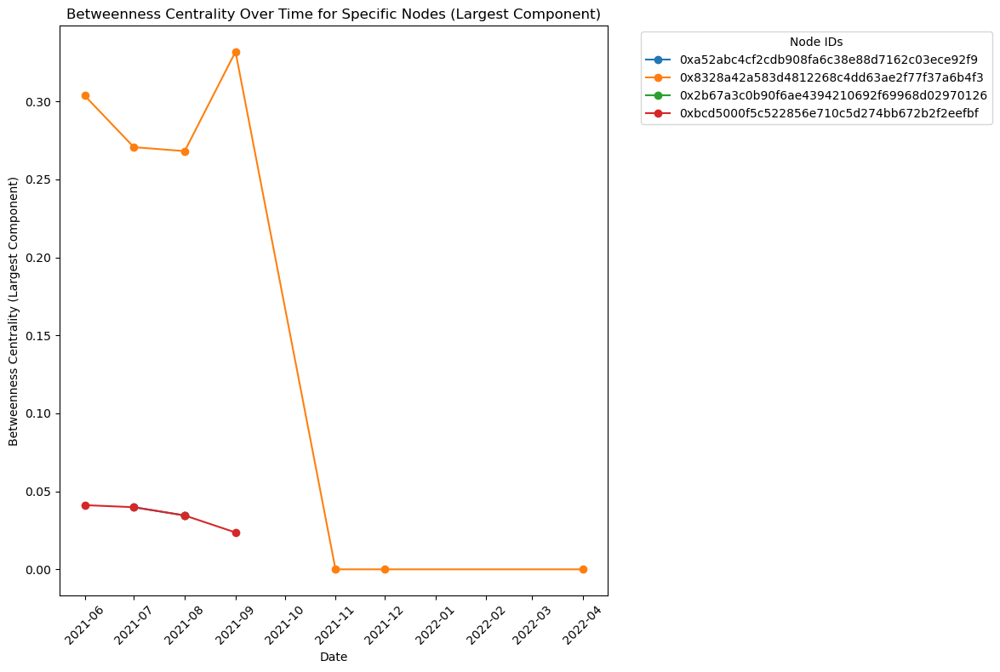

In [829]:
import pandas as pd
import networkx as nx
from os.path import join
from collections import defaultdict
import matplotlib.pyplot as plt

# Define the specific nodes to track
specific_nodes = {
    '0x8328a42a583d4812268c4dd63ae2f77f37a6b4f3',
    '0xa52abc4cf2cdb908fa6c38e88d7162c03ece92f9',
    '0xbcd5000f5c522856e710c5d274bb672b2f2eefbf',
    '0x2b67a3c0b90f6ae4394210692f69968d02970126',
}

def load_and_apply_saved_communities(graph, community_file, snapshot_id):
    """Load and apply the saved community assignments to the graph nodes."""
    community_df = pd.read_csv(community_file)
    community_df['Snapshot'] = community_df['Snapshot'].astype(str).str.strip()
    snapshot_id = str(snapshot_id).strip()

    snapshot_communities = community_df[community_df['Snapshot'] == snapshot_id]
    if snapshot_communities.empty:
        print(f"No data found for Snapshot ID: {snapshot_id}")
        return

    community_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Community']))
    token_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Token']))
    
    for node in graph.nodes():
        graph.nodes[node]['community'] = community_map.get(node, 'Unknown')
        graph.nodes[node]['token'] = token_map.get(node, 'Unknown Token')

def calculate_betweenness_centrality_largest_component(graph):
    """Calculate the betweenness centrality for each node in the largest component of the graph."""
    largest_component = max(nx.connected_components(graph), key=len)
    subgraph = graph.subgraph(largest_component)
    betweenness_centrality = nx.betweenness_centrality(subgraph)
    return betweenness_centrality

def track_betweenness_centrality_over_time(graph_directory, community_file, snapshot_dates):
    """Track the betweenness centrality for specific nodes across all snapshots for the largest component."""
    centrality_over_time = defaultdict(lambda: defaultdict(float))

    for snapshot_id, snapshot_date in snapshot_dates.items():
        graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        G = nx.read_graphml(graph_file)

        load_and_apply_saved_communities(G, community_file, snapshot_id)

        betweenness_centrality = calculate_betweenness_centrality_largest_component(G)

        for node, centrality in betweenness_centrality.items():
            if node in specific_nodes:
                centrality_over_time[node][pd.to_datetime(snapshot_date)] = centrality

    return centrality_over_time

def plot_specific_betweenness_centrality_over_time(centrality_over_time):
    """Plot the betweenness centrality over time for the specific nodes provided."""
    plt.figure(figsize=(12, 8))
    
    # Plot the betweenness centrality over time for each specific node
    for node in specific_nodes:
        if node in centrality_over_time:
            dates = sorted(centrality_over_time[node].keys())
            centralities = [centrality_over_time[node][date] for date in dates]
            plt.plot(dates, centralities, marker='o', label=node)
    
    plt.xlabel("Date")
    plt.ylabel("Betweenness Centrality (Largest Component)")
    plt.title("Betweenness Centrality Over Time for Specific Nodes (Largest Component)")
    plt.xticks(rotation=45)
    plt.legend(title="Node IDs", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

# Paths and snapshot dates
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Track betweenness centrality over the entire period for specific nodes
centrality_over_time = track_betweenness_centrality_over_time(graph_directory, community_file, snapshot_dates)

# Plot the betweenness centrality over time for the specific nodes
plot_specific_betweenness_centrality_over_time(centrality_over_time)



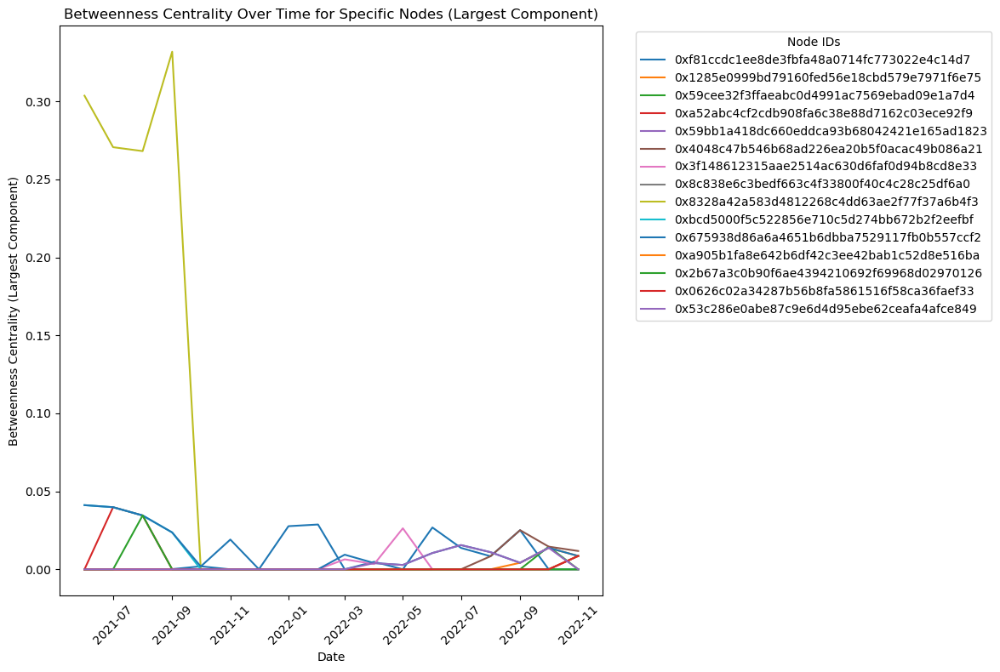

In [806]:
import pandas as pd
import networkx as nx
from os.path import join
from collections import defaultdict
import matplotlib.pyplot as plt

# Define the specific nodes to track
specific_nodes = {
    '0x8328a42a583d4812268c4dd63ae2f77f37a6b4f3',
    '0xa52abc4cf2cdb908fa6c38e88d7162c03ece92f9',
    '0xbcd5000f5c522856e710c5d274bb672b2f2eefbf',
    '0x2b67a3c0b90f6ae4394210692f69968d02970126',
    '0x4048c47b546b68ad226ea20b5f0acac49b086a21',
    '0x59cee32f3ffaeabc0d4991ac7569ebad09e1a7d4',
    '0x675938d86a6a4651b6dbba7529117fb0b557ccf2',
    '0x3f148612315aae2514ac630d6faf0d94b8cd8e33',
    '0xf81ccdc1ee8de3fbfa48a0714fc773022e4c14d7',
    '0x1285e0999bd79160fed56e18cbd579e7971f6e75',
    '0x53c286e0abe87c9e6d4d95ebe62ceafa4afce849',
    '0x59bb1a418dc660eddca93b68042421e165ad1823',
    '0x0626c02a34287b56b8fa5861516f58ca36faef33',
    '0x8c838e6c3bedf663c4f33800f40c4c28c25df6a0',
    '0xa905b1fa8e642b6df42c3ee42bab1c52d8e516ba'
}

def load_and_apply_saved_communities(graph, community_file, snapshot_id):
    """Load and apply the saved community assignments to the graph nodes."""
    community_df = pd.read_csv(community_file)
    community_df['Snapshot'] = community_df['Snapshot'].astype(str).str.strip()
    snapshot_id = str(snapshot_id).strip()

    snapshot_communities = community_df[community_df['Snapshot'] == snapshot_id]
    if snapshot_communities.empty:
        print(f"No data found for Snapshot ID: {snapshot_id}")
        return

    community_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Community']))
    token_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Token']))
    
    for node in graph.nodes():
        graph.nodes[node]['community'] = community_map.get(node, 'Unknown')
        graph.nodes[node]['token'] = token_map.get(node, 'Unknown Token')

def calculate_betweenness_centrality_largest_component(graph):
    """Calculate the betweenness centrality for each node in the largest component of the graph."""
    largest_component = max(nx.connected_components(graph), key=len)
    subgraph = graph.subgraph(largest_component)
    betweenness_centrality = nx.betweenness_centrality(subgraph)
    return betweenness_centrality

def track_betweenness_centrality_over_time(graph_directory, community_file, snapshot_dates):
    """Track the betweenness centrality for specific nodes across all snapshots for the largest component."""
    centrality_over_time = defaultdict(lambda: defaultdict(float))

    for snapshot_id, snapshot_date in snapshot_dates.items():
        graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        G = nx.read_graphml(graph_file)

        load_and_apply_saved_communities(G, community_file, snapshot_id)

        betweenness_centrality = calculate_betweenness_centrality_largest_component(G)

        for node in specific_nodes:
            centrality_over_time[node][pd.to_datetime(snapshot_date)] = betweenness_centrality.get(node, 0.0)

    return centrality_over_time

def plot_specific_betweenness_centrality_over_time(centrality_over_time):
    """Plot the betweenness centrality over time for the specific nodes provided."""
    plt.figure(figsize=(12, 8))
    
    # Plot the betweenness centrality over time for each specific node
    for node in specific_nodes:
        if node in centrality_over_time:
            dates = sorted(centrality_over_time[node].keys())
            centralities = [centrality_over_time[node][date] for date in dates]
            plt.plot(dates, centralities, label=node)  # Removed the 'marker' argument
    
    plt.xlabel("Date")
    plt.ylabel("Betweenness Centrality (Largest Component)")
    plt.title("Betweenness Centrality Over Time for Specific Nodes (Largest Component)")
    plt.xticks(rotation=45)
    plt.legend(title="Node IDs", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

# Paths and snapshot dates
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Track betweenness centrality over the entire period for specific nodes
centrality_over_time = track_betweenness_centrality_over_time(graph_directory, community_file, snapshot_dates)

# Plot the betweenness centrality over time for the specific nodes
plot_specific_betweenness_centrality_over_time(centrality_over_time)

# FILTERING

In [808]:
import pandas as pd

# Load the CSV file
file_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/Top betweeness/Largest component/top_average_betweenness_nodes_largest_component_labelled.csv'
df = pd.read_csv(file_path)

# Print all the wallet addresses (Nodes) that have 'Unknown Wallet' in the 'Name' column
unknown_wallet_addresses = df[df['Name'] == 'Unknown Wallet']['Node'].tolist()

print("Wallet addresses with 'Unknown Wallet' in the Name column:")
for address in unknown_wallet_addresses:
    print(address)


Wallet addresses with 'Unknown Wallet' in the Name column:
0x8328a42a583d4812268c4dd63ae2f77f37a6b4f3
0xa52abc4cf2cdb908fa6c38e88d7162c03ece92f9
0xbcd5000f5c522856e710c5d274bb672b2f2eefbf
0x2b67a3c0b90f6ae4394210692f69968d02970126
0x4048c47b546b68ad226ea20b5f0acac49b086a21
0x59cee32f3ffaeabc0d4991ac7569ebad09e1a7d4
0x675938d86a6a4651b6dbba7529117fb0b557ccf2
0x3f148612315aae2514ac630d6faf0d94b8cd8e33
0xf81ccdc1ee8de3fbfa48a0714fc773022e4c14d7
0x1285e0999bd79160fed56e18cbd579e7971f6e75
0x53c286e0abe87c9e6d4d95ebe62ceafa4afce849
0x59bb1a418dc660eddca93b68042421e165ad1823
0x0626c02a34287b56b8fa5861516f58ca36faef33
0x8c838e6c3bedf663c4f33800f40c4c28c25df6a0
0xa905b1fa8e642b6df42c3ee42bab1c52d8e516ba


Largest component size: 88
Sample centrality values: [('0x41527cc7cc6e63d9d0753d6fdbd4ac16096a029d', 0.0), ('0xd6868b23905009d859cc232f7c008c13bc527702', 0.0), ('0x2775b1c75658be0f640272ccb8c72ac986009e38', 0.0), ('0xc22fbdc5dc1fd8a43b0e1e655202014c00342eb7', 0.0), ('0xd0ed69e40a5b044d59411cf6ddc653c8c3924d10', 0.0)]
Centrality for snapshot 11659570:
  Node: 0xf81ccdc1ee8de3fbfa48a0714fc773022e4c14d7, Centrality: 0.0
  Node: 0x1285e0999bd79160fed56e18cbd579e7971f6e75, Centrality: 0.0
  Node: 0x59cee32f3ffaeabc0d4991ac7569ebad09e1a7d4, Centrality: 0.0
  Node: 0xa52abc4cf2cdb908fa6c38e88d7162c03ece92f9, Centrality: 0.0
  Node: 0x59bb1a418dc660eddca93b68042421e165ad1823, Centrality: 0.0
  Node: 0x4048c47b546b68ad226ea20b5f0acac49b086a21, Centrality: 0.0
  Node: 0x3f148612315aae2514ac630d6faf0d94b8cd8e33, Centrality: 0.0
  Node: 0x8c838e6c3bedf663c4f33800f40c4c28c25df6a0, Centrality: 0.0
  Node: 0x8328a42a583d4812268c4dd63ae2f77f37a6b4f3, Centrality: 0.3036621224271585
  Node: 0xbcd5000f5c

Largest component size: 63
Sample centrality values: [('0xe2bb28ebec7592fb516f4680a4ea38f5f439044c', 0.0), ('0x26a78d5b6d7a7aceedd1e6ee3229b372a624d8b7', 0.028735530877254844), ('0x3ff33d9162ad47660083d7dc4bc02fb231c81677', 3.5254715318173806e-05), ('0x5e89f8d81c74e311458277ea1be3d3247c7cd7d1', 0.0), ('0x0548f59fee79f8832c299e01dca5c76f034f558e', 3.5254715318173806e-05)]
Centrality for snapshot 13230157:
  Node: 0xf81ccdc1ee8de3fbfa48a0714fc773022e4c14d7, Centrality: 0.028735530877254844
  Node: 0x1285e0999bd79160fed56e18cbd579e7971f6e75, Centrality: 0.0
  Node: 0x59cee32f3ffaeabc0d4991ac7569ebad09e1a7d4, Centrality: 0.0
  Node: 0xa52abc4cf2cdb908fa6c38e88d7162c03ece92f9, Centrality: 0.0
  Node: 0x59bb1a418dc660eddca93b68042421e165ad1823, Centrality: 0.0
  Node: 0x4048c47b546b68ad226ea20b5f0acac49b086a21, Centrality: 0.0
  Node: 0x3f148612315aae2514ac630d6faf0d94b8cd8e33, Centrality: 0.0
  Node: 0x8c838e6c3bedf663c4f33800f40c4c28c25df6a0, Centrality: 0.0
  Node: 0x8328a42a583d4812268c4

Largest component size: 142
Sample centrality values: [('0x10a19e7ee7d7f8a52822f6817de8ea18204f2e4f', 0.008671808084010671), ('0x6d19b2bf3a36a61530909ae65445a906d98a2fa8', 0.008671808084010671), ('0x2f5e5a67d55fd117b83049d05a48f6f678432100', 0.0), ('0x603d6b6962b9a57a332c219cb3b05e5caddf3ec8', 0.0), ('0x583f6878eccbcf41d5126938647dc74fcce34e31', 0.0)]
Centrality for snapshot 14391029:
  Node: 0xf81ccdc1ee8de3fbfa48a0714fc773022e4c14d7, Centrality: 0.008387164450994248
  Node: 0x1285e0999bd79160fed56e18cbd579e7971f6e75, Centrality: 0.0
  Node: 0x59cee32f3ffaeabc0d4991ac7569ebad09e1a7d4, Centrality: 0.0
  Node: 0xa52abc4cf2cdb908fa6c38e88d7162c03ece92f9, Centrality: 0.0
  Node: 0x59bb1a418dc660eddca93b68042421e165ad1823, Centrality: 0.0
  Node: 0x4048c47b546b68ad226ea20b5f0acac49b086a21, Centrality: 0.008387164450994248
  Node: 0x3f148612315aae2514ac630d6faf0d94b8cd8e33, Centrality: 0.0
  Node: 0x8c838e6c3bedf663c4f33800f40c4c28c25df6a0, Centrality: 0.0
  Node: 0x8328a42a583d4812268c4dd6

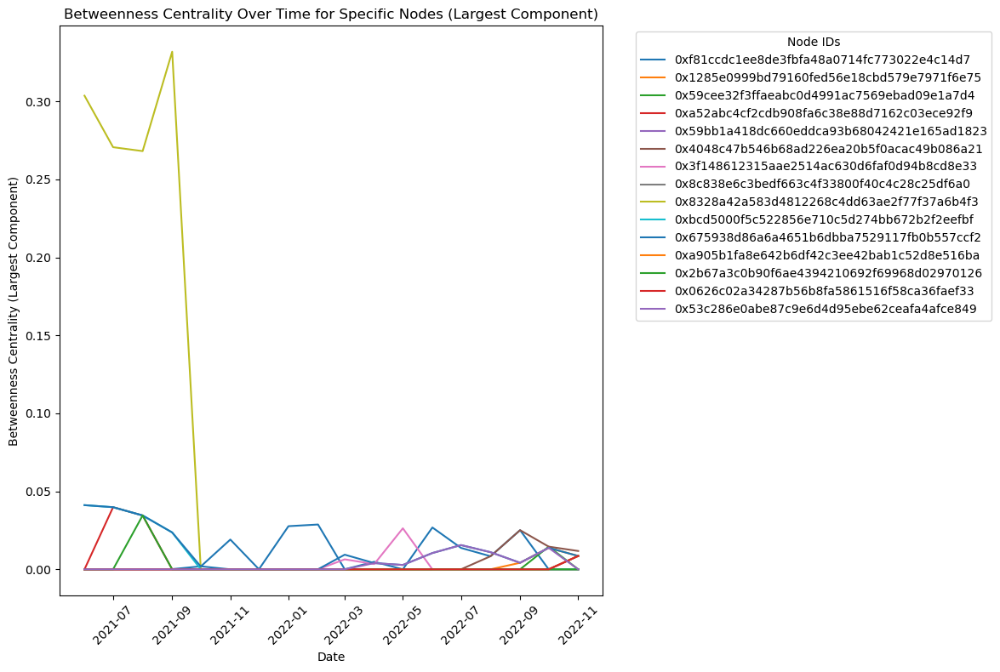

In [809]:
import pandas as pd
import networkx as nx
from os.path import join
from collections import defaultdict
import matplotlib.pyplot as plt

# Define the specific nodes to track
specific_nodes = {
    '0x8328a42a583d4812268c4dd63ae2f77f37a6b4f3',
    '0xa52abc4cf2cdb908fa6c38e88d7162c03ece92f9',
    '0xbcd5000f5c522856e710c5d274bb672b2f2eefbf',
    '0x2b67a3c0b90f6ae4394210692f69968d02970126',
    '0x4048c47b546b68ad226ea20b5f0acac49b086a21',
    '0x59cee32f3ffaeabc0d4991ac7569ebad09e1a7d4',
    '0x675938d86a6a4651b6dbba7529117fb0b557ccf2',
    '0x3f148612315aae2514ac630d6faf0d94b8cd8e33',
    '0xf81ccdc1ee8de3fbfa48a0714fc773022e4c14d7',
    '0x1285e0999bd79160fed56e18cbd579e7971f6e75',
    '0x53c286e0abe87c9e6d4d95ebe62ceafa4afce849',
    '0x59bb1a418dc660eddca93b68042421e165ad1823',
    '0x0626c02a34287b56b8fa5861516f58ca36faef33',
    '0x8c838e6c3bedf663c4f33800f40c4c28c25df6a0',
    '0xa905b1fa8e642b6df42c3ee42bab1c52d8e516ba'
}

def load_and_apply_saved_communities(graph, community_file, snapshot_id):
    """Load and apply the saved community assignments to the graph nodes."""
    community_df = pd.read_csv(community_file)
    community_df['Snapshot'] = community_df['Snapshot'].astype(str).str.strip()
    snapshot_id = str(snapshot_id).strip()

    snapshot_communities = community_df[community_df['Snapshot'] == snapshot_id]
    if snapshot_communities.empty:
        print(f"No data found for Snapshot ID: {snapshot_id}")
        return

    community_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Community']))
    token_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Token']))
    
    for node in graph.nodes():
        graph.nodes[node]['community'] = community_map.get(node, 'Unknown')
        graph.nodes[node]['token'] = token_map.get(node, 'Unknown Token')

def calculate_betweenness_centrality_largest_component(graph):
    """Calculate the betweenness centrality for each node in the largest component of the graph."""
    largest_component = max(nx.connected_components(graph), key=len)
    subgraph = graph.subgraph(largest_component)
    betweenness_centrality = nx.betweenness_centrality(subgraph)
    
    # Debug: Check the size of the largest component and some sample centrality values
    print(f"Largest component size: {len(largest_component)}")
    print(f"Sample centrality values: {list(betweenness_centrality.items())[:5]}")
    
    return betweenness_centrality

def track_betweenness_centrality_over_time(graph_directory, community_file, snapshot_dates):
    """Track the betweenness centrality for specific nodes across all snapshots for the largest component."""
    centrality_over_time = defaultdict(lambda: defaultdict(float))

    for snapshot_id, snapshot_date in snapshot_dates.items():
        graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        G = nx.read_graphml(graph_file)

        load_and_apply_saved_communities(G, community_file, snapshot_id)

        betweenness_centrality = calculate_betweenness_centrality_largest_component(G)

        for node in specific_nodes:
            centrality_over_time[node][pd.to_datetime(snapshot_date)] = betweenness_centrality.get(node, 0.0)

        # Debug: Check centrality values for specific nodes
        print(f"Centrality for snapshot {snapshot_id}:")
        for node in specific_nodes:
            print(f"  Node: {node}, Centrality: {centrality_over_time[node][pd.to_datetime(snapshot_date)]}")

    return centrality_over_time

def plot_specific_betweenness_centrality_over_time(centrality_over_time):
    """Plot the betweenness centrality over time for the specific nodes provided."""
    plt.figure(figsize=(12, 8))
    
    # Plot the betweenness centrality over time for each specific node
    for node in specific_nodes:
        if node in centrality_over_time:
            dates = sorted(centrality_over_time[node].keys())
            centralities = [centrality_over_time[node][date] for date in dates]
            plt.plot(dates, centralities, label=node)  # Removed the 'marker' argument
    
    plt.xlabel("Date")
    plt.ylabel("Betweenness Centrality (Largest Component)")
    plt.title("Betweenness Centrality Over Time for Specific Nodes (Largest Component)")
    plt.xticks(rotation=45)
    plt.legend(title="Node IDs", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

# Paths and snapshot dates
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Track betweenness centrality over the entire period for specific nodes
centrality_over_time = track_betweenness_centrality_over_time(graph_directory, community_file, snapshot_dates)

# Plot the betweenness centrality over time for the specific nodes
plot_specific_betweenness_centrality_over_time(centrality_over_time)

# Weighted average approach

In [830]:
import pandas as pd
import networkx as nx
from os.path import join
from collections import defaultdict

def load_and_apply_saved_communities(graph, community_file, snapshot_id):
    """Load and apply the saved community assignments to the graph nodes."""
    community_df = pd.read_csv(community_file)
    community_df['Snapshot'] = community_df['Snapshot'].astype(str).str.strip()
    snapshot_id = str(snapshot_id).strip()

    snapshot_communities = community_df[community_df['Snapshot'] == snapshot_id]
    if snapshot_communities.empty:
        print(f"No data found for Snapshot ID: {snapshot_id}")
        return

    community_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Community']))
    token_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Token']))
    
    for node in graph.nodes():
        graph.nodes[node]['community'] = community_map.get(node, 'Unknown')
        graph.nodes[node]['token'] = token_map.get(node, 'Unknown Token')

def calculate_betweenness_centrality_largest_component(graph):
    """Calculate the betweenness centrality for each node in the largest component of the graph."""
    largest_component = max(nx.connected_components(graph), key=len)
    subgraph = graph.subgraph(largest_component)
    betweenness_centrality = nx.betweenness_centrality(subgraph)
    return betweenness_centrality

def weighted_average_betweenness_centrality_across_snapshots(graph_directory, community_file, snapshot_dates):
    """Calculate the weighted average betweenness centrality for each node across all snapshots for the largest component."""
    centrality_sums = defaultdict(float)
    presence_weight = defaultdict(int)
    node_community = {}
    node_token = {}

    for snapshot_id, snapshot_date in snapshot_dates.items():
        graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        G = nx.read_graphml(graph_file)

        load_and_apply_saved_communities(G, community_file, snapshot_id)

        betweenness_centrality = calculate_betweenness_centrality_largest_component(G)

        for node, centrality in betweenness_centrality.items():
            centrality_sums[node] += centrality * presence_weight[node]
            presence_weight[node] += 1
            node_community[node] = G.nodes[node].get('community', 'Unknown')
            node_token[node] = G.nodes[node].get('token', 'Unknown Token')

    # Calculate weighted average centrality for each node
    weighted_average_centrality = {
        node: centrality_sums[node] / presence_weight[node] if presence_weight[node] > 0 else 0
        for node in centrality_sums
    }

    return weighted_average_centrality, node_community, node_token

def find_top_average_betweenness_nodes(average_centrality, node_community, node_token, top_n=50):
    """Find the top N nodes with the highest average betweenness centrality."""
    sorted_nodes = sorted(average_centrality.items(), key=lambda x: x[1], reverse=True)[:top_n]
    top_nodes = [
        {
            'Node': node,
            'Average Betweenness Centrality': centrality,
            'Community': node_community[node],
            'Token': node_token[node]
        }
        for node, centrality in sorted_nodes
    ]
    return top_nodes

# Paths and snapshot information
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Step 1: Calculate weighted average betweenness centrality across all snapshots
weighted_average_centrality, node_community, node_token = weighted_average_betweenness_centrality_across_snapshots(graph_directory, community_file, snapshot_dates)

# Step 2: Find and display the top nodes with the highest weighted average betweenness centrality
top_average_nodes = find_top_average_betweenness_nodes(weighted_average_centrality, node_community, node_token, top_n=50)

# Convert the results to a DataFrame for better visualization and export
df_top_average_nodes = pd.DataFrame(top_average_nodes)

# Display the results
print(df_top_average_nodes)

# Optionally, save the results to a CSV file
#output_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/top_50_weighted_average_betweenness_nodes_largest_component.csv'
#df_top_average_nodes.to_csv(output_file, index=False)


                                          Node  \
0   0xf977814e90da44bfa03b6295a0616a897441acec   
1   0x40ec5b33f54e0e8a33a975908c5ba1c14e5bbbdf   
2   0x28c6c06298d514db089934071355e5743bf21d60   
3   0x2faf487a4414fe77e2327f0bf4ae2a264a776ad2   
4   0xbe0eb53f46cd790cd13851d5eff43d12404d33e8   
5   0xe93381fb4c4f14bda253907b18fad305d799241a   
6   0x47ac0fb4f2d84898e4d9e7b4dab3c24507a6d503   
7   0x8328a42a583d4812268c4dd63ae2f77f37a6b4f3   
8   0x3dfd23a6c5e8bbcfc9581d2e864a68feb6a076d3   
9   0x25f2226b597e8f9514b3f68f00f494cf4f286491   
10  0x317625234562b1526ea2fac4030ea499c5291de4   
11  0x4da27a545c0c5b758a6ba100e3a049001de870f5   
12  0xffc97d72e13e01096502cb8eb52dee56f74dad7b   
13  0xc697051d1c6296c24ae3bcef39aca743861d9a81   
14  0x26a78d5b6d7a7aceedd1e6ee3229b372a624d8b7   
15  0xf81ccdc1ee8de3fbfa48a0714fc773022e4c14d7   
16  0x675938d86a6a4651b6dbba7529117fb0b557ccf2   
17  0x5165d24277cd063f5ac44efd447b27025e888f37   
18  0xba37b002abafdd8e89a1995da52740bbc013d992   


# Betweeness centrality entire graph

In [320]:
import pandas as pd
import networkx as nx
from os.path import join
from collections import defaultdict

def load_and_apply_saved_communities(graph, community_file, snapshot_id):
    """Load and apply the saved community assignments to the graph nodes."""
    community_df = pd.read_csv(community_file)
    community_df['Snapshot'] = community_df['Snapshot'].astype(str).str.strip()
    snapshot_id = str(snapshot_id).strip()

    snapshot_communities = community_df[community_df['Snapshot'] == snapshot_id]
    if snapshot_communities.empty:
        print(f"No data found for Snapshot ID: {snapshot_id}")
        return

    community_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Community']))
    token_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Token']))
    
    for node in graph.nodes():
        graph.nodes[node]['community'] = community_map.get(node, 'Unknown')
        graph.nodes[node]['token'] = token_map.get(node, 'Unknown Token')

def calculate_betweenness_centrality(graph):
    """Calculate the betweenness centrality for each node in the entire graph."""
    betweenness_centrality = nx.betweenness_centrality(graph)
    return betweenness_centrality

def average_betweenness_centrality_across_snapshots(graph_directory, community_file, snapshot_dates):
    """Calculate the average betweenness centrality for each node across all snapshots for the entire graph."""
    centrality_sums = defaultdict(float)
    node_occurrences = defaultdict(int)
    node_community = {}
    node_token = {}

    for snapshot_id, snapshot_date in snapshot_dates.items():
        graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        G = nx.read_graphml(graph_file)

        load_and_apply_saved_communities(G, community_file, snapshot_id)

        betweenness_centrality = calculate_betweenness_centrality(G)

        for node, centrality in betweenness_centrality.items():
            centrality_sums[node] += centrality
            node_occurrences[node] += 1
            node_community[node] = G.nodes[node].get('community', 'Unknown')
            node_token[node] = G.nodes[node].get('token', 'Unknown Token')

    # Calculate average centrality for each node
    average_centrality = {node: centrality_sums[node] / node_occurrences[node] for node in centrality_sums}

    return average_centrality, node_community, node_token

def find_top_average_betweenness_nodes(average_centrality, node_community, node_token, top_n=50):
    """Find the top N nodes with the highest average betweenness centrality."""
    sorted_nodes = sorted(average_centrality.items(), key=lambda x: x[1], reverse=True)[:top_n]
    top_nodes = [
        {
            'Node': node,
            'Average Betweenness Centrality': centrality,
            'Community': node_community[node],
            'Token': node_token[node]
        }
        for node, centrality in sorted_nodes
    ]
    return top_nodes

# Paths and snapshot information
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Step 1: Calculate average betweenness centrality across all snapshots
average_centrality, node_community, node_token = average_betweenness_centrality_across_snapshots(graph_directory, community_file, snapshot_dates)

# Step 2: Find and display the top nodes with the highest average betweenness centrality
top_average_nodes = find_top_average_betweenness_nodes(average_centrality, node_community, node_token, top_n=50)

# Convert the results to a DataFrame for better visualization and export
df_top_average_nodes = pd.DataFrame(top_average_nodes)

# Display the results
print(df_top_average_nodes)

# Optionally, save the results to a CSV file
#output_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/top_average_betweenness_nodes_all_graphs.csv'
#df_top_average_nodes.to_csv(output_file, index=False)


                                          Node  \
0   0xf977814e90da44bfa03b6295a0616a897441acec   
1   0x28c6c06298d514db089934071355e5743bf21d60   
2   0xbe0eb53f46cd790cd13851d5eff43d12404d33e8   
3   0x40ec5b33f54e0e8a33a975908c5ba1c14e5bbbdf   
4   0x2faf487a4414fe77e2327f0bf4ae2a264a776ad2   
5   0x8328a42a583d4812268c4dd63ae2f77f37a6b4f3   
6   0xe93381fb4c4f14bda253907b18fad305d799241a   
7   0x3dfd23a6c5e8bbcfc9581d2e864a68feb6a076d3   
8   0x3f5ce5fbfe3e9af3971dd833d26ba9b5c936f0be   
9   0x2fdbadf3c4d5a8666bc06645b8358ab803996e28   
10  0xa52abc4cf2cdb908fa6c38e88d7162c03ece92f9   
11  0x9c4ea0bf80c4768314c4f631ac84e274b32385fe   
12  0x2b67a3c0b90f6ae4394210692f69968d02970126   
13  0xbcd5000f5c522856e710c5d274bb672b2f2eefbf   
14  0x47ac0fb4f2d84898e4d9e7b4dab3c24507a6d503   
15  0x59cee32f3ffaeabc0d4991ac7569ebad09e1a7d4   
16  0x3744da57184575064838bbc87a0fc791f5e39ea2   
17  0x4048c47b546b68ad226ea20b5f0acac49b086a21   
18  0x5f65f7b609678448494de4c87521cdf6cef1e932   


# Code to investigate if wallet or smart contract

In [838]:
from web3 import Web3

# Connect to an Ethereum node (e.g., Infura, Cloudflare, local node)
web3 = Web3(Web3.HTTPProvider('https://cloudflare-eth.com'))

# The Ethereum address you want to check (without checksum)
address = "0xe174c389249b0e3a4ec84d2a5667aa4920cb77de"  # Example address

# Convert the address to checksum format
checksum_address = web3.to_checksum_address(address)

# Fetch the bytecode of the address
code = web3.eth.get_code(checksum_address)

# Check if the code is empty or not
if code == b'0x' or code == b'':
    print(f"{checksum_address} is an Externally Owned Account (EOA), a wallet.")
else:
    print(f"{checksum_address} is a Smart Contract. Bytecode: {code.hex()}")



0xfF052381092420B7F24cc97FDEd9C0c17b2cbbB9 is an Externally Owned Account (EOA), a wallet.


In [358]:
# ALL GRAPH

In [362]:
import os

# Specify the directory
directory_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/Top betweeness/All graph'

# List all files in the directory
files_in_directory = os.listdir(directory_path)
print("Files in directory:", files_in_directory)


Files in directory: ['top_average_betweenness_nodes_all_graphs.csv']


In [363]:
import pandas as pd

# Load the CSV file
file_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/Top betweeness/All graph/top_average_betweenness_nodes_all_graphs.csv'
df = pd.read_csv(file_path)

# Print all the wallet addresses (Nodes) that have 'Unknown Wallet' in the 'Name' column
unknown_wallet_addresses = df[df['Name'] == 'Unknown Wallet']['Node'].tolist()

print("Wallet addresses with 'Unknown Wallet' in the Name column:")
for address in unknown_wallet_addresses:
    print(address)

Wallet addresses with 'Unknown Wallet' in the Name column:
0x8328a42a583d4812268c4dd63ae2f77f37a6b4f3
0xa52abc4cf2cdb908fa6c38e88d7162c03ece92f9
0x2b67a3c0b90f6ae4394210692f69968d02970126
0xbcd5000f5c522856e710c5d274bb672b2f2eefbf
0x59cee32f3ffaeabc0d4991ac7569ebad09e1a7d4
0x4048c47b546b68ad226ea20b5f0acac49b086a21
0x675938d86a6a4651b6dbba7529117fb0b557ccf2
0x1285e0999bd79160fed56e18cbd579e7971f6e75
0x59bb1a418dc660eddca93b68042421e165ad1823
0x0626c02a34287b56b8fa5861516f58ca36faef33
0x8c838e6c3bedf663c4f33800f40c4c28c25df6a0
0xa905b1fa8e642b6df42c3ee42bab1c52d8e516ba
0x1a9cc7b58ebfd75140a756f0179c176dc51cbeee
0xca04e015002685dc035400c43e590b4310a3b87a
0x97168a8a92873a4752e98f92aad38c7d511e82b3
0x90656ca43bcda4bec5d0307814a1c12d4d3da48e
0x5aa4453646698a06b280d3761a9e2e251601d9ca
0x2b1d9b96c74e74f413c70ec135b7024ce0f36bf8
0x6df548895ad246a724f8a06d81d3844b9a0ca566
0xc5bce559c1d56b38aa36774f475e878228a54c2a
0x1f590cd96611f124d8927e2d0c6472253371aee9
0x695f1e435322a1ba064323f1acd719da2ab0

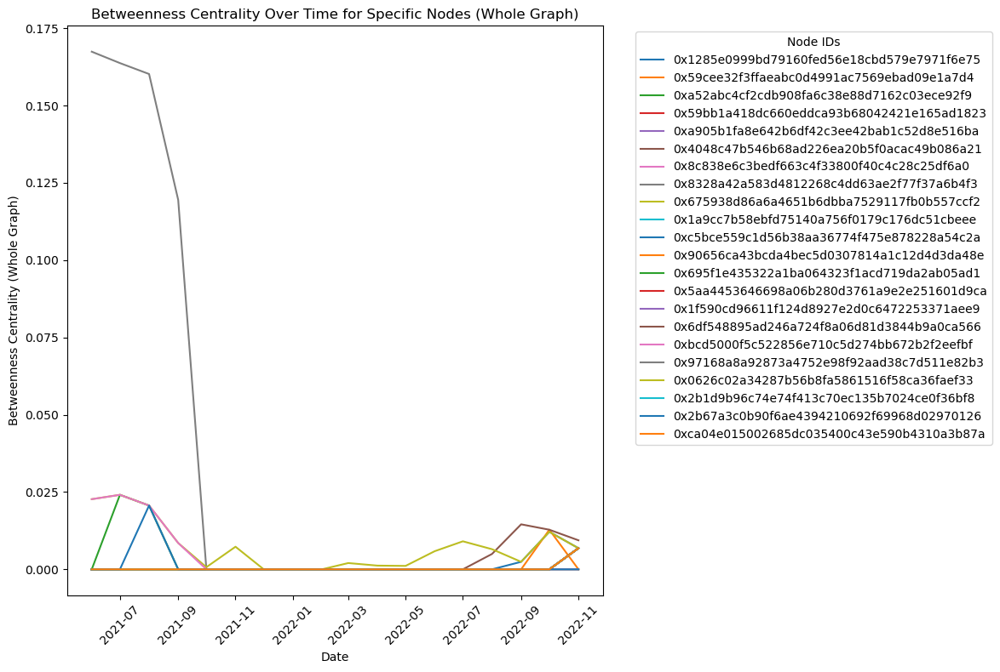

In [804]:
import pandas as pd
import networkx as nx
from os.path import join
from collections import defaultdict
import matplotlib.pyplot as plt

# Define the specific nodes to track (updated list)
specific_nodes = {
    '0x8328a42a583d4812268c4dd63ae2f77f37a6b4f3',
    '0xa52abc4cf2cdb908fa6c38e88d7162c03ece92f9',
    '0x2b67a3c0b90f6ae4394210692f69968d02970126',
    '0xbcd5000f5c522856e710c5d274bb672b2f2eefbf',
    '0x59cee32f3ffaeabc0d4991ac7569ebad09e1a7d4',
    '0x4048c47b546b68ad226ea20b5f0acac49b086a21',
    '0x675938d86a6a4651b6dbba7529117fb0b557ccf2',
    '0x1285e0999bd79160fed56e18cbd579e7971f6e75',
    '0x59bb1a418dc660eddca93b68042421e165ad1823',
    '0x0626c02a34287b56b8fa5861516f58ca36faef33',
    '0x8c838e6c3bedf663c4f33800f40c4c28c25df6a0',
    '0xa905b1fa8e642b6df42c3ee42bab1c52d8e516ba',
    '0x1a9cc7b58ebfd75140a756f0179c176dc51cbeee',
    '0xca04e015002685dc035400c43e590b4310a3b87a',
    '0x97168a8a92873a4752e98f92aad38c7d511e82b3',
    '0x90656ca43bcda4bec5d0307814a1c12d4d3da48e',
    '0x5aa4453646698a06b280d3761a9e2e251601d9ca',
    '0x2b1d9b96c74e74f413c70ec135b7024ce0f36bf8',
    '0x6df548895ad246a724f8a06d81d3844b9a0ca566',
    '0xc5bce559c1d56b38aa36774f475e878228a54c2a',
    '0x1f590cd96611f124d8927e2d0c6472253371aee9',
    '0x695f1e435322a1ba064323f1acd719da2ab05ad1'
}

def load_and_apply_saved_communities(graph, community_file, snapshot_id):
    """Load and apply the saved community assignments to the graph nodes."""
    community_df = pd.read_csv(community_file)
    community_df['Snapshot'] = community_df['Snapshot'].astype(str).str.strip()
    snapshot_id = str(snapshot_id).strip()

    snapshot_communities = community_df[community_df['Snapshot'] == snapshot_id]
    if snapshot_communities.empty:
        print(f"No data found for Snapshot ID: {snapshot_id}")
        return

    community_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Community']))
    token_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Token']))
    
    for node in graph.nodes():
        graph.nodes[node]['community'] = community_map.get(node, 'Unknown')
        graph.nodes[node]['token'] = token_map.get(node, 'Unknown Token')

def calculate_betweenness_centrality_whole_graph(graph):
    """Calculate the betweenness centrality for each node in the entire graph."""
    betweenness_centrality = nx.betweenness_centrality(graph)
    return betweenness_centrality

def track_betweenness_centrality_over_time(graph_directory, community_file, snapshot_dates):
    """Track the betweenness centrality for specific nodes across all snapshots for the entire graph."""
    centrality_over_time = defaultdict(lambda: defaultdict(float))

    for snapshot_id, snapshot_date in snapshot_dates.items():
        graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        G = nx.read_graphml(graph_file)

        load_and_apply_saved_communities(G, community_file, snapshot_id)

        betweenness_centrality = calculate_betweenness_centrality_whole_graph(G)

        for node in specific_nodes:
            centrality_over_time[node][pd.to_datetime(snapshot_date)] = betweenness_centrality.get(node, 0.0)

    return centrality_over_time

def plot_specific_betweenness_centrality_over_time(centrality_over_time):
    """Plot the betweenness centrality over time for the specific nodes provided."""
    plt.figure(figsize=(12, 8))
    
    # Plot the betweenness centrality over time for each specific node
    for node in specific_nodes:
        if node in centrality_over_time:
            dates = sorted(centrality_over_time[node].keys())
            centralities = [centrality_over_time[node][date] for date in dates]
            plt.plot(dates, centralities, label=node)
    
    plt.xlabel("Date")
    plt.ylabel("Betweenness Centrality (Whole Graph)")
    plt.title("Betweenness Centrality Over Time for Specific Nodes (Whole Graph)")
    plt.xticks(rotation=45)
    plt.legend(title="Node IDs", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

# Paths and snapshot dates
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Track betweenness centrality over the entire period for specific nodes
centrality_over_time = track_betweenness_centrality_over_time(graph_directory, community_file, snapshot_dates)

# Plot the betweenness centrality over time for the specific nodes
plot_specific_betweenness_centrality_over_time(centrality_over_time)


In [369]:
def plot_specific_betweenness_centrality_over_time(centrality_over_time):
    """Plot the betweenness centrality over time for the specific nodes provided."""
    plt.figure(figsize=(12, 8))
    
    # Get all unique dates from all nodes
    all_dates = sorted(set(date for node_data in centrality_over_time.values() for date in node_data.keys()))

    # Plot the betweenness centrality over time for each specific node
    for node in specific_nodes:
        if node in centrality_over_time:
            centralities = []
            for date in all_dates:
                # Use 0 if the centrality value for the date is missing
                centralities.append(centrality_over_time[node].get(date, 0.0))
            plt.plot(all_dates, centralities, label=node)
    
    plt.xlabel("Date")
    plt.ylabel("Betweenness Centrality (Whole Graph)")
    plt.title("Betweenness Centrality Over Time for Specific Nodes (Whole Graph)")
    plt.xticks(rotation=45)
    plt.legend(title="Node IDs", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()


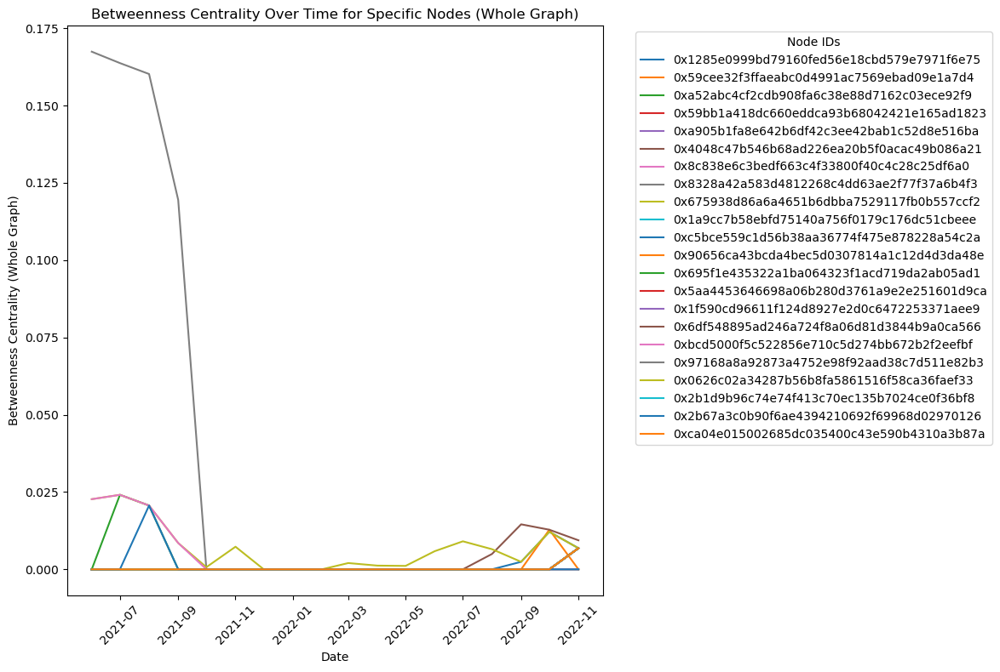

In [370]:
import pandas as pd
import networkx as nx
from os.path import join
from collections import defaultdict
import matplotlib.pyplot as plt

# Define the specific nodes to track (updated list)
specific_nodes = {
    '0x8328a42a583d4812268c4dd63ae2f77f37a6b4f3',
    '0xa52abc4cf2cdb908fa6c38e88d7162c03ece92f9',
    '0x2b67a3c0b90f6ae4394210692f69968d02970126',
    '0xbcd5000f5c522856e710c5d274bb672b2f2eefbf',
    '0x59cee32f3ffaeabc0d4991ac7569ebad09e1a7d4',
    '0x4048c47b546b68ad226ea20b5f0acac49b086a21',
    '0x675938d86a6a4651b6dbba7529117fb0b557ccf2',
    '0x1285e0999bd79160fed56e18cbd579e7971f6e75',
    '0x59bb1a418dc660eddca93b68042421e165ad1823',
    '0x0626c02a34287b56b8fa5861516f58ca36faef33',
    '0x8c838e6c3bedf663c4f33800f40c4c28c25df6a0',
    '0xa905b1fa8e642b6df42c3ee42bab1c52d8e516ba',
    '0x1a9cc7b58ebfd75140a756f0179c176dc51cbeee',
    '0xca04e015002685dc035400c43e590b4310a3b87a',
    '0x97168a8a92873a4752e98f92aad38c7d511e82b3',
    '0x90656ca43bcda4bec5d0307814a1c12d4d3da48e',
    '0x5aa4453646698a06b280d3761a9e2e251601d9ca',
    '0x2b1d9b96c74e74f413c70ec135b7024ce0f36bf8',
    '0x6df548895ad246a724f8a06d81d3844b9a0ca566',
    '0xc5bce559c1d56b38aa36774f475e878228a54c2a',
    '0x1f590cd96611f124d8927e2d0c6472253371aee9',
    '0x695f1e435322a1ba064323f1acd719da2ab05ad1'
}

def load_and_apply_saved_communities(graph, community_file, snapshot_id):
    """Load and apply the saved community assignments to the graph nodes."""
    community_df = pd.read_csv(community_file)
    community_df['Snapshot'] = community_df['Snapshot'].astype(str).str.strip()
    snapshot_id = str(snapshot_id).strip()

    snapshot_communities = community_df[community_df['Snapshot'] == snapshot_id]
    if snapshot_communities.empty:
        print(f"No data found for Snapshot ID: {snapshot_id}")
        return

    community_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Community']))
    token_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Token']))
    
    for node in graph.nodes():
        graph.nodes[node]['community'] = community_map.get(node, 'Unknown')
        graph.nodes[node]['token'] = token_map.get(node, 'Unknown Token')

def calculate_betweenness_centrality_whole_graph(graph):
    """Calculate the betweenness centrality for each node in the entire graph."""
    betweenness_centrality = nx.betweenness_centrality(graph)
    return betweenness_centrality

def track_betweenness_centrality_over_time(graph_directory, community_file, snapshot_dates):
    """Track the betweenness centrality for specific nodes across all snapshots for the entire graph."""
    centrality_over_time = defaultdict(lambda: defaultdict(float))

    for snapshot_id, snapshot_date in snapshot_dates.items():
        graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        G = nx.read_graphml(graph_file)

        load_and_apply_saved_communities(G, community_file, snapshot_id)

        betweenness_centrality = calculate_betweenness_centrality_whole_graph(G)

        for node in specific_nodes:
            centrality_over_time[node][pd.to_datetime(snapshot_date)] = betweenness_centrality.get(node, 0.0)

    return centrality_over_time

def plot_specific_betweenness_centrality_over_time(centrality_over_time):
    """Plot the betweenness centrality over time for the specific nodes provided."""
    plt.figure(figsize=(12, 8))
    
    # Get all unique dates from all nodes
    all_dates = sorted(set(date for node_data in centrality_over_time.values() for date in node_data.keys()))

    # Plot the betweenness centrality over time for each specific node
    for node in specific_nodes:
        if node in centrality_over_time:
            centralities = []
            for date in all_dates:
                # Use 0 if the centrality value for the date is missing
                centralities.append(centrality_over_time[node].get(date, 0.0))
            plt.plot(all_dates, centralities, label=node)
    
    plt.xlabel("Date")
    plt.ylabel("Betweenness Centrality (Whole Graph)")
    plt.title("Betweenness Centrality Over Time for Specific Nodes (Whole Graph)")
    plt.xticks(rotation=45)
    plt.legend(title="Node IDs", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

# Paths and snapshot dates
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Track betweenness centrality over the entire period for specific nodes
centrality_over_time = track_betweenness_centrality_over_time(graph_directory, community_file, snapshot_dates)

# Plot the betweenness centrality over time for the specific nodes
plot_specific_betweenness_centrality_over_time(centrality_over_time)


In [ ]:
# Snapshot by snapshot

In [376]:
import pandas as pd
import networkx as nx
from os.path import join
from collections import defaultdict

def load_and_apply_saved_communities(graph, community_file, snapshot_id):
    """Load and apply the saved community assignments to the graph nodes."""
    community_df = pd.read_csv(community_file)
    community_df['Snapshot'] = community_df['Snapshot'].astype(str).str.strip()
    snapshot_id = str(snapshot_id).strip()

    snapshot_communities = community_df[community_df['Snapshot'] == snapshot_id]
    if snapshot_communities.empty:
        print(f"No data found for Snapshot ID: {snapshot_id}")
        return

    community_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Community']))
    token_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Token']))
    
    for node in graph.nodes():
        graph.nodes[node]['community'] = community_map.get(node, 'Unknown')
        graph.nodes[node]['token'] = token_map.get(node, 'Unknown Token')

def calculate_betweenness_centrality(graph):
    """Calculate the betweenness centrality for each node in the entire graph."""
    betweenness_centrality = nx.betweenness_centrality(graph)
    return betweenness_centrality

def find_top_10_betweenness_nodes_per_snapshot(graph_directory, community_file, snapshot_dates):
    """Find the top 10 nodes with the highest betweenness centrality in each snapshot."""
    top_nodes_list = []

    for snapshot_id, snapshot_date in snapshot_dates.items():
        graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        G = nx.read_graphml(graph_file)

        load_and_apply_saved_communities(G, community_file, snapshot_id)

        betweenness_centrality = calculate_betweenness_centrality(G)

        sorted_centrality = sorted(betweenness_centrality.items(), key=lambda item: item[1], reverse=True)
        top_10_nodes = sorted_centrality[:10]

        for node, centrality in top_10_nodes:
            top_nodes_list.append({
                "Snapshot": snapshot_id,
                "Date": pd.to_datetime(snapshot_date),
                "Node": node,
                "Betweenness Centrality": centrality,
                "Community": G.nodes[node].get('community', 'Unknown'),
                "Token Name": G.nodes[node].get('token', 'Unknown Token')
            })

    top_nodes_df = pd.DataFrame(top_nodes_list)
    return top_nodes_df

# Paths and snapshot information
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Step 1: Find the top 10 betweenness centrality nodes in each snapshot
top_nodes_df = find_top_10_betweenness_nodes_per_snapshot(graph_directory, community_file, snapshot_dates)

# Step 2: Save or display the result
output_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/Top betweeness/All graph/top_10_betweenness_nodes_per_snapshot.csv'
top_nodes_df.to_csv(output_file, index=False)
print(top_nodes_df)


     Snapshot       Date                                        Node  \
0    11659570 2021-06-01  0xbe0eb53f46cd790cd13851d5eff43d12404d33e8   
1    11659570 2021-06-01  0x3dfd23a6c5e8bbcfc9581d2e864a68feb6a076d3   
2    11659570 2021-06-01  0x8328a42a583d4812268c4dd63ae2f77f37a6b4f3   
3    11659570 2021-06-01  0xe93381fb4c4f14bda253907b18fad305d799241a   
4    11659570 2021-06-01  0x3f5ce5fbfe3e9af3971dd833d26ba9b5c936f0be   
..        ...        ...                                         ...   
175  14967365 2022-11-01  0xbe0eb53f46cd790cd13851d5eff43d12404d33e8   
176  14967365 2022-11-01  0x26a78d5b6d7a7aceedd1e6ee3229b372a624d8b7   
177  14967365 2022-11-01  0xc697051d1c6296c24ae3bcef39aca743861d9a81   
178  14967365 2022-11-01  0x3744da57184575064838bbc87a0fc791f5e39ea2   
179  14967365 2022-11-01  0xffc97d72e13e01096502cb8eb52dee56f74dad7b   

     Betweenness Centrality  Community Token Name  
0                  0.222453          4      Curve  
1                  0.212855    

# Largest connected component snapshot by snapshot betweeness

In [408]:
import pandas as pd
import networkx as nx
from os.path import join
from collections import defaultdict

def load_and_apply_saved_communities(graph, community_file, snapshot_id):
    """Load and apply the saved community assignments to the graph nodes."""
    community_df = pd.read_csv(community_file)
    community_df['Snapshot'] = community_df['Snapshot'].astype(str).str.strip()
    snapshot_id = str(snapshot_id).strip()

    snapshot_communities = community_df[community_df['Snapshot'] == snapshot_id]
    if snapshot_communities.empty:
        print(f"No data found for Snapshot ID: {snapshot_id}")
        return

    community_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Community']))
    token_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Token']))
    
    for node in graph.nodes():
        graph.nodes[node]['community'] = community_map.get(node, 'Unknown')
        graph.nodes[node]['token'] = token_map.get(node, 'Unknown Token')

def calculate_betweenness_centrality_largest_component(graph):
    """Calculate the betweenness centrality for the largest connected component in the graph."""
    largest_component = max(nx.connected_components(graph), key=len)
    subgraph = graph.subgraph(largest_component)
    betweenness_centrality = nx.betweenness_centrality(subgraph)
    return betweenness_centrality, subgraph

def find_top_10_betweenness_nodes_per_snapshot_largest_component(graph_directory, community_file, snapshot_dates):
    """Find the top 10 nodes with the highest betweenness centrality in the largest connected component of each snapshot."""
    top_nodes_list = []

    for snapshot_id, snapshot_date in snapshot_dates.items():
        graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        G = nx.read_graphml(graph_file)

        load_and_apply_saved_communities(G, community_file, snapshot_id)

        betweenness_centrality, subgraph = calculate_betweenness_centrality_largest_component(G)

        sorted_centrality = sorted(betweenness_centrality.items(), key=lambda item: item[1], reverse=True)
        top_10_nodes = sorted_centrality[:10]

        for node, centrality in top_10_nodes:
            top_nodes_list.append({
                "Snapshot": snapshot_id,
                "Date": pd.to_datetime(snapshot_date),
                "Node": node,
                "Betweenness Centrality": centrality,
                "Community": subgraph.nodes[node].get('community', 'Unknown'),
                "Token Name": subgraph.nodes[node].get('token', 'Unknown Token')
            })

    top_nodes_df = pd.DataFrame(top_nodes_list)
    return top_nodes_df

# Paths and snapshot information
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Step 1: Find the top 10 betweenness centrality nodes in the largest component of each snapshot
top_nodes_df = find_top_10_betweenness_nodes_per_snapshot_largest_component(graph_directory, community_file, snapshot_dates)

# Step 2: Save or display the result
output_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/Top betweeness/Largest component/top_10_betweenness_nodes_per_snapshot_largest_component.csv'
top_nodes_df.to_csv(output_file, index=False)
print(top_nodes_df)


     Snapshot       Date                                        Node  \
0    11659570 2021-06-01  0xbe0eb53f46cd790cd13851d5eff43d12404d33e8   
1    11659570 2021-06-01  0x3dfd23a6c5e8bbcfc9581d2e864a68feb6a076d3   
2    11659570 2021-06-01  0x8328a42a583d4812268c4dd63ae2f77f37a6b4f3   
3    11659570 2021-06-01  0xe93381fb4c4f14bda253907b18fad305d799241a   
4    11659570 2021-06-01  0x3f5ce5fbfe3e9af3971dd833d26ba9b5c936f0be   
..        ...        ...                                         ...   
175  14967365 2022-11-01  0xbe0eb53f46cd790cd13851d5eff43d12404d33e8   
176  14967365 2022-11-01  0x26a78d5b6d7a7aceedd1e6ee3229b372a624d8b7   
177  14967365 2022-11-01  0xc697051d1c6296c24ae3bcef39aca743861d9a81   
178  14967365 2022-11-01  0x3744da57184575064838bbc87a0fc791f5e39ea2   
179  14967365 2022-11-01  0xffc97d72e13e01096502cb8eb52dee56f74dad7b   

     Betweenness Centrality  Community Token Name  
0                  0.403520          4      Curve  
1                  0.386108    

In [409]:
import pandas as pd

# Path to the CSV file
file_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/Top betweeness/All graph/Snapshot by snapshot/top_10_betweenness_nodes_per_snapshot.csv'

# Load the CSV file into a DataFrame
df = pd.read_csv(file_path)

# Filter the DataFrame to find rows where 'Name' contains 'Entity' and 'Status' is 'Wallet'
filtered_df = df[(df['Name'].str.contains('Entity', na=False)) & (df['Status'] == 'Wallet')]

# Extract the wallet addresses from the 'Node' column
wallet_addresses = filtered_df['Node'].unique()

# Display the wallet addresses
print(wallet_addresses)

# Optionally, save the results to a new file
#output_file = '/Users/liamk/Desktop/entity_wallet_addresses.csv'
#pd.DataFrame(wallet_addresses, columns=['Wallet Address']).to_csv(output_file, index=False)


['0x8328a42a583d4812268c4dd63ae2f77f37a6b4f3'
 '0xbcd5000f5c522856e710c5d274bb672b2f2eefbf'
 '0xa52abc4cf2cdb908fa6c38e88d7162c03ece92f9'
 '0x4ce799e6ed8d64536b67dd428565d52a531b3640'
 '0xf89501b77b2fa6329f94f5a05fe84cebb5c8b1a0'
 '0x34a4c5d747f54d5e3a3f66eb6ef3f697f474fd90'
 '0x675938d86a6a4651b6dbba7529117fb0b557ccf2'
 '0xf81ccdc1ee8de3fbfa48a0714fc773022e4c14d7'
 '0xc0bebc09db9c32f6ada00e2e4c7d6ae622809c93'
 '0xe24adbd37daf29881aa2841d37d63d703ac80d2a'
 '0x59cee32f3ffaeabc0d4991ac7569ebad09e1a7d4']


/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_9961/379209324.py:29: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



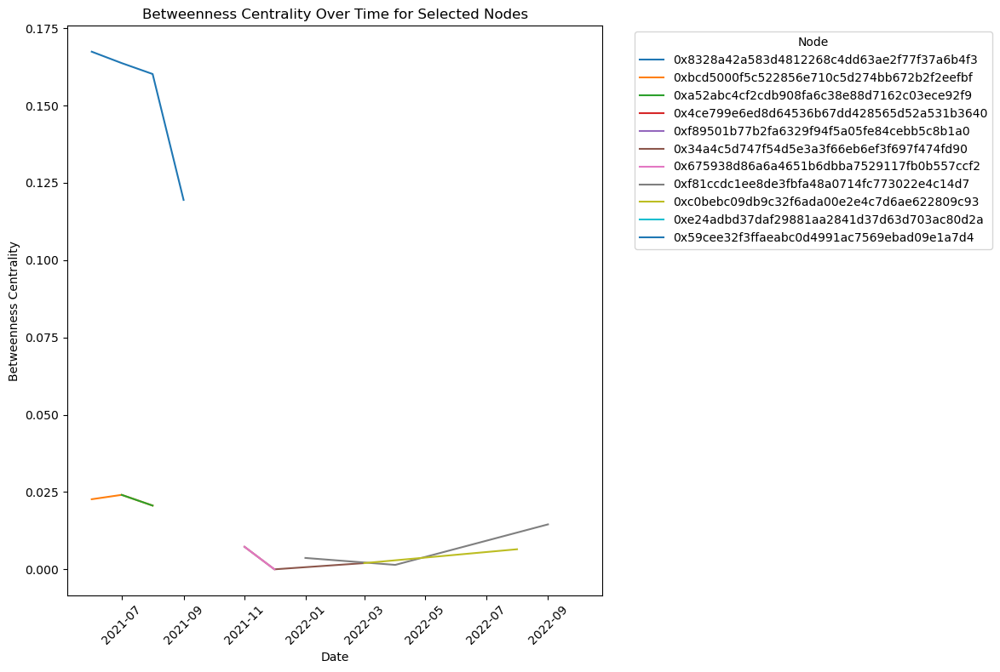

In [410]:
import pandas as pd
import matplotlib.pyplot as plt

# Path to the CSV file
file_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/Top betweeness/All graph/Snapshot by snapshot/top_10_betweenness_nodes_per_snapshot.csv'

# Load the CSV file into a DataFrame
df = pd.read_csv(file_path)

# Nodes of interest
nodes_of_interest = [
    '0x8328a42a583d4812268c4dd63ae2f77f37a6b4f3',
    '0xbcd5000f5c522856e710c5d274bb672b2f2eefbf',
    '0xa52abc4cf2cdb908fa6c38e88d7162c03ece92f9',
    '0x4ce799e6ed8d64536b67dd428565d52a531b3640',
    '0xf89501b77b2fa6329f94f5a05fe84cebb5c8b1a0',
    '0x34a4c5d747f54d5e3a3f66eb6ef3f697f474fd90',
    '0x675938d86a6a4651b6dbba7529117fb0b557ccf2',
    '0xf81ccdc1ee8de3fbfa48a0714fc773022e4c14d7',
    '0xc0bebc09db9c32f6ada00e2e4c7d6ae622809c93',
    '0xe24adbd37daf29881aa2841d37d63d703ac80d2a',
    '0x59cee32f3ffaeabc0d4991ac7569ebad09e1a7d4'
]

# Filter the DataFrame to include only the rows for the nodes of interest
filtered_df = df[df['Node'].isin(nodes_of_interest)]

# Convert the 'Date' column to datetime format
filtered_df['Date'] = pd.to_datetime(filtered_df['Date'])

# Plot the betweenness centrality over time for each node
plt.figure(figsize=(12, 8))

for node in nodes_of_interest:
    node_df = filtered_df[filtered_df['Node'] == node]
    plt.plot(node_df['Date'], node_df['Betweenness Centrality'], label=node)

plt.xlabel("Date")
plt.ylabel("Betweenness Centrality")
plt.title("Betweenness Centrality Over Time for Selected Nodes")
plt.xticks(rotation=45)
plt.legend(title="Node", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


In [411]:
# Eigenvector centrality

In [413]:
import pandas as pd
import networkx as nx
from os.path import join
from collections import defaultdict

def load_and_apply_saved_communities(graph, community_file, snapshot_id):
    """Load and apply the saved community assignments to the graph nodes."""
    community_df = pd.read_csv(community_file)
    community_df['Snapshot'] = community_df['Snapshot'].astype(str).str.strip()
    snapshot_id = str(snapshot_id).strip()

    snapshot_communities = community_df[community_df['Snapshot'] == snapshot_id]
    if snapshot_communities.empty:
        print(f"No data found for Snapshot ID: {snapshot_id}")
        return

    community_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Community']))
    token_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Token']))
    
    for node in graph.nodes():
        graph.nodes[node]['community'] = community_map.get(node, 'Unknown')
        graph.nodes[node]['token'] = token_map.get(node, 'Unknown Token')

def calculate_eigenvector_centrality(graph, max_iter=500, tol=1e-06):
    """Calculate the eigenvector centrality for each node in the entire graph."""
    eigenvector_centrality = nx.eigenvector_centrality(graph, max_iter=max_iter, tol=tol)
    return eigenvector_centrality

def average_eigenvector_centrality_across_snapshots(graph_directory, community_file, snapshot_dates):
    """Calculate the average eigenvector centrality for each node across all snapshots for the entire graph."""
    centrality_sums = defaultdict(float)
    node_occurrences = defaultdict(int)
    node_community = {}
    node_token = {}

    for snapshot_id, snapshot_date in snapshot_dates.items():
        graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        G = nx.read_graphml(graph_file)

        load_and_apply_saved_communities(G, community_file, snapshot_id)

        try:
            eigenvector_centrality = calculate_eigenvector_centrality(G)
        except nx.PowerIterationFailedConvergence:
            print(f"Power iteration failed to converge for snapshot {snapshot_id}. Skipping this snapshot.")
            continue

        for node, centrality in eigenvector_centrality.items():
            centrality_sums[node] += centrality
            node_occurrences[node] += 1
            node_community[node] = G.nodes[node].get('community', 'Unknown')
            node_token[node] = G.nodes[node].get('token', 'Unknown Token')

    # Calculate average centrality for each node
    average_centrality = {node: centrality_sums[node] / node_occurrences[node] for node in centrality_sums}

    return average_centrality, node_community, node_token

def find_top_average_eigenvector_centrality_nodes(average_centrality, node_community, node_token, top_n=50):
    """Find the top N nodes with the highest average eigenvector centrality."""
    sorted_nodes = sorted(average_centrality.items(), key=lambda x: x[1], reverse=True)[:top_n]
    top_nodes = [
        {
            'Node': node,
            'Average Eigenvector Centrality': centrality,
            'Community': node_community[node],
            'Token': node_token[node]
        }
        for node, centrality in sorted_nodes
    ]
    return top_nodes

# Paths and snapshot information
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Step 1: Calculate average eigenvector centrality across all snapshots
average_centrality, node_community, node_token = average_eigenvector_centrality_across_snapshots(graph_directory, community_file, snapshot_dates)

# Step 2: Find and display the top nodes with the highest average eigenvector centrality
top_average_nodes = find_top_average_eigenvector_centrality_nodes(average_centrality, node_community, node_token, top_n=50)

# Convert the results to a DataFrame for better visualization and export
df_top_average_nodes = pd.DataFrame(top_average_nodes)

# Display the results
print(df_top_average_nodes)

# Optionally, save the results to a CSV file
output_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/Top Eigenvector/top_average_eigenvector_centrality_nodes.csv'
df_top_average_nodes.to_csv(output_file, index=False)


                                          Node  \
0   0x86bb5d880d177a95995aebc74a5b1db2aa39c2ae   
1   0xea3178d4925d1ceb4abab947d4cde2314a7b4a50   
2   0xc2adda861f89bbb333c90c492cb837741916a225   
3   0xf977814e90da44bfa03b6295a0616a897441acec   
4   0xd0ed69e40a5b044d59411cf6ddc653c8c3924d10   
5   0x8d6f396d210d385033b348bcae9e4f9ea4e045bd   
6   0x555981b82743aa443cb1c3002c85ba9d795d4596   
7   0xc564ee9f21ed8a2d8e7e76c085740d5e4c5fafbe   
8   0x53c286e0abe87c9e6d4d95ebe62ceafa4afce849   
9   0xdb25ca703181e7484a155dd612b06f57e12be5f0   
10  0xe174c389249b0e3a4ec84d2a5667aa4920cb77de   
11  0xd0660cd418a64a1d44e9214ad8e459324d8157f1   
12  0xc26b89a667578ec7b3f11b2f98d6fd15c07c54ba   
13  0xddfabcdc4d8ffc6d5beaf154f18b778f892a0740   
14  0x1285e0999bd79160fed56e18cbd579e7971f6e75   
15  0xe98ae8cd25cdc06562c29231db339d17d02fd486   
16  0x59bb1a418dc660eddca93b68042421e165ad1823   
17  0x0626c02a34287b56b8fa5861516f58ca36faef33   
18  0x8c838e6c3bedf663c4f33800f40c4c28c25df6a0   


In [445]:
import pandas as pd

# Path to the CSV file
file_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/Top Eigenvector/All graph/top_average_eigenvector_centrality_nodes_labelled.csv'

# Load the CSV file into a DataFrame
df = pd.read_csv(file_path)

# Filter the DataFrame to find rows where 'Name' contains 'Entity' and 'Status' is 'Wallet'
filtered_df = df[(df['Name'].str.contains('Entity', na=False)) & (df['Status'] == 'Wallet')]

# Select only the 'Node' and 'Average Eigenvector Centrality' columns
result_df = filtered_df[['Node', 'Average Eigenvector Centrality']]

# Display the filtered DataFrame
print(result_df)


                                          Node  Average Eigenvector Centrality
1   0xea3178d4925d1ceb4abab947d4cde2314a7b4a50                        0.215309
4   0xd0ed69e40a5b044d59411cf6ddc653c8c3924d10                        0.199287
8   0x53c286e0abe87c9e6d4d95ebe62ceafa4afce849                        0.177088
10  0xe174c389249b0e3a4ec84d2a5667aa4920cb77de                        0.176386
14  0x1285e0999bd79160fed56e18cbd579e7971f6e75                        0.173142
16  0x59bb1a418dc660eddca93b68042421e165ad1823                        0.170056
17  0x0626c02a34287b56b8fa5861516f58ca36faef33                        0.170056
18  0x8c838e6c3bedf663c4f33800f40c4c28c25df6a0                        0.170056
19  0xa905b1fa8e642b6df42c3ee42bab1c52d8e516ba                        0.170056
20  0x1a9cc7b58ebfd75140a756f0179c176dc51cbeee                        0.170056
22  0xca04e015002685dc035400c43e590b4310a3b87a                        0.170056
23  0x97168a8a92873a4752e98f92aad38c7d511e82b3      

In [446]:
# Out of the top 50 highest eigenvector nodes, 29 were unidentified wallets

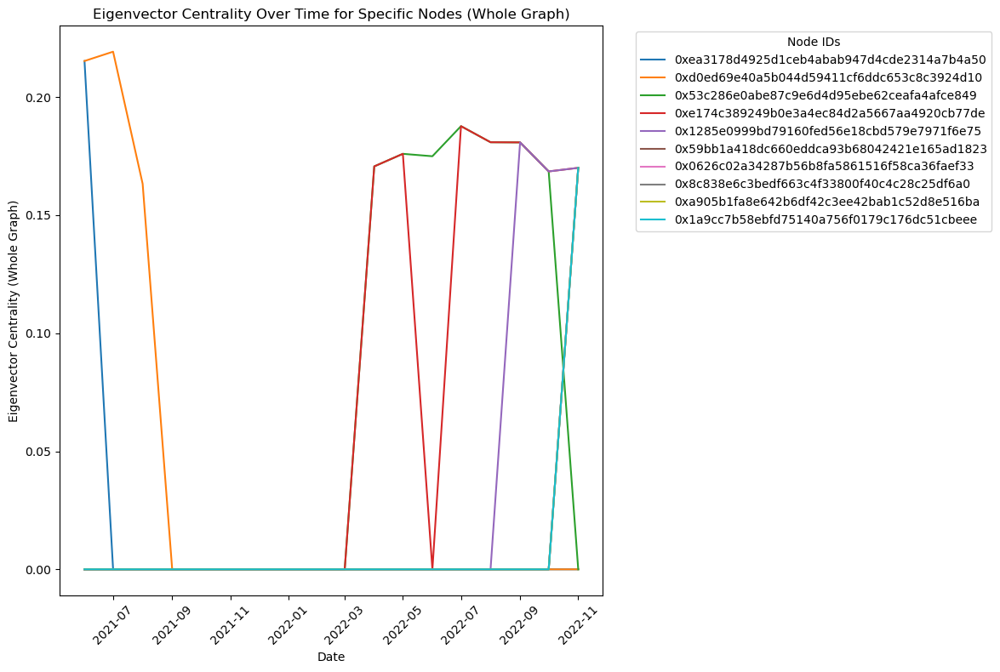

In [447]:
import pandas as pd
import networkx as nx
from os.path import join
from collections import defaultdict
import matplotlib.pyplot as plt

# Define the specific nodes to track (updated list)
specific_nodes = [
    '0xea3178d4925d1ceb4abab947d4cde2314a7b4a50',
    '0xd0ed69e40a5b044d59411cf6ddc653c8c3924d10',
    '0x53c286e0abe87c9e6d4d95ebe62ceafa4afce849',
    '0xe174c389249b0e3a4ec84d2a5667aa4920cb77de',
    '0x1285e0999bd79160fed56e18cbd579e7971f6e75',
    '0x59bb1a418dc660eddca93b68042421e165ad1823',
    '0x0626c02a34287b56b8fa5861516f58ca36faef33',
    '0x8c838e6c3bedf663c4f33800f40c4c28c25df6a0',
    '0xa905b1fa8e642b6df42c3ee42bab1c52d8e516ba',
    '0x1a9cc7b58ebfd75140a756f0179c176dc51cbeee'
]

def load_and_apply_saved_communities(graph, community_file, snapshot_id):
    """Load and apply the saved community assignments to the graph nodes."""
    community_df = pd.read_csv(community_file)
    community_df['Snapshot'] = community_df['Snapshot'].astype(str).str.strip()
    snapshot_id = str(snapshot_id).strip()

    snapshot_communities = community_df[community_df['Snapshot'] == snapshot_id]
    if snapshot_communities.empty:
        print(f"No data found for Snapshot ID: {snapshot_id}")
        return

    community_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Community']))
    token_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Token']))
    
    for node in graph.nodes():
        graph.nodes[node]['community'] = community_map.get(node, 'Unknown')
        graph.nodes[node]['token'] = token_map.get(node, 'Unknown Token')

def calculate_eigenvector_centrality_whole_graph(graph):
    """Calculate the eigenvector centrality for each node in the entire graph."""
    eigenvector_centrality = nx.eigenvector_centrality(graph, max_iter=1000, tol=1e-06)
    return eigenvector_centrality

def track_eigenvector_centrality_over_time(graph_directory, community_file, snapshot_dates):
    """Track the eigenvector centrality for specific nodes across all snapshots for the entire graph."""
    centrality_over_time = defaultdict(lambda: defaultdict(float))

    for snapshot_id, snapshot_date in snapshot_dates.items():
        graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        G = nx.read_graphml(graph_file)

        load_and_apply_saved_communities(G, community_file, snapshot_id)

        eigenvector_centrality = calculate_eigenvector_centrality_whole_graph(G)

        for node in specific_nodes:
            centrality_over_time[node][pd.to_datetime(snapshot_date)] = eigenvector_centrality.get(node, 0.0)

    return centrality_over_time

def plot_specific_eigenvector_centrality_over_time(centrality_over_time):
    """Plot the eigenvector centrality over time for the specific nodes provided."""
    plt.figure(figsize=(12, 8))
    
    # Get all unique dates from all nodes
    all_dates = sorted(set(date for node_data in centrality_over_time.values() for date in node_data.keys()))

    # Plot the eigenvector centrality over time for each specific node
    for node in specific_nodes:
        if node in centrality_over_time:
            centralities = []
            for date in all_dates:
                # Use 0 if the centrality value for the date is missing
                centralities.append(centrality_over_time[node].get(date, 0.0))
            plt.plot(all_dates, centralities, label=node)
    
    plt.xlabel("Date")
    plt.ylabel("Eigenvector Centrality (Whole Graph)")
    plt.title("Eigenvector Centrality Over Time for Specific Nodes (Whole Graph)")
    plt.xticks(rotation=45)
    plt.legend(title="Node IDs", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

# Paths and snapshot dates
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Track eigenvector centrality over the entire period for specific nodes
centrality_over_time = track_eigenvector_centrality_over_time(graph_directory, community_file, snapshot_dates)

# Plot the eigenvector centrality over time for the specific nodes
plot_specific_eigenvector_centrality_over_time(centrality_over_time)


In [448]:
# Snapshot by snapshot


In [450]:
import pandas as pd
import networkx as nx
from os.path import join
from collections import defaultdict

def load_and_apply_saved_communities(graph, community_file, snapshot_id):
    """Load and apply the saved community assignments to the graph nodes."""
    community_df = pd.read_csv(community_file)
    community_df['Snapshot'] = community_df['Snapshot'].astype(str).str.strip()
    snapshot_id = str(snapshot_id).strip()

    snapshot_communities = community_df[community_df['Snapshot'] == snapshot_id]
    if snapshot_communities.empty:
        print(f"No data found for Snapshot ID: {snapshot_id}")
        return

    community_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Community']))
    token_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Token']))
    
    for node in graph.nodes():
        graph.nodes[node]['community'] = community_map.get(node, 'Unknown')
        graph.nodes[node]['token'] = token_map.get(node, 'Unknown Token')

def calculate_eigenvector_centrality(graph):
    """Calculate the eigenvector centrality for each node in the entire graph."""
    eigenvector_centrality = nx.eigenvector_centrality(graph, max_iter=1000, tol=1e-06)
    return eigenvector_centrality

def find_top_10_eigenvector_centrality_per_snapshot(graph_directory, community_file, snapshot_dates):
    """Find the top 10 nodes with the highest eigenvector centrality in each snapshot."""
    top_nodes_list = []

    for snapshot_id, snapshot_date in snapshot_dates.items():
        graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        G = nx.read_graphml(graph_file)

        load_and_apply_saved_communities(G, community_file, snapshot_id)

        eigenvector_centrality = calculate_eigenvector_centrality(G)

        # Sort the nodes by eigenvector centrality and take the top 10
        sorted_centrality = sorted(eigenvector_centrality.items(), key=lambda item: item[1], reverse=True)
        top_10_nodes = sorted_centrality[:10]

        for node, centrality in top_10_nodes:
            top_nodes_list.append({
                "Snapshot": snapshot_id,
                "Date": pd.to_datetime(snapshot_date),
                "Node": node,
                "Eigenvector Centrality": centrality,
                "Community": G.nodes[node].get('community', 'Unknown'),
                "Token Name": G.nodes[node].get('token', 'Unknown Token')
            })

    top_nodes_df = pd.DataFrame(top_nodes_list)
    return top_nodes_df

# Paths and snapshot dates
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Step 1: Find the top 10 eigenvector centrality nodes in each snapshot
top_nodes_df = find_top_10_eigenvector_centrality_per_snapshot(graph_directory, community_file, snapshot_dates)

# Step 2: Save the result to a CSV file
output_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/Top Eigenvectortop_10_eigenvector_centrality_nodes_per_snapshot.csv'
top_nodes_df.to_csv(output_file, index=False)

# Display the DataFrame
print(top_nodes_df)


     Snapshot       Date                                        Node  \
0    11659570 2021-06-01  0x3dfd23a6c5e8bbcfc9581d2e864a68feb6a076d3   
1    11659570 2021-06-01  0x26732399f47e00739d2b4b0451acc3f93f7e3a14   
2    11659570 2021-06-01  0xea3178d4925d1ceb4abab947d4cde2314a7b4a50   
3    11659570 2021-06-01  0x0a3f6849f78076aefadf113f5bed87720274ddc0   
4    11659570 2021-06-01  0xd0ed69e40a5b044d59411cf6ddc653c8c3924d10   
..        ...        ...                                         ...   
175  14967365 2022-11-01  0x8c838e6c3bedf663c4f33800f40c4c28c25df6a0   
176  14967365 2022-11-01  0xba37b002abafdd8e89a1995da52740bbc013d992   
177  14967365 2022-11-01  0xa905b1fa8e642b6df42c3ee42bab1c52d8e516ba   
178  14967365 2022-11-01  0x1a9cc7b58ebfd75140a756f0179c176dc51cbeee   
179  14967365 2022-11-01  0x22925707d59f89c2edf103b79436fce932d559eb   

     Eigenvector Centrality  Community     Token Name  
0                  0.237258          3          Maker  
1                  0.21

In [ ]:
# Eigenvector component by component aggregation

In [476]:
import pandas as pd
import networkx as nx
from os.path import join
from collections import defaultdict

def load_and_apply_saved_communities(graph, community_file, snapshot_id):
    """Load and apply the saved community assignments to the graph nodes."""
    community_df = pd.read_csv(community_file)
    community_df['Snapshot'] = community_df['Snapshot'].astype(str).str.strip()
    snapshot_id = str(snapshot_id).strip()

    snapshot_communities = community_df[community_df['Snapshot'] == snapshot_id]
    if snapshot_communities.empty:
        print(f"No data found for Snapshot ID: {snapshot_id}")
        return

    community_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Community']))
    token_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Token']))

    for node in graph.nodes():
        graph.nodes[node]['community'] = community_map.get(node, 'Unknown')
        graph.nodes[node]['token'] = token_map.get(node, 'Unknown Token')

def calculate_eigenvector_centrality_for_all_components(graph):
    """Calculate the eigenvector centrality for each connected component in the graph."""
    centrality = {}
    for component in nx.connected_components(graph):
        subgraph = graph.subgraph(component)
        component_centrality = nx.eigenvector_centrality(subgraph, max_iter=1000, tol=1e-06)
        centrality.update(component_centrality)
    return centrality

def aggregate_average_eigenvector_centrality(centrality_list):
    """Aggregate and average eigenvector centrality scores across all snapshots."""
    aggregated_centrality = defaultdict(lambda: {'total': 0, 'count': 0})
    node_metadata = {}

    for entry in centrality_list:
        node = entry['Node']
        aggregated_centrality[node]['total'] += entry['Eigenvector Centrality']
        aggregated_centrality[node]['count'] += 1
        node_metadata[node] = entry

    aggregated_list = []
    for node, data in aggregated_centrality.items():
        average_centrality = data['total'] / data['count']
        node_data = node_metadata[node]
        aggregated_list.append({
            "Node": node,
            "Average Eigenvector Centrality": average_centrality,
            "Community": node_data['Community'],
            "Token Name": node_data['Token Name']
        })

    return aggregated_list

def find_top_50_average_eigenvector_centrality(graph_directory, community_file, snapshot_dates):
    """Find the top 50 nodes with the highest average eigenvector centrality across all components and snapshots."""
    centrality_list = []

    for snapshot_id, snapshot_date in snapshot_dates.items():
        graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        G = nx.read_graphml(graph_file)

        load_and_apply_saved_communities(G, community_file, snapshot_id)

        # Calculate eigenvector centrality for each component
        eigenvector_centrality = calculate_eigenvector_centrality_for_all_components(G)

        for node, centrality in eigenvector_centrality.items():
            centrality_list.append({
                "Snapshot": snapshot_id,
                "Date": pd.to_datetime(snapshot_date),
                "Node": node,
                "Eigenvector Centrality": centrality,
                "Community": G.nodes[node].get('community', 'Unknown'),
                "Token Name": G.nodes[node].get('token', 'Unknown Token')
            })

    # Aggregate the average centrality scores across all snapshots
    aggregated_list = aggregate_average_eigenvector_centrality(centrality_list)

    # Convert to DataFrame and sort by average eigenvector centrality
    centrality_df = pd.DataFrame(aggregated_list)
    top_50_nodes_df = centrality_df.sort_values(by="Average Eigenvector Centrality", ascending=False).head(50)
    
    return top_50_nodes_df

# Paths and snapshot dates
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Step 1: Find the top 50 nodes with the highest average eigenvector centrality across all snapshots and components
top_50_nodes_df = find_top_50_average_eigenvector_centrality(graph_directory, community_file, snapshot_dates)

# Step 2: Save the result to a CSV file
output_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/Top Eigenvector/top_50_average_eigenvector_centrality_nodes_across_snapshots.csv'
top_50_nodes_df.to_csv(output_file, index=False)

# Display the DataFrame
print(top_50_nodes_df)




                                           Node  \
163  0x05767d9ef41dc40689678ffca0608878fb3de906   
162  0x2e088a0a19dda628b4304301d1ea70b114e4accd   
274  0x355d72fb52ad4591b2066e43e89a7a38cf5cb341   
110  0x22400f33726f0c62ecbac8ee0ba47c117ce5d429   
142  0x7514f531ef3721b8d2ff8d3a841d7c05011eecca   
141  0xa25d788ac2ac47618ae2ac56f29f50397bf4eb6d   
112  0x9dde0b1d39d0d2c6589cde1bfed3542d2a3c5b11   
341  0xfd72170339ac6d7bdda09d1eaca346b21a30d422   
336  0x1ab80f7fb46b25b7e0b2cfac23fc88ac37aaf4e9   
146  0x6494d7d110dac66e3933ad3f683e28f0842be4f4   
333  0xa7429af4deb16827dad0e71d8aeea9c2bf70e32c   
334  0x1a661cf8d8cd69dd2a423f3626a461a24280a8fb   
340  0x43b17088503f4ce1aed9fb302ed6bb51ad6694fa   
335  0x45eb1a004373b1d8457134a2c04a42d69d287724   
337  0x24346652e0e2ae0ce05c781501fdf4fe4553fac6   
338  0x45025ebc38647bcf7edd2b40cfdaf3fbfe1538f5   
339  0xc47162863a12227e5c3b0860715f9cf721651c0c   
342  0xfc78f8e1af80a3bf5a1783bb59ed2d1b10f78ca9   
115  0x0ef1b8a0e726fc3948e15b23

In [460]:
# LLC

In [461]:
import pandas as pd
import networkx as nx
from os.path import join
from collections import defaultdict

def load_and_apply_saved_communities(graph, community_file, snapshot_id):
    """Load and apply the saved community assignments to the graph nodes."""
    community_df = pd.read_csv(community_file)
    community_df['Snapshot'] = community_df['Snapshot'].astype(str).str.strip()
    snapshot_id = str(snapshot_id).strip()

    snapshot_communities = community_df[community_df['Snapshot'] == snapshot_id]
    if snapshot_communities.empty:
        print(f"No data found for Snapshot ID: {snapshot_id}")
        return

    community_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Community']))
    token_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Token']))
    
    for node in graph.nodes():
        graph.nodes[node]['community'] = community_map.get(node, 'Unknown')
        graph.nodes[node]['token'] = token_map.get(node, 'Unknown Token')

def calculate_eigenvector_centrality_largest_component(graph):
    """Calculate the eigenvector centrality for the largest connected component in the graph."""
    largest_component = max(nx.connected_components(graph), key=len)  # Ensure the largest component is selected
    subgraph = graph.subgraph(largest_component)
    eigenvector_centrality = nx.eigenvector_centrality(subgraph, max_iter=1000, tol=1e-06)
    return eigenvector_centrality

def find_top_eigenvector_centrality_lcc_per_snapshot(graph_directory, community_file, snapshot_dates, top_n=50):
    """Find the top nodes with the highest eigenvector centrality in the largest connected component across all snapshots."""
    top_nodes_list = []

    for snapshot_id, snapshot_date in snapshot_dates.items():
        graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        G = nx.read_graphml(graph_file)

        load_and_apply_saved_communities(G, community_file, snapshot_id)

        # Calculate eigenvector centrality for the largest connected component
        eigenvector_centrality = calculate_eigenvector_centrality_largest_component(G)

        # Sort and get the top N nodes by eigenvector centrality
        sorted_centrality = sorted(eigenvector_centrality.items(), key=lambda item: item[1], reverse=True)
        top_nodes = sorted_centrality[:top_n]

        for node, centrality in top_nodes:
            top_nodes_list.append({
                "Snapshot": snapshot_id,
                "Date": pd.to_datetime(snapshot_date),
                "Node": node,
                "Eigenvector Centrality": centrality,
                "Community": G.nodes[node].get('community', 'Unknown'),
                "Token Name": G.nodes[node].get('token', 'Unknown Token')
            })

    top_nodes_df = pd.DataFrame(top_nodes_list)
    return top_nodes_df

# Paths and snapshot dates
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Step 1: Find the top nodes with the highest eigenvector centrality in the largest connected component across all snapshots
top_nodes_df = find_top_eigenvector_centrality_lcc_per_snapshot(graph_directory, community_file, snapshot_dates, top_n=50)

# Step 2: Save the result to a CSV file
output_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/Top Eigenvector/top_eigenvector_centrality_lcc_nodes.csv'
top_nodes_df.to_csv(output_file, index=False)

# Display the DataFrame
print(top_nodes_df)


     Snapshot       Date                                        Node  \
0    11659570 2021-06-01  0x3dfd23a6c5e8bbcfc9581d2e864a68feb6a076d3   
1    11659570 2021-06-01  0x26732399f47e00739d2b4b0451acc3f93f7e3a14   
2    11659570 2021-06-01  0xea3178d4925d1ceb4abab947d4cde2314a7b4a50   
3    11659570 2021-06-01  0x0a3f6849f78076aefadf113f5bed87720274ddc0   
4    11659570 2021-06-01  0xd0ed69e40a5b044d59411cf6ddc653c8c3924d10   
..        ...        ...                                         ...   
895  14967365 2022-11-01  0x3744da57184575064838bbc87a0fc791f5e39ea2   
896  14967365 2022-11-01  0xffc97d72e13e01096502cb8eb52dee56f74dad7b   
897  14967365 2022-11-01  0x4da27a545c0c5b758a6ba100e3a049001de870f5   
898  14967365 2022-11-01  0x4048c47b546b68ad226ea20b5f0acac49b086a21   
899  14967365 2022-11-01  0x25f2226b597e8f9514b3f68f00f494cf4f286491   

     Eigenvector Centrality  Community Token Name  
0                  0.237259          3      Maker  
1                  0.215308    

In [470]:
import matplotlib.pyplot as plt
import networkx as nx

def visualize_lcc(graph):
    largest_component = max(nx.connected_components(graph), key=len)
    lcc_subgraph = graph.subgraph(largest_component)
    
    plt.figure(figsize=(15, 10))
    pos = nx.spring_layout(lcc_subgraph, k=0.1)
    nx.draw_networkx_nodes(lcc_subgraph, pos, node_size=50, alpha=0.7)
    nx.draw_networkx_edges(lcc_subgraph, pos, alpha=0.5)
    plt.title("Visualization of the Largest Connected Component")
    plt.axis('off')
    plt.show()



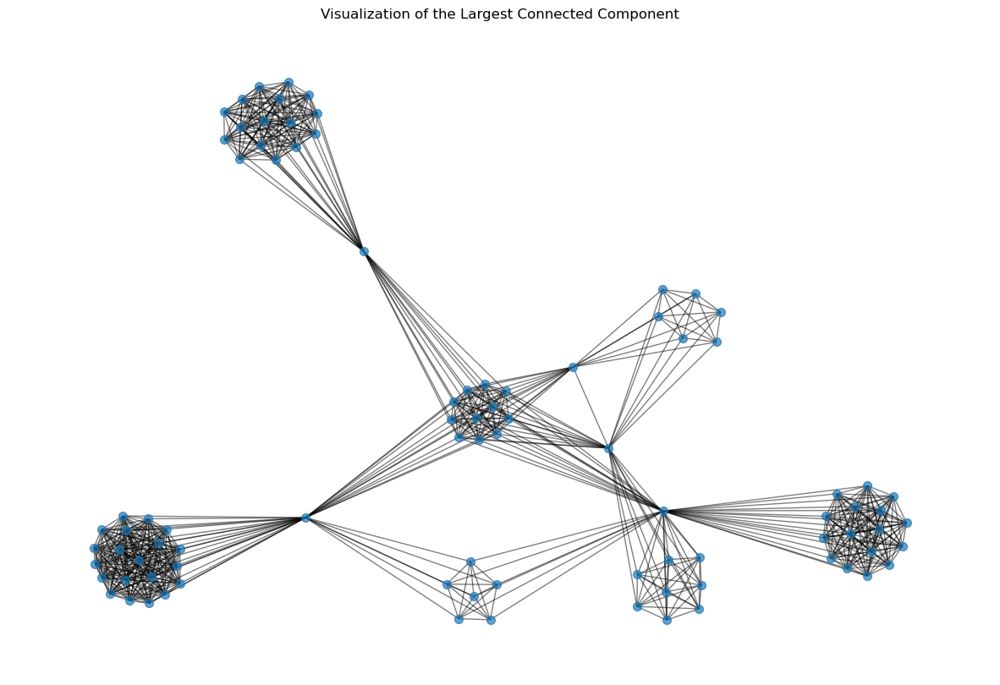

In [471]:
G = nx.read_graphml(graph_file)
visualize_lcc(G)


In [472]:
def plot_degree_distribution(graph):
    degrees = [degree for node, degree in graph.degree()]
    plt.figure(figsize=(10, 6))
    plt.hist(degrees, bins=range(min(degrees), max(degrees) + 1), alpha=0.75, color='skyblue', edgecolor='black')
    plt.title("Degree Distribution")
    plt.xlabel("Degree")
    plt.ylabel("Number of Nodes")
    plt.show()


In [474]:
def calculate_eigenvector_centrality_lcc(graph):
    largest_component = max(nx.connected_components(graph), key=len)
    lcc_subgraph = graph.subgraph(largest_component)
    eigenvector_centrality = nx.eigenvector_centrality(
        lcc_subgraph, 
        max_iter=5000,  # Increased iterations
        tol=1e-08,      # Reduced tolerance
        weight=None     # Ensure weights are considered appropriately
    )
    return eigenvector_centrality


In [475]:
def normalize_centrality(centrality_dict):
    max_value = max(centrality_dict.values())
    normalized_centrality = {node: value / max_value for node, value in centrality_dict.items()}
    return normalized_centrality


In [479]:
# Closeness


In [488]:
import os
import networkx as nx
import pandas as pd
from os.path import join
from collections import defaultdict

# Paths
normal_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'

# Load token information
token_info = pd.read_csv(token_info_path)
token_info['address'] = token_info['address'].str.lower()
token_map = token_info.set_index('address')['name'].to_dict()

# Initialize dictionaries to store cumulative centrality scores and counts across all graphs
centrality_sums = defaultdict(float)
node_occurrences = defaultdict(int)
node_metadata = {}

# Loop through all graph files in the directory
for filename in os.listdir(normal_graph_path):
    if filename.endswith('.graphml'):
        # Extract snapshot number from the filename
        snapshot = filename.split('_')[-1].split('.')[0]

        # Load the normal and enriched graph files
        normal_graph_file = join(normal_graph_path, filename)
        enriched_graph_file = join(enriched_graph_path, filename)

        normal_graph = nx.read_graphml(normal_graph_file)
        enriched_graph = nx.read_graphml(enriched_graph_file)

        # Extract token addresses from the enriched graph and map to token names
        for node in normal_graph.nodes():
            if 'token_address' in enriched_graph.nodes[node]:
                token_address = enriched_graph.nodes[node]['token_address'].lower()
                token_name = token_map.get(token_address, 'Unknown Token')
                normal_graph.nodes[node]['token_name'] = token_name
            else:
                normal_graph.nodes[node]['token_name'] = 'Unknown Token'

        # Identify the largest connected component
        largest_component = max(nx.connected_components(normal_graph), key=len)
        subgraph = normal_graph.subgraph(largest_component)

        # Calculate closeness centrality for the largest component
        closeness_centrality = nx.closeness_centrality(subgraph)

        # Aggregate the centrality scores and occurrences for each node
        for node, centrality in closeness_centrality.items():
            centrality_sums[node] += centrality
            node_occurrences[node] += 1
            node_metadata[node] = {
                'Token Name': normal_graph.nodes[node]['token_name'],
                'Community': normal_graph.nodes[node].get('community', 'Unknown')
            }

# Calculate the average closeness centrality for each node
average_centrality = {node: centrality_sums[node] / node_occurrences[node] for node in centrality_sums}

# Prepare the DataFrame
centrality_data = [
    {
        'Node': node,
        'Average Closeness Centrality': avg_centrality,
        'Token Name': node_metadata[node]['Token Name'],
        'Community': node_metadata[node]['Community']
    }
    for node, avg_centrality in average_centrality.items()
]

centrality_df = pd.DataFrame(centrality_data)

# Sort by average closeness centrality and select the top 50 nodes
top_50_nodes_df = centrality_df.sort_values(by="Average Closeness Centrality", ascending=False).head(50)

# Save the top 50 nodes to a CSV file
output_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/top_50_average_closeness_centrality_nodes_across_snapshots.csv'
top_50_nodes_df.to_csv(output_file, index=False)

# Display the DataFrame
print(top_50_nodes_df)


                                           Node  Average Closeness Centrality  \
18   0xf977814e90da44bfa03b6295a0616a897441acec                      0.631593   
103  0x555981b82743aa443cb1c3002c85ba9d795d4596                      0.571429   
107  0xbcd5000f5c522856e710c5d274bb672b2f2eefbf                      0.554494   
265  0x2b67a3c0b90f6ae4394210692f69968d02970126                      0.552795   
264  0x9c4ea0bf80c4768314c4f631ac84e274b32385fe                      0.552795   
267  0xe98ae8cd25cdc06562c29231db339d17d02fd486                      0.550000   
245  0xa52abc4cf2cdb908fa6c38e88d7162c03ece92f9                      0.549689   
134  0x43adde52c6c142912662d3e427709db5cac9b811                      0.549669   
273  0x2fdbadf3c4d5a8666bc06645b8358ab803996e28                      0.547170   
0    0x1026cbed7b7e851426b959bc69dcc1bf5876512d                      0.540594   
79   0xe93381fb4c4f14bda253907b18fad305d799241a                      0.540149   
132  0x6cbefa95e42960e579c2a

In [483]:
# Degree centrality

In [329]:
import pandas as pd
import networkx as nx
from os.path import join
from collections import defaultdict

def load_and_apply_saved_communities(graph, community_file, snapshot_id):
    """Load and apply the saved community assignments to the graph nodes."""
    community_df = pd.read_csv(community_file)
    community_df['Snapshot'] = community_df['Snapshot'].astype(str).str.strip()
    snapshot_id = str(snapshot_id).strip()

    snapshot_communities = community_df[community_df['Snapshot'] == snapshot_id]
    if snapshot_communities.empty:
        print(f"No data found for Snapshot ID: {snapshot_id}")
        return

    community_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Community']))
    for node in graph.nodes():
        graph.nodes[node]['community'] = community_map.get(node, 'Unknown')

def calculate_modularity(graph):
    """Calculate the modularity of the graph based on the community assignments."""
    # Create a dictionary where the key is the community and the value is a set of nodes in that community
    partition = defaultdict(set)
    for node, data in graph.nodes(data=True):
        community = data['community']
        partition[community].add(node)

    # Convert partition to a list of sets
    partition = list(partition.values())
    
    # Calculate modularity using networkx
    modularity = nx.algorithms.community.modularity(graph, partition)
    
    return modularity

def evaluate_community_detection_quality(graph_directory, community_file, snapshot_dates):
    """Evaluate the quality of community detection across snapshots using modularity."""
    modularity_scores = []

    for snapshot_id, snapshot_date in snapshot_dates.items():
        graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        G = nx.read_graphml(graph_file)

        # Apply saved community assignments
        load_and_apply_saved_communities(G, community_file, snapshot_id)

        # Calculate modularity
        modularity = calculate_modularity(G)
        modularity_scores.append({
            'Snapshot': snapshot_id,
            'Date': snapshot_date,
            'Modularity': modularity
        })

    return modularity_scores

# Paths and snapshot information
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Evaluate the quality of community detection across all snapshots
modularity_scores = evaluate_community_detection_quality(graph_directory, community_file, snapshot_dates)

# Convert the results to a DataFrame for better visualization and export
df_modularity_scores = pd.DataFrame(modularity_scores)

# Display the results
print(df_modularity_scores)

# Optionally, save the results to a CSV file
#output_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/modularity_scores.csv'
#df_modularity_scores.to_csv(output_file, index=False)



    Snapshot     Date  Modularity
0   11659570  2021-06    0.761596
1   11861210  2021-07    0.750430
2   12043054  2021-08    0.723538
3   12244515  2021-09    0.736130
4   12438842  2021-10    0.742987
5   12638919  2021-11    0.699100
6   12831436  2021-12    0.729919
7   13029639  2022-01    0.788883
8   13230157  2022-02    0.788831
9   13422506  2022-03    0.777012
10  13620205  2022-04    0.752260
11  13809597  2022-05    0.737627
12  14009885  2022-06    0.724562
13  14210564  2022-07    0.728784
14  14391029  2022-08    0.738185
15  14589816  2022-09    0.749288
16  14779829  2022-10    0.709369
17  14967365  2022-11    0.691737


In [141]:
import pandas as pd
import networkx as nx
import community as community_louvain
from os.path import join
from collections import defaultdict

def load_and_apply_saved_communities(graph, community_file, snapshot_id):
    """Load and apply the saved community assignments to the graph nodes."""
    community_df = pd.read_csv(community_file)
    community_df['Snapshot'] = community_df['Snapshot'].astype(str).str.strip()
    snapshot_id = str(snapshot_id).strip()

    snapshot_communities = community_df[community_df['Snapshot'] == snapshot_id]
    if snapshot_communities.empty:
        print(f"No data found for Snapshot ID: {snapshot_id}")
        return

    community_map = dict(zip(snapshot_communities['Node'], snapshot_communities['Community']))
    for node in graph.nodes():
        graph.nodes[node]['community'] = community_map.get(node, 'Unknown')

def calculate_modularity(graph):
    """Calculate the modularity of the graph based on the community assignments."""
    # Create a dictionary where the key is the community and the value is a set of nodes in that community
    partition = defaultdict(set)
    for node, data in graph.nodes(data=True):
        community = data['community']
        partition[community].add(node)

    # Convert partition to a list of sets
    partition = list(partition.values())
    
    # Calculate modularity using networkx
    modularity = nx.algorithms.community.modularity(graph, partition)
    
    return modularity

def evaluate_modularity_saved_vs_louvain(graph_directory, community_file, snapshot_dates):
    """Compare the modularity of saved communities vs Louvain method across snapshots."""
    results = []

    for snapshot_id, snapshot_date in snapshot_dates.items():
        graph_file = join(graph_directory, f'validated_wallet_projection_graph_{snapshot_id}.graphml')
        G = nx.read_graphml(graph_file)

        # Calculate modularity for saved communities
        load_and_apply_saved_communities(G, community_file, snapshot_id)
        modularity_saved = calculate_modularity(G)

        # Calculate modularity for Louvain method
        louvain_partition = community_louvain.best_partition(G)
        nx.set_node_attributes(G, louvain_partition, 'community')
        modularity_louvain = calculate_modularity(G)

        # Store results
        results.append({
            'Snapshot': snapshot_id,
            'Date': snapshot_date,
            'Modularity (Saved Communities)': modularity_saved,
            'Modularity (Louvain)': modularity_louvain
        })

    return results

# Paths and snapshot information
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
community_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/saved_communities/temporal_community_assignments_with_tokens.csv'
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Compare modularity scores between saved communities and Louvain method
modularity_comparison = evaluate_modularity_saved_vs_louvain(graph_directory, community_file, snapshot_dates)

# Convert the results to a DataFrame for better visualization and export
df_modularity_comparison = pd.DataFrame(modularity_comparison)

# Display the results
print(df_modularity_comparison)

# Optionally, save the results to a CSV file
#output_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/modularity_comparison.csv'
#df_modularity_comparison.to_csv(output_file, index=False)


    Snapshot     Date  Modularity (Saved Communities)  Modularity (Louvain)
0   11659570  2021-06                        0.761596              0.761596
1   11861210  2021-07                        0.750430              0.750430
2   12043054  2021-08                        0.723538              0.728361
3   12244515  2021-09                        0.736130              0.739779
4   12438842  2021-10                        0.742987              0.760034
5   12638919  2021-11                        0.699100              0.754211
6   12831436  2021-12                        0.729919              0.791657
7   13029639  2022-01                        0.788883              0.836190
8   13230157  2022-02                        0.788831              0.839862
9   13422506  2022-03                        0.777012              0.820208
10  13620205  2022-04                        0.752260              0.807611
11  13809597  2022-05                        0.737627              0.786257
12  14009885

# DO NOT GO BEYOND


In [39]:
def compute_community_sizes(partition):
    """Compute the size of each community."""
    community_sizes = defaultdict(int)
    for node, community in partition.items():
        community_sizes[community] += 1
    return community_sizes

def temporal_community_statistics(graph_directory):
    community_size_stats = []
    prev_partition = None

    for filename in sorted(os.listdir(graph_directory)):
        if filename.endswith('.graphml'):
            # Load the graph
            graph_path = join(graph_directory, filename)
            G = nx.read_graphml(graph_path)

            # Perform community detection
            partition = community_louvain.best_partition(G)

            # If previous partition exists, match communities
            if prev_partition is not None:
                partition = match_communities_across_snapshots(prev_partition, partition, G)
            
            # Compute community sizes
            community_sizes = compute_community_sizes(partition)
            
            # Save community size statistics
            snapshot_time = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            for community, size in community_sizes.items():
                community_size_stats.append({
                    'Snapshot': snapshot_time,
                    'Community': community,
                    'Size': size
                })
            
            # Update previous partition
            prev_partition = partition

    return pd.DataFrame(community_size_stats)

# Paths
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'

# Compute community size statistics
community_size_stats_df = temporal_community_statistics(graph_directory)

# Save the results
output_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/temporal_community_size_stats.csv'
community_size_stats_df.to_csv(output_file, index=False)

# Display the community size statistics
print(community_size_stats_df.head())


   Snapshot  Community  Size
0  11659570          0    19
1  11659570          1    18
2  11659570          3    21
3  11659570          4    17
4  11659570          5    17


In [40]:
import os
import networkx as nx
import pandas as pd
from os.path import join
from collections import defaultdict

def compute_token_distribution(partition, enriched_G, token_map):
    """Compute the token distribution within each community."""
    community_token_distribution = defaultdict(lambda: defaultdict(int))
    for node, community in partition.items():
        if node in enriched_G:
            token_address = enriched_G.nodes[node].get('token_address', '').lower()
            token_name = token_map.get(token_address, 'Unknown Token')
            community_token_distribution[community][token_name] += 1
    return community_token_distribution

def temporal_token_distribution(graph_directory, enriched_graph_directory, token_info_path):
    # Load the token mapping
    df_tokens = pd.read_csv(token_info_path)
    df_tokens['address'] = df_tokens['address'].str.lower()
    token_map = df_tokens.set_index('address')['name'].to_dict()

    token_distribution_stats = []
    prev_partition = None

    for filename in sorted(os.listdir(graph_directory)):
        if filename.endswith('.graphml'):
            normal_graph_file = join(graph_directory, filename)
            enriched_graph_file = join(enriched_graph_directory, filename)  # This correctly matches the normal graph filename

            # Check if the enriched graph file exists
            if not os.path.exists(enriched_graph_file):
                print(f"File not found: {enriched_graph_file}")
                continue

            # Load the normal and enriched graphs
            G = nx.read_graphml(normal_graph_file)
            enriched_G = nx.read_graphml(enriched_graph_file)

            # Perform community detection
            partition = community_louvain.best_partition(G)

            # If a previous partition exists, match communities across snapshots
            if prev_partition is not None:
                partition = match_communities_across_snapshots(prev_partition, partition, G)

            # Compute token distribution within communities using the enriched graph
            token_distribution = compute_token_distribution(partition, enriched_G, token_map)

            # Extract snapshot time from filename
            snapshot_time = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')

            # Store the results in a structured format
            for community, tokens in token_distribution.items():
                for token_name, count in tokens.items():
                    token_distribution_stats.append({
                        'Snapshot': snapshot_time,
                        'Community': community,
                        'Token Name': token_name,
                        'Count': count
                    })

            # Update the previous partition for the next iteration
            prev_partition = partition

    # Convert the results to a DataFrame for further analysis
    return pd.DataFrame(token_distribution_stats)

# Paths
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'

# Compute the temporal token distribution statistics with token labeling
temporal_token_distribution_stats_df = temporal_token_distribution(graph_directory, enriched_graph_directory, token_info_path)

# Save the results to a CSV file
output_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/temporal_token_distribution_stats.csv'
temporal_token_distribution_stats_df.to_csv(output_file, index=False)

# Display the first few rows of the token distribution statistics
print(temporal_token_distribution_stats_df.head())



   Snapshot  Community     Token Name  Count
0  11659570          2          Sushi      7
1  11659570          2          Curve      1
2  11659570          2  Yearn Finance     11
3  11659570          1           Lido     18
4  11659570          3          Maker     21


In [41]:
import os
import networkx as nx
import pandas as pd
from os.path import join
from collections import defaultdict

def compute_token_distribution(partition, enriched_G, token_map):
    """Compute the token distribution within each community."""
    community_token_distribution = defaultdict(lambda: defaultdict(int))
    for node, community in partition.items():
        if node in enriched_G:
            token_address = enriched_G.nodes[node].get('token_address', '').lower()
            token_name = token_map.get(token_address, 'Unknown Token')
            community_token_distribution[community][token_name] += 1
    return community_token_distribution

def temporal_token_distribution(graph_directory, enriched_graph_directory, token_info_path, snapshot_dates):
    # Load the token mapping
    df_tokens = pd.read_csv(token_info_path)
    df_tokens['address'] = df_tokens['address'].str.lower()
    token_map = df_tokens.set_index('address')['name'].to_dict()

    token_distribution_stats = []
    prev_partition = None

    for filename in sorted(os.listdir(graph_directory)):
        if filename.endswith('.graphml'):
            normal_graph_file = join(graph_directory, filename)
            enriched_graph_file = join(enriched_graph_directory, filename)  # This correctly matches the normal graph filename

            # Check if the enriched graph file exists
            if not os.path.exists(enriched_graph_file):
                print(f"File not found: {enriched_graph_file}")
                continue

            # Load the normal and enriched graphs
            G = nx.read_graphml(normal_graph_file)
            enriched_G = nx.read_graphml(enriched_graph_file)

            # Perform community detection
            partition = community_louvain.best_partition(G)

            # If a previous partition exists, match communities across snapshots
            if prev_partition is not None:
                partition = match_communities_across_snapshots(prev_partition, partition, G)

            # Compute token distribution within communities using the enriched graph
            token_distribution = compute_token_distribution(partition, enriched_G, token_map)

            # Extract snapshot time from filename
            snapshot_id = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            snapshot_date = snapshot_dates.get(snapshot_id, 'Unknown Date')

            # Store the results in a structured format
            for community, tokens in token_distribution.items():
                for token_name, count in tokens.items():
                    token_distribution_stats.append({
                        'Snapshot Date': snapshot_date,
                        'Community': community,
                        'Token Name': token_name,
                        'Count': count
                    })

            # Update the previous partition for the next iteration
            prev_partition = partition

    # Convert the results to a DataFrame for further analysis
    return pd.DataFrame(token_distribution_stats)

# Paths
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'

# Snapshot dates (example)
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Compute the temporal token distribution statistics with token labeling
temporal_token_distribution_stats_df = temporal_token_distribution(graph_directory, enriched_graph_directory, token_info_path, snapshot_dates)

# Save the results to a CSV file
output_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/temporal_token_distribution_stats.csv'
temporal_token_distribution_stats_df.to_csv(output_file, index=False)

# Display the first few rows of the token distribution statistics
print(temporal_token_distribution_stats_df.head())


  Snapshot Date  Community     Token Name  Count
0       2021-06          2          Sushi      7
1       2021-06          2          Curve      1
2       2021-06          2  Yearn Finance     11
3       2021-06          1           Lido     18
4       2021-06          3          Maker     21


/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_9700/3843193507.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Community'] = df['Community'].astype(str)


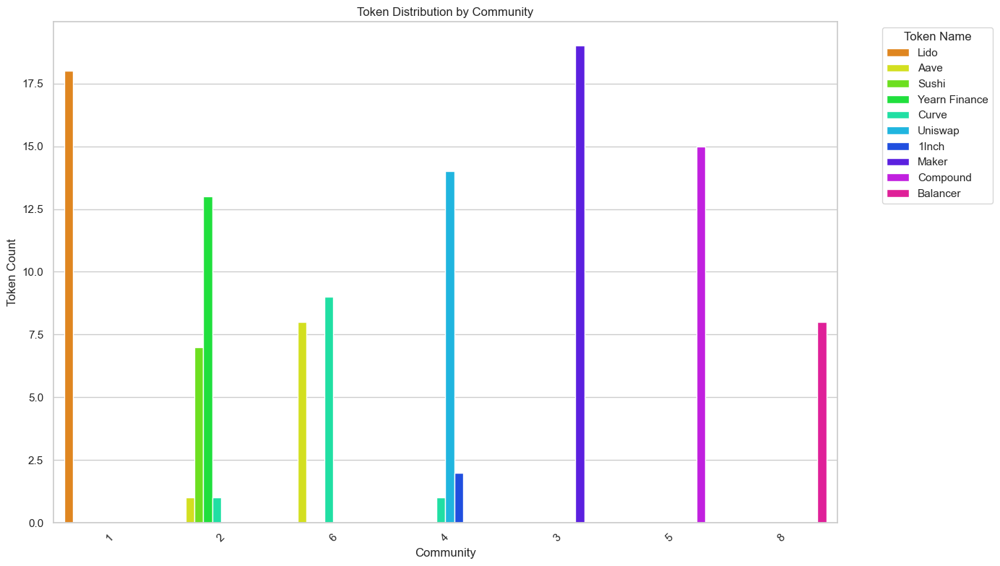

In [42]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Load the previously generated token distribution statistics
output_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/temporal_token_distribution_stats.csv'
temporal_token_distribution_stats_df = pd.read_csv(output_file)

# Create a stacked bar chart
def plot_token_distribution_by_community(df):
    # Set the plot style
    sns.set(style="whitegrid")

    # Convert 'Community' to string to avoid sorting issues
    df['Community'] = df['Community'].astype(str)

    # Set up a color palette that stays consistent across snapshots
    unique_tokens = df['Token Name'].unique()
    palette = sns.color_palette("hsv", len(unique_tokens))
    color_map = {token: palette[i] for i, token in enumerate(unique_tokens)}

    # Create the plot
    plt.figure(figsize=(14, 8))
    sns.barplot(
        data=df, 
        x='Community', 
        y='Count', 
        hue='Token Name', 
        palette=color_map
    )

    plt.title('Token Distribution by Community')
    plt.xlabel('Community')
    plt.ylabel('Token Count')
    plt.legend(title='Token Name', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# Filter for a specific snapshot date, if needed
snapshot_date = '2021-08'  # Example snapshot date
filtered_df = temporal_token_distribution_stats_df[temporal_token_distribution_stats_df['Snapshot Date'] == snapshot_date]

# Plot the distribution for the specific snapshot date
plot_token_distribution_by_community(filtered_df)


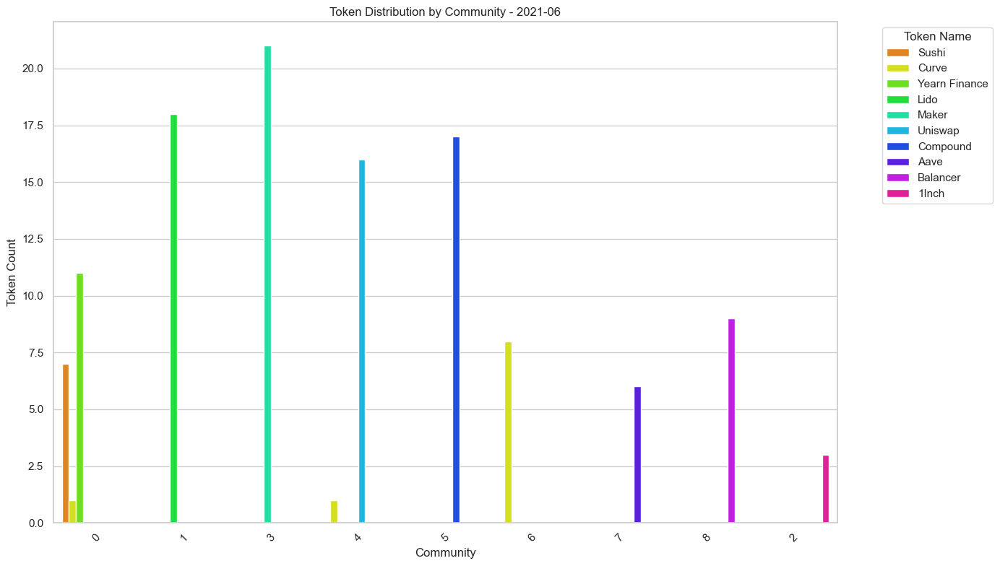

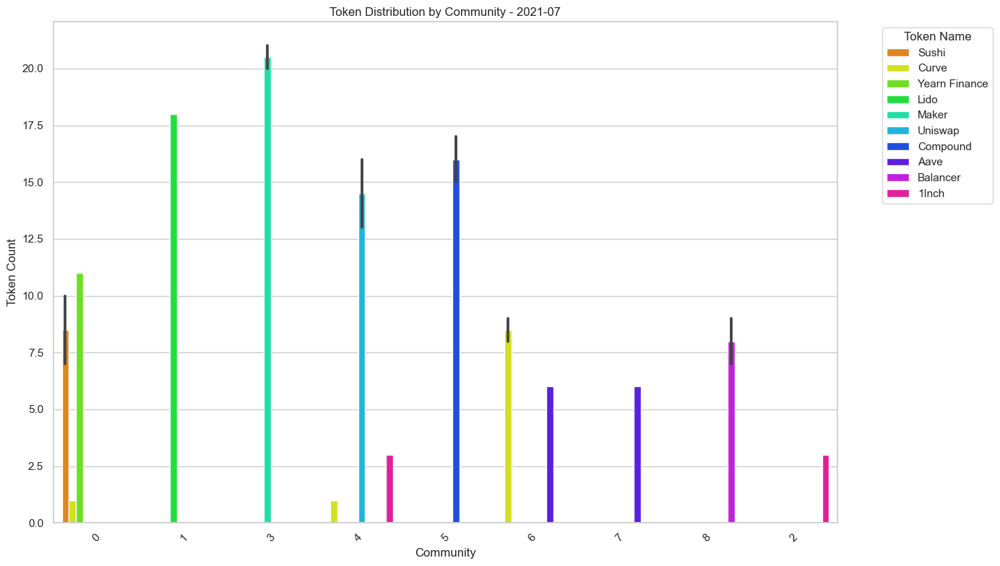

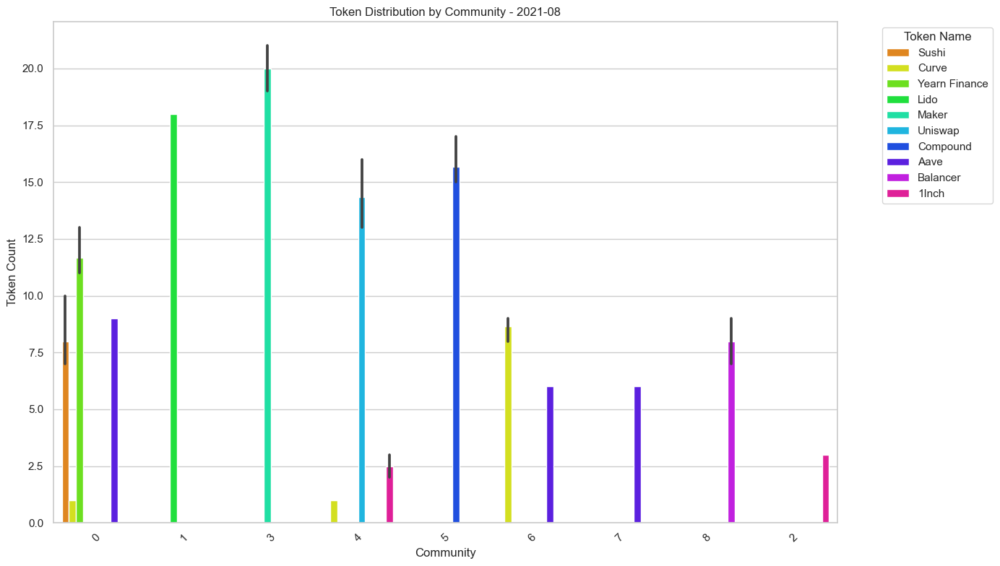

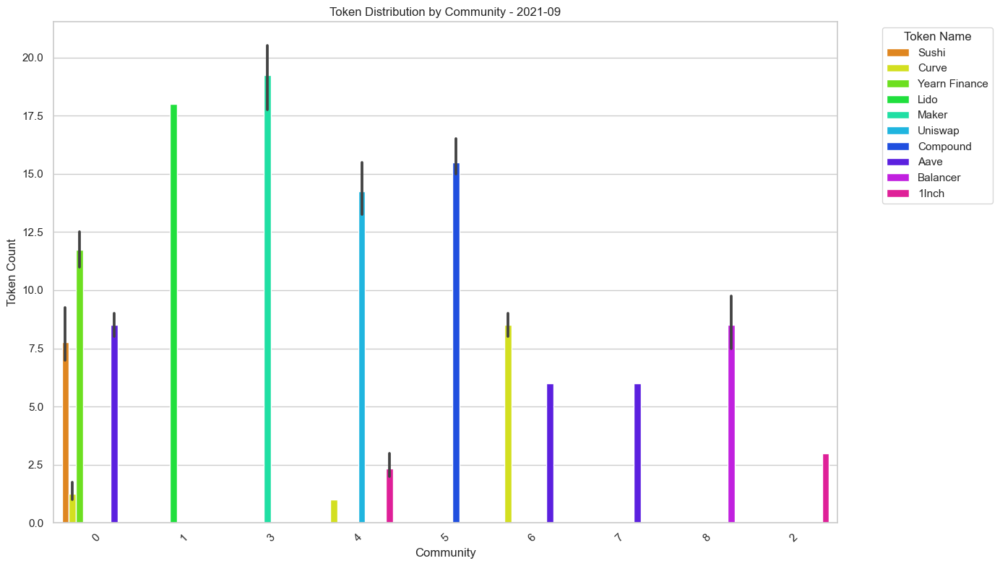

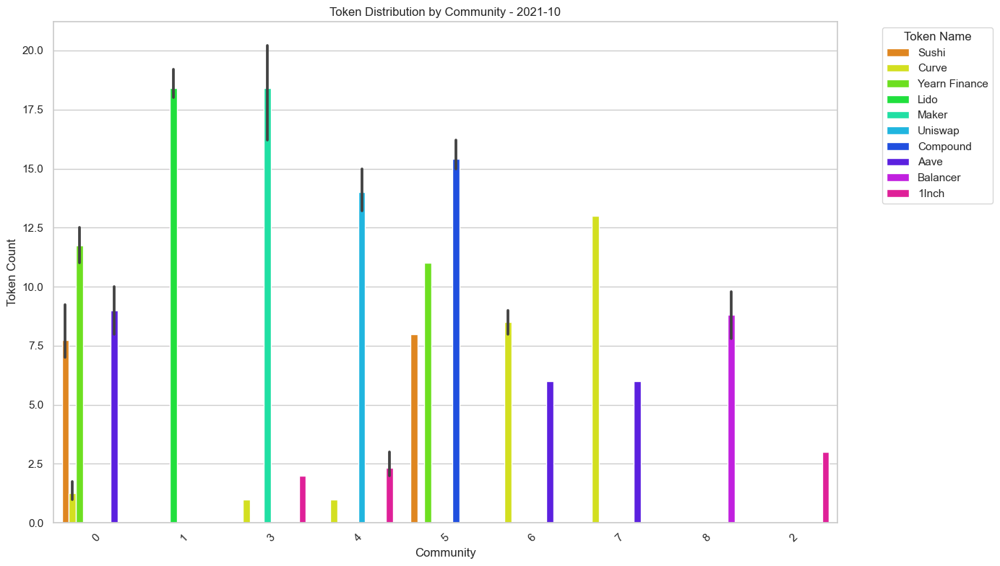

...

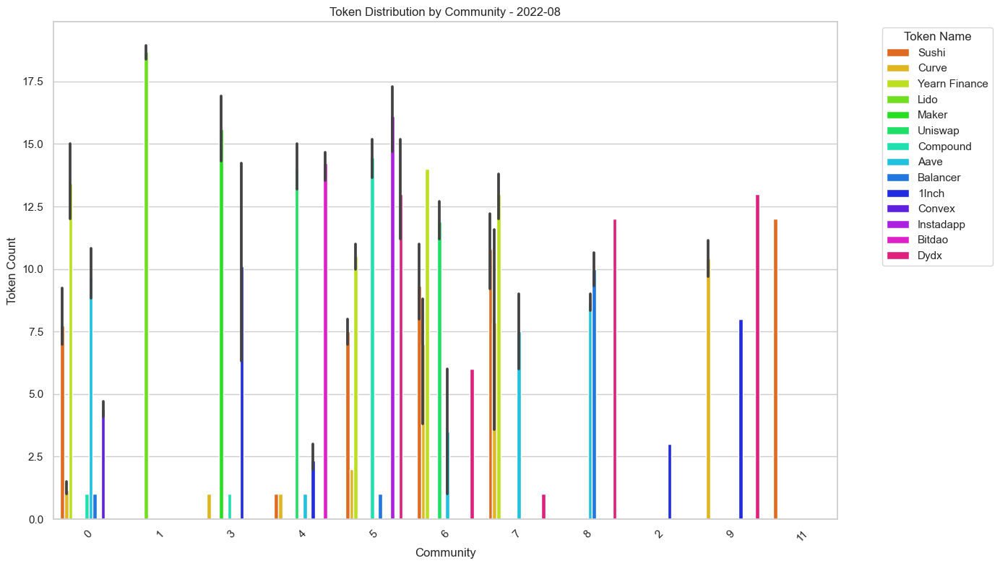

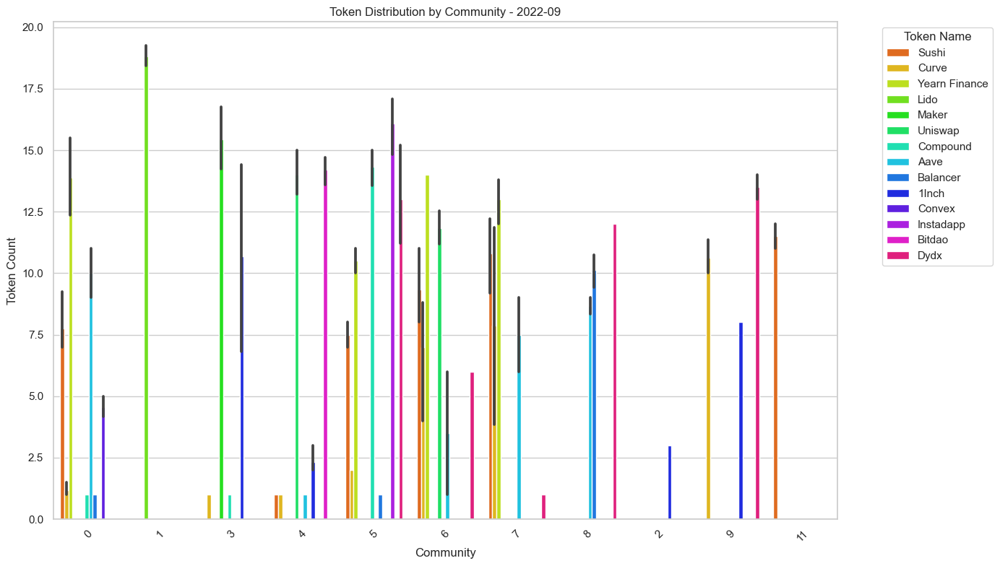

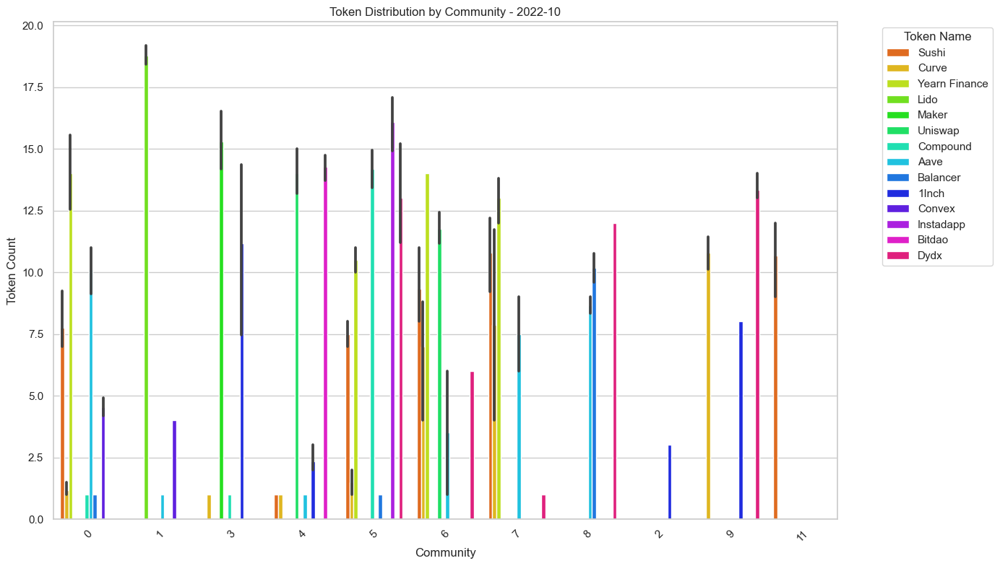

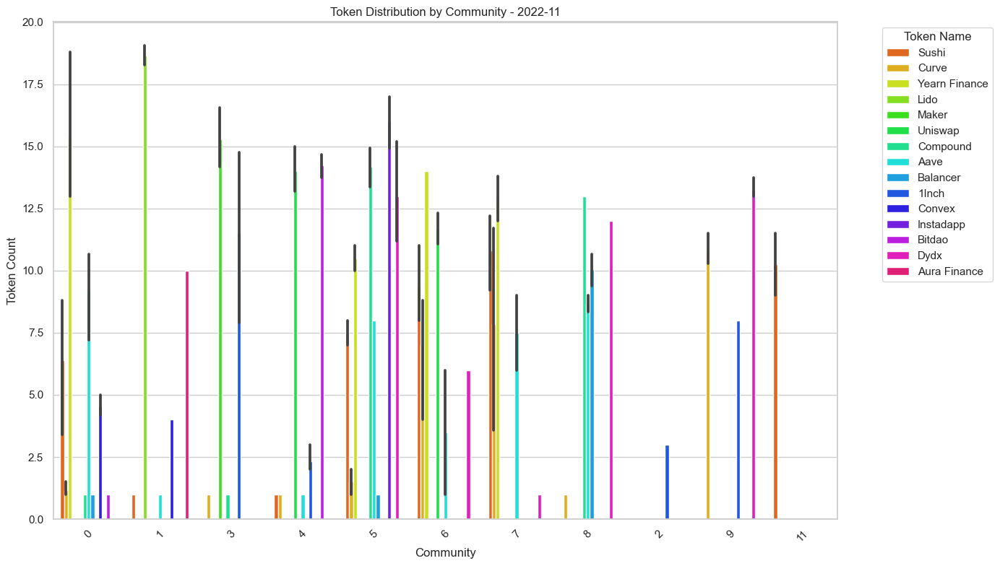

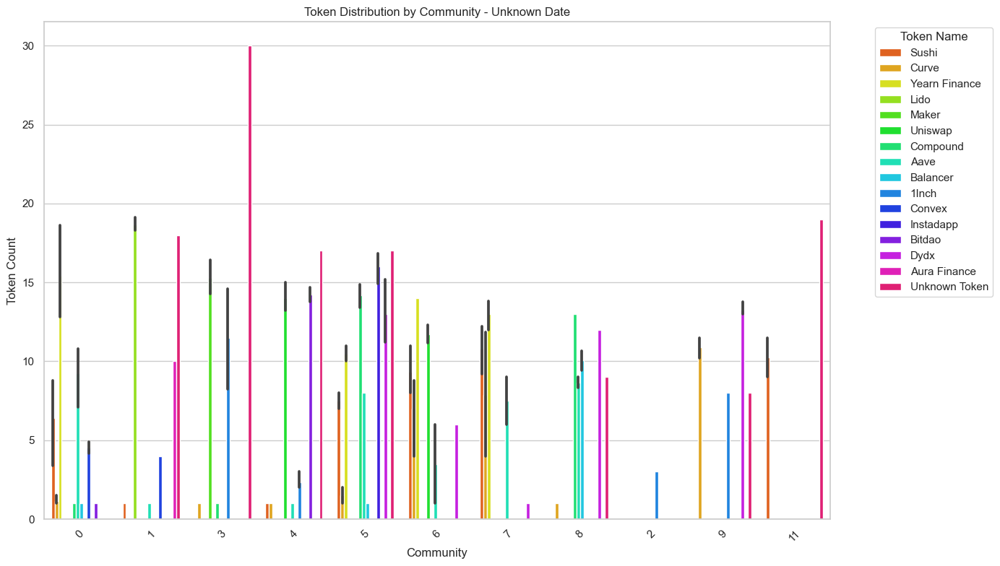

  Snapshot Date  Community     Token Name  Count
0       2021-06          0          Sushi      7
1       2021-06          0          Curve      1
2       2021-06          0  Yearn Finance     11
3       2021-06          1           Lido     18
4       2021-06          3          Maker     21


In [43]:
import os
import networkx as nx
import pandas as pd
from os.path import join
from collections import defaultdict
import matplotlib.pyplot as plt
import seaborn as sns

def compute_token_distribution(partition, enriched_G, token_map):
    """Compute the token distribution within each community."""
    community_token_distribution = defaultdict(lambda: defaultdict(int))
    for node, community in partition.items():
        if node in enriched_G:
            token_address = enriched_G.nodes[node].get('token_address', '').lower()
            token_name = token_map.get(token_address, 'Unknown Token')
            community_token_distribution[community][token_name] += 1
    return community_token_distribution

def plot_token_distribution_by_community(df, snapshot_date):
    """Plot the token distribution for a specific snapshot date."""
    # Set the plot style
    sns.set(style="whitegrid")

    # Convert 'Community' to string to avoid sorting issues
    df['Community'] = df['Community'].astype(str)

    # Set up a color palette that stays consistent across snapshots
    unique_tokens = df['Token Name'].unique()
    palette = sns.color_palette("hsv", len(unique_tokens))
    color_map = {token: palette[i] for i, token in enumerate(unique_tokens)}

    # Create the plot
    plt.figure(figsize=(14, 8))
    sns.barplot(
        data=df, 
        x='Community', 
        y='Count', 
        hue='Token Name', 
        palette=color_map
    )

    plt.title(f'Token Distribution by Community - {snapshot_date}')
    plt.xlabel('Community')
    plt.ylabel('Token Count')
    plt.legend(title='Token Name', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

def temporal_token_distribution(graph_directory, enriched_graph_directory, token_info_path, snapshot_dates):
    # Load the token mapping
    df_tokens = pd.read_csv(token_info_path)
    df_tokens['address'] = df_tokens['address'].str.lower()
    token_map = df_tokens.set_index('address')['name'].to_dict()

    token_distribution_stats = []
    prev_partition = None

    for filename in sorted(os.listdir(graph_directory)):
        if filename.endswith('.graphml'):
            normal_graph_file = join(graph_directory, filename)
            enriched_graph_file = join(enriched_graph_directory, filename)  # This correctly matches the normal graph filename

            # Check if the enriched graph file exists
            if not os.path.exists(enriched_graph_file):
                print(f"File not found: {enriched_graph_file}")
                continue

            # Load the normal and enriched graphs
            G = nx.read_graphml(normal_graph_file)
            enriched_G = nx.read_graphml(enriched_graph_file)

            # Perform community detection
            partition = community_louvain.best_partition(G)

            # If a previous partition exists, match communities across snapshots
            if prev_partition is not None:
                partition = match_communities_across_snapshots(prev_partition, partition, G)

            # Compute token distribution within communities using the enriched graph
            token_distribution = compute_token_distribution(partition, enriched_G, token_map)

            # Extract snapshot time from filename
            snapshot_id = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            snapshot_date = snapshot_dates.get(snapshot_id, 'Unknown Date')

            # Store the results in a structured format
            for community, tokens in token_distribution.items():
                for token_name, count in tokens.items():
                    token_distribution_stats.append({
                        'Snapshot Date': snapshot_date,
                        'Community': community,
                        'Token Name': token_name,
                        'Count': count
                    })

            # Plot the distribution for the current snapshot
            plot_token_distribution_by_community(pd.DataFrame(token_distribution_stats), snapshot_date)

            # Update the previous partition for the next iteration
            prev_partition = partition

    # Convert the results to a DataFrame for further analysis
    return pd.DataFrame(token_distribution_stats)

# Paths
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'

# Snapshot dates (example)
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Compute the temporal token distribution statistics with token labeling and plot each snapshot
temporal_token_distribution_stats_df = temporal_token_distribution(graph_directory, enriched_graph_directory, token_info_path, snapshot_dates)

# Optionally save the results to a CSV file
output_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/temporal_token_distribution_stats.csv'
temporal_token_distribution_stats_df.to_csv(output_file, index=False)

# Display the first few rows of the token distribution statistics
print(temporal_token_distribution_stats_df.head())


/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_9700/1444891720.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Community'] = df['Community'].astype(str)


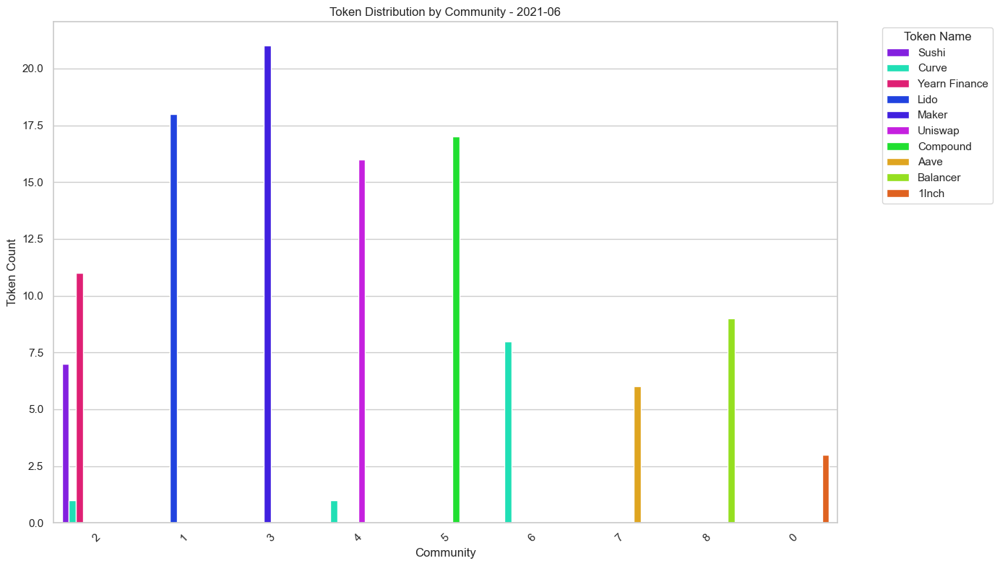

/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_9700/1444891720.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Community'] = df['Community'].astype(str)


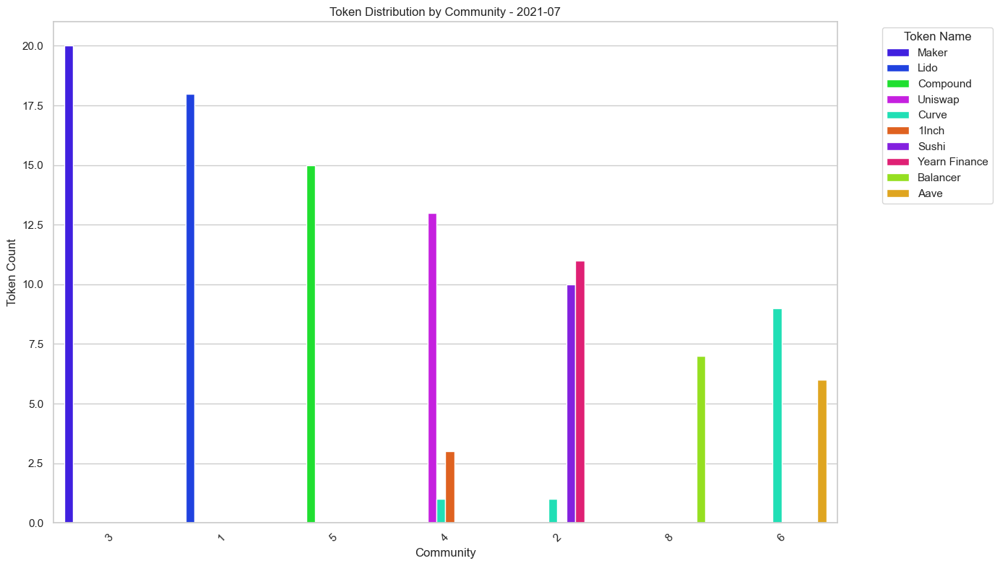

/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_9700/1444891720.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Community'] = df['Community'].astype(str)


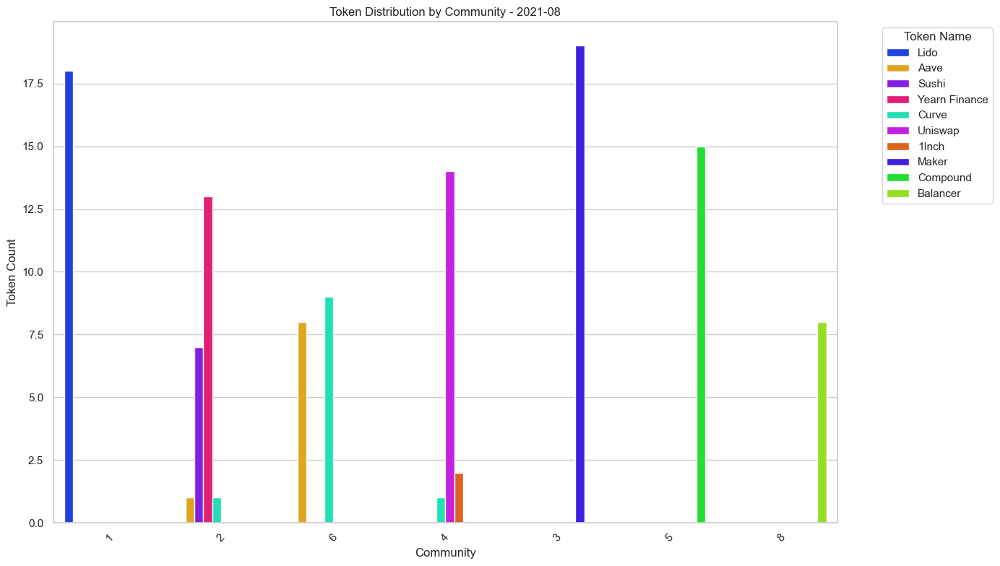

/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_9700/1444891720.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Community'] = df['Community'].astype(str)


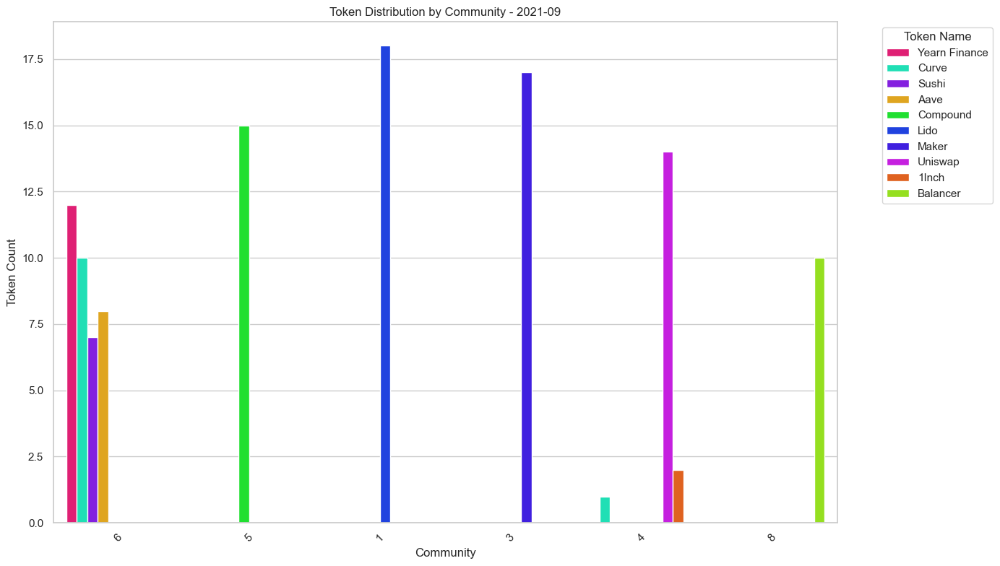

/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_9700/1444891720.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Community'] = df['Community'].astype(str)


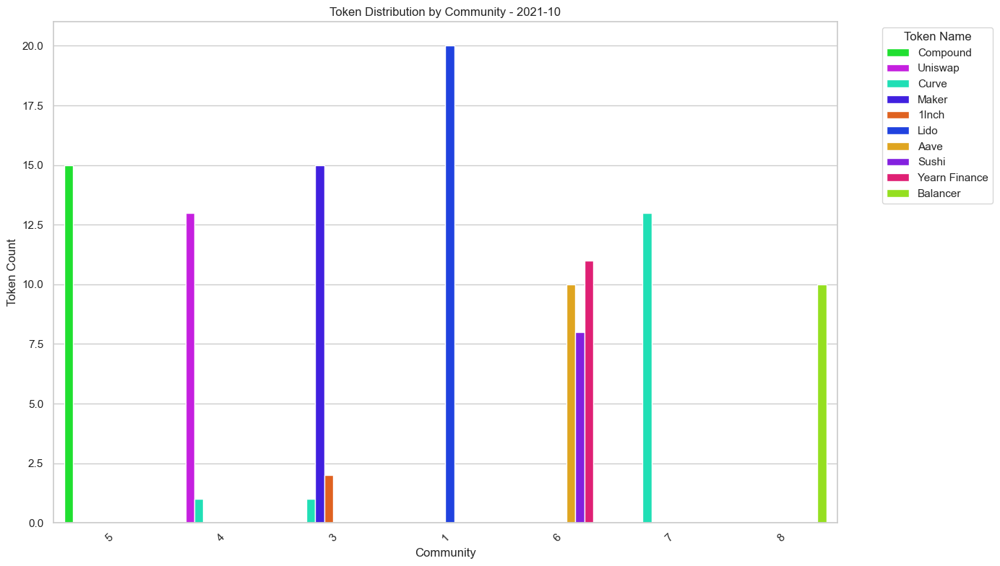

/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_9700/1444891720.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Community'] = df['Community'].astype(str)


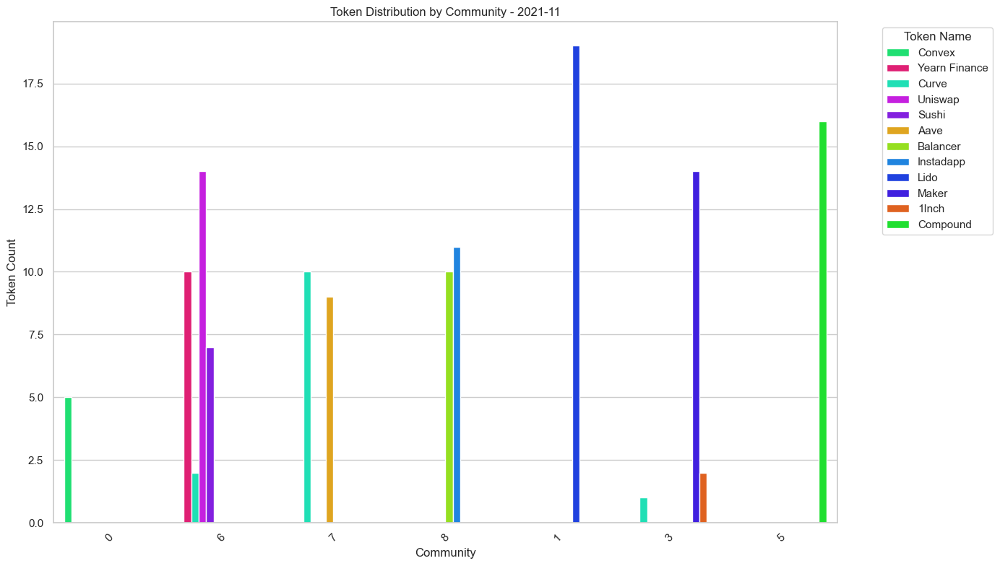

/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_9700/1444891720.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Community'] = df['Community'].astype(str)


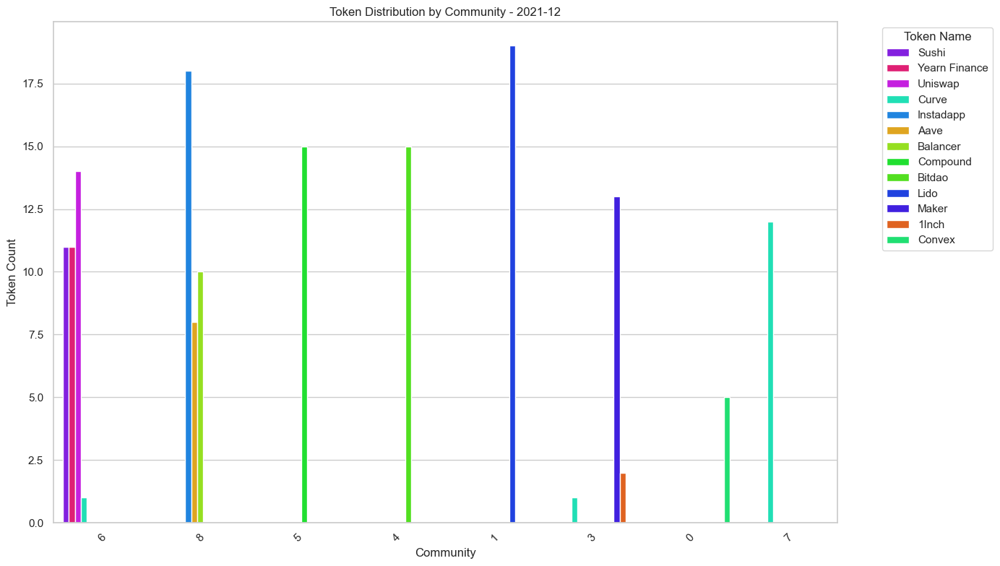

/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_9700/1444891720.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Community'] = df['Community'].astype(str)


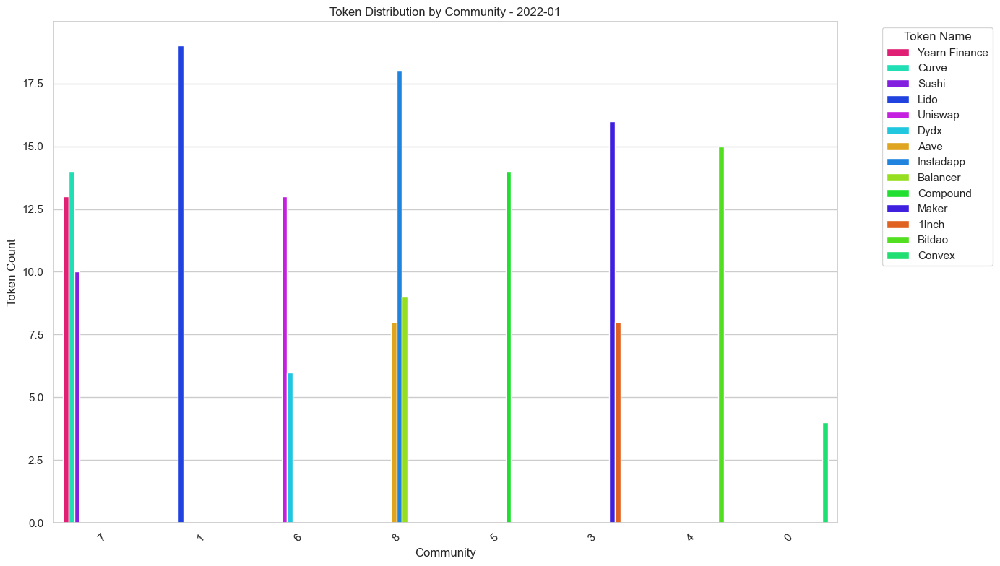

/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_9700/1444891720.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Community'] = df['Community'].astype(str)


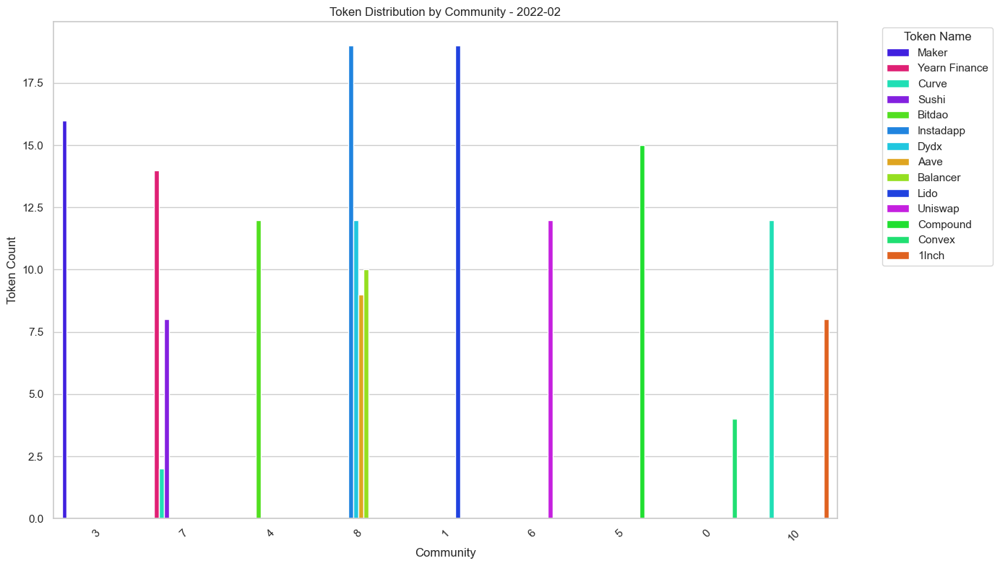

/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_9700/1444891720.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Community'] = df['Community'].astype(str)


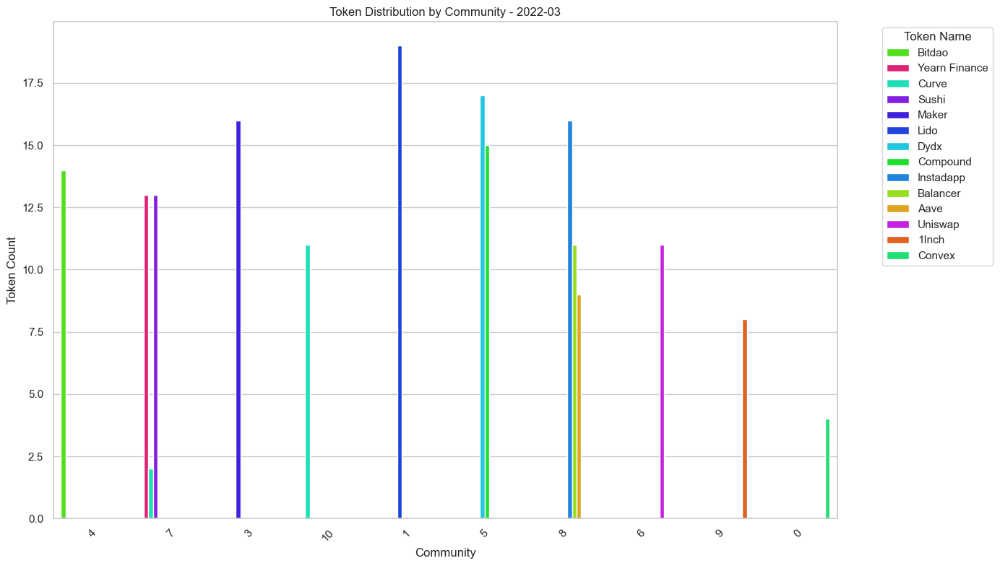

/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_9700/1444891720.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Community'] = df['Community'].astype(str)


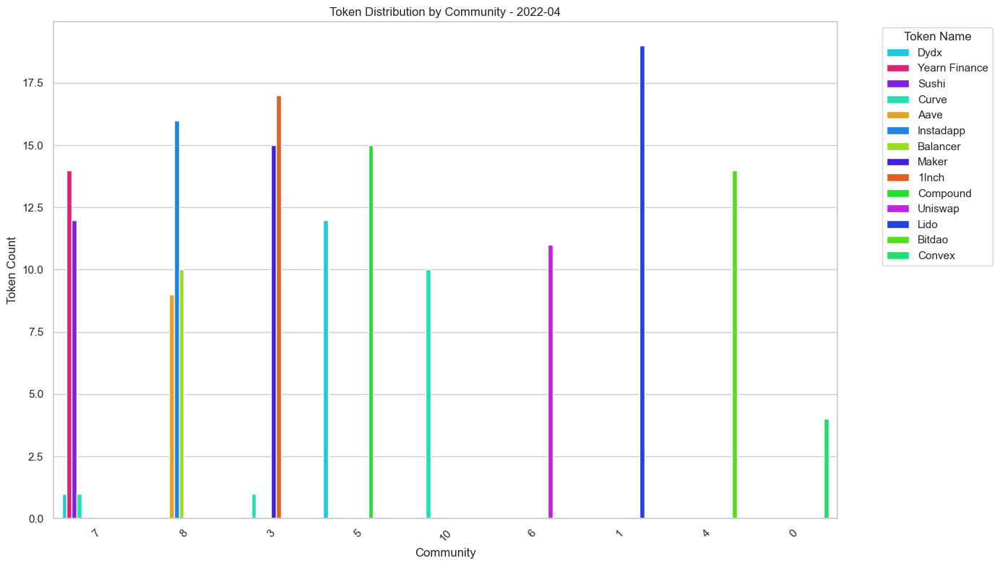

/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_9700/1444891720.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Community'] = df['Community'].astype(str)


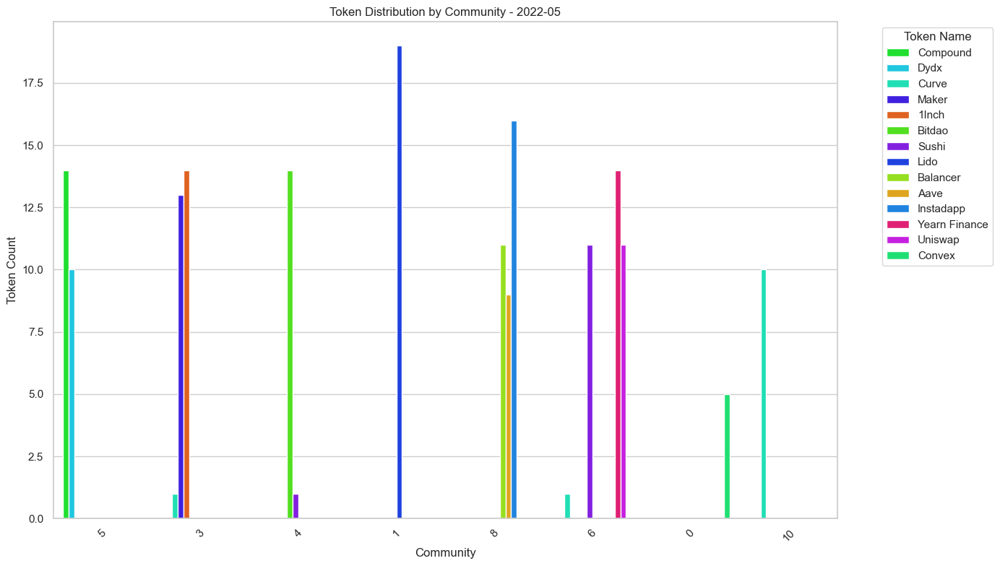

/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_9700/1444891720.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Community'] = df['Community'].astype(str)


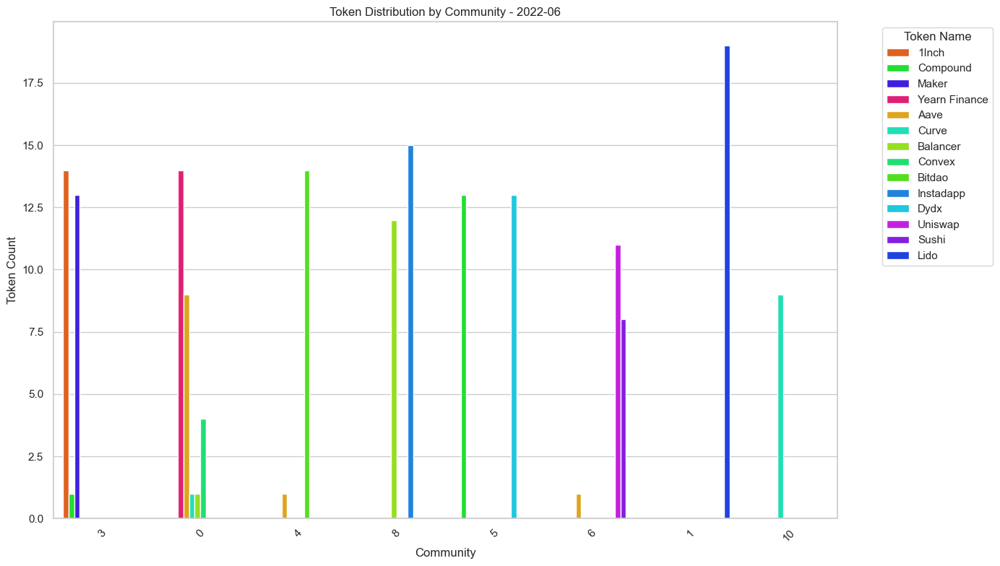

/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_9700/1444891720.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Community'] = df['Community'].astype(str)


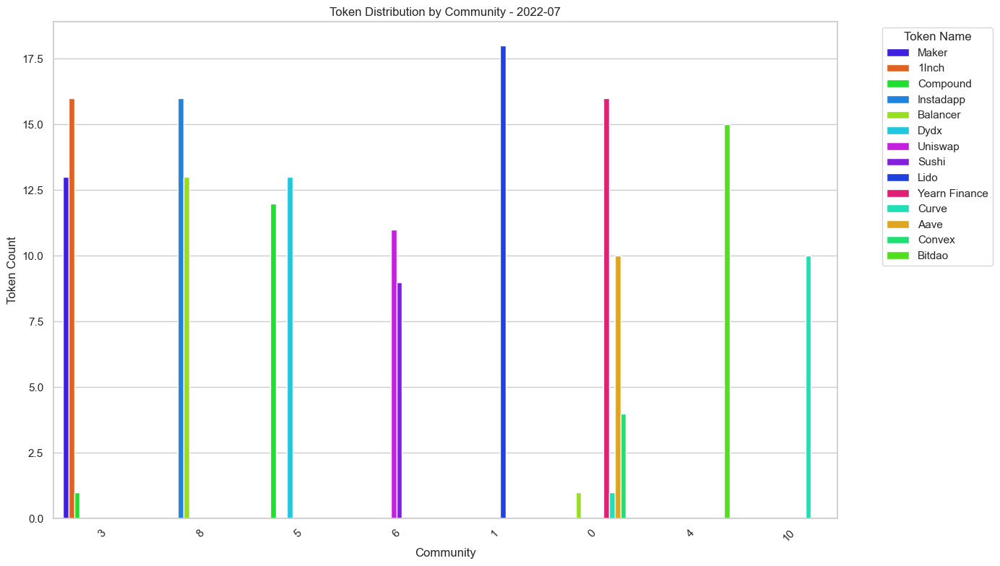

/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_9700/1444891720.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Community'] = df['Community'].astype(str)


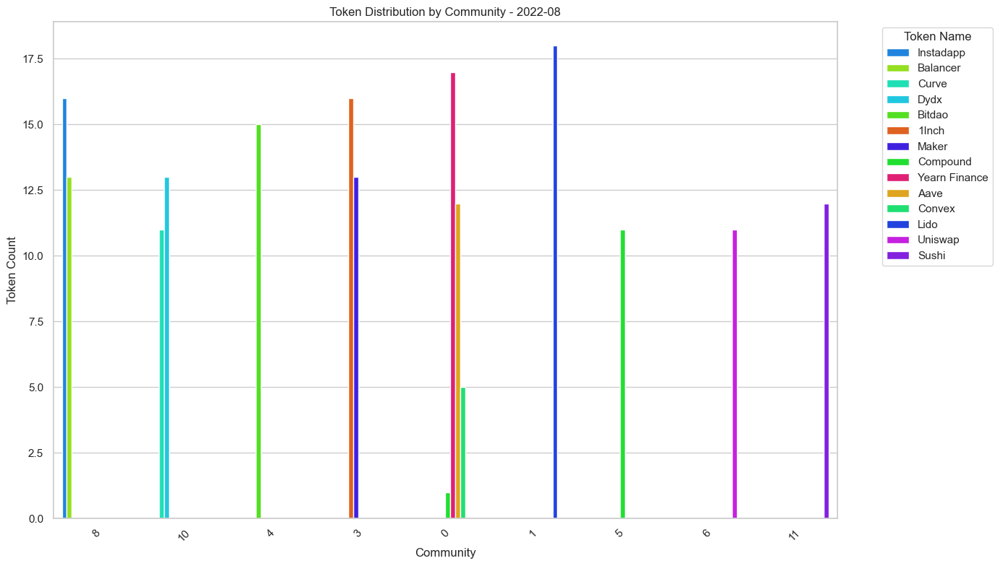

/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_9700/1444891720.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Community'] = df['Community'].astype(str)


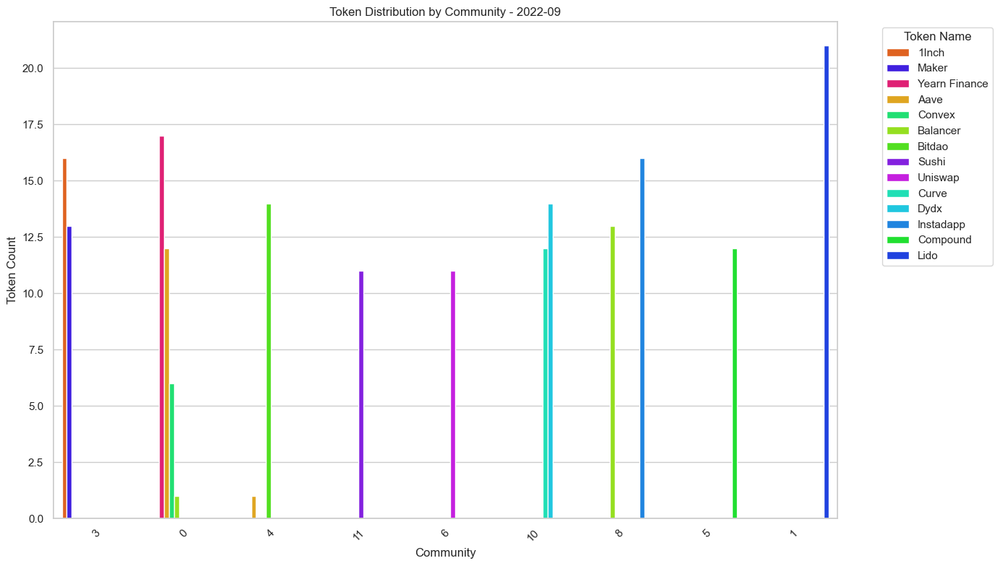

/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_9700/1444891720.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Community'] = df['Community'].astype(str)


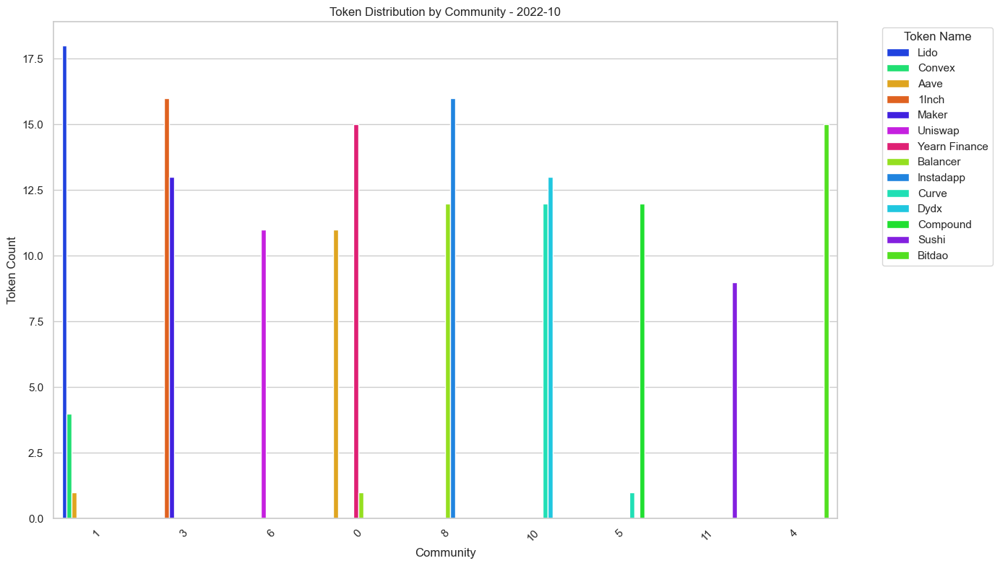

/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_9700/1444891720.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Community'] = df['Community'].astype(str)


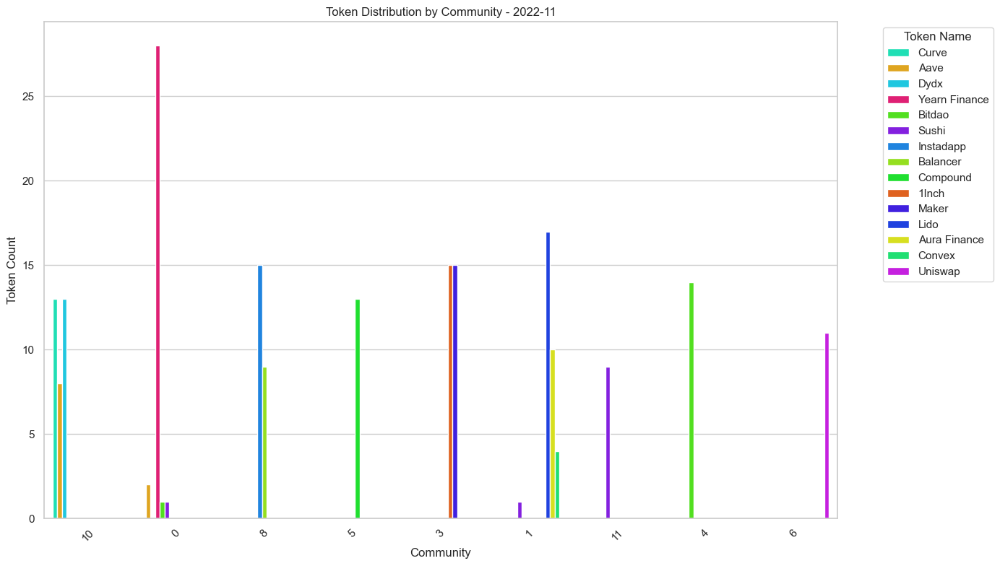

  Snapshot Date  Community     Token Name  Count
0       2021-06          2          Sushi      7
1       2021-06          2          Curve      1
2       2021-06          2  Yearn Finance     11
3       2021-06          1           Lido     18
4       2021-06          3          Maker     21


In [44]:
import os
import networkx as nx
import pandas as pd
from os.path import join
from collections import defaultdict
import matplotlib.pyplot as plt
import seaborn as sns

def compute_token_distribution(partition, enriched_G, token_map):
    """Compute the token distribution within each community."""
    community_token_distribution = defaultdict(lambda: defaultdict(int))
    for node, community in partition.items():
        if node in enriched_G:
            token_address = enriched_G.nodes[node].get('token_address', '').lower()
            token_name = token_map.get(token_address, 'Unknown Token')
            community_token_distribution[community][token_name] += 1
    return community_token_distribution

def plot_token_distribution_by_community(df, snapshot_date, color_map):
    """Plot the token distribution for a specific snapshot date with consistent colors."""
    # Set the plot style
    sns.set(style="whitegrid")

    # Convert 'Community' to string to avoid sorting issues
    df['Community'] = df['Community'].astype(str)

    # Create the plot
    plt.figure(figsize=(14, 8))
    sns.barplot(
        data=df, 
        x='Community', 
        y='Count', 
        hue='Token Name', 
        palette=color_map
    )

    plt.title(f'Token Distribution by Community - {snapshot_date}')
    plt.xlabel('Community')
    plt.ylabel('Token Count')
    plt.legend(title='Token Name', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

def temporal_token_distribution(graph_directory, enriched_graph_directory, token_info_path, snapshot_dates):
    # Load the token mapping
    df_tokens = pd.read_csv(token_info_path)
    df_tokens['address'] = df_tokens['address'].str.lower()
    token_map = df_tokens.set_index('address')['name'].to_dict()

    token_distribution_stats = []
    prev_partition = None

    # To store all unique tokens found across all snapshots
    unique_tokens = set()

    for filename in sorted(os.listdir(graph_directory)):
        if filename.endswith('.graphml'):
            normal_graph_file = join(graph_directory, filename)
            enriched_graph_file = join(enriched_graph_directory, filename)

            # Check if the enriched graph file exists
            if not os.path.exists(enriched_graph_file):
                print(f"File not found: {enriched_graph_file}")
                continue

            # Load the normal and enriched graphs
            G = nx.read_graphml(normal_graph_file)
            enriched_G = nx.read_graphml(enriched_graph_file)

            # Perform community detection
            partition = community_louvain.best_partition(G)

            # If a previous partition exists, match communities across snapshots
            if prev_partition is not None:
                partition = match_communities_across_snapshots(prev_partition, partition, G)

            # Compute token distribution within communities using the enriched graph
            token_distribution = compute_token_distribution(partition, enriched_G, token_map)

            # Extract snapshot time from filename
            snapshot_id = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            snapshot_date = snapshot_dates.get(snapshot_id, 'Unknown Date')

            # Store the results in a structured format
            for community, tokens in token_distribution.items():
                for token_name, count in tokens.items():
                    token_distribution_stats.append({
                        'Snapshot Date': snapshot_date,
                        'Community': community,
                        'Token Name': token_name,
                        'Count': count
                    })
                    # Add the token to the set of unique tokens
                    unique_tokens.add(token_name)

            # Update the previous partition for the next iteration
            prev_partition = partition

    # Create a consistent color map based on unique tokens
    palette = sns.color_palette("hsv", len(unique_tokens))
    color_map = {token: palette[i] for i, token in enumerate(sorted(unique_tokens))}

    # Convert the results to a DataFrame for further analysis
    df = pd.DataFrame(token_distribution_stats)

    # Plot each snapshot using the consistent color map
    for snapshot_date in snapshot_dates.values():
        filtered_df = df[df['Snapshot Date'] == snapshot_date]
        if not filtered_df.empty:
            plot_token_distribution_by_community(filtered_df, snapshot_date, color_map)

    return df

# Paths
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'

# Snapshot dates (example)
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Compute the temporal token distribution statistics with token labeling and plot each snapshot
temporal_token_distribution_stats_df = temporal_token_distribution(graph_directory, enriched_graph_directory, token_info_path, snapshot_dates)

# Optionally save the results to a CSV file
output_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/temporal_token_distribution_stats.csv'
temporal_token_distribution_stats_df.to_csv(output_file, index=False)

# Display the first few rows of the token distribution statistics
print(temporal_token_distribution_stats_df.head())


In [45]:
import os
import networkx as nx
import pandas as pd
from os.path import join
from collections import defaultdict

def compute_token_distribution(partition, enriched_G, token_map):
    """Compute the token distribution within each community."""
    community_token_distribution = defaultdict(lambda: defaultdict(int))
    for node, community in partition.items():
        if node in enriched_G:
            token_address = enriched_G.nodes[node].get('token_address', '').lower()
            token_name = token_map.get(token_address, 'Unknown Token')
            community_token_distribution[community][token_name] += 1
    return community_token_distribution

def temporal_token_distribution(graph_directory, enriched_graph_directory, token_info_path, snapshot_dates, output_directory):
    # Load the token mapping
    df_tokens = pd.read_csv(token_info_path)
    df_tokens['address'] = df_tokens['address'].str.lower()
    token_map = df_tokens.set_index('address')['name'].to_dict()

    token_distribution_stats = []
    prev_partition = None

    for filename in sorted(os.listdir(graph_directory)):
        if filename.endswith('.graphml'):
            normal_graph_file = join(graph_directory, filename)
            enriched_graph_file = join(enriched_graph_directory, filename)

            # Check if the enriched graph file exists
            if not os.path.exists(enriched_graph_file):
                print(f"File not found: {enriched_graph_file}")
                continue

            # Load the normal and enriched graphs
            G = nx.read_graphml(normal_graph_file)
            enriched_G = nx.read_graphml(enriched_graph_file)

            # Perform community detection
            partition = community_louvain.best_partition(G)

            # If a previous partition exists, match communities across snapshots
            if prev_partition is not None:
                partition = match_communities_across_snapshots(prev_partition, partition, G)

            # Compute token distribution within communities using the enriched graph
            token_distribution = compute_token_distribution(partition, enriched_G, token_map)

            # Extract snapshot time from filename
            snapshot_id = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            snapshot_date = snapshot_dates.get(snapshot_id, 'Unknown Date')

            # Store the results in a structured format
            snapshot_data = []
            for community, tokens in token_distribution.items():
                for token_name, count in tokens.items():
                    snapshot_data.append({
                        'Snapshot Date': snapshot_date,
                        'Community': community,
                        'Token Name': token_name,
                        'Count': count
                    })

            # Convert the snapshot data to a DataFrame
            snapshot_df = pd.DataFrame(snapshot_data)

            # Define the output file name based on the snapshot date
            output_file = join(output_directory, f'token_distribution_{snapshot_date}.csv')

            # Save the snapshot DataFrame to a CSV file
            snapshot_df.to_csv(output_file, index=False)

            # Update the previous partition for the next iteration
            prev_partition = partition

    # Return the full DataFrame with all data combined (if needed)
    return pd.DataFrame(token_distribution_stats)

# Paths
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'
output_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/snapshot_files'
os.makedirs(output_directory, exist_ok=True)  # Create the output directory if it doesn't exist

# Snapshot dates (example)
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Compute the temporal token distribution statistics and save each snapshot to a separate CSV file
temporal_token_distribution_stats_df = temporal_token_distribution(
    graph_directory, enriched_graph_directory, token_info_path, snapshot_dates, output_directory
)

# Display a message indicating completion
print("Snapshot data files have been saved.")


Snapshot data files have been saved.


In [46]:
import os
import networkx as nx
import pandas as pd
from os.path import join
from collections import defaultdict

def compute_token_distribution(partition, enriched_G, token_map):
    """Compute the token distribution within each community."""
    community_token_distribution = defaultdict(lambda: defaultdict(int))
    for node, community in partition.items():
        if node in enriched_G:
            token_address = enriched_G.nodes[node].get('token_address', '').lower()
            token_name = token_map.get(token_address, 'Unknown Token')
            community_token_distribution[community][token_name] += 1
    return community_token_distribution

def calculate_modularity(G, partition):
    """Calculate the modularity of the partition."""
    # Convert partition dictionary to a list of lists for communities
    communities = defaultdict(list)
    for node, community in partition.items():
        communities[community].append(node)
    
    return nx.community.modularity(G, communities.values())

def temporal_token_distribution(graph_directory, enriched_graph_directory, token_info_path, snapshot_dates, output_directory):
    # Load the token mapping
    df_tokens = pd.read_csv(token_info_path)
    df_tokens['address'] = df_tokens['address'].str.lower()
    token_map = df_tokens.set_index('address')['name'].to_dict()

    token_distribution_stats = []
    modularity_scores = {}
    prev_partition = None

    for filename in sorted(os.listdir(graph_directory)):
        if filename.endswith('.graphml'):
            normal_graph_file = join(graph_directory, filename)
            enriched_graph_file = join(enriched_graph_directory, filename)

            # Check if the enriched graph file exists
            if not os.path.exists(enriched_graph_file):
                print(f"File not found: {enriched_graph_file}")
                continue

            # Load the normal and enriched graphs
            G = nx.read_graphml(normal_graph_file)
            enriched_G = nx.read_graphml(enriched_graph_file)

            # Perform community detection
            partition = community_louvain.best_partition(G)

            # If a previous partition exists, match communities across snapshots
            if prev_partition is not None:
                partition = match_communities_across_snapshots(prev_partition, partition, G)

            # Compute modularity score for the current partition
            modularity_score = calculate_modularity(G, partition)
            snapshot_id = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            snapshot_date = snapshot_dates.get(snapshot_id, 'Unknown Date')
            modularity_scores[snapshot_date] = modularity_score

            print(f"Modularity for {snapshot_date}: {modularity_score}")

            # Compute token distribution within communities using the enriched graph
            token_distribution = compute_token_distribution(partition, enriched_G, token_map)

            # Store the results in a structured format
            snapshot_data = []
            for community, tokens in token_distribution.items():
                for token_name, count in tokens.items():
                    snapshot_data.append({
                        'Snapshot Date': snapshot_date,
                        'Community': community,
                        'Token Name': token_name,
                        'Count': count
                    })

            # Convert the snapshot data to a DataFrame
            snapshot_df = pd.DataFrame(snapshot_data)

            # Define the output file name based on the snapshot date
            output_file = join(output_directory, f'token_distribution_{snapshot_date}.csv')

            # Save the snapshot DataFrame to a CSV file
            snapshot_df.to_csv(output_file, index=False)

            # Update the previous partition for the next iteration
            prev_partition = partition

    # Return the full DataFrame with all data combined and modularity scores (if needed)
    return pd.DataFrame(token_distribution_stats), modularity_scores

# Paths
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'
output_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/snapshot_files'
os.makedirs(output_directory, exist_ok=True)  # Create the output directory if it doesn't exist

# Snapshot dates (example)
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Compute the temporal token distribution statistics and modularity scores
temporal_token_distribution_stats_df, modularity_scores = temporal_token_distribution(
    graph_directory, enriched_graph_directory, token_info_path, snapshot_dates, output_directory
)

# Optionally save the results to a CSV file
output_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/temporal_token_distribution_stats.csv'
temporal_token_distribution_stats_df.to_csv(output_file, index=False)

# Save modularity scores to a CSV file
modularity_output_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/modularity_scores.csv'
modularity_df = pd.DataFrame(list(modularity_scores.items()), columns=['Snapshot Date', 'Modularity'])
modularity_df.to_csv(modularity_output_file, index=False)

# Display a message indicating completion
print("Snapshot data files and modularity scores have been saved.")



Modularity for 2021-06: 0.7615959696750884
Modularity for 2021-07: 0.7504303441704657
Modularity for 2021-08: 0.7235383712705761
Modularity for 2021-09: 0.7361297553728056
Modularity for 2021-10: 0.7429866759240892
Modularity for 2021-11: 0.7412656230273955
Modularity for 2021-12: 0.7535779293043608
Modularity for 2022-01: 0.7580506622637158
Modularity for 2022-02: 0.7875447135608795
Modularity for 2022-03: 0.7336144827273183
Modularity for 2022-04: 0.7336625922200146
Modularity for 2022-05: 0.7092856566829567
Modularity for 2022-06: 0.7412813603847375
Modularity for 2022-07: 0.7546684934560899
Modularity for 2022-08: 0.7527724302555348
Modularity for 2022-09: 0.7678365599064062
Modularity for 2022-10: 0.7297351126833507
Modularity for 2022-11: 0.7063016868523861
Modularity for Unknown Date: 0.7345043985486521
Snapshot data files and modularity scores have been saved.


In [47]:
import os
import networkx as nx
import pandas as pd
from os.path import join
from collections import defaultdict

def compute_token_distribution(partition, enriched_G, token_map):
    """Compute the token distribution within each community."""
    community_token_distribution = defaultdict(lambda: defaultdict(int))
    for node, community in partition.items():
        if node in enriched_G:
            token_address = enriched_G.nodes[node].get('token_address', '').lower()
            token_name = token_map.get(token_address, 'Unknown Token')
            community_token_distribution[community][token_name] += 1
    return community_token_distribution

def calculate_modularity(G, partition):
    """Calculate the modularity of the partition."""
    # Convert partition dictionary to a list of lists for communities
    communities = defaultdict(list)
    for node, community in partition.items():
        communities[community].append(node)
    
    return nx.community.modularity(G, communities.values())

def temporal_token_distribution(graph_directory, enriched_graph_directory, token_info_path, snapshot_dates, output_directory):
    # Load the token mapping
    df_tokens = pd.read_csv(token_info_path)
    df_tokens['address'] = df_tokens['address'].str.lower()
    token_map = df_tokens.set_index('address')['name'].to_dict()

    token_distribution_stats = []
    modularity_scores_temporal = {}
    modularity_scores_non_temporal = {}
    prev_partition = None

    for filename in sorted(os.listdir(graph_directory)):
        if filename.endswith('.graphml'):
            normal_graph_file = join(graph_directory, filename)
            enriched_graph_file = join(enriched_graph_directory, filename)

            # Check if the enriched graph file exists
            if not os.path.exists(enriched_graph_file):
                print(f"File not found: {enriched_graph_file}")
                continue

            # Load the normal and enriched graphs
            G = nx.read_graphml(normal_graph_file)
            enriched_G = nx.read_graphml(enriched_graph_file)

            # Perform community detection
            partition = community_louvain.best_partition(G)

            # Non-temporal modularity (community detection independent for each snapshot)
            modularity_score_non_temporal = calculate_modularity(G, partition)

            # Temporal modularity (matching communities across snapshots)
            if prev_partition is not None:
                partition = match_communities_across_snapshots(prev_partition, partition, G)
            modularity_score_temporal = calculate_modularity(G, partition)

            # Extract snapshot time from filename
            snapshot_id = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            snapshot_date = snapshot_dates.get(snapshot_id, 'Unknown Date')

            # Store the modularity scores
            modularity_scores_non_temporal[snapshot_date] = modularity_score_non_temporal
            modularity_scores_temporal[snapshot_date] = modularity_score_temporal

            print(f"Snapshot Date: {snapshot_date}")
            print(f"Non-Temporal Modularity: {modularity_score_non_temporal}")
            print(f"Temporal Modularity: {modularity_score_temporal}")

            # Compute token distribution within communities using the enriched graph
            token_distribution = compute_token_distribution(partition, enriched_G, token_map)

            # Store the results in a structured format
            snapshot_data = []
            for community, tokens in token_distribution.items():
                for token_name, count in tokens.items():
                    snapshot_data.append({
                        'Snapshot Date': snapshot_date,
                        'Community': community,
                        'Token Name': token_name,
                        'Count': count
                    })

            # Convert the snapshot data to a DataFrame
            snapshot_df = pd.DataFrame(snapshot_data)

            # Define the output file name based on the snapshot date
            output_file = join(output_directory, f'token_distribution_{snapshot_date}.csv')

            # Save the snapshot DataFrame to a CSV file
            snapshot_df.to_csv(output_file, index=False)

            # Update the previous partition for the next iteration
            prev_partition = partition

    # Return the full DataFrame with all data combined and modularity scores
    return pd.DataFrame(token_distribution_stats), modularity_scores_temporal, modularity_scores_non_temporal

# Paths
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'
output_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/snapshot_files'
os.makedirs(output_directory, exist_ok=True)  # Create the output directory if it doesn't exist

# Snapshot dates (example)
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Compute the temporal token distribution statistics and modularity scores
temporal_token_distribution_stats_df, modularity_scores_temporal, modularity_scores_non_temporal = temporal_token_distribution(
    graph_directory, enriched_graph_directory, token_info_path, snapshot_dates, output_directory
)

# Optionally save the results to a CSV file
output_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/temporal_token_distribution_stats.csv'
temporal_token_distribution_stats_df.to_csv(output_file, index=False)

# Save modularity scores to a CSV file
modularity_output_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/modularity_scores_comparison.csv'
modularity_comparison_df = pd.DataFrame({
    'Snapshot Date': snapshot_dates.values(),
    'Non-Temporal Modularity': [modularity_scores_non_temporal[date] for date in snapshot_dates.values()],
    'Temporal Modularity': [modularity_scores_temporal[date] for date in snapshot_dates.values()]
})
modularity_comparison_df.to_csv(modularity_output_file, index=False)

# Display a message indicating completion
print("Snapshot data files and modularity score comparisons have been saved.")


Snapshot Date: 2021-06
Non-Temporal Modularity: 0.7615959696750884
Temporal Modularity: 0.7615959696750884
Snapshot Date: 2021-07
Non-Temporal Modularity: 0.7504303441704657
Temporal Modularity: 0.7504303441704657
Snapshot Date: 2021-08
Non-Temporal Modularity: 0.7283609021347738
Temporal Modularity: 0.7235383712705761
Snapshot Date: 2021-09
Non-Temporal Modularity: 0.7397789623219382
Temporal Modularity: 0.7361297553728056
Snapshot Date: 2021-10
Non-Temporal Modularity: 0.7600343847120281
Temporal Modularity: 0.7274887588441448
Snapshot Date: 2021-11
Non-Temporal Modularity: 0.754210958212347
Temporal Modularity: 0.6893220552960485
Snapshot Date: 2021-12
Non-Temporal Modularity: 0.796289877898496
Temporal Modularity: 0.6955761782606509
Snapshot Date: 2022-01
Non-Temporal Modularity: 0.8361898894001384
Temporal Modularity: 0.807457902851801
Snapshot Date: 2022-02
Non-Temporal Modularity: 0.8398619671066639
Temporal Modularity: 0.8047970568450211
Snapshot Date: 2022-03
Non-Temporal Modu

In [48]:
import os
import networkx as nx
import pandas as pd
from os.path import join
from collections import defaultdict

def compute_community_sizes(partition):
    """Compute the size of each community."""
    community_sizes = defaultdict(int)
    for community in partition.values():
        community_sizes[community] += 1
    return community_sizes

def track_community_growth(graph_directory, enriched_graph_directory, token_info_path, snapshot_dates, output_directory):
    # Load the token mapping
    df_tokens = pd.read_csv(token_info_path)
    df_tokens['address'] = df_tokens['address'].str.lower()
    token_map = df_tokens.set_index('address')['name'].to_dict()

    community_growth = defaultdict(list)
    prev_partition = None
    prev_community_sizes = None

    for filename in sorted(os.listdir(graph_directory)):
        if filename.endswith('.graphml'):
            normal_graph_file = join(graph_directory, filename)
            enriched_graph_file = join(enriched_graph_directory, filename)

            # Check if the enriched graph file exists
            if not os.path.exists(enriched_graph_file):
                print(f"File not found: {enriched_graph_file}")
                continue

            # Load the normal and enriched graphs
            G = nx.read_graphml(normal_graph_file)
            enriched_G = nx.read_graphml(enriched_graph_file)

            # Perform community detection
            partition = community_louvain.best_partition(G)

            # Temporal community matching
            if prev_partition is not None:
                partition = match_communities_across_snapshots(prev_partition, partition, G)

            # Calculate community sizes
            community_sizes = compute_community_sizes(partition)

            # Track growth compared to the previous snapshot
            snapshot_id = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            snapshot_date = snapshot_dates.get(snapshot_id, 'Unknown Date')

            if prev_community_sizes is not None:
                for community, size in community_sizes.items():
                    growth = size - prev_community_sizes.get(community, 0)
                    community_growth[community].append({
                        'Snapshot Date': snapshot_date,
                        'Size': size,
                        'Growth': growth
                    })
            else:
                for community, size in community_sizes.items():
                    community_growth[community].append({
                        'Snapshot Date': snapshot_date,
                        'Size': size,
                        'Growth': size  # Initial growth is just the size since there is no previous data
                    })

            # Update the previous partition and sizes for the next iteration
            prev_partition = partition
            prev_community_sizes = community_sizes

    # Convert community growth data to a DataFrame for further analysis
    growth_data = []
    for community, growth_list in community_growth.items():
        for entry in growth_list:
            growth_data.append({
                'Community': community,
                **entry
            })

    growth_df = pd.DataFrame(growth_data)

    # Save the growth data to a CSV file
    growth_output_file = join(output_directory, 'community_growth_tracking.csv')
    growth_df.to_csv(growth_output_file, index=False)

    return growth_df

# Paths
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'
output_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/community_growth'
os.makedirs(output_directory, exist_ok=True)  # Create the output directory if it doesn't exist

# Snapshot dates (example)
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Track community growth and save the data
community_growth_df = track_community_growth(
    graph_directory, enriched_graph_directory, token_info_path, snapshot_dates, output_directory
)

# Display the first few rows of the community growth data
print(community_growth_df.head())


   Community Snapshot Date  Size  Growth
0          0       2021-06    19      19
1          0       2021-07    22       3
2          0       2021-08    22       0
3          0       2021-09    22       0
4          0       2021-11     5       5


In [49]:
import os
import networkx as nx
import pandas as pd
from os.path import join
from collections import defaultdict

def compute_community_sizes(partition):
    """Compute the size of each community."""
    community_sizes = defaultdict(int)
    for community in partition.values():
        community_sizes[community] += 1
    return community_sizes

def track_community_growth(graph_directory, enriched_graph_directory, token_info_path, snapshot_dates, output_directory):
    # Load the token mapping
    df_tokens = pd.read_csv(token_info_path)
    df_tokens['address'] = df_tokens['address'].str.lower()
    token_map = df_tokens.set_index('address')['name'].to_dict()

    community_growth = defaultdict(list)
    prev_partition = None
    prev_community_sizes = None

    for filename in sorted(os.listdir(graph_directory)):
        if filename.endswith('.graphml'):
            normal_graph_file = join(graph_directory, filename)
            enriched_graph_file = join(enriched_graph_directory, filename)

            # Check if the enriched graph file exists
            if not os.path.exists(enriched_graph_file):
                print(f"File not found: {enriched_graph_file}")
                continue

            # Load the normal and enriched graphs
            G = nx.read_graphml(normal_graph_file)
            enriched_G = nx.read_graphml(enriched_graph_file)

            # Perform community detection
            partition = community_louvain.best_partition(G)

            # Temporal community matching
            if prev_partition is not None:
                partition = match_communities_across_snapshots(prev_partition, partition, G)

            # Calculate community sizes
            community_sizes = compute_community_sizes(partition)

            # Track growth compared to the previous snapshot
            snapshot_id = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            snapshot_date = snapshot_dates.get(snapshot_id, 'Unknown Date')

            if prev_community_sizes is not None:
                for community, size in community_sizes.items():
                    growth = size - prev_community_sizes.get(community, 0)
                    community_growth[community].append({
                        'Snapshot Date': snapshot_date,
                        'Size': size,
                        'Growth': growth
                    })
            else:
                for community, size in community_sizes.items():
                    community_growth[community].append({
                        'Snapshot Date': snapshot_date,
                        'Size': size,
                        'Growth': size  # Initial growth is just the size since there is no previous data
                    })

            # Update the previous partition and sizes for the next iteration
            prev_partition = partition
            prev_community_sizes = community_sizes

    # Convert community growth data to a DataFrame for further analysis
    growth_data = []
    for community, growth_list in community_growth.items():
        for entry in growth_list:
            growth_data.append({
                'Community': community,
                **entry
            })

    growth_df = pd.DataFrame(growth_data)

    # Sort by community and snapshot date for better readability
    growth_df.sort_values(by=['Community', 'Snapshot Date'], inplace=True)

    # Format the output for better readability
    growth_df['Growth'] = growth_df['Growth'].map('{:+}'.format)  # Add a sign to the growth values
    growth_df['Size'] = growth_df['Size'].map('{:,}'.format)  # Add commas for better readability

    # Save the growth data to a CSV file
    growth_output_file = join(output_directory, 'community_growth_tracking.csv')
    growth_df.to_csv(growth_output_file, index=False)

    # Display the first few rows of the growth DataFrame to the user
    pd.set_option('display.max_columns', None)  # Ensure all columns are shown
    pd.set_option('display.float_format', '{:.0f}'.format)  # Avoid scientific notation in floats
    print(growth_df.head(20))  # Display the first 20 rows to give a good sense of the data

    return growth_df

# Paths
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'
output_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/community_growth'
os.makedirs(output_directory, exist_ok=True)  # Create the output directory if it doesn't exist

# Snapshot dates (example)
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Track community growth and save the data
community_growth_df = track_community_growth(
    graph_directory, enriched_graph_directory, token_info_path, snapshot_dates, output_directory
)

# Optionally save the DataFrame to CSV (already done within the function)


    Community Snapshot Date Size Growth
0           0       2021-06   19    +19
1           0       2021-07   22     +3
2           0       2021-08   22     +0
3           0       2021-09   22     +0
4           0       2021-11    5     +5
5           0       2021-12    5     +0
6           0       2022-01    4     -1
7           0       2022-02    4     +0
8           0       2022-03    4     +0
9           0       2022-04    4     +0
10          0       2022-05    5     +1
11          0       2022-06   29    +24
12          0       2022-07   32     +3
13          0       2022-08   35     +3
14          0       2022-09   36     +1
15          0       2022-10   27     -9
16          0       2022-11   32     +5
17          1       2021-06   18    +18
18          1       2021-07   18     +0
19          1       2021-08   18     +0


In [50]:
import os
import networkx as nx
import pandas as pd
from os.path import join
from collections import defaultdict

def compute_community_sizes(partition):
    """Compute the size of each community."""
    community_sizes = defaultdict(int)
    for community in partition.values():
        community_sizes[community] += 1
    return community_sizes

def track_community_growth(graph_directory, enriched_graph_directory, token_info_path, snapshot_dates, output_directory):
    # Load the token mapping
    df_tokens = pd.read_csv(token_info_path)
    df_tokens['address'] = df_tokens['address'].str.lower()
    token_map = df_tokens.set_index('address')['name'].to_dict()

    community_growth = defaultdict(list)
    prev_partition = None
    prev_community_sizes = None

    for filename in sorted(os.listdir(graph_directory)):
        if filename.endswith('.graphml'):
            normal_graph_file = join(graph_directory, filename)
            enriched_graph_file = join(enriched_graph_directory, filename)

            # Check if the enriched graph file exists
            if not os.path.exists(enriched_graph_file):
                print(f"File not found: {enriched_graph_file}")
                continue

            # Load the normal and enriched graphs
            G = nx.read_graphml(normal_graph_file)
            enriched_G = nx.read_graphml(enriched_graph_file)

            # Perform community detection
            partition = community_louvain.best_partition(G)

            # Temporal community matching
            if prev_partition is not None:
                partition = match_communities_across_snapshots(prev_partition, partition, G)

            # Calculate community sizes
            community_sizes = compute_community_sizes(partition)

            # Track growth compared to the previous snapshot
            snapshot_id = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            snapshot_date = snapshot_dates.get(snapshot_id, 'Unknown Date')

            if prev_community_sizes is not None:
                for community, size in community_sizes.items():
                    growth = size - prev_community_sizes.get(community, 0)
                    community_growth[community].append({
                        'Snapshot Date': snapshot_date,
                        'Size': size,
                        'Growth': growth
                    })
            else:
                for community, size in community_sizes.items():
                    community_growth[community].append({
                        'Snapshot Date': snapshot_date,
                        'Size': size,
                        'Growth': size  # Initial growth is just the size since there is no previous data
                    })

            # Update the previous partition and sizes for the next iteration
            prev_partition = partition
            prev_community_sizes = community_sizes

    # Convert community growth data to a DataFrame for further analysis
    growth_data = []
    for community, growth_list in community_growth.items():
        for entry in growth_list:
            growth_data.append({
                'Community': community,
                **entry
            })

    growth_df = pd.DataFrame(growth_data)

    # Sort by community and snapshot date for better readability
    growth_df.sort_values(by=['Community', 'Snapshot Date'], inplace=True)

    # Format the output for better readability
    growth_df['Growth'] = growth_df['Growth'].map('{:+}'.format)  # Add a sign to the growth values
    growth_df['Size'] = growth_df['Size'].map('{:,}'.format)  # Add commas for better readability

    # Save the growth data to a CSV file
    growth_output_file = join(output_directory, 'community_growth_tracking.csv')
    growth_df.to_csv(growth_output_file, index=False)

    # Display the first few rows of the growth DataFrame to the user
    pd.set_option('display.max_columns', None)  # Ensure all columns are shown
    pd.set_option('display.float_format', '{:.0f}'.format)  # Avoid scientific notation in floats
    print(growth_df.head(20))  # Display the first 20 rows to give a good sense of the data

    return growth_df

# Paths
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'
output_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final'
os.makedirs(output_directory, exist_ok=True)  # Create the output directory if it doesn't exist

# Snapshot dates (example)
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Track community growth and save the data
community_growth_df = track_community_growth(
    graph_directory, enriched_graph_directory, token_info_path, snapshot_dates, output_directory
)


    Community Snapshot Date Size Growth
0           0       2021-06   19    +19
1           0       2021-07   22     +3
2           0       2021-08   22     +0
3           0       2021-09   22     +0
4           0       2021-11    5     +5
5           0       2021-12    5     +0
6           0       2022-01    4     -1
7           0       2022-02    4     +0
8           0       2022-03    4     +0
9           0       2022-04    4     +0
10          0       2022-05    5     +1
11          0       2022-06   29    +24
12          0       2022-07   32     +3
13          0       2022-08   35     +3
14          0       2022-09   36     +1
15          0       2022-10   27     -9
16          0       2022-11   32     +5
17          1       2021-06   18    +18
18          1       2021-07   18     +0
19          1       2021-08   18     +0


In [51]:
import os
import networkx as nx
import pandas as pd
from os.path import join
from collections import defaultdict

def compute_community_sizes(partition):
    """Compute the size of each community."""
    community_sizes = defaultdict(int)
    for community in partition.values():
        community_sizes[community] += 1
    return community_sizes

def compute_token_distribution(partition, enriched_G, token_map):
    """Compute the token distribution within each community."""
    community_tokens = defaultdict(lambda: defaultdict(int))
    for node, community in partition.items():
        if node in enriched_G:
            token_address = enriched_G.nodes[node].get('token_address', '').lower()
            token_name = token_map.get(token_address, 'Unknown Token')
            community_tokens[community][token_name] += 1
    return community_tokens

def track_community_growth_and_token_changes(graph_directory, enriched_graph_directory, token_info_path, snapshot_dates, output_directory):
    # Load the token mapping
    df_tokens = pd.read_csv(token_info_path)
    df_tokens['address'] = df_tokens['address'].str.lower()
    token_map = df_tokens.set_index('address')['name'].to_dict()

    community_growth = defaultdict(list)
    token_changes = defaultdict(list)
    prev_partition = None
    prev_community_sizes = None
    prev_community_tokens = None

    for filename in sorted(os.listdir(graph_directory)):
        if filename.endswith('.graphml'):
            normal_graph_file = join(graph_directory, filename)
            enriched_graph_file = join(enriched_graph_directory, filename)

            # Check if the enriched graph file exists
            if not os.path.exists(enriched_graph_file):
                print(f"File not found: {enriched_graph_file}")
                continue

            # Load the normal and enriched graphs
            G = nx.read_graphml(normal_graph_file)
            enriched_G = nx.read_graphml(enriched_graph_file)

            # Perform community detection
            partition = community_louvain.best_partition(G)

            # Temporal community matching
            if prev_partition is not None:
                partition = match_communities_across_snapshots(prev_partition, partition, G)

            # Calculate community sizes and token distribution
            community_sizes = compute_community_sizes(partition)
            community_tokens = compute_token_distribution(partition, enriched_G, token_map)

            # Track growth and token changes compared to the previous snapshot
            snapshot_id = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            snapshot_date = snapshot_dates.get(snapshot_id, 'Unknown Date')

            if prev_community_sizes is not None and prev_community_tokens is not None:
                for community, size in community_sizes.items():
                    # Track growth
                    growth = size - prev_community_sizes.get(community, 0)
                    community_growth[community].append({
                        'Snapshot Date': snapshot_date,
                        'Size': size,
                        'Growth': growth
                    })

                    # Track token changes
                    previous_tokens = prev_community_tokens.get(community, {})
                    current_tokens = community_tokens.get(community, {})
                    
                    tokens_joined = set(current_tokens.keys()) - set(previous_tokens.keys())
                    tokens_left = set(previous_tokens.keys()) - set(current_tokens.keys())

                    token_changes[community].append({
                        'Snapshot Date': snapshot_date,
                        'Tokens Joined': ', '.join(tokens_joined) if tokens_joined else 'None',
                        'Tokens Left': ', '.join(tokens_left) if tokens_left else 'None'
                    })

            else:
                for community, size in community_sizes.items():
                    # Initial data when there is no previous snapshot
                    community_growth[community].append({
                        'Snapshot Date': snapshot_date,
                        'Size': size,
                        'Growth': size  # Initial growth is just the size since there is no previous data
                    })
                    token_changes[community].append({
                        'Snapshot Date': snapshot_date,
                        'Tokens Joined': ', '.join(community_tokens[community].keys()),
                        'Tokens Left': 'None'
                    })

            # Update the previous partition, sizes, and tokens for the next iteration
            prev_partition = partition
            prev_community_sizes = community_sizes
            prev_community_tokens = community_tokens

    # Convert community growth data to a DataFrame for further analysis
    growth_data = []
    token_change_data = []
    
    # Ensure all dates are listed, even if no changes
    for snapshot_date in snapshot_dates.values():
        for community in community_growth.keys():
            if not any(entry['Snapshot Date'] == snapshot_date for entry in community_growth[community]):
                community_growth[community].append({
                    'Snapshot Date': snapshot_date,
                    'Size': prev_community_sizes.get(community, 0),
                    'Growth': 0  # No change
                })
                token_changes[community].append({
                    'Snapshot Date': snapshot_date,
                    'Tokens Joined': 'None',
                    'Tokens Left': 'None'
                })

    for community, growth_list in community_growth.items():
        for entry in growth_list:
            growth_data.append({
                'Community': community,
                **entry
            })
    for community, token_list in token_changes.items():
        for entry in token_list:
            token_change_data.append({
                'Community': community,
                **entry
            })

    growth_df = pd.DataFrame(growth_data)
    token_changes_df = pd.DataFrame(token_change_data)

    # Sort by community and snapshot date for better readability
    growth_df.sort_values(by=['Community', 'Snapshot Date'], inplace=True)
    token_changes_df.sort_values(by=['Community', 'Snapshot Date'], inplace=True)

    # Format the output for better readability
    growth_df['Growth'] = growth_df['Growth'].map('{:+}'.format)  # Add a sign to the growth values
    growth_df['Size'] = growth_df['Size'].map('{:,}'.format)  # Add commas for better readability

    # Save the growth data and token changes to CSV files
    growth_output_file = join(output_directory, 'community_growth_tracking.csv')
    token_changes_output_file = join(output_directory, 'community_token_changes.csv')
    growth_df.to_csv(growth_output_file, index=False)
    token_changes_df.to_csv(token_changes_output_file, index=False)

    # Display the first few rows of the growth and token change DataFrames to the user
    pd.set_option('display.max_columns', None)  # Ensure all columns are shown
    pd.set_option('display.float_format', '{:.0f}'.format)  # Avoid scientific notation in floats
    print("Community Growth Data:")
    print(growth_df.head(20))  # Display the first 20 rows of growth data
    print("\nCommunity Token Changes:")
    print(token_changes_df.head(20))  # Display the first 20 rows of token change data

    return growth_df, token_changes_df

# Paths
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'
output_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final'
os.makedirs(output_directory, exist_ok=True)  # Create the output directory if it doesn't exist

# Snapshot dates (example)
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Track community growth and token changes, and save the data
community_growth_df, community_token_changes_df = track_community_growth_and_token_changes(
    graph_directory, enriched_graph_directory, token_info_path, snapshot_dates, output_directory
)


Community Growth Data:
    Community Snapshot Date Size Growth
0           0       2021-06   19    +19
1           0       2021-07   22     +3
2           0       2021-08   22     +0
3           0       2021-09   22     +0
17          0       2021-10    0     +0
4           0       2021-11    5     +5
5           0       2021-12    5     +0
6           0       2022-01    4     -1
7           0       2022-02    4     +0
8           0       2022-03    4     +0
9           0       2022-04    4     +0
10          0       2022-05    5     +1
11          0       2022-06   29    +24
12          0       2022-07   32     +3
13          0       2022-08   35     +3
14          0       2022-09   36     +1
15          0       2022-10   27     -9
16          0       2022-11   32     +5
18          1       2021-06   18    +18
19          1       2021-07   18     +0

Community Token Changes:
    Community Snapshot Date                         Tokens Joined  \
0           0       2021-06           Sush

In [52]:
import os
import networkx as nx
import pandas as pd
from os.path import join
from collections import defaultdict

def compute_community_sizes(partition):
    """Compute the size of each community."""
    community_sizes = defaultdict(int)
    for community in partition.values():
        community_sizes[community] += 1
    return community_sizes

def compute_token_distribution(partition, enriched_G, token_map):
    """Compute the token distribution within each community."""
    community_tokens = defaultdict(lambda: defaultdict(int))
    token_communities = defaultdict(dict)
    for node, community in partition.items():
        if node in enriched_G:
            token_address = enriched_G.nodes[node].get('token_address', '').lower()
            token_name = token_map.get(token_address, 'Unknown Token')
            community_tokens[community][token_name] += 1
            token_communities[token_name][community] = token_communities[token_name].get(community, 0) + 1
    return community_tokens, token_communities

def track_community_growth_and_token_changes(graph_directory, enriched_graph_directory, token_info_path, snapshot_dates, output_directory):
    # Load the token mapping
    df_tokens = pd.read_csv(token_info_path)
    df_tokens['address'] = df_tokens['address'].str.lower()
    token_map = df_tokens.set_index('address')['name'].to_dict()

    community_growth = defaultdict(list)
    token_changes = defaultdict(list)
    prev_partition = None
    prev_community_sizes = None
    prev_token_communities = None

    for filename in sorted(os.listdir(graph_directory)):
        if filename.endswith('.graphml'):
            normal_graph_file = join(graph_directory, filename)
            enriched_graph_file = join(enriched_graph_directory, filename)

            # Check if the enriched graph file exists
            if not os.path.exists(enriched_graph_file):
                print(f"File not found: {enriched_graph_file}")
                continue

            # Load the normal and enriched graphs
            G = nx.read_graphml(normal_graph_file)
            enriched_G = nx.read_graphml(enriched_graph_file)

            # Perform community detection
            partition = community_louvain.best_partition(G)

            # Temporal community matching
            if prev_partition is not None:
                partition = match_communities_across_snapshots(prev_partition, partition, G)

            # Calculate community sizes and token distribution
            community_sizes = compute_community_sizes(partition)
            community_tokens, token_communities = compute_token_distribution(partition, enriched_G, token_map)

            # Track growth and token changes compared to the previous snapshot
            snapshot_id = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            snapshot_date = snapshot_dates.get(snapshot_id, 'Unknown Date')

            if prev_community_sizes is not None and prev_token_communities is not None:
                for community, size in community_sizes.items():
                    # Track growth
                    growth = size - prev_community_sizes.get(community, 0)
                    community_growth[community].append({
                        'Snapshot Date': snapshot_date,
                        'Size': size,
                        'Growth': growth
                    })

                for token, current_communities in token_communities.items():
                    previous_communities = prev_token_communities.get(token, {})

                    communities_joined = set(current_communities.keys()) - set(previous_communities.keys())
                    communities_left = set(previous_communities.keys()) - set(current_communities.keys())

                    token_changes[token].append({
                        'Snapshot Date': snapshot_date,
                        'Communities Joined': ', '.join(map(str, communities_joined)) if communities_joined else 'None',
                        'Communities Left': ', '.join(map(str, communities_left)) if communities_left else 'None',
                        'Number Joined': len(communities_joined),
                        'Number Left': len(communities_left)
                    })

            else:
                for community, size in community_sizes.items():
                    # Initial data when there is no previous snapshot
                    community_growth[community].append({
                        'Snapshot Date': snapshot_date,
                        'Size': size,
                        'Growth': size  # Initial growth is just the size since there is no previous data
                    })

                for token, current_communities in token_communities.items():
                    token_changes[token].append({
                        'Snapshot Date': snapshot_date,
                        'Communities Joined': ', '.join(map(str, current_communities.keys())),
                        'Communities Left': 'None',
                        'Number Joined': len(current_communities),
                        'Number Left': 0
                    })

            # Update the previous partition, sizes, and token communities for the next iteration
            prev_partition = partition
            prev_community_sizes = community_sizes
            prev_token_communities = token_communities

    # Convert community growth data to a DataFrame for further analysis
    growth_data = []
    token_change_data = []

    # Ensure all dates are listed, even if no changes
    for snapshot_date in snapshot_dates.values():
        for community in community_growth.keys():
            if not any(entry['Snapshot Date'] == snapshot_date for entry in community_growth[community]):
                community_growth[community].append({
                    'Snapshot Date': snapshot_date,
                    'Size': prev_community_sizes.get(community, 0),
                    'Growth': 0  # No change
                })

        for token in token_changes.keys():
            if not any(entry['Snapshot Date'] == snapshot_date for entry in token_changes[token]):
                token_changes[token].append({
                    'Snapshot Date': snapshot_date,
                    'Communities Joined': 'None',
                    'Communities Left': 'None',
                    'Number Joined': 0,
                    'Number Left': 0
                })

    for community, growth_list in community_growth.items():
        for entry in growth_list:
            growth_data.append({
                'Community': community,
                **entry
            })

    for token, change_list in token_changes.items():
        for entry in change_list:
            token_change_data.append({
                'Token Name': token,
                **entry
            })

    growth_df = pd.DataFrame(growth_data)
    token_changes_df = pd.DataFrame(token_change_data)

    # Sort by community/token and snapshot date for better readability
    growth_df.sort_values(by=['Community', 'Snapshot Date'], inplace=True)
    token_changes_df.sort_values(by=['Token Name', 'Snapshot Date'], inplace=True)

    # Format the output for better readability
    growth_df['Growth'] = growth_df['Growth'].map('{:+}'.format)  # Add a sign to the growth values
    growth_df['Size'] = growth_df['Size'].map('{:,}'.format)  # Add commas for better readability

    # Save the growth data and token changes to CSV files
    growth_output_file = join(output_directory, 'community_growth_tracking.csv')
    token_changes_output_file = join(output_directory, 'community_token_changes.csv')
    growth_df.to_csv(growth_output_file, index=False)
    token_changes_df.to_csv(token_changes_output_file, index=False)

    # Display the first few rows of the growth and token change DataFrames to the user
    pd.set_option('display.max_columns', None)  # Ensure all columns are shown
    pd.set_option('display.float_format', '{:.0f}'.format)  # Avoid scientific notation in floats
    print("Community Growth Data:")
    print(growth_df.head(20))  # Display the first 20 rows of growth data
    print("\nCommunity Token Changes:")
    print(token_changes_df.head(20))  # Display the first 20 rows of token change data

    return growth_df, token_changes_df

# Paths
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'
output_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final'
os.makedirs(output_directory, exist_ok=True)  # Create the output directory if it doesn't exist

# Snapshot dates (example)
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Track community growth and token changes, and save the data
community_growth_df, community_token_changes_df = track_community_growth_and_token_changes(
    graph_directory, enriched_graph_directory, token_info_path, snapshot_dates, output_directory
)


Community Growth Data:
     Community Snapshot Date Size Growth
149          0       2021-06    3     +3
163          0       2021-07    0     +0
164          0       2021-08    0     +0
165          0       2021-09    0     +0
166          0       2021-10    0     +0
150          0       2021-11    5     +5
151          0       2021-12    5     +0
152          0       2022-01    4     -1
153          0       2022-02    4     +0
154          0       2022-03    4     +0
155          0       2022-04    4     +0
156          0       2022-05    5     +1
157          0       2022-06   29    +24
158          0       2022-07   32     +3
159          0       2022-08   35     +3
160          0       2022-09   36     +1
161          0       2022-10   27     -9
162          0       2022-11   32     +5
18           1       2021-06   18    +18
19           1       2021-07   18     +0

Community Token Changes:
    Token Name Snapshot Date Communities Joined Communities Left  \
162      1Inch       2

In [53]:
import os
import networkx as nx
import pandas as pd
from os.path import join
from collections import defaultdict

def compute_community_sizes(partition):
    """Compute the size of each community."""
    community_sizes = defaultdict(int)
    for community in partition.values():
        community_sizes[community] += 1
    return community_sizes

def compute_token_distribution(partition, enriched_G, token_map):
    """Compute the token distribution within each community."""
    community_tokens = defaultdict(lambda: defaultdict(int))
    token_communities = defaultdict(dict)
    for node, community in partition.items():
        if node in enriched_G:
            token_address = enriched_G.nodes[node].get('token_address', '').lower()
            token_name = token_map.get(token_address, 'Unknown Token')
            community_tokens[community][token_name] += 1
            token_communities[token_name][community] = token_communities[token_name].get(community, 0) + 1
    return community_tokens, token_communities

def track_community_growth_and_token_changes(graph_directory, enriched_graph_directory, token_info_path, snapshot_dates, output_directory):
    # Load the token mapping
    df_tokens = pd.read_csv(token_info_path)
    df_tokens['address'] = df_tokens['address'].str.lower()
    token_map = df_tokens.set_index('address')['name'].to_dict()

    community_growth = defaultdict(list)
    token_changes = defaultdict(list)
    community_change_metrics = defaultdict(lambda: {'Tokens Joined': 0, 'Tokens Left': 0})
    prev_partition = None
    prev_community_sizes = None
    prev_token_communities = None

    for filename in sorted(os.listdir(graph_directory)):
        if filename.endswith('.graphml'):
            normal_graph_file = join(graph_directory, filename)
            enriched_graph_file = join(enriched_graph_directory, filename)

            # Check if the enriched graph file exists
            if not os.path.exists(enriched_graph_file):
                print(f"File not found: {enriched_graph_file}")
                continue

            # Load the normal and enriched graphs
            G = nx.read_graphml(normal_graph_file)
            enriched_G = nx.read_graphml(enriched_graph_file)

            # Perform community detection
            partition = community_louvain.best_partition(G)

            # Temporal community matching
            if prev_partition is not None:
                partition = match_communities_across_snapshots(prev_partition, partition, G)

            # Calculate community sizes and token distribution
            community_sizes = compute_community_sizes(partition)
            community_tokens, token_communities = compute_token_distribution(partition, enriched_G, token_map)

            # Track growth and token changes compared to the previous snapshot
            snapshot_id = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            snapshot_date = snapshot_dates.get(snapshot_id, 'Unknown Date')

            if prev_community_sizes is not None and prev_token_communities is not None:
                for community, size in community_sizes.items():
                    # Track growth
                    growth = size - prev_community_sizes.get(community, 0)
                    community_growth[community].append({
                        'Snapshot Date': snapshot_date,
                        'Size': size,
                        'Growth': growth
                    })

                for token, current_communities in token_communities.items():
                    previous_communities = prev_token_communities.get(token, {})

                    communities_joined = set(current_communities.keys()) - set(previous_communities.keys())
                    communities_left = set(previous_communities.keys()) - set(current_communities.keys())

                    # Update change metrics for the communities
                    for community in communities_joined:
                        community_change_metrics[community]['Tokens Joined'] += 1
                    for community in communities_left:
                        community_change_metrics[community]['Tokens Left'] += 1

                    token_changes[token].append({
                        'Snapshot Date': snapshot_date,
                        'Communities Joined': ', '.join(map(str, communities_joined)) if communities_joined else 'None',
                        'Communities Left': ', '.join(map(str, communities_left)) if communities_left else 'None',
                        'Number Joined': len(communities_joined),
                        'Number Left': len(communities_left)
                    })

            else:
                for community, size in community_sizes.items():
                    # Initial data when there is no previous snapshot
                    community_growth[community].append({
                        'Snapshot Date': snapshot_date,
                        'Size': size,
                        'Growth': size  # Initial growth is just the size since there is no previous data
                    })

                for token, current_communities in token_communities.items():
                    token_changes[token].append({
                        'Snapshot Date': snapshot_date,
                        'Communities Joined': ', '.join(map(str, current_communities.keys())),
                        'Communities Left': 'None',
                        'Number Joined': len(current_communities),
                        'Number Left': 0
                    })

            # Update the previous partition, sizes, and token communities for the next iteration
            prev_partition = partition
            prev_community_sizes = community_sizes
            prev_token_communities = token_communities

    # Calculate the total changes (sum of joined and left) for each community
    community_change_summary = []
    for community, changes in community_change_metrics.items():
        total_changes = changes['Tokens Joined'] + changes['Tokens Left']
        community_change_summary.append({
            'Community': community,
            'Tokens Joined': changes['Tokens Joined'],
            'Tokens Left': changes['Tokens Left'],
            'Total Changes': total_changes
        })

    change_summary_df = pd.DataFrame(community_change_summary)
    change_summary_df.sort_values(by='Total Changes', ascending=False, inplace=True)

    # Display communities with the most and least changes
    most_changes = change_summary_df.head(10)
    least_changes = change_summary_df.tail(10)

    print("Top 10 Communities with Most Changes:")
    print(most_changes)
    print("\nTop 10 Communities with Least Changes:")
    print(least_changes)

    # Save the community change summary to a CSV file
    change_summary_output_file = join(output_directory, 'community_change_summary.csv')
    change_summary_df.to_csv(change_summary_output_file, index=False)

    return change_summary_df

# Paths
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'
output_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final'
os.makedirs(output_directory, exist_ok=True)  # Create the output directory if it doesn't exist

# Snapshot dates (example)
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Track community growth and token changes, and analyze community dynamics
community_change_summary_df = track_community_growth_and_token_changes(
    graph_directory, enriched_graph_directory, token_info_path, snapshot_dates, output_directory
)


Top 10 Communities with Most Changes:
    Community  Tokens Joined  Tokens Left  Total Changes
3           0             10            7             17
6           5              8            5             13
0           6              6            6             12
2           4              6            6             12
1           7              5            6             11
5           3              6            4             10
7           8              3            3              6
8           9              5            1              6
4           2              1            4              5
10          1              4            1              5

Top 10 Communities with Least Changes:
    Community  Tokens Joined  Tokens Left  Total Changes
6           5              8            5             13
0           6              6            6             12
2           4              6            6             12
1           7              5            6             11
5         

In [54]:
import os
import networkx as nx
import pandas as pd
from os.path import join
from collections import defaultdict

def compute_token_distribution(partition, enriched_G, token_map):
    """Compute the token distribution within each community."""
    community_tokens = defaultdict(lambda: defaultdict(int))
    for node, community in partition.items():
        if node in enriched_G:
            token_address = enriched_G.nodes[node].get('token_address', '').lower()
            token_name = token_map.get(token_address, 'Unknown Token')
            community_tokens[community][token_name] += 1
    return community_tokens

def track_community_token_distribution(graph_directory, enriched_graph_directory, token_info_path, snapshot_dates, output_directory):
    # Load the token mapping
    df_tokens = pd.read_csv(token_info_path)
    df_tokens['address'] = df_tokens['address'].str.lower()
    token_map = df_tokens.set_index('address')['name'].to_dict()

    prev_partition = None

    for filename in sorted(os.listdir(graph_directory)):
        if filename.endswith('.graphml'):
            normal_graph_file = join(graph_directory, filename)
            enriched_graph_file = join(enriched_graph_directory, filename)

            # Check if the enriched graph file exists
            if not os.path.exists(enriched_graph_file):
                print(f"File not found: {enriched_graph_file}")
                continue

            # Load the normal and enriched graphs
            G = nx.read_graphml(normal_graph_file)
            enriched_G = nx.read_graphml(enriched_graph_file)

            # Perform community detection
            partition = community_louvain.best_partition(G)

            # Temporal community matching
            if prev_partition is not None:
                partition = match_communities_across_snapshots(prev_partition, partition, G)

            # Calculate token distribution within communities
            community_tokens = compute_token_distribution(partition, enriched_G, token_map)

            # Extract snapshot time from filename
            snapshot_id = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            snapshot_date = snapshot_dates.get(snapshot_id, 'Unknown Date')

            # Prepare data for CSV output
            snapshot_data = []
            for community, tokens in community_tokens.items():
                for token_name, count in tokens.items():
                    snapshot_data.append({
                        'Snapshot Date': snapshot_date,
                        'Community': community,
                        'Token Name': token_name,
                        'Count': count
                    })

            # Convert the snapshot data to a DataFrame
            snapshot_df = pd.DataFrame(snapshot_data)

            # Define the output file name based on the snapshot date
            output_file = join(output_directory, f'token_distribution_{snapshot_date}.csv')

            # Save the snapshot DataFrame to a CSV file
            snapshot_df.to_csv(output_file, index=False)

            # Update the previous partition for the next iteration
            prev_partition = partition

            print(f"Saved CSV for snapshot: {snapshot_date}")

# Paths
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'
output_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final'
os.makedirs(output_directory, exist_ok=True)  # Create the output directory if it doesn't exist

# Snapshot dates (example)
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Track community token distribution and save each snapshot to a CSV file
track_community_token_distribution(
    graph_directory, enriched_graph_directory, token_info_path, snapshot_dates, output_directory
)


Saved CSV for snapshot: 2021-06
Saved CSV for snapshot: 2021-07
Saved CSV for snapshot: 2021-08
Saved CSV for snapshot: 2021-09
Saved CSV for snapshot: 2021-10
Saved CSV for snapshot: 2021-11
Saved CSV for snapshot: 2021-12
Saved CSV for snapshot: 2022-01
Saved CSV for snapshot: 2022-02
Saved CSV for snapshot: 2022-03
Saved CSV for snapshot: 2022-04
Saved CSV for snapshot: 2022-05
Saved CSV for snapshot: 2022-06
Saved CSV for snapshot: 2022-07
Saved CSV for snapshot: 2022-08
Saved CSV for snapshot: 2022-09
Saved CSV for snapshot: 2022-10
Saved CSV for snapshot: 2022-11
Saved CSV for snapshot: Unknown Date


In [55]:
import networkx as nx
from dotenv import load_dotenv

# Load environment variables from .env file (if needed for other variables)
load_dotenv()

# Set the input directory directly to the local folder where the graphs are stored
input_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'

# Check if the input directory exists
if not os.path.exists(input_directory):
    raise FileNotFoundError(f"Input directory does not exist: {input_directory}")

print(f"Input directory is set to: {input_directory}")

# Function to load graphs from snapshots
def load_wallet_graphs_from_snapshots(df_snapshots, input_directory):
    graphs = {}
    dates = {}
    
    for index, row in df_snapshots.iterrows():
        snapshot = row['Block Height']
        date = row['Date'].strftime('%Y-%m-%d')  # Format date as string
        dates[snapshot] = date
        file_path = os.path.join(input_directory, f"validated_wallet_projection_graph_{snapshot}.graphml")
        
        print(f"Checking file: {file_path}")  # Debug print

        if os.path.exists(file_path):
            graph = nx.read_graphml(file_path)
            graphs[snapshot] = graph
            print(f"Loaded graph for snapshot {snapshot}")
        else:
            print(f"Graph file for snapshot {snapshot} does not exist at {file_path}")
    
    return graphs, dates

# Assuming df_snapshots is already loaded
data_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data'
df_snapshots = pd.read_csv(os.path.join(data_directory, 'snapshot_selection.csv'))
df_snapshots['Date'] = pd.to_datetime(df_snapshots['Date'])  # Ensure dates are in datetime format

# Load the graphs
graphs, dates = load_wallet_graphs_from_snapshots(df_snapshots, input_directory)

# Print the loaded graphs for verification
print(f"Loaded {len(graphs)} graphs.")
for snapshot, graph in graphs.items():
    print(f"Snapshot: {snapshot}, Number of nodes: {len(graph.nodes)}, Number of edges: {len(graph.edges)}")

Input directory is set to: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_7962629.graphml
Graph file for snapshot 7962629 does not exist at /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_7962629.graphml
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_8155117.graphml
Graph file for snapshot 8155117 does not exist at /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_8155117.graphml
Checking file: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_8354625.graphml
Graph file for snapshot 8354625 does not exist at /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_gra

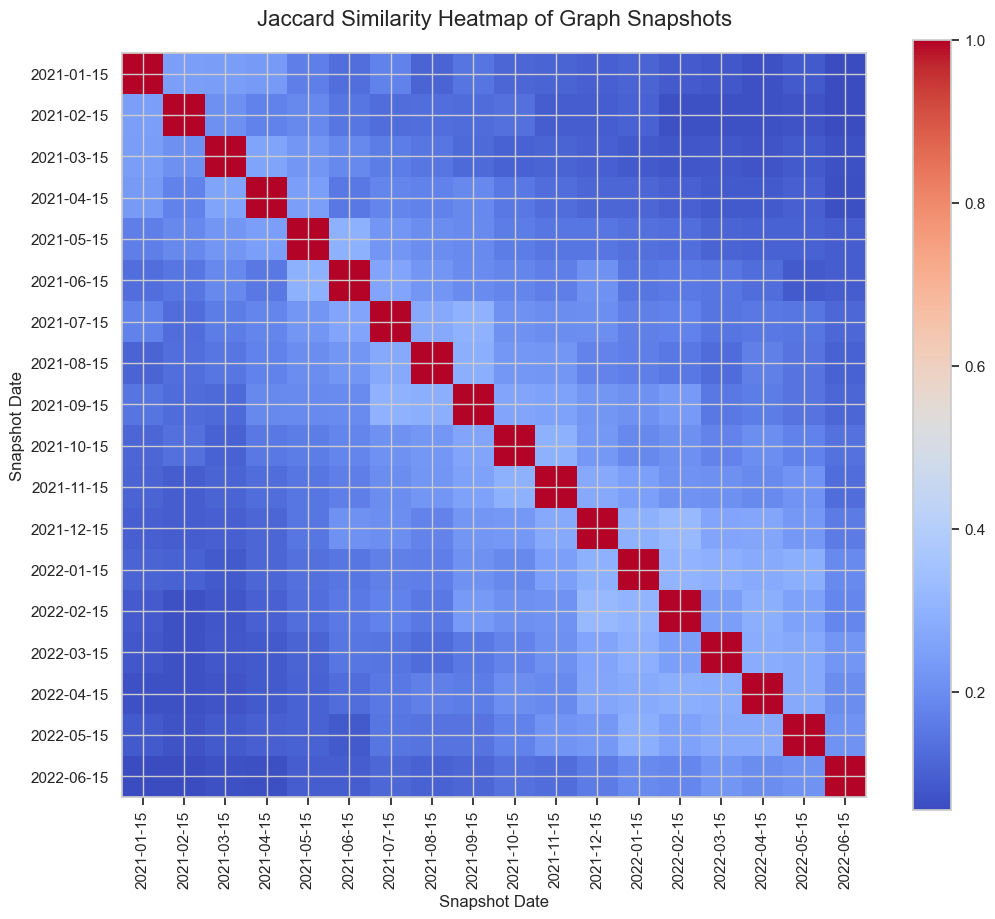

In [56]:
similarity_matrix, snapshot_list = calculate_similarity_matrix(graphs)

plot_similarity_heatmap(similarity_matrix, snapshot_list, dates, output_directory='../output/wallet_network_projections/')

# DYNAMIC


In [58]:
# Check the column names to see what is available
print(all_data.columns)


NameError: name 'all_data' is not defined

In [59]:
import matplotlib.pyplot as plt

# Group the data by Snapshot Date and Community to calculate the total size of each community
community_growth = all_data.groupby(['Snapshot Date', 'Community'])['Size'].sum().unstack().fillna(0)

# Plot the community growth over time
plt.figure(figsize=(14, 8))
for community in community_growth.columns:
    plt.plot(community_growth.index, community_growth[community], label=f'Community {community}')

plt.title('Community Growth Over Time')
plt.xlabel('Snapshot Date')
plt.ylabel('Community Size')
plt.xticks(rotation=45)
plt.legend(title='Community', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


NameError: name 'all_data' is not defined

# Investigating Nodes 

In [60]:
import os
import networkx as nx
import pandas as pd
from os.path import join

def calculate_betweenness_and_community(graph_directory, enriched_graph_directory, token_info_path, snapshot_dates, output_directory):
    # Load the token mapping
    df_tokens = pd.read_csv(token_info_path)
    df_tokens['address'] = df_tokens['address'].str.lower()
    token_map = df_tokens.set_index('address')['name'].to_dict()

    top_betweenness_nodes = []

    for filename in sorted(os.listdir(graph_directory)):
        if filename.endswith('.graphml'):
            normal_graph_file = join(graph_directory, filename)
            enriched_graph_file = join(enriched_graph_directory, filename)

            # Check if the enriched graph file exists
            if not os.path.exists(enriched_graph_file):
                print(f"File not found: {enriched_graph_file}")
                continue

            # Load the normal and enriched graphs
            G = nx.read_graphml(normal_graph_file)
            enriched_G = nx.read_graphml(enriched_graph_file)

            # Perform community detection
            partition = community_louvain.best_partition(G)

            # Calculate betweenness centrality
            betweenness = nx.betweenness_centrality(G)

            # Identify the top 10 nodes with the highest betweenness centrality
            top_nodes = sorted(betweenness.items(), key=lambda item: item[1], reverse=True)[:10]

            # Extract snapshot date
            snapshot_id = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            snapshot_date = snapshot_dates.get(snapshot_id, 'Unknown Date')

            # Collect data for the top 10 nodes
            for node, centrality in top_nodes:
                community = partition[node]
                token_address = enriched_G.nodes[node].get('token_address', '').lower()
                token_name = token_map.get(token_address, 'Unknown Token')
                
                top_betweenness_nodes.append({
                    'Snapshot Date': snapshot_date,
                    'Node': node,
                    'Betweenness Centrality': centrality,
                    'Community': community,
                    'Token Name': token_name
                })

    # Convert the results to a DataFrame
    top_betweenness_df = pd.DataFrame(top_betweenness_nodes)

    # Save the DataFrame to a CSV file
    output_file = join(output_directory, 'top_betweenness_nodes.csv')
    top_betweenness_df.to_csv(output_file, index=False)

    print("Top betweenness nodes saved to CSV.")
    return top_betweenness_df

# Paths
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'
output_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final'
os.makedirs(output_directory, exist_ok=True)  # Create the output directory if it doesn't exist

# Snapshot dates (example)
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Calculate betweenness centrality, identify top nodes, and save the results
top_betweenness_df = calculate_betweenness_and_community(
    graph_directory, enriched_graph_directory, token_info_path, snapshot_dates, output_directory
)


Top betweenness nodes saved to CSV.


In [61]:
import os
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt
from os.path import join

def generate_network_graphs_with_high_betweenness(graph_directory, enriched_graph_directory, token_info_path, snapshot_dates, output_directory):
    # Load the token mapping
    df_tokens = pd.read_csv(token_info_path)
    df_tokens['address'] = df_tokens['address'].str.lower()
    token_map = df_tokens.set_index('address')['name'].to_dict()

    for filename in sorted(os.listdir(graph_directory)):
        if filename.endswith('.graphml'):
            normal_graph_file = join(graph_directory, filename)
            enriched_graph_file = join(enriched_graph_directory, filename)

            # Check if the enriched graph file exists
            if not os.path.exists(enriched_graph_file):
                print(f"File not found: {enriched_graph_file}")
                continue

            # Load the normal and enriched graphs
            G = nx.read_graphml(normal_graph_file)
            enriched_G = nx.read_graphml(enriched_graph_file)

            # Perform community detection
            partition = community_louvain.best_partition(G)

            # Calculate betweenness centrality
            betweenness = nx.betweenness_centrality(G)

            # Identify the top 10 nodes with the highest betweenness centrality
            top_nodes = sorted(betweenness.items(), key=lambda item: item[1], reverse=True)[:10]

            # Extract snapshot date
            snapshot_id = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            snapshot_date = snapshot_dates.get(snapshot_id, 'Unknown Date')

            # Draw the graph without node labels
            plt.figure(figsize=(12, 12))
            pos = nx.spring_layout(G, seed=42)  # Positioning the nodes with a fixed layout for consistency

            # Draw edges
            nx.draw_networkx_edges(G, pos, alpha=0.5)

            # Draw all nodes in light blue
            nx.draw_networkx_nodes(G, pos, node_size=50, node_color='lightblue')

            # Highlight top 10 nodes with high betweenness centrality in red
            nx.draw_networkx_nodes(G, pos, nodelist=[node for node, _ in top_nodes],
                                   node_size=300, node_color='red', label='High Betweenness Nodes')

            # Add title and save the plot without node labels
            plt.title(f'Network Graph - {snapshot_date}')
            output_image_path = join(output_directory, f'network_graph_{snapshot_date}.png')
            plt.savefig(output_image_path)
            plt.close()

            print(f"Saved network graph for snapshot: {snapshot_date}")

# Paths
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'
output_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/Graphs'
os.makedirs(output_directory, exist_ok=True)  # Create the output directory if it doesn't exist

# Snapshot dates (example)
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Generate network graphs with highlighted high betweenness nodes
generate_network_graphs_with_high_betweenness(
    graph_directory, enriched_graph_directory, token_info_path, snapshot_dates, output_directory
)


Saved network graph for snapshot: 2021-06
Saved network graph for snapshot: 2021-07
Saved network graph for snapshot: 2021-08
Saved network graph for snapshot: 2021-09
Saved network graph for snapshot: 2021-10
Saved network graph for snapshot: 2021-11
Saved network graph for snapshot: 2021-12
Saved network graph for snapshot: 2022-01
Saved network graph for snapshot: 2022-02
Saved network graph for snapshot: 2022-03
Saved network graph for snapshot: 2022-04
Saved network graph for snapshot: 2022-05
Saved network graph for snapshot: 2022-06
Saved network graph for snapshot: 2022-07
Saved network graph for snapshot: 2022-08
Saved network graph for snapshot: 2022-09
Saved network graph for snapshot: 2022-10
Saved network graph for snapshot: 2022-11
Saved network graph for snapshot: Unknown Date


In [62]:
import os
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt
from os.path import join

def generate_network_graphs_with_high_betweenness(graph_directory, enriched_graph_directory, token_info_path, snapshot_dates, output_directory):
    # Load the token mapping
    df_tokens = pd.read_csv(token_info_path)
    df_tokens['address'] = df_tokens['address'].str.lower()
    token_map = df_tokens.set_index('address')['name'].to_dict()

    for filename in sorted(os.listdir(graph_directory)):
        if filename.endswith('.graphml'):
            normal_graph_file = join(graph_directory, filename)
            enriched_graph_file = join(enriched_graph_directory, filename)

            # Check if the enriched graph file exists
            if not os.path.exists(enriched_graph_file):
                print(f"File not found: {enriched_graph_file}")
                continue

            # Load the normal and enriched graphs
            G = nx.read_graphml(normal_graph_file)
            enriched_G = nx.read_graphml(enriched_graph_file)

            # Perform community detection
            partition = community_louvain.best_partition(G)

            # Calculate betweenness centrality
            betweenness = nx.betweenness_centrality(G)

            # Identify the top 10 nodes with the highest betweenness centrality
            top_nodes = sorted(betweenness.items(), key=lambda item: item[1], reverse=True)[:10]

            # Extract snapshot date
            snapshot_id = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            snapshot_date = snapshot_dates.get(snapshot_id, 'Unknown Date')

            # Draw the graph without node labels
            plt.figure(figsize=(12, 12))
            pos = nx.spring_layout(G, seed=42)  # Positioning the nodes with a fixed layout for consistency

            # Draw edges
            nx.draw_networkx_edges(G, pos, alpha=0.5)

            # Draw all nodes in light blue
            nx.draw_networkx_nodes(G, pos, node_size=50, node_color='lightblue')

            # Highlight top 10 nodes with high betweenness centrality in red with smaller node size
            nx.draw_networkx_nodes(G, pos, nodelist=[node for node, _ in top_nodes],
                                   node_size=150, node_color='red', label='High Betweenness Nodes')

            # Add title and save the plot without node labels
            plt.title(f'Network Graph - {snapshot_date}')
            output_image_path = join(output_directory, f'network_graph_{snapshot_date}.png')
            plt.savefig(output_image_path)
            plt.close()

            print(f"Saved network graph for snapshot: {snapshot_date}")

# Paths
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'
output_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/Graphs'
os.makedirs(output_directory, exist_ok=True)  # Create the output directory if it doesn't exist

# Snapshot dates (example)
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Generate network graphs with highlighted high betweenness nodes
generate_network_graphs_with_high_betweenness(
    graph_directory, enriched_graph_directory, token_info_path, snapshot_dates, output_directory
)


Saved network graph for snapshot: 2021-06
Saved network graph for snapshot: 2021-07
Saved network graph for snapshot: 2021-08
Saved network graph for snapshot: 2021-09
Saved network graph for snapshot: 2021-10
Saved network graph for snapshot: 2021-11
Saved network graph for snapshot: 2021-12
Saved network graph for snapshot: 2022-01
Saved network graph for snapshot: 2022-02
Saved network graph for snapshot: 2022-03
Saved network graph for snapshot: 2022-04
Saved network graph for snapshot: 2022-05
Saved network graph for snapshot: 2022-06
Saved network graph for snapshot: 2022-07
Saved network graph for snapshot: 2022-08
Saved network graph for snapshot: 2022-09
Saved network graph for snapshot: 2022-10
Saved network graph for snapshot: 2022-11
Saved network graph for snapshot: Unknown Date


In [63]:
import os
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt
from os.path import join
from matplotlib import cm

def generate_network_graphs_with_high_betweenness(graph_directory, enriched_graph_directory, token_info_path, snapshot_dates, output_directory):
    # Load the token mapping
    df_tokens = pd.read_csv(token_info_path)
    df_tokens['address'] = df_tokens['address'].str.lower()
    token_map = df_tokens.set_index('address')['name'].to_dict()

    for filename in sorted(os.listdir(graph_directory)):
        if filename.endswith('.graphml'):
            normal_graph_file = join(graph_directory, filename)
            enriched_graph_file = join(enriched_graph_directory, filename)

            # Check if the enriched graph file exists
            if not os.path.exists(enriched_graph_file):
                print(f"File not found: {enriched_graph_file}")
                continue

            # Load the normal and enriched graphs
            G = nx.read_graphml(normal_graph_file)
            enriched_G = nx.read_graphml(enriched_graph_file)

            # Perform community detection
            partition = community_louvain.best_partition(G)

            # Calculate betweenness centrality
            betweenness = nx.betweenness_centrality(G)

            # Identify the top 10 nodes with the highest betweenness centrality
            top_nodes = sorted(betweenness.items(), key=lambda item: item[1], reverse=True)[:10]

            # Extract snapshot date
            snapshot_id = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            snapshot_date = snapshot_dates.get(snapshot_id, 'Unknown Date')

            # Assign a color to each community
            unique_communities = set(partition.values())
            color_map = cm.get_cmap('tab10', len(unique_communities))
            community_colors = {community: color_map(i) for i, community in enumerate(unique_communities)}

            # Draw the graph without node labels
            plt.figure(figsize=(12, 12))
            pos = nx.spring_layout(G, seed=42)  # Positioning the nodes with a fixed layout for consistency

            # Draw edges
            nx.draw_networkx_edges(G, pos, alpha=0.5)

            # Draw all nodes in light blue
            nx.draw_networkx_nodes(G, pos, node_size=50, node_color='lightblue')

            # Highlight top 10 nodes with high betweenness centrality, colored by community
            for node, _ in top_nodes:
                community = partition[node]
                nx.draw_networkx_nodes(G, pos, nodelist=[node], node_size=150, 
                                       node_color=[community_colors[community]])

            # Create a legend for the communities
            handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=community_colors[community], markersize=10) 
                       for community in unique_communities]
            labels = [f'Community {community}' for community in unique_communities]
            plt.legend(handles, labels, title='Communities', bbox_to_anchor=(1.05, 1), loc='upper left')

            # Add title and save the plot without node labels
            plt.title(f'Network Graph - {snapshot_date}')
            output_image_path = join(output_directory, f'network_graph_{snapshot_date}.png')
            plt.savefig(output_image_path, bbox_inches='tight')
            plt.close()

            print(f"Saved network graph for snapshot: {snapshot_date}")

# Paths
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'
output_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/Final/Graphs'
os.makedirs(output_directory, exist_ok=True)  # Create the output directory if it doesn't exist

# Snapshot dates (example)
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Generate network graphs with highlighted high betweenness nodes colored by community
generate_network_graphs_with_high_betweenness(
    graph_directory, enriched_graph_directory, token_info_path, snapshot_dates, output_directory
)


/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_9700/3673739500.py:43: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  color_map = cm.get_cmap('tab10', len(unique_communities))


Saved network graph for snapshot: 2021-06
Saved network graph for snapshot: 2021-07
Saved network graph for snapshot: 2021-08
Saved network graph for snapshot: 2021-09
Saved network graph for snapshot: 2021-10
Saved network graph for snapshot: 2021-11
Saved network graph for snapshot: 2021-12
Saved network graph for snapshot: 2022-01
Saved network graph for snapshot: 2022-02
Saved network graph for snapshot: 2022-03
Saved network graph for snapshot: 2022-04
Saved network graph for snapshot: 2022-05
Saved network graph for snapshot: 2022-06
Saved network graph for snapshot: 2022-07
Saved network graph for snapshot: 2022-08
Saved network graph for snapshot: 2022-09
Saved network graph for snapshot: 2022-10
Saved network graph for snapshot: 2022-11
Saved network graph for snapshot: Unknown Date


# Graph of highest betweeness nodes over time

/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_9700/1932996398.py:79: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


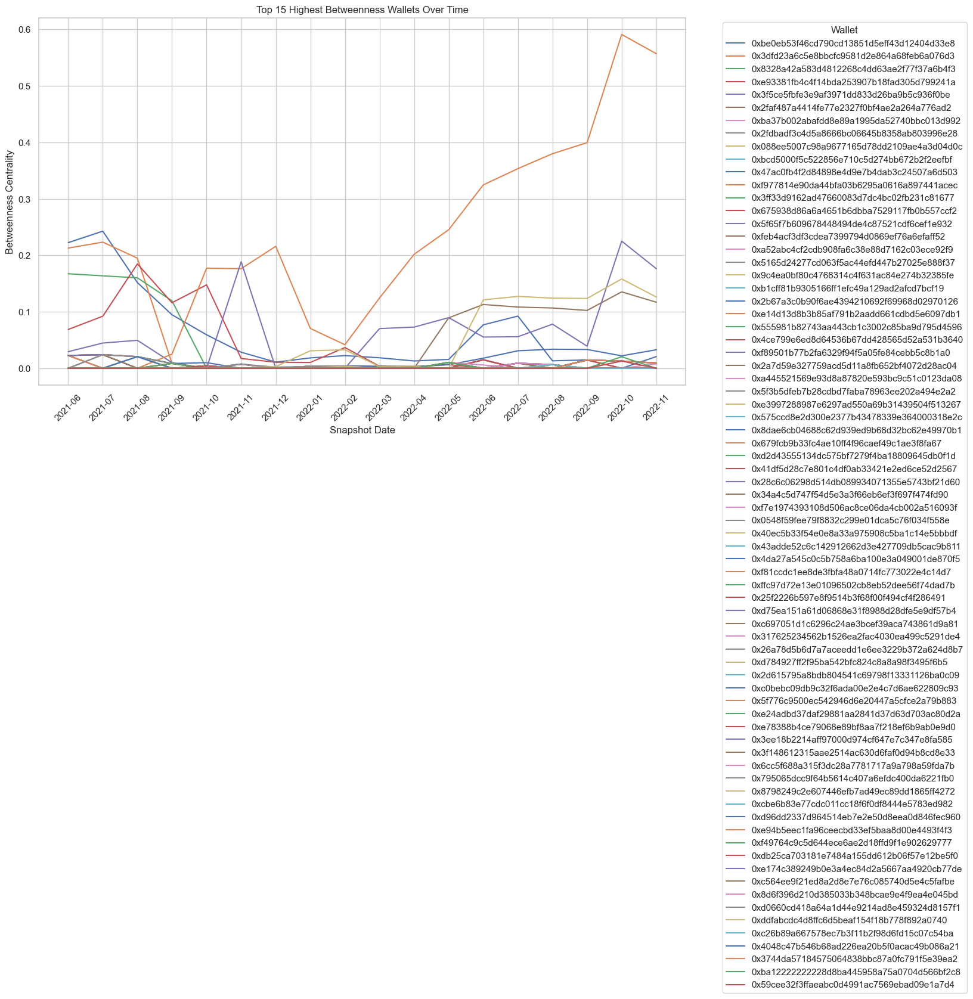

In [65]:
import os
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt
from os.path import join

def track_top_betweenness_over_time(graph_directory, enriched_graph_directory, snapshot_dates):
    # Dictionary to store betweenness centrality over time for top wallets
    betweenness_over_time = {}

    for filename in sorted(os.listdir(graph_directory)):
        if filename.endswith('.graphml'):
            normal_graph_file = join(graph_directory, filename)
            enriched_graph_file = join(enriched_graph_directory, filename)

            # Load the normal graph
            G = nx.read_graphml(normal_graph_file)

            # Calculate betweenness centrality
            betweenness = nx.betweenness_centrality(G)

            # Identify the top 15 nodes with the highest betweenness centrality
            top_nodes = sorted(betweenness.items(), key=lambda item: item[1], reverse=True)[:15]

            # Extract snapshot date
            snapshot_id = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            snapshot_date = snapshot_dates.get(snapshot_id, 'Unknown Date')

            # Store betweenness for top nodes
            for node, centrality in top_nodes:
                if node not in betweenness_over_time:
                    betweenness_over_time[node] = {}
                betweenness_over_time[node][snapshot_date] = centrality

    # Convert the data to a DataFrame for plotting
    betweenness_df = pd.DataFrame(betweenness_over_time).fillna(0).sort_index()

    return betweenness_df

# Paths
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'

# Snapshot dates (example)
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Track betweenness over time for the top 15 wallets
betweenness_df = track_top_betweenness_over_time(graph_directory, enriched_graph_directory, snapshot_dates)

# Plot the betweenness centrality over time for the top 15 wallets
plt.figure(figsize=(14, 8))
for wallet in betweenness_df.columns:
    plt.plot(betweenness_df.index, betweenness_df[wallet], label=wallet)

plt.title('Top 15 Highest Betweenness Wallets Over Time')
plt.xlabel('Snapshot Date')
plt.ylabel('Betweenness Centrality')
plt.xticks(rotation=45)
plt.legend(title='Wallet', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


# Doing the same but for the largest connected component

/var/folders/gt/yx_68_fd6xb14qjmgchjjqf40000gn/T/ipykernel_9700/1874116001.py:84: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


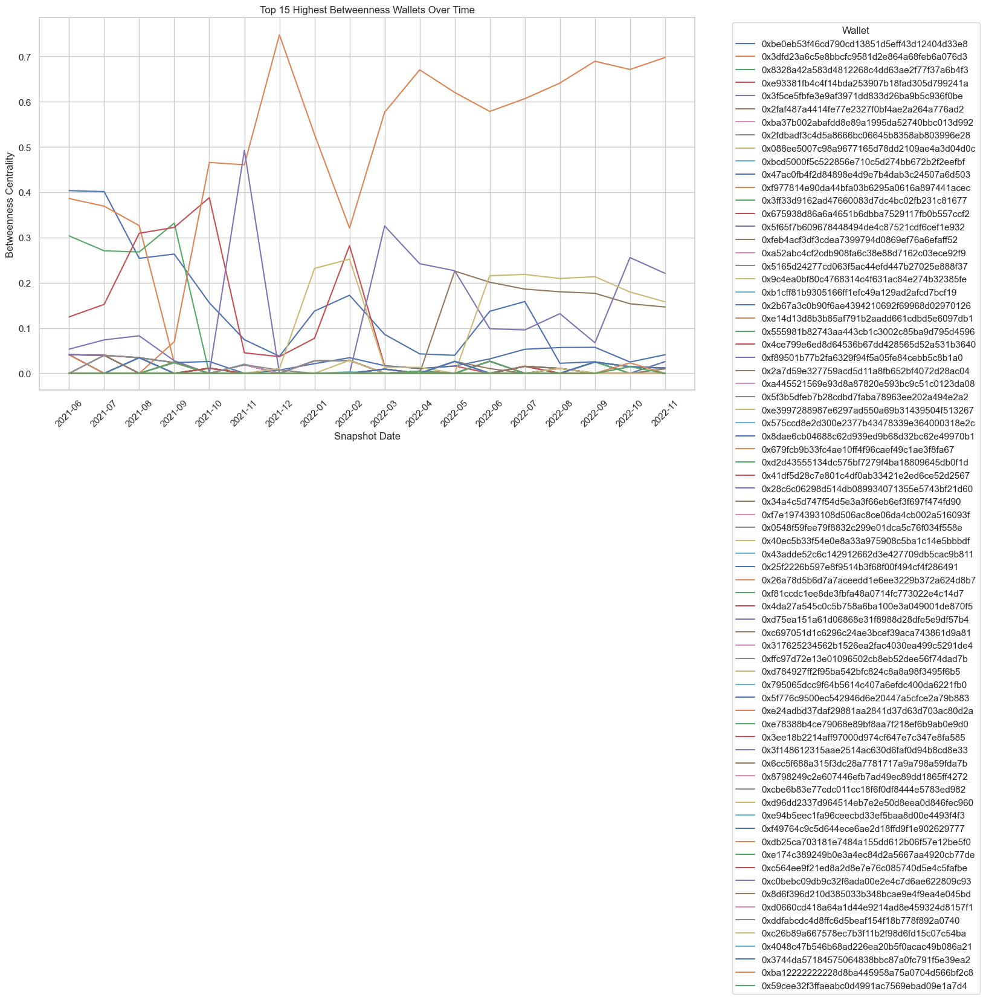

In [74]:
import os
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt
from os.path import join

def track_top_betweenness_over_time(graph_directory, enriched_graph_directory, snapshot_dates):
    # Dictionary to store betweenness centrality over time for top wallets
    betweenness_over_time = {}

    for filename in sorted(os.listdir(graph_directory)):
        if filename.endswith('.graphml'):
            normal_graph_file = join(graph_directory, filename)
            enriched_graph_file = join(enriched_graph_directory, filename)

            # Load the normal graph
            G = nx.read_graphml(normal_graph_file)

            # Extract the largest connected component
            if not nx.is_connected(G):
                largest_cc = max(nx.connected_components(G), key=len)
                G = G.subgraph(largest_cc).copy()

            # Calculate betweenness centrality
            betweenness = nx.betweenness_centrality(G)

            # Identify the top 15 nodes with the highest betweenness centrality
            top_nodes = sorted(betweenness.items(), key=lambda item: item[1], reverse=True)[:15]

            # Extract snapshot date
            snapshot_id = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            snapshot_date = snapshot_dates.get(snapshot_id, 'Unknown Date')

            # Store betweenness for top nodes
            for node, centrality in top_nodes:
                if node not in betweenness_over_time:
                    betweenness_over_time[node] = {}
                betweenness_over_time[node][snapshot_date] = centrality

    # Convert the data to a DataFrame for plotting
    betweenness_df = pd.DataFrame(betweenness_over_time).fillna(0).sort_index()

    return betweenness_df

# Paths
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'

# Snapshot dates (example)
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Track betweenness over time for the top 15 wallets
betweenness_df = track_top_betweenness_over_time(graph_directory, enriched_graph_directory, snapshot_dates)

# Plot the betweenness centrality over time for the top 15 wallets
plt.figure(figsize=(14, 8))
for wallet in betweenness_df.columns:
    plt.plot(betweenness_df.index, betweenness_df[wallet], label=wallet)

plt.title('Top 15 Highest Betweenness Wallets Over Time')
plt.xlabel('Snapshot Date')
plt.ylabel('Betweenness Centrality')
plt.xticks(rotation=45)
plt.legend(title='Wallet', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


In [75]:
import os
import networkx as nx
import pandas as pd
from os.path import join
from collections import defaultdict
import community as community_louvain

def match_communities_across_snapshots(prev_partition, curr_partition, G):
    """Match communities from the previous snapshot to the current snapshot based on node overlap."""
    community_map = {}
    for node, curr_comm in curr_partition.items():
        if node in prev_partition:
            prev_comm = prev_partition[node]
            community_map[curr_comm] = prev_comm
        else:
            community_map[curr_comm] = curr_comm
    
    new_partition = {node: community_map[curr_comm] for node, curr_comm in curr_partition.items()}
    return new_partition

def track_top_betweenness_over_time(graph_directory, enriched_graph_directory, snapshot_dates, token_map):
    # List to store results
    results = []

    prev_partition = None

    for filename in sorted(os.listdir(graph_directory)):
        if filename.endswith('.graphml'):
            normal_graph_file = join(graph_directory, filename)
            enriched_graph_file = join(enriched_graph_directory, filename)

            # Load the normal graph
            G = nx.read_graphml(normal_graph_file)

            # Extract the largest connected component
            if not nx.is_connected(G):
                largest_cc = max(nx.connected_components(G), key=len)
                G = G.subgraph(largest_cc).copy()

            # Perform Louvain community detection
            partition = community_louvain.best_partition(G)

            # Temporal matching of communities across snapshots
            if prev_partition is not None:
                partition = match_communities_across_snapshots(prev_partition, partition, G)

            # Update the previous partition for the next iteration
            prev_partition = partition

            # Assign community labels to the normal graph
            nx.set_node_attributes(G, partition, 'community')

            # Load the enriched graph
            enriched_G = nx.read_graphml(enriched_graph_file)

            # Calculate betweenness centrality
            betweenness = nx.betweenness_centrality(G)

            # Identify the top 15 nodes with the highest betweenness centrality
            top_nodes = sorted(betweenness.items(), key=lambda item: item[1], reverse=True)[:15]

            # Extract snapshot date
            snapshot_id = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            snapshot_date = snapshot_dates.get(snapshot_id, 'Unknown Date')

            # Store information for top nodes
            for node, centrality in top_nodes:
                token_address = enriched_G.nodes[node].get('token_address', '').lower()
                token_name = token_map.get(token_address, 'Unknown Token')
                community = G.nodes[node]['community']
                results.append({
                    'Date': snapshot_date,
                    'Wallet Address': node,
                    'Betweenness Centrality': centrality,
                    'Token Name': token_name,
                    'Community': community
                })

    # Convert results to DataFrame
    results_df = pd.DataFrame(results)

    return results_df

# Paths
data_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data'
graph_directory = join(data_directory, 'validated_wallet_projection_graphs')
enriched_graph_directory = join(data_directory, 'validated_wallet_projection_graphs_enriched')
token_info_path = join(data_directory, 'final_token_selection.csv')

# Snapshot dates (example)
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Load token mapping
def load_token_mapping(token_info_path):
    token_info = pd.read_csv(token_info_path)
    token_map = token_info.set_index('address')['name'].to_dict()
    return token_map

token_map = load_token_mapping(token_info_path)

# Track betweenness over time for the top 15 wallets
top_betweenness_df = track_top_betweenness_over_time(graph_directory, enriched_graph_directory, snapshot_dates, token_map)

# Display the results
print(top_betweenness_df)

# Optionally, save the results to a CSV file
top_betweenness_df.to_csv('top_betweenness_centrality_wallets_over_time.csv', index=False)


        Date                              Wallet Address  \
0    2021-06  0xbe0eb53f46cd790cd13851d5eff43d12404d33e8   
1    2021-06  0x3dfd23a6c5e8bbcfc9581d2e864a68feb6a076d3   
2    2021-06  0x8328a42a583d4812268c4dd63ae2f77f37a6b4f3   
3    2021-06  0xe93381fb4c4f14bda253907b18fad305d799241a   
4    2021-06  0x3f5ce5fbfe3e9af3971dd833d26ba9b5c936f0be   
..       ...                                         ...   
265  2022-11  0x4da27a545c0c5b758a6ba100e3a049001de870f5   
266  2022-11  0x4048c47b546b68ad226ea20b5f0acac49b086a21   
267  2022-11  0x25f2226b597e8f9514b3f68f00f494cf4f286491   
268  2022-11  0x317625234562b1526ea2fac4030ea499c5291de4   
269  2022-11  0x6cc5f688a315f3dc28a7781717a9a798a59fda7b   

     Betweenness Centrality Token Name  Community  
0                         0      Curve          3  
1                         0      Maker          2  
2                         0   Compound          4  
3                         0      Curve          0  
4                  

In [76]:
import os
import networkx as nx
import pandas as pd
from os.path import join
from collections import defaultdict

def compute_token_distribution(partition, enriched_G, token_map):
    """Associate each node with its token name."""
    node_token_map = {}
    for node, community in partition.items():
        if node in enriched_G:
            token_address = enriched_G.nodes[node].get('token_address', '').lower()
            token_name = token_map.get(token_address, 'Unknown Token')
            node_token_map[node] = token_name
    return node_token_map

def match_communities_across_snapshots(prev_partition, curr_partition, G):
    """
    Match communities from the previous snapshot to the current snapshot based on node overlap.
    """
    community_map = {}
    for node, curr_comm in curr_partition.items():
        if node in prev_partition:
            prev_comm = prev_partition[node]
            community_map[curr_comm] = prev_comm
        else:
            community_map[curr_comm] = curr_comm
    
    new_partition = {node: community_map[curr_comm] for node, curr_comm in curr_partition.items()}
    return new_partition

def track_top_betweenness_over_time(graph_directory, enriched_graph_directory, snapshot_dates, token_info_path):
    # Load the token mapping
    df_tokens = pd.read_csv(token_info_path)
    df_tokens['address'] = df_tokens['address'].str.lower()
    token_map = df_tokens.set_index('address')['name'].to_dict()

    # List to store the data for each top node
    betweenness_data = []

    prev_partition = None  # To store the previous partition for temporal matching

    for filename in sorted(os.listdir(graph_directory)):
        if filename.endswith('.graphml'):
            normal_graph_file = join(graph_directory, filename)
            enriched_graph_file = join(enriched_graph_directory, filename)

            # Load the normal and enriched graphs
            G = nx.read_graphml(normal_graph_file)
            enriched_G = nx.read_graphml(enriched_graph_file)

            # Perform community detection
            partition = community_louvain.best_partition(G)

            # If a previous partition exists, match communities across snapshots
            if prev_partition is not None:
                partition = match_communities_across_snapshots(prev_partition, partition, G)

            # Update the previous partition for the next iteration
            prev_partition = partition

            # Calculate betweenness centrality
            betweenness = nx.betweenness_centrality(G)

            # Identify the top 15 nodes with the highest betweenness centrality
            top_nodes = sorted(betweenness.items(), key=lambda item: item[1], reverse=True)[:15]

            # Extract snapshot date
            snapshot_id = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            snapshot_date = snapshot_dates.get(snapshot_id, 'Unknown Date')

            # Store data for each of the top nodes
            for node, centrality in top_nodes:
                # Get the token associated with the node
                token_address = enriched_G.nodes[node].get('token_address', '').lower()
                token_name = token_map.get(token_address, 'Unknown Token')

                # Get the community associated with the node
                community = partition.get(node, 'Unknown Community')

                betweenness_data.append({
                    'Snapshot Date': snapshot_date,
                    'Address': node,
                    'Betweenness Centrality': centrality,
                    'Token Name': token_name,
                    'Community': community
                })

    # Convert the collected data to a DataFrame for display
    betweenness_df = pd.DataFrame(betweenness_data)
    
    # Sort the DataFrame by Snapshot Date and Betweenness Centrality
    betweenness_df.sort_values(by=['Snapshot Date', 'Betweenness Centrality'], ascending=[True, False], inplace=True)

    return betweenness_df

# Paths
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'

# Snapshot dates (example)
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Track betweenness, tokens, and communities over time for the top 15 wallets with temporal community detection
betweenness_df = track_top_betweenness_over_time(graph_directory, enriched_graph_directory, snapshot_dates, token_info_path)

# Display the DataFrame
print(betweenness_df.head(50))  # Display the first 50 rows as an example

# Optionally, save the DataFrame to a CSV file
output_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/top_betweenness_wallets_over_time.csv'
betweenness_df.to_csv(output_file, index=False)


   Snapshot Date                                     Address  \
0        2021-06  0xbe0eb53f46cd790cd13851d5eff43d12404d33e8   
1        2021-06  0x3dfd23a6c5e8bbcfc9581d2e864a68feb6a076d3   
2        2021-06  0x8328a42a583d4812268c4dd63ae2f77f37a6b4f3   
3        2021-06  0xe93381fb4c4f14bda253907b18fad305d799241a   
4        2021-06  0x3f5ce5fbfe3e9af3971dd833d26ba9b5c936f0be   
5        2021-06  0x2faf487a4414fe77e2327f0bf4ae2a264a776ad2   
6        2021-06  0xba37b002abafdd8e89a1995da52740bbc013d992   
7        2021-06  0x2fdbadf3c4d5a8666bc06645b8358ab803996e28   
8        2021-06  0x088ee5007c98a9677165d78dd2109ae4a3d04d0c   
9        2021-06  0xbcd5000f5c522856e710c5d274bb672b2f2eefbf   
10       2021-06  0x47ac0fb4f2d84898e4d9e7b4dab3c24507a6d503   
11       2021-06  0xf977814e90da44bfa03b6295a0616a897441acec   
12       2021-06  0x3ff33d9162ad47660083d7dc4bc02fb231c81677   
13       2021-06  0x675938d86a6a4651b6dbba7529117fb0b557ccf2   
14       2021-06  0x5f65f7b609678448494d

In [77]:
import os
import networkx as nx
import pandas as pd
from os.path import join
from collections import defaultdict

def compute_token_distribution(partition, enriched_G, token_map):
    """Associate each node with its token name."""
    node_token_map = {}
    for node, community in partition.items():
        if node in enriched_G:
            token_address = enriched_G.nodes[node].get('token_address', '').lower()
            token_name = token_map.get(token_address, 'Unknown Token')
            node_token_map[node] = token_name
    return node_token_map

def match_communities_across_snapshots(prev_partition, curr_partition, G):
    """
    Match communities from the previous snapshot to the current snapshot based on node overlap.
    """
    community_map = {}
    for node, curr_comm in curr_partition.items():
        if node in prev_partition:
            prev_comm = prev_partition[node]
            community_map[curr_comm] = prev_comm
        else:
            community_map[curr_comm] = curr_comm
    
    new_partition = {node: community_map[curr_comm] for node, curr_comm in curr_partition.items()}
    return new_partition

def track_top_betweenness_over_time(graph_directory, enriched_graph_directory, snapshot_dates, token_info_path):
    # Load the token mapping
    df_tokens = pd.read_csv(token_info_path)
    df_tokens['address'] = df_tokens['address'].str.lower()
    token_map = df_tokens.set_index('address')['name'].to_dict()

    # List to store the data for each top node
    betweenness_data = []

    prev_partition = None  # To store the previous partition for temporal matching

    for filename in sorted(os.listdir(graph_directory)):
        if filename.endswith('.graphml'):
            normal_graph_file = join(graph_directory, filename)
            enriched_graph_file = join(enriched_graph_directory, filename)

            # Debugging output: print the filenames being used
            print(f"Loading normal graph: {normal_graph_file}")
            print(f"Loading enriched graph: {enriched_graph_file}")

            # Check if the files exist
            if not os.path.exists(normal_graph_file):
                print(f"File not found: {normal_graph_file}")
                continue

            if not os.path.exists(enriched_graph_file):
                print(f"File not found: {enriched_graph_file}")
                continue

            # Load the normal and enriched graphs
            G = nx.read_graphml(normal_graph_file)
            enriched_G = nx.read_graphml(enriched_graph_file)

            # Perform community detection
            partition = community_louvain.best_partition(G)

            # If a previous partition exists, match communities across snapshots
            if prev_partition is not None:
                partition = match_communities_across_snapshots(prev_partition, partition, G)

            # Update the previous partition for the next iteration
            prev_partition = partition

            # Calculate betweenness centrality
            betweenness = nx.betweenness_centrality(G)

            # Identify the top 15 nodes with the highest betweenness centrality
            top_nodes = sorted(betweenness.items(), key=lambda item: item[1], reverse=True)[:15]

            # Extract snapshot date
            snapshot_id = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            snapshot_date = snapshot_dates.get(snapshot_id, 'Unknown Date')

            # Store data for each of the top nodes
            for node, centrality in top_nodes:
                # Get the token associated with the node
                token_address = enriched_G.nodes[node].get('token_address', '').lower()
                token_name = token_map.get(token_address, 'Unknown Token')

                # Get the community associated with the node
                community = partition.get(node, 'Unknown Community')

                betweenness_data.append({
                    'Snapshot Date': snapshot_date,
                    'Address': node,
                    'Betweenness Centrality': centrality,
                    'Token Name': token_name,
                    'Community': community
                })

    # Convert the collected data to a DataFrame for display
    betweenness_df = pd.DataFrame(betweenness_data)
    
    # Sort the DataFrame by Snapshot Date and Betweenness Centrality
    betweenness_df.sort_values(by=['Snapshot Date', 'Betweenness Centrality'], ascending=[True, False], inplace=True)

    return betweenness_df

# Paths
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'

# Snapshot dates (example)
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Track betweenness, tokens, and communities over time for the top 15 wallets with temporal community detection
betweenness_df = track_top_betweenness_over_time(graph_directory, enriched_graph_directory, snapshot_dates, token_info_path)

# Display the DataFrame
print(betweenness_df.head(50))  # Display the first 50 rows as an example

# Optionally, save the DataFrame to a CSV file
output_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/top_betweenness_wallets_over_time.csv'
betweenness_df.to_csv(output_file, index=False)


Loading normal graph: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_11659570.graphml
Loading enriched graph: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched/validated_wallet_projection_graph_11659570.graphml
Loading normal graph: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_11861210.graphml
Loading enriched graph: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched/validated_wallet_projection_graph_11861210.graphml
Loading normal graph: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_12043054.graphml
Loading enriched graph: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched/validated_wallet_projection_graph_12043054.graphml
Loading normal graph: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_

In [78]:
# Check if the graph is connected
print(f"Is the graph connected? {nx.is_connected(G)}")


NameError: name 'G' is not defined

In [79]:
import networkx as nx
import matplotlib.pyplot as plt

# Assuming G is your normal graph
def visualize_graph(G, title="Graph Visualization"):
    plt.figure(figsize=(12, 8))
    pos = nx.spring_layout(G, seed=42)  # Spring layout for better visualization
    nx.draw(G, pos, with_labels=True, node_size=50, node_color='skyblue', edge_color='gray', font_size=8)
    plt.title(title)
    plt.show()

# Visualize the normal graph
visualize_graph(G, title="Normal Graph Visualization")


NameError: name 'G' is not defined

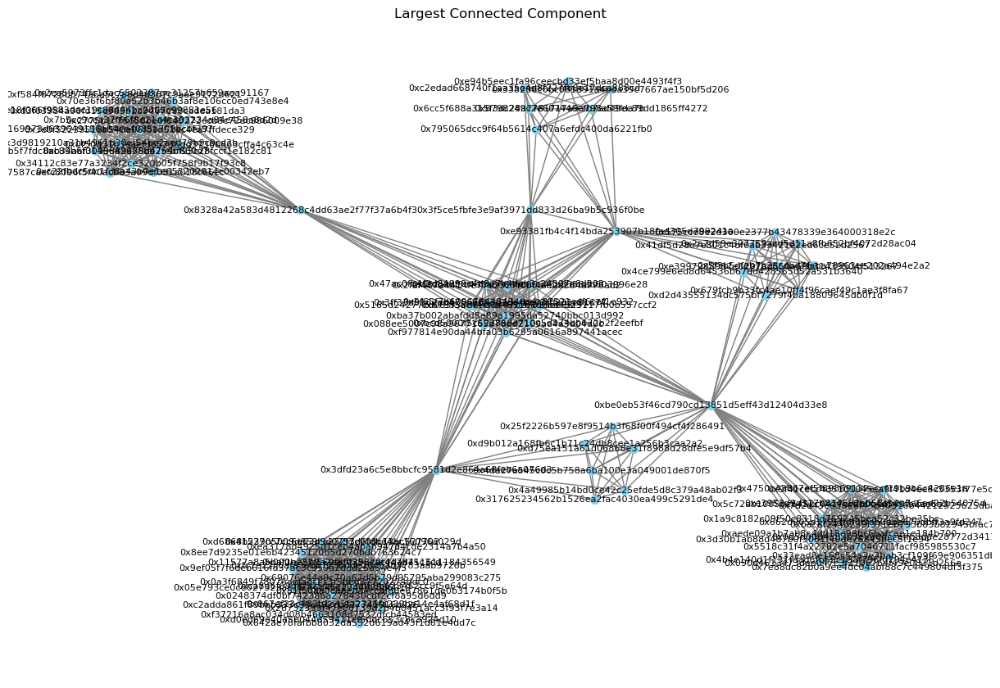

In [811]:
import networkx as nx
import matplotlib.pyplot as plt

# Assuming G is your normal graph
def visualize_graph(G, title="Graph Visualization"):
    plt.figure(figsize=(12, 8))
    pos = nx.spring_layout(G, seed=42)  # Spring layout for better visualization
    nx.draw(G, pos, with_labels=True, node_size=50, node_color='skyblue', edge_color='gray', font_size=8)
    plt.title(title)
    plt.show()

# Get the largest connected component
largest_component = max(nx.connected_components(G), key=len)
subgraph = G.subgraph(largest_component)

# Visualize the largest connected component
visualize_graph(subgraph, title="Largest Connected Component")


In [812]:
# Calculate betweenness centrality for the largest connected component
betweenness = nx.betweenness_centrality(subgraph)

# Identify the top 15 nodes with the highest betweenness centrality
top_nodes = sorted(betweenness.items(), key=lambda item: item[1], reverse=True)[:15]
print("Top 15 nodes by betweenness centrality in the largest connected component:")
for node, centrality in top_nodes:
    print(f"Node: {node}, Betweenness Centrality: {centrality:.4f}")


Top 15 nodes by betweenness centrality in the largest connected component:
Node: 0xbe0eb53f46cd790cd13851d5eff43d12404d33e8, Betweenness Centrality: 0.4035
Node: 0x3dfd23a6c5e8bbcfc9581d2e864a68feb6a076d3, Betweenness Centrality: 0.3861
Node: 0x8328a42a583d4812268c4dd63ae2f77f37a6b4f3, Betweenness Centrality: 0.3037
Node: 0xe93381fb4c4f14bda253907b18fad305d799241a, Betweenness Centrality: 0.1247
Node: 0x3f5ce5fbfe3e9af3971dd833d26ba9b5c936f0be, Betweenness Centrality: 0.0534
Node: 0x2faf487a4414fe77e2327f0bf4ae2a264a776ad2, Betweenness Centrality: 0.0412
Node: 0x675938d86a6a4651b6dbba7529117fb0b557ccf2, Betweenness Centrality: 0.0412
Node: 0x5f65f7b609678448494de4c87521cdf6cef1e932, Betweenness Centrality: 0.0412
Node: 0x47ac0fb4f2d84898e4d9e7b4dab3c24507a6d503, Betweenness Centrality: 0.0412
Node: 0x5165d24277cd063f5ac44efd447b27025e888f37, Betweenness Centrality: 0.0412
Node: 0xbcd5000f5c522856e710c5d274bb672b2f2eefbf, Betweenness Centrality: 0.0412
Node: 0xba37b002abafdd8e89a1995da5

In [82]:
import os
import networkx as nx
import pandas as pd
from os.path import join
from collections import defaultdict

def compute_token_distribution(partition, enriched_G, token_map):
    """Associate each node with its token name."""
    node_token_map = {}
    for node, community in partition.items():
        if node in enriched_G:
            token_address = enriched_G.nodes[node].get('token_address', '').lower()
            token_name = token_map.get(token_address, 'Unknown Token')
            node_token_map[node] = token_name
    return node_token_map

def match_communities_across_snapshots(prev_partition, curr_partition, G):
    """
    Match communities from the previous snapshot to the current snapshot based on node overlap.
    """
    community_map = {}
    for node, curr_comm in curr_partition.items():
        if node in prev_partition:
            prev_comm = prev_partition[node]
            community_map[curr_comm] = prev_comm
        else:
            community_map[curr_comm] = curr_comm
    
    new_partition = {node: community_map[curr_comm] for node, curr_comm in curr_partition.items()}
    return new_partition

def track_top_betweenness_over_time(graph_directory, enriched_graph_directory, snapshot_dates, token_info_path):
    # Load the token mapping
    df_tokens = pd.read_csv(token_info_path)
    df_tokens['address'] = df_tokens['address'].str.lower()
    token_map = df_tokens.set_index('address')['name'].to_dict()

    # List to store the data for each top node
    betweenness_data = []

    prev_partition = None  # To store the previous partition for temporal matching

    for filename in sorted(os.listdir(graph_directory)):
        if filename.endswith('.graphml'):
            normal_graph_file = join(graph_directory, filename)
            enriched_graph_file = join(enriched_graph_directory, filename)

            # Load the normal and enriched graphs
            G = nx.read_graphml(normal_graph_file)
            enriched_G = nx.read_graphml(enriched_graph_file)

            # Perform community detection
            partition = community_louvain.best_partition(G)

            # If a previous partition exists, match communities across snapshots
            if prev_partition is not None:
                partition = match_communities_across_snapshots(prev_partition, partition, G)

            # Update the previous partition for the next iteration
            prev_partition = partition

            # Calculate betweenness centrality
            betweenness = nx.betweenness_centrality(G)

            # Identify the top 5 nodes with the highest betweenness centrality
            top_nodes = sorted(betweenness.items(), key=lambda item: item[1], reverse=True)[:5]

            # Extract snapshot date
            snapshot_id = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            snapshot_date = snapshot_dates.get(snapshot_id, 'Unknown Date')

            # Store data for each of the top nodes
            for node, centrality in top_nodes:
                # Get the token associated with the node
                token_address = enriched_G.nodes[node].get('token_address', '').lower()
                token_name = token_map.get(token_address, 'Unknown Token')

                # Get the community associated with the node
                community = partition.get(node, 'Unknown Community')

                betweenness_data.append({
                    'Snapshot Date': snapshot_date,
                    'Address': node,
                    'Betweenness Centrality': centrality,
                    'Token Name': token_name,
                    'Community': community
                })

    # Convert the collected data to a DataFrame for display
    betweenness_df = pd.DataFrame(betweenness_data)
    
    # Sort the DataFrame by Snapshot Date and Betweenness Centrality
    betweenness_df.sort_values(by=['Snapshot Date', 'Betweenness Centrality'], ascending=[True, False], inplace=True)

    return betweenness_df

# Paths
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'

# Snapshot dates (example)
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Track betweenness, tokens, and communities over time for the top 5 wallets with temporal community detection
betweenness_df = track_top_betweenness_over_time(graph_directory, enriched_graph_directory, snapshot_dates, token_info_path)

# Display the DataFrame
print(betweenness_df.head(50))  # Display the first 50 rows as an example

# Optionally, save the DataFrame to a CSV file
output_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/top_5_betweenness_wallets_per_snapshot.csv'
betweenness_df.to_csv(output_file, index=False)


   Snapshot Date                                     Address  \
0        2021-06  0xbe0eb53f46cd790cd13851d5eff43d12404d33e8   
1        2021-06  0x3dfd23a6c5e8bbcfc9581d2e864a68feb6a076d3   
2        2021-06  0x8328a42a583d4812268c4dd63ae2f77f37a6b4f3   
3        2021-06  0xe93381fb4c4f14bda253907b18fad305d799241a   
4        2021-06  0x3f5ce5fbfe3e9af3971dd833d26ba9b5c936f0be   
5        2021-07  0xbe0eb53f46cd790cd13851d5eff43d12404d33e8   
6        2021-07  0x3dfd23a6c5e8bbcfc9581d2e864a68feb6a076d3   
7        2021-07  0x8328a42a583d4812268c4dd63ae2f77f37a6b4f3   
8        2021-07  0xe93381fb4c4f14bda253907b18fad305d799241a   
9        2021-07  0x3f5ce5fbfe3e9af3971dd833d26ba9b5c936f0be   
10       2021-08  0x3dfd23a6c5e8bbcfc9581d2e864a68feb6a076d3   
11       2021-08  0xe93381fb4c4f14bda253907b18fad305d799241a   
12       2021-08  0x8328a42a583d4812268c4dd63ae2f77f37a6b4f3   
13       2021-08  0xbe0eb53f46cd790cd13851d5eff43d12404d33e8   
14       2021-08  0x3f5ce5fbfe3e9af3971d

In [83]:
import os
import networkx as nx
import pandas as pd
from os.path import join
from collections import defaultdict

def compute_token_distribution(partition, enriched_G, token_map):
    """Associate each node with its token name."""
    node_token_map = {}
    for node, community in partition.items():
        if node in enriched_G:
            token_address = enriched_G.nodes[node].get('token_address', '').lower()
            token_name = token_map.get(token_address, 'Unknown Token')
            node_token_map[node] = token_name
    return node_token_map

def match_communities_across_snapshots(prev_partition, curr_partition, G):
    """Match communities from the previous snapshot to the current snapshot based on node overlap."""
    community_map = {}
    for node, curr_comm in curr_partition.items():
        if node in prev_partition:
            prev_comm = prev_partition[node]
            community_map[curr_comm] = prev_comm
        else:
            community_map[curr_comm] = curr_comm
    
    new_partition = {node: community_map[curr_comm] for node, curr_comm in curr_partition.items()}
    return new_partition

def track_top_betweenness_over_time(graph_directory, enriched_graph_directory, snapshot_dates, token_info_path):
    # Load the token mapping
    df_tokens = pd.read_csv(token_info_path)
    df_tokens['address'] = df_tokens['address'].str.lower()
    token_map = df_tokens.set_index('address')['name'].to_dict()

    # List to store the data for each top node
    betweenness_data = []

    prev_partition = None  # To store the previous partition for temporal matching

    for filename in sorted(os.listdir(graph_directory)):
        if filename.endswith('.graphml'):
            normal_graph_file = join(graph_directory, filename)
            enriched_graph_file = join(enriched_graph_directory, filename)

            # Debugging output: Print the paths being used
            print(f"Trying to load: {normal_graph_file}")
            print(f"Trying to load: {enriched_graph_file}")

            # Check if the files exist
            if not os.path.exists(normal_graph_file):
                print(f"File not found: {normal_graph_file}")
                continue

            if not os.path.exists(enriched_graph_file):
                print(f"File not found: {enriched_graph_file}")
                continue

            # Load the normal and enriched graphs
            G = nx.read_graphml(normal_graph_file)
            enriched_G = nx.read_graphml(enriched_graph_file)

            # Perform community detection
            partition = community_louvain.best_partition(G)

            # If a previous partition exists, match communities across snapshots
            if prev_partition is not None:
                partition = match_communities_across_snapshots(prev_partition, partition, G)

            # Update the previous partition for the next iteration
            prev_partition = partition

            # Calculate betweenness centrality
            betweenness = nx.betweenness_centrality(G)

            # Identify the top 5 nodes with the highest betweenness centrality
            top_nodes = sorted(betweenness.items(), key=lambda item: item[1], reverse=True)[:5]

            # Extract snapshot date
            snapshot_id = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            snapshot_date = snapshot_dates.get(snapshot_id, 'Unknown Date')

            # Store data for each of the top nodes
            for node, centrality in top_nodes:
                # Get the token associated with the node
                token_address = enriched_G.nodes[node].get('token_address', '').lower()
                token_name = token_map.get(token_address, 'Unknown Token')

                # Get the community associated with the node
                community = partition.get(node, 'Unknown Community')

                betweenness_data.append({
                    'Snapshot Date': snapshot_date,
                    'Address': node,
                    'Betweenness Centrality': centrality,
                    'Token Name': token_name,
                    'Community': community
                })

    # Convert the collected data to a DataFrame for display
    betweenness_df = pd.DataFrame(betweenness_data)
    
    # Sort the DataFrame by Snapshot Date and Betweenness Centrality
    betweenness_df.sort_values(by=['Snapshot Date', 'Betweenness Centrality'], ascending=[True, False], inplace=True)

    return betweenness_df

# Paths
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'

# Snapshot dates (example)
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Track betweenness, tokens, and communities over time for the top 5 wallets with temporal community detection
betweenness_df = track_top_betweenness_over_time(graph_directory, enriched_graph_directory, snapshot_dates, token_info_path)

# Display the DataFrame
print(betweenness_df.head(50))  # Display the first 50 rows as an example

# Optionally, save the DataFrame to a CSV file
output_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/top_5_betweenness_wallets_per_snapshot.csv'
betweenness_df.to_csv(output_file, index=False)


Trying to load: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_11659570.graphml
Trying to load: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched/validated_wallet_projection_graph_11659570.graphml
Trying to load: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_11861210.graphml
Trying to load: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched/validated_wallet_projection_graph_11861210.graphml
Trying to load: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projection_graph_12043054.graphml
Trying to load: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched/validated_wallet_projection_graph_12043054.graphml
Trying to load: /Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs/validated_wallet_projec

In [87]:
import os
import networkx as nx
import pandas as pd
from os.path import join
from collections import defaultdict
import community as community_louvain

def match_communities_across_snapshots(prev_partition, curr_partition, G):
    """Match communities from the previous snapshot to the current snapshot based on node overlap."""
    community_map = {}
    for node, curr_comm in curr_partition.items():
        if node in prev_partition:
            prev_comm = prev_partition[node]
            community_map[curr_comm] = prev_comm
        else:
            community_map[curr_comm] = curr_comm
    
    new_partition = {node: community_map[curr_comm] for node, curr_comm in curr_partition.items()}
    return new_partition

def generate_token_and_community_size_statistics_with_centrality(normal_graph_directory, enriched_graph_directory, token_info_path, output_csv_path):
    # Load the token mapping for reference
    df_tokens = pd.read_csv(token_info_path)
    df_tokens['address'] = df_tokens['address'].str.lower()  # Normalize the address
    token_map = df_tokens.set_index('address')['name'].to_dict()

    results = []

    prev_partition = None  # To store the previous partition for temporal matching

    # Process each graph file in the directory
    for filename in sorted(os.listdir(normal_graph_directory)):  # Ensure files are processed in order
        if filename.endswith('.graphml'):
            normal_graph_path = join(normal_graph_directory, filename)
            enriched_graph_path = join(enriched_graph_directory, filename)

            # Load the normal graph for community detection and analysis
            G = nx.read_graphml(normal_graph_path)

            # Load the enriched graph for token labeling
            enriched_G = nx.read_graphml(enriched_graph_path)

            # Apply community detection
            partition = community_louvain.best_partition(G)

            # Temporal matching of communities across snapshots
            if prev_partition is not None:
                partition = match_communities_across_snapshots(prev_partition, partition, G)

            # Update the previous partition for the next iteration
            prev_partition = partition

            # Assign community labels to the normal graph
            nx.set_node_attributes(G, partition, 'community')

            # Calculate betweenness centrality with high precision
            betweenness = nx.betweenness_centrality(G, normalized=True, endpoints=False)

            # Find the top 3 nodes with the highest betweenness centrality
            top_3_nodes = sorted(betweenness.items(), key=lambda x: x[1], reverse=True)[:3]

            # Extract snapshot date
            snapshot_time = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')

            # Store the top 3 nodes with their tokens and communities
            for node, centrality_value in top_3_nodes:
                token_address = enriched_G.nodes[node].get('token_address', '').lower()  # Use enriched graph for token labeling
                token_name = token_map.get(token_address, 'Unknown Token')
                community = G.nodes[node]['community']
                results.append({
                    'Date': snapshot_time,
                    'Wallet Address': node,
                    'Betweenness Centrality': centrality_value,
                    'Token Name': token_name,
                    'Community': community
                })

    # Convert the results to a DataFrame
    results_df = pd.DataFrame(results)

    # Save the DataFrame to a CSV file
    results_df.to_csv(output_csv_path, index=False)

    print(f"Results saved to {output_csv_path}")

# Path setup
data_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data'
normal_graph_directory = join(data_directory, 'validated_wallet_projection_graphs')
enriched_graph_directory = join(data_directory, 'validated_wallet_projection_graphs_enriched')
token_info_path = join(data_directory, 'final_token_selection.csv')
output_csv_path = join(data_directory, 'betweenness_centrality_analysis.csv')

# Generate token name, community size statistics, and top centrality nodes, and save to CSV
generate_token_and_community_size_statistics_with_centrality(
    normal_graph_directory, 
    enriched_graph_directory, 
    token_info_path, 
    output_csv_path
)


Results saved to /Users/liamk/Desktop/DATA_DIRECTORY/data/betweenness_centrality_analysis.csv


In [90]:
# Top 20 betweeness nodes accross all snapshots

In [92]:
import os
import networkx as nx
import pandas as pd
from os.path import join
from collections import defaultdict
import community as community_louvain

def match_communities_across_snapshots(prev_partition, curr_partition, G):
    """Match communities from the previous snapshot to the current snapshot based on node overlap."""
    community_map = {}
    for node, curr_comm in curr_partition.items():
        if node in prev_partition:
            prev_comm = prev_partition[node]
            community_map[curr_comm] = prev_comm
        else:
            community_map[curr_comm] = curr_comm
    
    new_partition = {node: community_map[curr_comm] for node, curr_comm in curr_partition.items()}
    return new_partition

def generate_top_20_betweenness_across_snapshots(normal_graph_directory, enriched_graph_directory, token_info_path, output_csv_path):
    # Load the token mapping for reference
    df_tokens = pd.read_csv(token_info_path)
    df_tokens['address'] = df_tokens['address'].str.lower()  # Normalize the address
    token_map = df_tokens.set_index('address')['name'].to_dict()

    all_betweenness = []

    prev_partition = None  # To store the previous partition for temporal matching

    # Process each graph file in the directory
    for filename in sorted(os.listdir(normal_graph_directory)):  # Ensure files are processed in order
        if filename.endswith('.graphml'):
            normal_graph_path = join(normal_graph_directory, filename)
            enriched_graph_path = join(enriched_graph_directory, filename)

            # Load the normal graph for community detection and analysis
            G = nx.read_graphml(normal_graph_path)

            # Check if the graph is connected; focus on the largest component if not
            if not nx.is_connected(G):
                largest_cc = max(nx.connected_components(G), key=len)
                G = G.subgraph(largest_cc).copy()

            # Load the enriched graph for token labeling
            enriched_G = nx.read_graphml(enriched_graph_path)

            # Apply community detection
            partition = community_louvain.best_partition(G)

            # Temporal matching of communities across snapshots
            if prev_partition is not None:
                partition = match_communities_across_snapshots(prev_partition, partition, G)

            # Update the previous partition for the next iteration
            prev_partition = partition

            # Assign community labels to the normal graph
            nx.set_node_attributes(G, partition, 'community')

            # Calculate betweenness centrality with high precision
            betweenness = nx.betweenness_centrality(G, normalized=True, endpoints=False)

            # Store all betweenness centrality values with associated data
            snapshot_number = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            for node, centrality_value in betweenness.items():
                token_address = enriched_G.nodes[node].get('token_address', '').lower()  # Use enriched graph for token labeling
                token_name = token_map.get(token_address, 'Unknown Token')
                community = G.nodes[node]['community']
                all_betweenness.append({
                    'Snapshot': snapshot_number,
                    'Wallet Address': node,
                    'Betweenness Centrality': centrality_value,
                    'Token Name': token_name,
                    'Community': community
                })

    # Convert the results to a DataFrame
    all_betweenness_df = pd.DataFrame(all_betweenness)

    # Sort by Betweenness Centrality and keep the top 20 nodes
    top_20_betweenness_df = all_betweenness_df.sort_values(by='Betweenness Centrality', ascending=False).head(20)

    # Save the DataFrame to a CSV file
    top_20_betweenness_df.to_csv(output_csv_path, index=False)

    print(f"Top 20 betweenness centrality results saved to {output_csv_path}")

# Path setup
data_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data'
normal_graph_directory = join(data_directory, 'validated_wallet_projection_graphs')
enriched_graph_directory = join(data_directory, 'validated_wallet_projection_graphs_enriched')
token_info_path = join(data_directory, 'final_token_selection.csv')
output_csv_path = join(data_directory, 'top_20_betweenness_centrality.csv')

# Generate top 20 betweenness centrality nodes across all snapshots and save to CSV
generate_top_20_betweenness_across_snapshots(
    normal_graph_directory, 
    enriched_graph_directory, 
    token_info_path, 
    output_csv_path
)


Top 20 betweenness centrality results saved to /Users/liamk/Desktop/DATA_DIRECTORY/data/top_20_betweenness_centrality.csv


In [93]:
import os
import networkx as nx
import pandas as pd
from os.path import join
from collections import defaultdict
import community as community_louvain

def match_communities_across_snapshots(prev_partition, curr_partition, G):
    """Match communities from the previous snapshot to the current snapshot based on node overlap."""
    community_map = {}
    for node, curr_comm in curr_partition.items():
        if node in prev_partition:
            prev_comm = prev_partition[node]
            community_map[curr_comm] = prev_comm
        else:
            community_map[curr_comm] = curr_comm
    
    new_partition = {node: community_map[curr_comm] for node, curr_comm in curr_partition.items()}
    return new_partition

def generate_top_20_betweenness_across_snapshots(normal_graph_directory, enriched_graph_directory, token_info_path, output_csv_path, snapshot_dates):
    # Load the token mapping for reference
    df_tokens = pd.read_csv(token_info_path)
    df_tokens['address'] = df_tokens['address'].str.lower()  # Normalize the address
    token_map = df_tokens.set_index('address')['name'].to_dict()

    all_betweenness = []

    prev_partition = None  # To store the previous partition for temporal matching

    # Process each graph file in the directory
    for filename in sorted(os.listdir(normal_graph_directory)):  # Ensure files are processed in order
        if filename.endswith('.graphml'):
            normal_graph_path = join(normal_graph_directory, filename)
            enriched_graph_path = join(enriched_graph_directory, filename)

            # Load the normal graph for community detection and analysis
            G = nx.read_graphml(normal_graph_path)

            # Check if the graph is connected; focus on the largest component if not
            if not nx.is_connected(G):
                largest_cc = max(nx.connected_components(G), key=len)
                G = G.subgraph(largest_cc).copy()

            # Load the enriched graph for token labeling
            enriched_G = nx.read_graphml(enriched_graph_path)

            # Apply community detection
            partition = community_louvain.best_partition(G)

            # Temporal matching of communities across snapshots
            if prev_partition is not None:
                partition = match_communities_across_snapshots(prev_partition, partition, G)

            # Update the previous partition for the next iteration
            prev_partition = partition

            # Assign community labels to the normal graph
            nx.set_node_attributes(G, partition, 'community')

            # Calculate betweenness centrality with high precision
            betweenness = nx.betweenness_centrality(G, normalized=True, endpoints=False)

            # Store all betweenness centrality values with associated data
            snapshot_number = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            snapshot_date = snapshot_dates.get(snapshot_number, 'Unknown Date')
            for node, centrality_value in betweenness.items():
                token_address = enriched_G.nodes[node].get('token_address', '').lower()  # Use enriched graph for token labeling
                token_name = token_map.get(token_address, 'Unknown Token')
                community = G.nodes[node]['community']
                all_betweenness.append({
                    'Snapshot': snapshot_number,
                    'Date': snapshot_date,
                    'Wallet Address': node,
                    'Betweenness Centrality': centrality_value,
                    'Token Name': token_name,
                    'Community': community
                })

    # Convert the results to a DataFrame
    all_betweenness_df = pd.DataFrame(all_betweenness)

    # Sort by Snapshot number (as integers) and then by Betweenness Centrality
    all_betweenness_df['Snapshot'] = all_betweenness_df['Snapshot'].astype(int)
    all_betweenness_df = all_betweenness_df.sort_values(by=['Snapshot', 'Betweenness Centrality'], ascending=[True, False])

    # Keep only the top 20 nodes
    top_20_betweenness_df = all_betweenness_df.head(20)

    # Save the DataFrame to a CSV file
    top_20_betweenness_df.to_csv(output_csv_path, index=False)

    print(f"Top 20 betweenness centrality results saved to {output_csv_path}")

# Path setup
data_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data'
normal_graph_directory = join(data_directory, 'validated_wallet_projection_graphs')
enriched_graph_directory = join(data_directory, 'validated_wallet_projection_graphs_enriched')
token_info_path = join(data_directory, 'final_token_selection.csv')
output_csv_path = join(data_directory, 'top_20_betweenness_centrality.csv')

# Snapshot dates in mm-yyyy format
snapshot_dates = {
    '11659570': '06-2021',
    '11861210': '07-2021',
    '12043054': '08-2021',
    '12244515': '09-2021',
    '12438842': '10-2021',
    '12638919': '11-2021',
    '12831436': '12-2021',
    '13029639': '01-2022',
    '13230157': '02-2022',
    '13422506': '03-2022',
    '13620205': '04-2022',
    '13809597': '05-2022',
    '14009885': '06-2022',
    '14210564': '07-2022',
    '14391029': '08-2022',
    '14589816': '09-2022',
    '14779829': '10-2022',
    '14967365': '11-2022'
}

# Generate top 20 betweenness centrality nodes across all snapshots and save to CSV
generate_top_20_betweenness_across_snapshots(
    normal_graph_directory, 
    enriched_graph_directory, 
    token_info_path, 
    output_csv_path,
    snapshot_dates
)


Top 20 betweenness centrality results saved to /Users/liamk/Desktop/DATA_DIRECTORY/data/top_20_betweenness_centrality.csv


In [95]:
import os
import networkx as nx
import pandas as pd
from os.path import join
from collections import defaultdict
import community as community_louvain

def compute_token_distribution(partition, enriched_G, token_map):
    """Associate each node with its token name."""
    node_token_map = {}
    for node, community in partition.items():
        if node in enriched_G:
            token_address = enriched_G.nodes[node].get('token_address', '').lower()
            token_name = token_map.get(token_address, 'Unknown Token')
            node_token_map[node] = token_name
    return node_token_map

def match_communities_across_snapshots(prev_partition, curr_partition, G):
    """Match communities from the previous snapshot to the current snapshot based on node overlap."""
    community_map = {}
    for node, curr_comm in curr_partition.items():
        if node in prev_partition:
            prev_comm = prev_partition[node]
            community_map[curr_comm] = prev_comm
        else:
            community_map[curr_comm] = curr_comm
    
    new_partition = {node: community_map[curr_comm] for node, curr_comm in curr_partition.items()}
    return new_partition

def track_top_betweenness_over_time(graph_directory, enriched_graph_directory, snapshot_dates, token_info_path):
    # Load the token mapping
    df_tokens = pd.read_csv(token_info_path)
    df_tokens['address'] = df_tokens['address'].str.lower()
    token_map = df_tokens.set_index('address')['name'].to_dict()

    # List to store the data for each top node
    betweenness_data = []

    prev_partition = None  # To store the previous partition for temporal matching

    for filename in sorted(os.listdir(graph_directory)):
        if filename.endswith('.graphml'):
            normal_graph_file = join(graph_directory, filename)
            enriched_graph_file = join(enriched_graph_directory, filename)

            # Load the normal and enriched graphs
            G = nx.read_graphml(normal_graph_file)
            enriched_G = nx.read_graphml(enriched_graph_file)

            # Perform community detection
            partition = community_louvain.best_partition(G)

            # If a previous partition exists, match communities across snapshots
            if prev_partition is not None:
                partition = match_communities_across_snapshots(prev_partition, partition, G)

            # Update the previous partition for the next iteration
            prev_partition = partition

            # Calculate betweenness centrality
            betweenness = nx.betweenness_centrality(G)

            # Identify the top 20 nodes with the highest betweenness centrality
            top_nodes = sorted(betweenness.items(), key=lambda item: item[1], reverse=True)[:20]

            # Extract snapshot date
            snapshot_id = filename.replace('validated_wallet_projection_graph_', '').replace('.graphml', '')
            snapshot_date = snapshot_dates.get(snapshot_id, 'Unknown Date')

            # Store data for each of the top nodes
            for node, centrality in top_nodes:
                # Get the token associated with the node
                token_address = enriched_G.nodes[node].get('token_address', '').lower()
                token_name = token_map.get(token_address, 'Unknown Token')

                # Get the community associated with the node
                community = partition.get(node, 'Unknown Community')

                betweenness_data.append({
                    'Snapshot': snapshot_id,
                    'Date': snapshot_date,
                    'Address': node,
                    'Betweenness Centrality': centrality,
                    'Token Name': token_name,
                    'Community': community
                })

    # Convert the collected data to a DataFrame for display
    betweenness_df = pd.DataFrame(betweenness_data)
    
    # Sort the DataFrame by Snapshot and Betweenness Centrality
    betweenness_df.sort_values(by=['Snapshot', 'Betweenness Centrality'], ascending=[True, False], inplace=True)

    return betweenness_df

# Paths
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'

# Snapshot dates (example)
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Track betweenness, tokens, and communities over time for the top 20 wallets with temporal community detection
betweenness_df = track_top_betweenness_over_time(graph_directory, enriched_graph_directory, snapshot_dates, token_info_path)

# Display the DataFrame
print(betweenness_df.head(50))  # Display the first 50 rows as an example

# Optionally, save the DataFrame to a CSV file
output_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/top_20_betweenness_wallets_per_snapshot.csv'
betweenness_df.to_csv(output_file, index=False)



    Snapshot     Date                                     Address  \
0   11659570  2021-06  0xbe0eb53f46cd790cd13851d5eff43d12404d33e8   
1   11659570  2021-06  0x3dfd23a6c5e8bbcfc9581d2e864a68feb6a076d3   
2   11659570  2021-06  0x8328a42a583d4812268c4dd63ae2f77f37a6b4f3   
3   11659570  2021-06  0xe93381fb4c4f14bda253907b18fad305d799241a   
4   11659570  2021-06  0x3f5ce5fbfe3e9af3971dd833d26ba9b5c936f0be   
5   11659570  2021-06  0x2faf487a4414fe77e2327f0bf4ae2a264a776ad2   
6   11659570  2021-06  0xba37b002abafdd8e89a1995da52740bbc013d992   
7   11659570  2021-06  0x2fdbadf3c4d5a8666bc06645b8358ab803996e28   
8   11659570  2021-06  0x088ee5007c98a9677165d78dd2109ae4a3d04d0c   
9   11659570  2021-06  0xbcd5000f5c522856e710c5d274bb672b2f2eefbf   
10  11659570  2021-06  0x47ac0fb4f2d84898e4d9e7b4dab3c24507a6d503   
11  11659570  2021-06  0xf977814e90da44bfa03b6295a0616a897441acec   
12  11659570  2021-06  0x3ff33d9162ad47660083d7dc4bc02fb231c81677   
13  11659570  2021-06  0x675938d86

In [98]:
import os
import networkx as nx
import pandas as pd
from os.path import join
import community as community_louvain

def calculate_modularity(G, partition):
    """Calculate the modularity of a given graph and its partition."""
    return community_louvain.modularity(partition, G)

def match_communities_across_snapshots(prev_partition, curr_partition, G):
    """Match communities from the previous snapshot to the current snapshot based on node overlap."""
    community_map = {}
    for node, curr_comm in curr_partition.items():
        if node in prev_partition:
            prev_comm = prev_partition[node]
            community_map[curr_comm] = prev_comm
        else:
            community_map[curr_comm] = curr_comm
    
    new_partition = {node: community_map[curr_comm] for node, curr_comm in curr_partition.items()}
    return new_partition

def compare_modularity(graph_directory, enriched_graph_directory, snapshot_dates, token_info_path):
    # Load the token mapping
    df_tokens = pd.read_csv(token_info_path)
    df_tokens['address'] = df_tokens['address'].str.lower()
    token_map = df_tokens.set_index('address')['name'].to_dict()

    modularity_temporal = []
    modularity_independent = []

    prev_partition = None  # To store the previous partition for temporal matching

    for filename in sorted(os.listdir(graph_directory)):
        if filename.endswith('.graphml'):
            normal_graph_file = join(graph_directory, filename)
            G = nx.read_graphml(normal_graph_file)

            # Perform community detection without temporal matching
            partition_independent = community_louvain.best_partition(G)
            modularity_indep = calculate_modularity(G, partition_independent)
            modularity_independent.append((filename, modularity_indep))

            # Perform community detection with temporal matching
            partition_temporal = community_louvain.best_partition(G)
            if prev_partition is not None:
                partition_temporal = match_communities_across_snapshots(prev_partition, partition_temporal, G)

            modularity_temp = calculate_modularity(G, partition_temporal)
            modularity_temporal.append((filename, modularity_temp))

            # Update the previous partition for the next iteration
            prev_partition = partition_temporal

    # Convert results to DataFrame for easier comparison
    df_modularity_comparison = pd.DataFrame({
        'Snapshot': [f[0].replace('validated_wallet_projection_graph_', '').replace('.graphml', '') for f in modularity_temporal],
        'Modularity_Temporal': [f[1] for f in modularity_temporal],
        'Modularity_Independent': [f[1] for f in modularity_independent],
    })

    return df_modularity_comparison

# Paths
graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs'
enriched_graph_directory = '/Users/liamk/Desktop/DATA_DIRECTORY/data/validated_wallet_projection_graphs_enriched'
token_info_path = '/Users/liamk/Desktop/DATA_DIRECTORY/data/final_token_selection.csv'

# Snapshot dates (example)
snapshot_dates = {
    '11659570': '2021-06',
    '11861210': '2021-07',
    '12043054': '2021-08',
    '12244515': '2021-09',
    '12438842': '2021-10',
    '12638919': '2021-11',
    '12831436': '2021-12',
    '13029639': '2022-01',
    '13230157': '2022-02',
    '13422506': '2022-03',
    '13620205': '2022-04',
    '13809597': '2022-05',
    '14009885': '2022-06',
    '14210564': '2022-07',
    '14391029': '2022-08',
    '14589816': '2022-09',
    '14779829': '2022-10',
    '14967365': '2022-11'
}

# Compare modularity for temporal vs. independent community detection
df_modularity_comparison = compare_modularity(graph_directory, enriched_graph_directory, snapshot_dates, token_info_path)

# Display the modularity comparison
print(df_modularity_comparison)

# Optionally, save the comparison to a CSV file
output_file = '/Users/liamk/Desktop/DATA_DIRECTORY/data/statistics_output/modularity_comparison.csv'
df_modularity_comparison.to_csv(output_file, index=False)


    Snapshot  Modularity_Temporal  Modularity_Independent
0   11659570                    1                       1
1   11861210                    1                       1
2   12043054                    1                       1
3   12244515                    1                       1
4   12438842                    1                       1
5   12638919                    1                       1
6   12831436                    1                       1
7   13029639                    1                       1
8   13230157                    1                       1
9   13422506                    1                       1
10  13620205                    1                       1
11  13809597                    1                       1
12  14009885                    1                       1
13  14210564                    1                       1
14  14391029                    1                       1
15  14589816                    1                       1
16  14779829  